## Steinmetz Neuropixels Dataset — Colab Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip -q install requests pandas numpy scipy scikit-learn matplotlib seaborn h5py umap-learn networkx

In [3]:
import os
import requests
import numpy as np
import pandas as pd
from pathlib import Path

# Project directory
PROJECT_DIR = Path("/content/drive/MyDrive/Neuropixels_Population_Dynamics")
DATA_DIR = PROJECT_DIR / "data"
DATA_DIR.mkdir(parents=True, exist_ok=True)

print("Project directory:", PROJECT_DIR)
print("Data directory:", DATA_DIR)

Project directory: /content/drive/MyDrive/Neuropixels_Population_Dynamics
Data directory: /content/drive/MyDrive/Neuropixels_Population_Dynamics/data


In [4]:
# Official dataset page
DATASET_URL = "https://figshare.com/articles/dataset/Steinmetz_et_al_2019_Neuropixels/9598406"

print("\nOfficial dataset:")
print(DATASET_URL)


Official dataset:
https://figshare.com/articles/dataset/Steinmetz_et_al_2019_Neuropixels/9598406


**Step 1 — inspect the ZIP without downloading 8.25 GB**

In [5]:
import requests
from pathlib import Path

# Figshare API
article_id = 9598406
api_url = f"https://api.figshare.com/v2/articles/{article_id}"

article = requests.get(api_url).json()

for f in article["files"]:
    print("Name:", f["name"])
    print("Size:", f"{f['size'] / 1024**3:.2f} GB")
    print("URL:", f["download_url"])
    print("-" * 30)

Name: spikeAndBehavioralData.zip
Size: 8.25 GB
URL: https://ndownloader.figshare.com/files/17387882
------------------------------
Name: fig1_BehavAndRec.jpg
Size: 0.00 GB
URL: https://ndownloader.figshare.com/files/17388203
------------------------------


**Check your Colab storage**

In [6]:
import shutil

total, used, free = shutil.disk_usage("/content")

print(f"Total disk : {total / 1024**3:.1f} GB")
print(f"Used disk  : {used / 1024**3:.1f} GB")
print(f"Free disk  : {free / 1024**3:.1f} GB")

Total disk : 107.7 GB
Used disk  : 19.9 GB
Free disk  : 87.8 GB


**Step 2 — Download the official archive**

In [7]:
import requests
from pathlib import Path
import time

# Official Steinmetz et al. 2019 dataset
url = "https://ndownloader.figshare.com/files/17387882"

zip_path = Path("/content/steinmetz_data.zip")

print("Starting download...")
print("Destination:", zip_path)

with requests.get(url, stream=True, timeout=60) as r:
    r.raise_for_status()

    total_size = int(r.headers.get("content-length", 0))
    downloaded = 0
    start_time = time.time()

    with open(zip_path, "wb") as f:
        for chunk in r.iter_content(chunk_size=8 * 1024 * 1024):
            if chunk:
                f.write(chunk)
                downloaded += len(chunk)

                elapsed = time.time() - start_time

                if total_size:
                    percent = 100 * downloaded / total_size
                    speed = downloaded / elapsed / 1024**2
                    print(
                        f"\r{percent:6.2f}% | "
                        f"{downloaded/1024**3:.2f}/{total_size/1024**3:.2f} GB | "
                        f"{speed:.1f} MB/s",
                        end=""
                    )

print("\n\nDownload complete!")
print(f"File size: {zip_path.stat().st_size / 1024**3:.2f} GB")

Starting download...
Destination: /content/steinmetz_data.zip
100.00% | 8.25/8.25 GB | 15.9 MB/s

Download complete!
File size: 8.25 GB


**Step 3 — Inspect the archive**

In [8]:
import zipfile

zip_path = "/content/steinmetz_data.zip"

with zipfile.ZipFile(zip_path, "r") as z:
    files = z.namelist()

print(f"Total files in archive: {len(files)}")
print("\nFirst 100 files:\n")

for f in files[:100]:
    print(f)

Total files in archive: 1

First 100 files:

allData.tar


In [9]:
import zipfile
from collections import Counter

with zipfile.ZipFile(zip_path, "r") as z:
    files = z.namelist()

extensions = Counter()

for f in files:
    if "." in f.split("/")[-1]:
        extensions[f.split(".")[-1].lower()] += 1
    else:
        extensions["[no extension]"] += 1

print("File types:")
for ext, count in extensions.most_common():
    print(f"{ext:20s} {count}")

File types:
tar                  1


**Step 4 — Inspect allData.tar without extracting it**

In [10]:
import zipfile
import tarfile

zip_path = "/content/steinmetz_data.zip"

with zipfile.ZipFile(zip_path, "r") as z:
    # Open allData.tar directly from inside the ZIP
    with z.open("allData.tar") as tar_stream:
        # Stream mode: does NOT extract the archive
        with tarfile.open(fileobj=tar_stream, mode="r|") as tar:
            count = 0
            for member in tar:
                print(member.name)
                count += 1
                # Only show the first 100 entries
                if count >= 100:
                    break

print(f"\nDisplayed {count} entries.")

Cori_2016-12-14.tar
Cori_2016-12-17.tar
Cori_2016-12-18.tar
Forssmann_2017-11-01.tar
Forssmann_2017-11-02.tar
Forssmann_2017-11-04.tar
Forssmann_2017-11-05.tar
Hench_2017-06-15.tar
Hench_2017-06-16.tar
Hench_2017-06-17.tar
Hench_2017-06-18.tar
Lederberg_2017-12-05.tar
Lederberg_2017-12-06.tar
Lederberg_2017-12-07.tar
Lederberg_2017-12-08.tar
Lederberg_2017-12-09.tar
Lederberg_2017-12-10.tar
Lederberg_2017-12-11.tar
Moniz_2017-05-15.tar
Moniz_2017-05-16.tar
Moniz_2017-05-18.tar
Muller_2017-01-07.tar
Muller_2017-01-08.tar
Muller_2017-01-09.tar
Radnitz_2017-01-08.tar
Radnitz_2017-01-09.tar
Radnitz_2017-01-10.tar
Radnitz_2017-01-11.tar
Radnitz_2017-01-12.tar
Richards_2017-10-29.tar
Richards_2017-10-30.tar
Richards_2017-10-31.tar
Richards_2017-11-01.tar
Richards_2017-11-02.tar
Tatum_2017-12-06.tar
Tatum_2017-12-07.tar
Tatum_2017-12-08.tar
Tatum_2017-12-09.tar
Theiler_2017-10-11.tar

Displayed 39 entries.


In [11]:
import zipfile
import tarfile
from collections import Counter

zip_path = "/content/steinmetz_data.zip"

file_types = Counter()
top_level = Counter()

with zipfile.ZipFile(zip_path, "r") as z:
    with z.open("allData.tar") as tar_stream:
        with tarfile.open(fileobj=tar_stream, mode="r|") as tar:
            for member in tar:
                # Top-level directory/file
                parts = member.name.split("/")
                if len(parts) > 1:
                    top_level[parts[0]] += 1

                # File extension
                filename = parts[-1]
                if "." in filename:
                    ext = filename.rsplit(".", 1)[-1].lower()
                    file_types[ext] += 1

print("Top-level structure:")
for name, count in top_level.most_common():
    print(f"{name:40s} {count}")

print("\nFile types:")
for ext, count in file_types.most_common():
    print(f"{ext:15s} {count}")

Top-level structure:

File types:
tar             39


**Step 5 — Inspect the first session**

In [12]:
import zipfile
import tarfile

zip_path = "/content/steinmetz_data.zip"
session_tar = "Cori_2016-12-14.tar"

with zipfile.ZipFile(zip_path, "r") as z:

    # Open the session TAR directly from the ZIP
    with z.open(f"allData.tar") as all_data_stream:

        with tarfile.open(fileobj=all_data_stream, mode="r|") as all_tar:

            for member in all_tar:

                if member.name == session_tar:

                    print("Found session:")
                    print(member.name)
                    print(f"Compressed member size: {member.size / 1024**2:.2f} MB")

                    # Read the session TAR into memory temporarily
                    session_bytes = all_tar.extractfile(member).read()

                    print(
                        f"Session TAR loaded: "
                        f"{len(session_bytes) / 1024**2:.2f} MB"
                    )

                    break

Found session:
Cori_2016-12-14.tar
Compressed member size: 335.19 MB
Session TAR loaded: 335.19 MB


**Then inspect the files inside that session**

In [13]:
import io
import tarfile

with tarfile.open(
    fileobj=io.BytesIO(session_bytes),
    mode="r:"
) as session:

    print("Files inside Cori_2016-12-14:\n")

    for member in session:
        print(
            f"{member.name:50s} "
            f"{member.size / 1024**2:8.2f} MB"
        )

Files inside Cori_2016-12-14:

channels.brainLocation.tsv                             0.02 MB
channels.probe.npy                                     0.01 MB
channels.rawRow.npy                                    0.00 MB
channels.site.npy                                      0.00 MB
channels.sitePositions.npy                             0.01 MB
clusters.depths.npy                                    0.01 MB
clusters.originalIDs.npy                               0.00 MB
clusters.peakChannel.npy                               0.01 MB
clusters.probes.npy                                    0.01 MB
clusters.templateWaveformChans.npy                     0.41 MB
clusters.templateWaveforms.npy                        33.94 MB
clusters.waveformDuration.npy                          0.01 MB
clusters._phy_annotation.npy                           0.01 MB
Cori_2016-12-14_M2_g0_t0.imec.lf.timestamps.npy        0.00 MB
Cori_2016-12-14_V1_g0_t0.imec.lf.timestamps.npy        0.00 MB
eye.area.npy            

**Step 6 — Extract only what we need**

In [14]:
import io
import tarfile
from pathlib import Path

# ---------------------------------------------------------
# Create project directories
# ---------------------------------------------------------

PROJECT_DIR = Path("/content/neuropixels_population_dynamics")
DATA_DIR = PROJECT_DIR / "data" / "Cori_2016-12-14"

DATA_DIR.mkdir(parents=True, exist_ok=True)

# ---------------------------------------------------------
# Files required for our analysis
# ---------------------------------------------------------

required_files = [
    "spikes.times.npy",
    "spikes.clusters.npy",
    "spikes.amps.npy",
    "spikes.depths.npy",

    "trials.response_choice.npy",
    "trials.visualStim_contrastLeft.npy",
    "trials.visualStim_contrastRight.npy",
    "trials.visualStim_times.npy",
    "trials.feedbackType.npy",
    "trials.goCue_times.npy",
    "trials.response_times.npy",

    "channels.brainLocation.tsv",
]

# ---------------------------------------------------------
# Extract selected files from the session TAR
# ---------------------------------------------------------

extracted = []

with tarfile.open(
    fileobj=io.BytesIO(session_bytes),
    mode="r:"
) as session:

    for member in session:

        if member.name in required_files:

            output_path = DATA_DIR / member.name

            with session.extractfile(member) as source:
                with open(output_path, "wb") as destination:
                    destination.write(source.read())

            extracted.append(member.name)

print("Extraction complete.\n")

for f in extracted:
    size_mb = (DATA_DIR / f).stat().st_size / 1024**2
    print(f"{f:50s} {size_mb:8.2f} MB")

print("\nSaved to:")
print(DATA_DIR)

Extraction complete.

channels.brainLocation.tsv                             0.02 MB
spikes.amps.npy                                       76.43 MB
spikes.clusters.npy                                   38.21 MB
spikes.depths.npy                                     38.21 MB
spikes.times.npy                                      76.43 MB
trials.feedbackType.npy                                0.00 MB
trials.goCue_times.npy                                 0.00 MB
trials.response_choice.npy                             0.00 MB
trials.response_times.npy                              0.00 MB
trials.visualStim_contrastLeft.npy                     0.00 MB
trials.visualStim_contrastRight.npy                    0.00 MB
trials.visualStim_times.npy                            0.00 MB

Saved to:
/content/neuropixels_population_dynamics/data/Cori_2016-12-14


**Step 7 — Load and inspect the neural data**

In [15]:
import numpy as np
import pandas as pd

data_dir = DATA_DIR

spike_times = np.load(
    data_dir / "spikes.times.npy",
    mmap_mode="r"
)

spike_clusters = np.load(
    data_dir / "spikes.clusters.npy",
    mmap_mode="r"
)

spike_amps = np.load(
    data_dir / "spikes.amps.npy",
    mmap_mode="r"
)

spike_depths = np.load(
    data_dir / "spikes.depths.npy",
    mmap_mode="r"
)

print("Spike times:")
print("  shape:", spike_times.shape)
print("  dtype:", spike_times.dtype)

print("\nSpike clusters:")
print("  shape:", spike_clusters.shape)
print("  dtype:", spike_clusters.dtype)

print("\nSpike amplitudes:")
print("  shape:", spike_amps.shape)

print("\nSpike depths:")
print("  shape:", spike_depths.shape)

Spike times:
  shape: (10017476, 1)
  dtype: float64

Spike clusters:
  shape: (10017476, 1)
  dtype: int32

Spike amplitudes:
  shape: (10017476, 1)

Spike depths:
  shape: (10017476, 1)


**Step 8 — Determine the number of neurons**

In [16]:
unique_clusters = np.unique(spike_clusters)

print(f"Total spikes: {len(spike_times):,}")
print(f"Unique neurons/clusters: {len(unique_clusters):,}")

# Flatten values to scalars for formatting
duration_sec = (spike_times[-1] - spike_times[0]).item()

print("\nRecording duration:")
print(f"{duration_sec:.2f} seconds")
print(f"{duration_sec / 60:.2f} minutes")

Total spikes: 10,017,476
Unique neurons/clusters: 1,085

Recording duration:
2702.64 seconds
45.04 minutes


**Step 9 — Normalize the spike arrays**

In [17]:
import numpy as np

# Convert (N, 1) memory-mapped arrays to 1-D views
spike_times_1d = np.asarray(spike_times).reshape(-1)
spike_clusters_1d = np.asarray(spike_clusters).reshape(-1)
spike_amps_1d = np.asarray(spike_amps).reshape(-1)
spike_depths_1d = np.asarray(spike_depths).reshape(-1)

print("Spike times:", spike_times_1d.shape)
print("Spike clusters:", spike_clusters_1d.shape)
print("Spike amplitudes:", spike_amps_1d.shape)
print("Spike depths:", spike_depths_1d.shape)

# Recording duration
duration = spike_times_1d[-1] - spike_times_1d[0]

print("\nRecording duration:")
print(f"{duration:.2f} seconds")
print(f"{duration / 60:.2f} minutes")
print(f"{duration / 3600:.2f} hours")

Spike times: (10017476,)
Spike clusters: (10017476,)
Spike amplitudes: (10017476,)
Spike depths: (10017476,)

Recording duration:
2702.64 seconds
45.04 minutes
0.75 hours


**Step 10 — Basic neuronal activity QC**

In [18]:
import pandas as pd
import numpy as np

spike_count_per_neuron = pd.Series(
    spike_clusters_1d
).value_counts().sort_index()

print("Number of neurons:", len(spike_count_per_neuron))

print("\nSpike count statistics:")
print(spike_count_per_neuron.describe())

Number of neurons: 1085

Spike count statistics:
count      1085.000000
mean       9232.696774
std       12917.195787
min         118.000000
25%        1898.000000
50%        5128.000000
75%       11720.000000
max      125324.000000
Name: count, dtype: float64


In [19]:
firing_rates = spike_count_per_neuron / duration

print("\nFiring-rate statistics (Hz):")
print(firing_rates.describe())


Firing-rate statistics (Hz):
count    1085.000000
mean        3.416177
std         4.779474
min         0.043661
25%         0.702276
50%         1.897404
75%         4.336501
max        46.370959
Name: count, dtype: float64


In [20]:
print("\nLowest firing rates:")
print(firing_rates.sort_values().head(10))

print("\nHighest firing rates:")
print(firing_rates.sort_values(ascending=False).head(10))


Lowest firing rates:
459    0.043661
392    0.045881
430    0.045881
619    0.045881
249    0.046991
831    0.053651
114    0.055871
286    0.056611
267    0.057351
242    0.057721
Name: count, dtype: float64

Highest firing rates:
1062    46.370959
471     42.688634
1004    39.757425
562     35.064976
1001    34.788950
1080    30.407308
920     29.480806
1009    27.352517
1005    27.004709
1003    25.843622
Name: count, dtype: float64


**Step 11 — Visualize the firing-rate distribution**

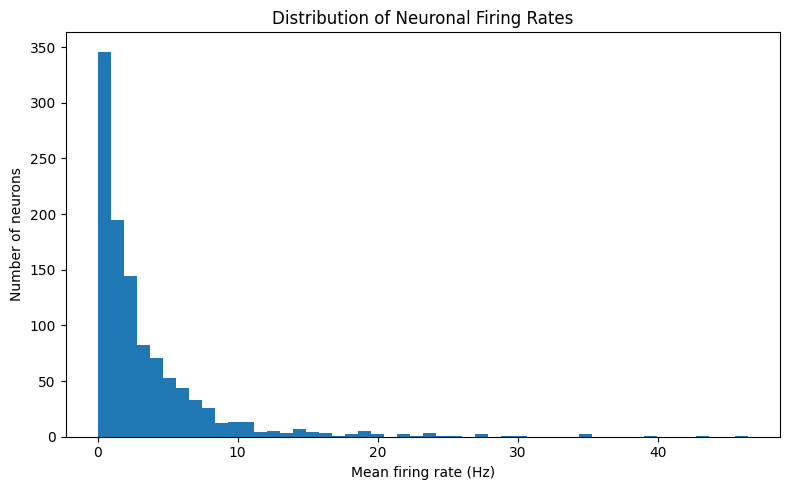

In [21]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))

plt.hist(
    firing_rates,
    bins=50
)

plt.xlabel("Mean firing rate (Hz)")
plt.ylabel("Number of neurons")
plt.title("Distribution of Neuronal Firing Rates")

plt.tight_layout()
plt.show()

**Step 12 — Check the trial data**

In [22]:
trial_files = [
    "trials.goCue_times.npy",
    "trials.response_choice.npy",
    "trials.response_times.npy",
    "trials.visualStim_times.npy",
    "trials.visualStim_contrastLeft.npy",
    "trials.visualStim_contrastRight.npy",
    "trials.feedbackType.npy",
]

trial_data = {}

for filename in trial_files:
    path = DATA_DIR / filename

    arr = np.load(path)

    # Convert (N, 1) arrays to 1-D
    arr = np.asarray(arr).squeeze()

    trial_data[filename] = arr

    print(f"{filename:45s} shape={arr.shape}")

trials.goCue_times.npy                        shape=(214,)
trials.response_choice.npy                    shape=(214,)
trials.response_times.npy                     shape=(214,)
trials.visualStim_times.npy                   shape=(214,)
trials.visualStim_contrastLeft.npy            shape=(214,)
trials.visualStim_contrastRight.npy           shape=(214,)
trials.feedbackType.npy                       shape=(214,)


**Step 13 — First population raster**

Spikes in 30-second window: 99,800


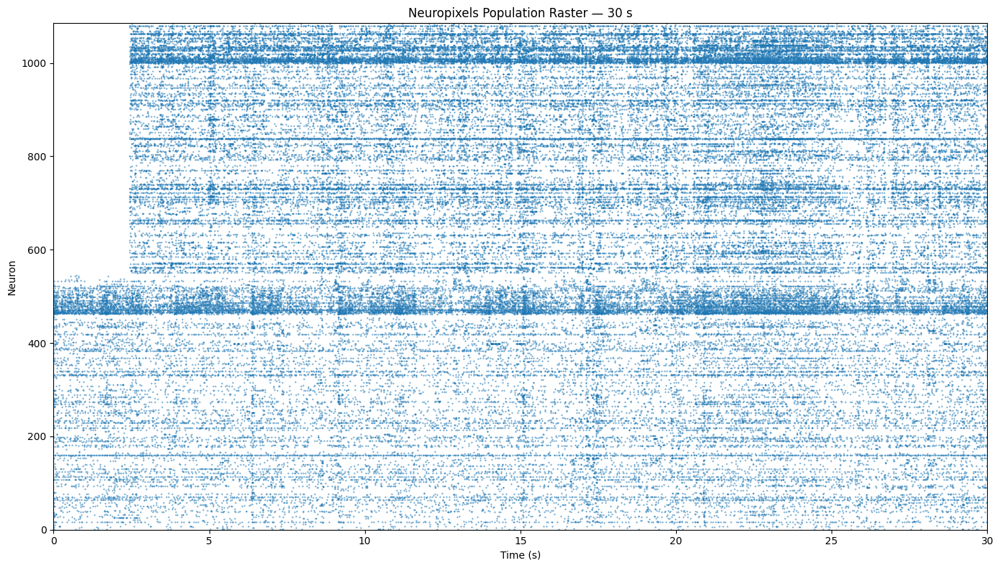

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Select a 30-second window
# ---------------------------------------------------------

t_start = spike_times_1d[0]
t_end = t_start + 30.0

mask = (
    (spike_times_1d >= t_start) &
    (spike_times_1d < t_end)
)

window_times = spike_times_1d[mask]
window_clusters = spike_clusters_1d[mask]

print(f"Spikes in 30-second window: {len(window_times):,}")

# Map cluster IDs to consecutive neuron indices
unique_neurons = np.unique(spike_clusters_1d)

cluster_to_index = {
    cluster: i
    for i, cluster in enumerate(unique_neurons)
}

window_neuron_idx = np.array(
    [cluster_to_index[c] for c in window_clusters],
    dtype=np.int32
)

# ---------------------------------------------------------
# Plot raster
# ---------------------------------------------------------

plt.figure(figsize=(14, 8))

plt.scatter(
    window_times - t_start,
    window_neuron_idx,
    s=0.15
)

plt.xlabel("Time (s)")
plt.ylabel("Neuron")
plt.title("Neuropixels Population Raster — 30 s")

plt.xlim(0, 30)
plt.ylim(0, len(unique_neurons))

plt.tight_layout()
plt.show()

**Step 14 — Create a principled analysis population**

In [24]:
MIN_RATE = 0.1  # Hz

analysis_neurons = firing_rates[
    firing_rates >= MIN_RATE
].index.to_numpy()

print(f"Original neurons: {len(unique_neurons)}")
print(f"Analysis neurons: {len(analysis_neurons)}")
print(
    f"Retained: "
    f"{100 * len(analysis_neurons) / len(unique_neurons):.1f}%"
)

Original neurons: 1085
Analysis neurons: 1052
Retained: 97.0%


In [25]:
analysis_rates = firing_rates.loc[analysis_neurons]

print(analysis_rates.describe())

count    1052.000000
mean        3.521162
std         4.816418
min         0.102122
25%         0.784881
50%         1.995271
75%         4.414758
max        46.370959
Name: count, dtype: float64


**Step 15 — Create the population matrix**

In [26]:
from scipy import sparse

BIN_SIZE = 0.020  # 20 ms

# Use only analysis neurons
selected_clusters = np.sort(analysis_neurons)

cluster_to_col = {
    cluster: i
    for i, cluster in enumerate(selected_clusters)
}

# Filter spikes to selected neurons
selected_mask = np.isin(
    spike_clusters_1d,
    selected_clusters
)

selected_times = spike_times_1d[selected_mask]
selected_clusters_spikes = spike_clusters_1d[selected_mask]

# Convert spike times to bin indices
time_indices = (
    (selected_times - spike_times_1d[0]) / BIN_SIZE
).astype(np.int32)

neuron_indices = np.array(
    [cluster_to_col[c] for c in selected_clusters_spikes],
    dtype=np.int32
)

n_time_bins = int(
    np.ceil(
        (spike_times_1d[-1] - spike_times_1d[0])
        / BIN_SIZE
    )
) + 1

n_neurons = len(selected_clusters)

# Sparse population matrix
X_sparse = sparse.coo_matrix(
    (
        np.ones(len(time_indices), dtype=np.float32),
        (time_indices, neuron_indices)
    ),
    shape=(n_time_bins, n_neurons),
    dtype=np.float32
).tocsr()

print("Population matrix:")
print("  shape:", X_sparse.shape)
print("  non-zero entries:", X_sparse.nnz)
print("  density:", X_sparse.nnz / np.prod(X_sparse.shape))

Population matrix:
  shape: (135133, 1052)
  non-zero entries: 8669515
  density: 0.060984243969305664


**Step 16 — Visualize the population matrix**

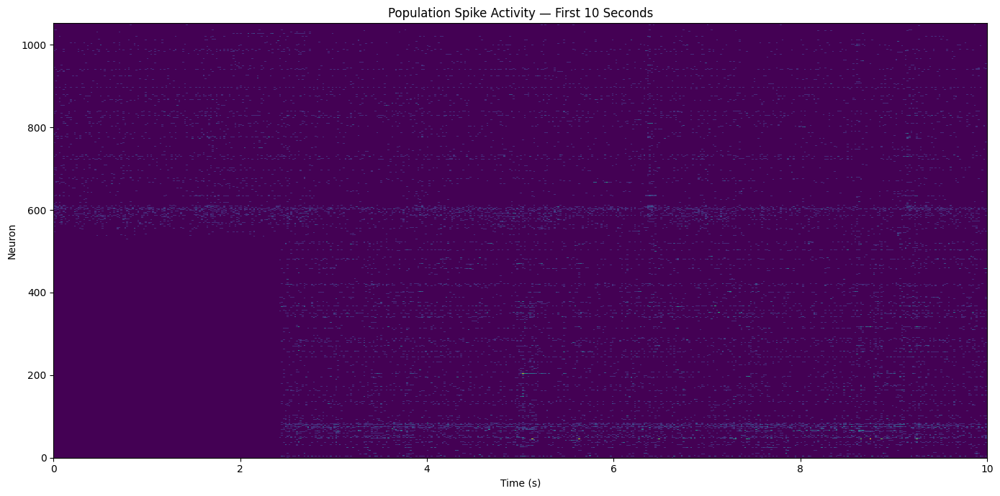

In [27]:
import matplotlib.pyplot as plt

display_seconds = 10

n_display_bins = int(
    display_seconds / BIN_SIZE
)

X_display = X_sparse[:n_display_bins].toarray()

plt.figure(figsize=(14, 7))

plt.imshow(
    X_display.T,
    aspect="auto",
    interpolation="nearest",
    extent=[0, display_seconds, 0, n_neurons]
)

plt.xlabel("Time (s)")
plt.ylabel("Neuron")
plt.title("Population Spike Activity — First 10 Seconds")

plt.tight_layout()
plt.show()

**STEP 17 — Validate the population matrix**

In [28]:
# ============================================================
# STEP 17 — Validate population matrix
# ============================================================

print("Population matrix validation")
print("=" * 50)

print(f"Shape:              {X_sparse.shape}")
print(f"Rows (time bins):    {X_sparse.shape[0]:,}")
print(f"Columns (neurons):   {X_sparse.shape[1]:,}")
print(f"Non-zero entries:    {X_sparse.nnz:,}")

density = X_sparse.nnz / np.prod(X_sparse.shape)

print(f"Density:             {density:.6%}")
print(f"Data type:           {X_sparse.dtype}")

# Check for invalid values
print("\nData integrity:")
print("NaN values:", np.isnan(X_sparse.data).sum())
print("Inf values:", np.isinf(X_sparse.data).sum())

print("\nExpected recording duration:")
print(f"{X_sparse.shape[0] * BIN_SIZE:.2f} seconds")
print(f"{X_sparse.shape[0] * BIN_SIZE / 60:.2f} minutes")

Population matrix validation
Shape:              (135133, 1052)
Rows (time bins):    135,133
Columns (neurons):   1,052
Non-zero entries:    8,669,515
Density:             6.098424%
Data type:           float32

Data integrity:
NaN values: 0
Inf values: 0

Expected recording duration:
2702.66 seconds
45.04 minutes


**STEP 18 — Create a PCA-ready neural representation**

**18.1 Create a reusable batch function**

In [29]:
# ============================================================
# STEP 18A — PCA preprocessing function
# ============================================================

import numpy as np

def get_dense_batch(X_sparse, start, end):
    """
    Convert one sparse population-matrix batch to dense float32.
    """

    X_batch = X_sparse[start:end].toarray().astype(
        np.float32,
        copy=False
    )

    return X_batch

**STEP 18.2 Estimate population statistics**

In [30]:
# ============================================================
# STEP 18B — Estimate neuron-wise statistics
# ============================================================

n_time, n_neurons = X_sparse.shape

BATCH_SIZE = 2048

sum_x = np.zeros(n_neurons, dtype=np.float64)
sum_x2 = np.zeros(n_neurons, dtype=np.float64)
n_total = 0

for start in range(0, n_time, BATCH_SIZE):

    end = min(start + BATCH_SIZE, n_time)

    X_batch = get_dense_batch(
        X_sparse,
        start,
        end
    )

    # Variance-stabilizing transform
    X_batch = np.sqrt(X_batch)

    sum_x += X_batch.sum(axis=0)
    sum_x2 += (X_batch ** 2).sum(axis=0)

    n_total += X_batch.shape[0]

    if start % (BATCH_SIZE * 20) == 0:
        print(
            f"Processed "
            f"{end:,}/{n_time:,} time bins"
        )

mean_neuron = sum_x / n_total

var_neuron = (
    sum_x2 / n_total
    - mean_neuron ** 2
)

std_neuron = np.sqrt(
    np.maximum(var_neuron, 1e-8)
)

print("\nStatistics calculated.")
print("Mean shape:", mean_neuron.shape)
print("STD shape:", std_neuron.shape)

Processed 2,048/135,133 time bins
Processed 43,008/135,133 time bins
Processed 83,968/135,133 time bins
Processed 124,928/135,133 time bins

Statistics calculated.
Mean shape: (1052,)
STD shape: (1052,)


**STEP 18.3 — Check the standardized activity**

In [31]:
print("Mean firing representation:")
print(
    f"Mean:   {mean_neuron.mean():.4f}"
)

print(
    f"Median: {np.median(mean_neuron):.4f}"
)

print("\nNeuron standard deviations:")
print(
    f"Mean:   {std_neuron.mean():.4f}"
)

print(
    f"Median: {np.median(std_neuron):.4f}"
)

Mean firing representation:
Mean:   0.0646
Median: 0.0375

Neuron standard deviations:
Mean:   0.2142
Median: 0.1961


**STEP 18.4 — PCA with IncrementalPCA**

In [32]:
# ============================================================
# STEP 19 — Incremental PCA
# ============================================================

from sklearn.decomposition import IncrementalPCA

N_COMPONENTS = 20

ipca = IncrementalPCA(
    n_components=N_COMPONENTS,
    batch_size=BATCH_SIZE
)

print("Fitting PCA...")

for start in range(0, n_time, BATCH_SIZE):

    end = min(start + BATCH_SIZE, n_time)

    X_batch = get_dense_batch(
        X_sparse,
        start,
        end
    )

    # Variance stabilization
    X_batch = np.sqrt(X_batch)

    # Standardize neurons
    X_batch = (
        X_batch - mean_neuron
    ) / std_neuron

    ipca.partial_fit(X_batch)

    if start % (BATCH_SIZE * 20) == 0:
        print(
            f"Fitted "
            f"{end:,}/{n_time:,} bins"
        )

print("\nPCA fitting complete.")

Fitting PCA...
Fitted 2,048/135,133 bins
Fitted 43,008/135,133 bins
Fitted 83,968/135,133 bins
Fitted 124,928/135,133 bins

PCA fitting complete.


**STEP 19 — Explained variance**

In [33]:
# ============================================================
# STEP 19A — Explained variance
# ============================================================

explained_variance = ipca.explained_variance_ratio_

cumulative_variance = np.cumsum(
    explained_variance
)

for i, (individual, cumulative) in enumerate(
    zip(explained_variance, cumulative_variance),
    start=1
):
    print(
        f"PC{i:02d}: "
        f"{individual:.4%} individual | "
        f"{cumulative:.4%} cumulative"
    )

PC01: 1.4372% individual | 1.4372% cumulative
PC02: 1.3069% individual | 2.7441% cumulative
PC03: 0.9241% individual | 3.6682% cumulative
PC04: 0.6690% individual | 4.3371% cumulative
PC05: 0.6169% individual | 4.9540% cumulative
PC06: 0.4950% individual | 5.4490% cumulative
PC07: 0.4106% individual | 5.8596% cumulative
PC08: 0.3343% individual | 6.1939% cumulative
PC09: 0.2232% individual | 6.4172% cumulative
PC10: 0.1948% individual | 6.6120% cumulative
PC11: 0.1889% individual | 6.8009% cumulative
PC12: 0.1859% individual | 6.9868% cumulative
PC13: 0.1546% individual | 7.1414% cumulative
PC14: 0.1333% individual | 7.2747% cumulative
PC15: 0.1236% individual | 7.3983% cumulative
PC16: 0.1145% individual | 7.5129% cumulative
PC17: 0.1002% individual | 7.6131% cumulative
PC18: 0.0964% individual | 7.7095% cumulative
PC19: 0.0950% individual | 7.8045% cumulative
PC20: 0.0928% individual | 7.8973% cumulative


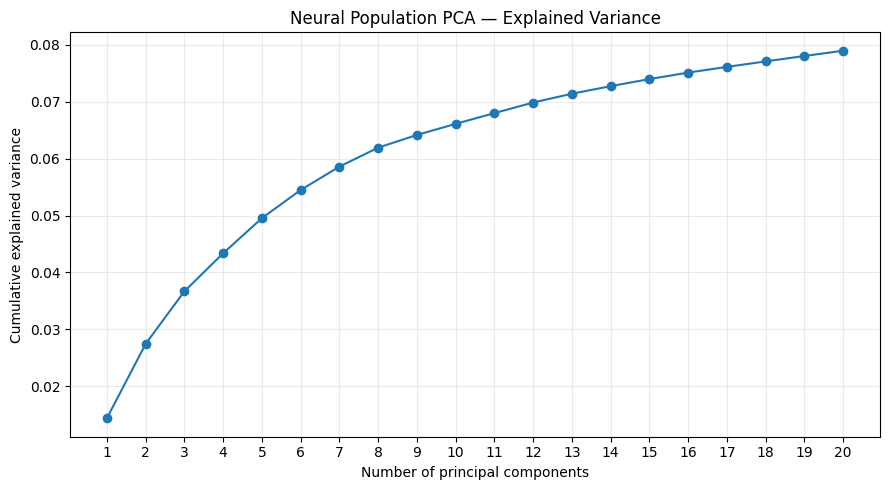

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(9, 5))

components = np.arange(
    1,
    N_COMPONENTS + 1
)

plt.plot(
    components,
    cumulative_variance,
    marker="o"
)

plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.title("Neural Population PCA — Explained Variance")

plt.xticks(components)
plt.grid(alpha=0.25)

plt.tight_layout()
plt.show()

**STEP 19B — Save the PCA model**

In [35]:
import joblib

RESULTS_DIR = PROJECT_DIR / "results"
MODELS_DIR = RESULTS_DIR / "models"

RESULTS_DIR.mkdir(parents=True, exist_ok=True)
MODELS_DIR.mkdir(parents=True, exist_ok=True)

joblib.dump(
    ipca,
    MODELS_DIR / "population_pca.pkl"
)

np.save(
    RESULTS_DIR / "pca_explained_variance.npy",
    explained_variance
)

print("PCA model saved.")

PCA model saved.


**STEP 20 — Project the entire population into PC space**

In [36]:
# ============================================================
# STEP 20 — Project population activity into PC space
# ============================================================

PC_scores = np.zeros(
    (n_time, N_COMPONENTS),
    dtype=np.float32
)

print("Projecting neural population...")

for start in range(0, n_time, BATCH_SIZE):

    end = min(start + BATCH_SIZE, n_time)

    X_batch = get_dense_batch(
        X_sparse,
        start,
        end
    )

    # Same preprocessing used during PCA
    X_batch = np.sqrt(X_batch)

    X_batch = (
        X_batch - mean_neuron
    ) / std_neuron

    PC_scores[start:end] = ipca.transform(
        X_batch
    ).astype(np.float32)

    if start % (BATCH_SIZE * 20) == 0:
        print(
            f"Projected "
            f"{end:,}/{n_time:,} bins"
        )

print("\nProjection complete.")
print("PC score matrix:", PC_scores.shape)

Projecting neural population...
Projected 2,048/135,133 bins
Projected 43,008/135,133 bins
Projected 83,968/135,133 bins
Projected 124,928/135,133 bins

Projection complete.
PC score matrix: (135133, 20)


**STEP 20B — Save the PC representation**

In [37]:
np.save(
    RESULTS_DIR / "PC_scores.npy",
    PC_scores
)

np.save(
    RESULTS_DIR / "pca_mean.npy",
    mean_neuron
)

np.save(
    RESULTS_DIR / "pca_std.npy",
    std_neuron
)

print("PC representation saved.")

PC representation saved.


**STEP 21 — First neural state-space trajectory**

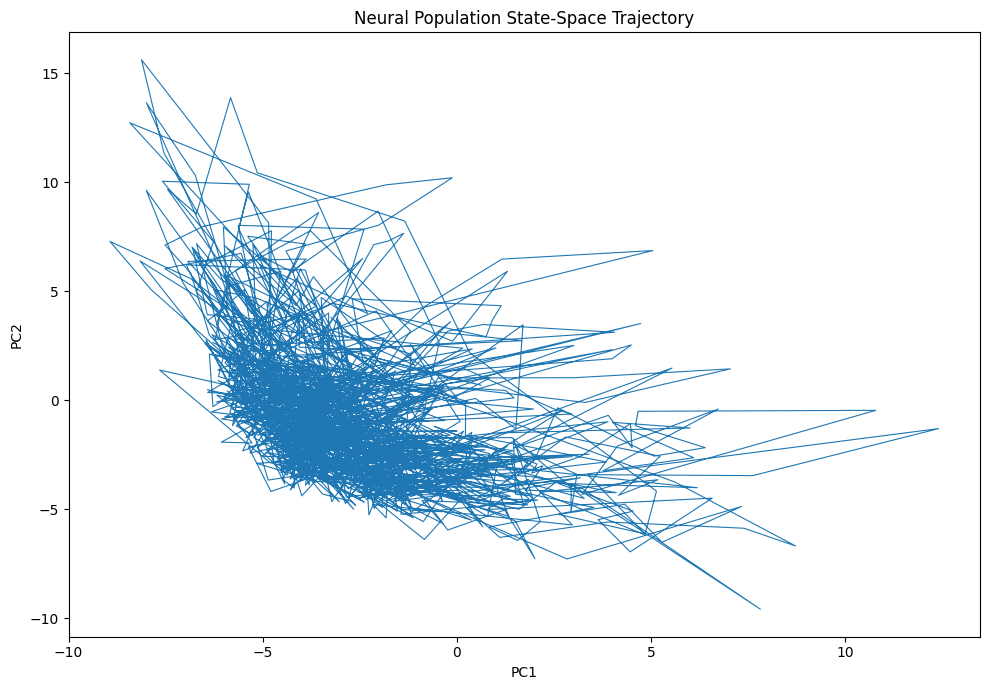

In [38]:
# ============================================================
# STEP 21 — Neural state-space trajectory
# ============================================================

display_seconds = 30

n_display = int(
    display_seconds / BIN_SIZE
)

time_axis = (
    np.arange(n_display)
    * BIN_SIZE
)

pc_display = PC_scores[:n_display]

plt.figure(figsize=(10, 7))

plt.plot(
    pc_display[:, 0],
    pc_display[:, 1],
    linewidth=0.8
)

plt.xlabel("PC1")
plt.ylabel("PC2")

plt.title(
    "Neural Population State-Space Trajectory"
)

plt.tight_layout()
plt.show()

**STEP 21B — Color the trajectory by time**

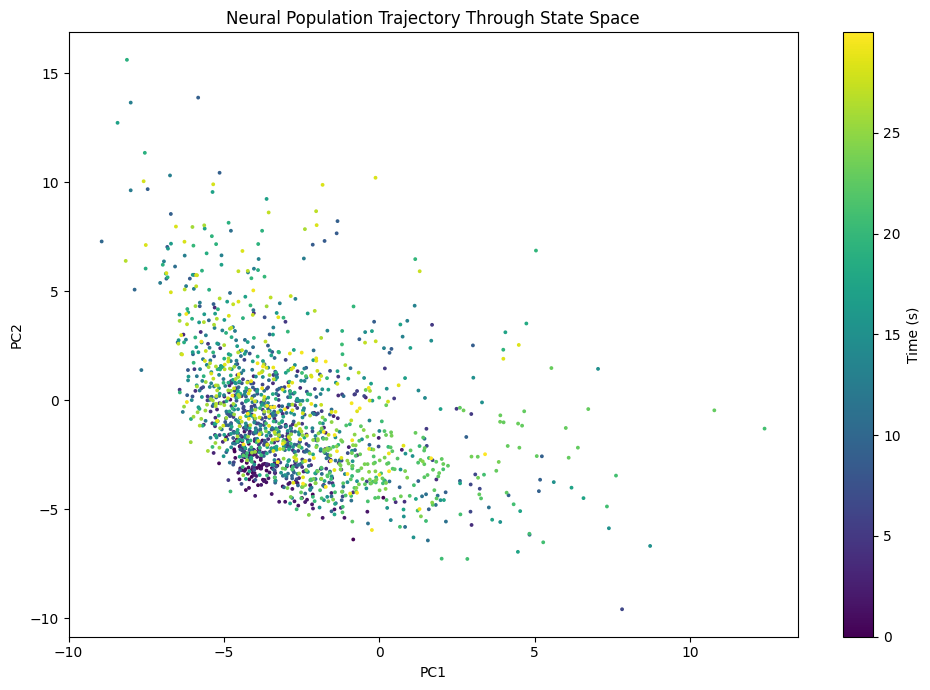

In [39]:
plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    pc_display[:, 0],
    pc_display[:, 1],
    c=time_axis,
    s=3
)

plt.xlabel("PC1")
plt.ylabel("PC2")

plt.title(
    "Neural Population Trajectory Through State Space"
)

plt.colorbar(
    scatter,
    label="Time (s)"
)

plt.tight_layout()
plt.show()

**STEP 22 — 3D neural state space**

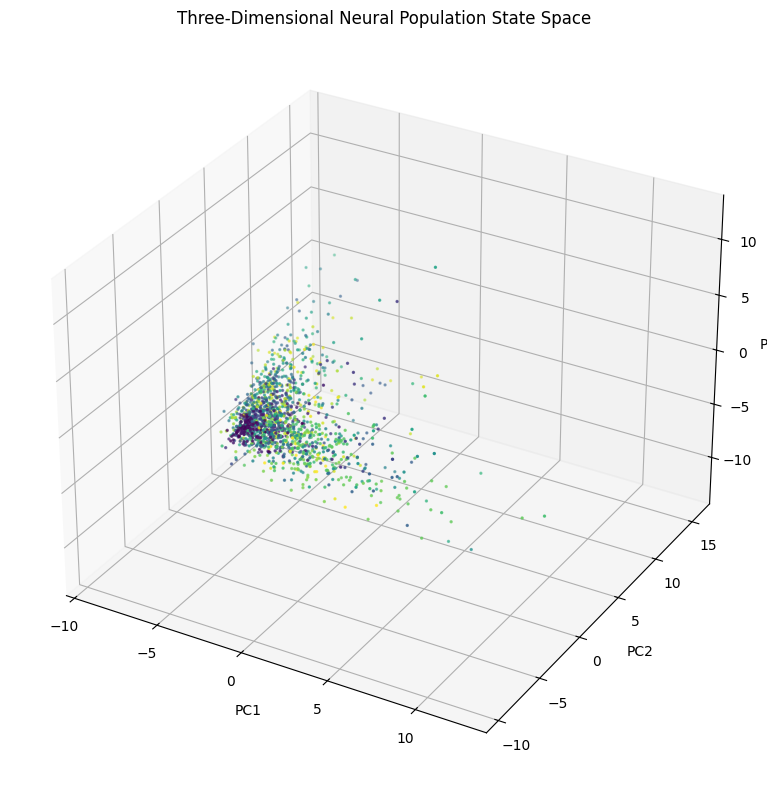

In [40]:
# ============================================================
# STEP 22 — 3D neural state space
# ============================================================

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))

ax = fig.add_subplot(
    111,
    projection="3d"
)

ax.scatter(
    pc_display[:, 0],
    pc_display[:, 1],
    pc_display[:, 2],
    c=time_axis,
    s=2
)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

ax.set_title(
    "Three-Dimensional Neural Population State Space"
)

plt.tight_layout()
plt.show()

**STEP 23 — Now connect neural dynamics to behavior**

In [41]:
# ============================================================
# STEP 23A — Inspect trial variables
# ============================================================

visual_times = trial_data[
    "trials.visualStim_times.npy"
]

choices = trial_data[
    "trials.response_choice.npy"
]

feedback = trial_data[
    "trials.feedbackType.npy"
]

go_cue = trial_data[
    "trials.goCue_times.npy"
]

print("Visual stimulus times:")
print(visual_times[:10])

print("\nResponse choices:")
print(np.unique(choices, return_counts=True))

print("\nFeedback:")
print(np.unique(feedback, return_counts=True))

Visual stimulus times:
[ 65.26940832  71.20270292  76.05238024  81.23526288  86.80095162
  90.65061299  95.98429803  99.5507549  105.56645081 111.06693851]

Response choices:
(array([-1.,  0.,  1.]), array([69, 74, 71]))

Feedback:
(array([-1.,  1.]), array([ 73, 141]))


**STEP 23B — Convert trial times into PC indices**

In [42]:
recording_start = spike_times_1d[0]

trial_indices = (
    (visual_times - recording_start)
    / BIN_SIZE
).astype(int)

print("Trial indices:")
print(trial_indices[:10])

Trial indices:
[3263 3559 3802 4061 4339 4532 4799 4977 5278 5553]


**STEP 24 — Create trial-aligned neural trajectories**

In [43]:
# ============================================================
# STEP 24 — Trial-aligned population trajectories
# ============================================================

PRE_TIME = 1.0
POST_TIME = 2.0

pre_bins = int(PRE_TIME / BIN_SIZE)
post_bins = int(POST_TIME / BIN_SIZE)

window_bins = np.arange(
    -pre_bins,
    post_bins
)

relative_time = (
    window_bins * BIN_SIZE
)

valid_trials = []

for trial_idx in trial_indices:

    start = trial_idx - pre_bins
    end = trial_idx + post_bins

    if start >= 0 and end < len(PC_scores):
        valid_trials.append(trial_idx)

valid_trials = np.array(valid_trials)

print(
    f"Valid stimulus-aligned trials: "
    f"{len(valid_trials)} / {len(trial_indices)}"
)

Valid stimulus-aligned trials: 214 / 214


In [44]:
aligned_PC = np.stack([
    PC_scores[
        trial_idx - pre_bins:
        trial_idx + post_bins,
        :
    ]
    for trial_idx in valid_trials
])

print("Aligned PC array:")
print(aligned_PC.shape)

Aligned PC array:
(214, 150, 20)


**STEP 25 — Average neural trajectory across trials**

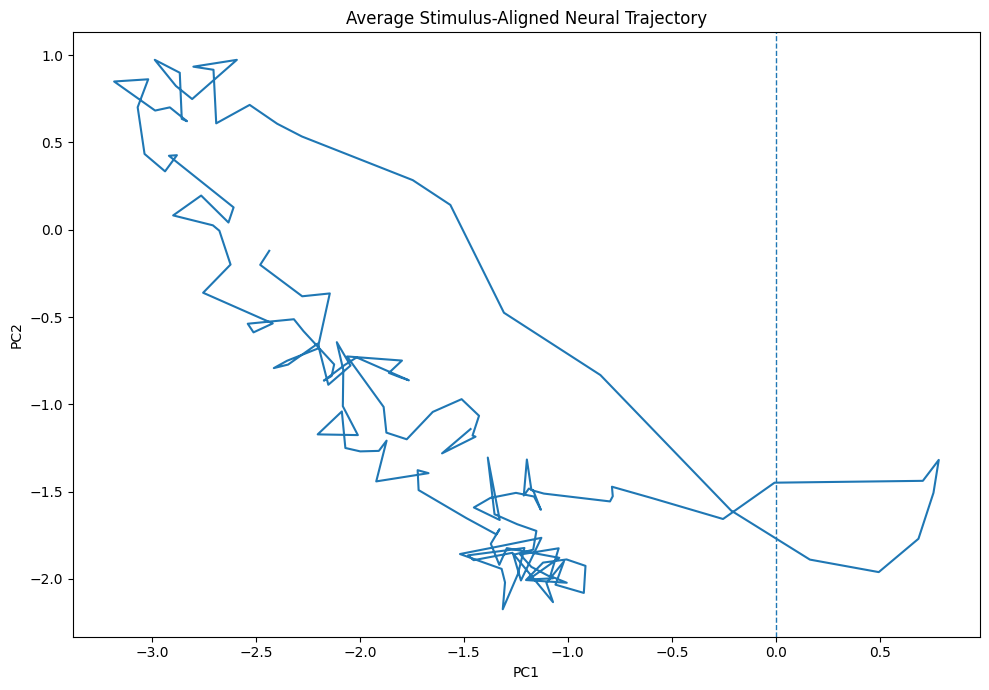

In [45]:
mean_trajectory = aligned_PC.mean(
    axis=0
)

plt.figure(figsize=(10, 7))

plt.plot(
    mean_trajectory[:, 0],
    mean_trajectory[:, 1]
)

plt.xlabel("PC1")
plt.ylabel("PC2")

plt.title(
    "Average Stimulus-Aligned Neural Trajectory"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.tight_layout()
plt.show()

**STEP 26 — Separate trials by choice**

**Step 26A — Inspect the choice distribution**

In [46]:
# Inspect choice distribution
unique_choices, choice_counts = np.unique(
    choices,
    return_counts=True
)

for choice, count in zip(unique_choices, choice_counts):
    print(f"Choice {choice}: {count} trials")

Choice -1.0: 69 trials
Choice 0.0: 74 trials
Choice 1.0: 71 trials


**Step 26B — Use only valid choices**

In [47]:
# ============================================================
# STEP 26B — Select valid behavioral choices
# ============================================================

# Valid choices for binary choice analysis
VALID_CHOICES = [-1, 1]

# Identify trials belonging to either valid choice
valid_choice_mask = np.isin(
    choices,
    VALID_CHOICES
)

# Indices of valid choice trials
valid_choice_indices = np.where(
    valid_choice_mask
)[0]

# Individual choice trial indices
choice_minus1_trials = np.where(
    choices == -1
)[0]

choice_plus1_trials = np.where(
    choices == 1
)[0]

# Trials with choice == 0
choice_zero_trials = np.where(
    choices == 0
)[0]

# ------------------------------------------------------------
# Summary
# ------------------------------------------------------------

print("Choice distribution")
print("=" * 40)

print(
    f"Choice -1 trials: "
    f"{len(choice_minus1_trials)}"
)

print(
    f"Choice +1 trials: "
    f"{len(choice_plus1_trials)}"
)

print(
    f"Choice 0 trials:  "
    f"{len(choice_zero_trials)}"
)

print(
    f"\nValid choice trials: "
    f"{len(valid_choice_indices)}"
)

print(
    f"Excluded trials: "
    f"{len(choice_zero_trials)}"
)

Choice distribution
Choice -1 trials: 69
Choice +1 trials: 71
Choice 0 trials:  74

Valid choice trials: 140
Excluded trials: 74


**Step 26C — Create the correct trial mapping**

In [48]:
# ============================================================
# STEP 26C — Robust original-trial → aligned-trial mapping
# ============================================================

# Find which original trials produced valid trajectories
valid_original_trial_indices = []

for original_trial_idx, trial_bin in enumerate(trial_indices):

    if trial_bin in set(valid_trials):
        valid_original_trial_indices.append(
            original_trial_idx
        )

valid_original_trial_indices = np.array(
    valid_original_trial_indices,
    dtype=int
)

# Mapping:
# original trial index -> aligned_PC row
trial_to_aligned = {
    original_trial_idx: aligned_idx
    for aligned_idx, original_trial_idx
    in enumerate(valid_original_trial_indices)
}

print(
    "Original trials:",
    len(trial_indices)
)

print(
    "Valid aligned trials:",
    len(valid_original_trial_indices)
)

print(
    "Aligned PC trajectories:",
    aligned_PC.shape[0]
)

Original trials: 214
Valid aligned trials: 214
Aligned PC trajectories: 214


**Then identify valid −1 and +1 trials**

In [49]:
# ============================================================
# STEP 26D — Choice-specific aligned trials
# ============================================================

minus1_aligned_indices = [
    trial_to_aligned[i]
    for i in choice_minus1_trials
    if i in trial_to_aligned
]

plus1_aligned_indices = [
    trial_to_aligned[i]
    for i in choice_plus1_trials
    if i in trial_to_aligned
]

minus1_aligned_indices = np.array(
    minus1_aligned_indices,
    dtype=int
)

plus1_aligned_indices = np.array(
    plus1_aligned_indices,
    dtype=int
)

print(
    "Choice -1 aligned trials:",
    len(minus1_aligned_indices)
)

print(
    "Choice +1 aligned trials:",
    len(plus1_aligned_indices)
)

Choice -1 aligned trials: 69
Choice +1 aligned trials: 71


**STEP 27 — Compare Choice −1 vs Choice +1 neural trajectories**

**Step 27A — Extract the two choice populations**

In [50]:
# ============================================================
# STEP 27A — Extract choice-specific neural trajectories
# ============================================================

PC_choice_minus1 = aligned_PC[
    minus1_aligned_indices
]

PC_choice_plus1 = aligned_PC[
    plus1_aligned_indices
]

print("Choice -1 trajectory shape:")
print(PC_choice_minus1.shape)

print("\nChoice +1 trajectory shape:")
print(PC_choice_plus1.shape)

Choice -1 trajectory shape:
(69, 150, 20)

Choice +1 trajectory shape:
(71, 150, 20)


**Step 27B — Baseline-correct the trajectories**

In [51]:
# ============================================================
# STEP 27B — Baseline correction
# ============================================================

baseline_mask = relative_time < 0

print(
    "Baseline time points:",
    baseline_mask.sum()
)

# Baseline state for each trial
baseline_minus1 = PC_choice_minus1[
    :, baseline_mask, :
].mean(axis=1)

baseline_plus1 = PC_choice_plus1[
    :, baseline_mask, :
].mean(axis=1)

# Subtract each trial's own baseline
PC_choice_minus1_bc = (
    PC_choice_minus1
    - baseline_minus1[:, None, :]
)

PC_choice_plus1_bc = (
    PC_choice_plus1
    - baseline_plus1[:, None, :]
)

print(
    "Baseline-corrected -1:",
    PC_choice_minus1_bc.shape
)

print(
    "Baseline-corrected +1:",
    PC_choice_plus1_bc.shape
)

Baseline time points: 50
Baseline-corrected -1: (69, 150, 20)
Baseline-corrected +1: (71, 150, 20)


**STEP 27C — Calculate mean trajectories**

In [52]:
# ============================================================
# STEP 27C — Mean choice-specific trajectories
# ============================================================

mean_minus1 = PC_choice_minus1_bc.mean(axis=0)
mean_plus1 = PC_choice_plus1_bc.mean(axis=0)

print("Mean trajectory shape:")
print(mean_minus1.shape)

Mean trajectory shape:
(150, 20)


**STEP 27D — Plot PC1 vs PC2**

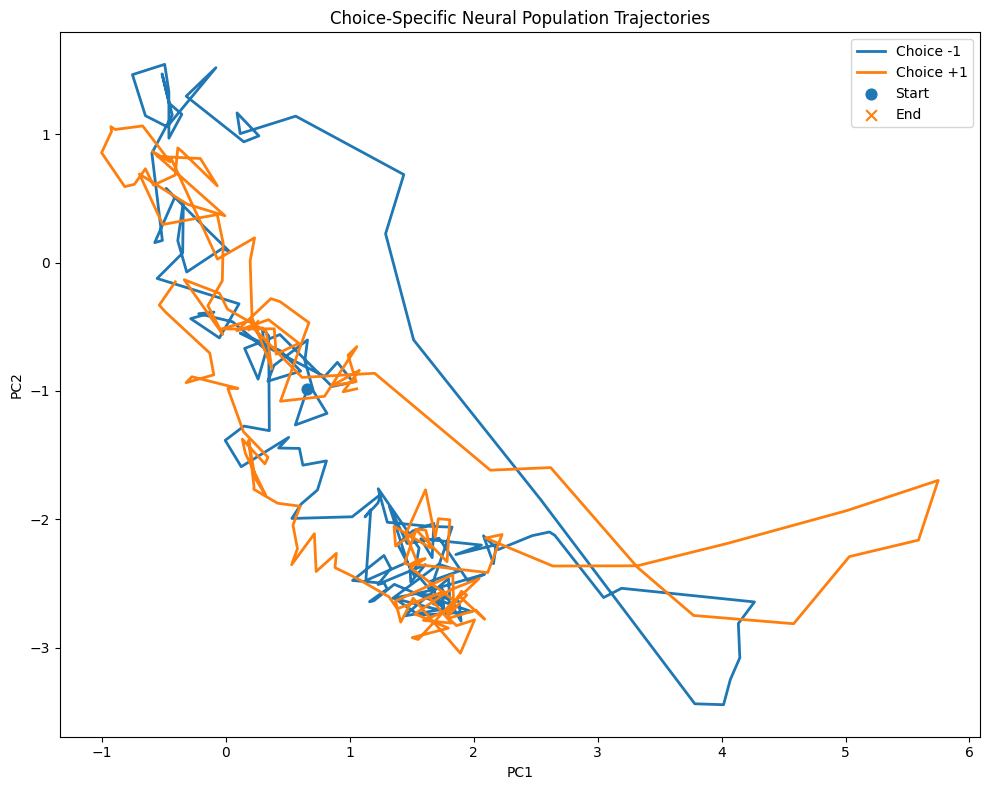

In [53]:
import matplotlib.pyplot as plt

# ============================================================
# STEP 27D — Choice-specific PCA trajectories
# ============================================================

plt.figure(figsize=(10, 8))

plt.plot(
    mean_minus1[:, 0],
    mean_minus1[:, 1],
    linewidth=2,
    label="Choice -1"
)

plt.plot(
    mean_plus1[:, 0],
    mean_plus1[:, 1],
    linewidth=2,
    label="Choice +1"
)

# Mark stimulus onset
plt.scatter(
    mean_minus1[0, 0],
    mean_minus1[0, 1],
    s=60,
    marker="o",
    label="Start"
)

plt.scatter(
    mean_minus1[-1, 0],
    mean_minus1[-1, 1],
    s=60,
    marker="x",
    label="End"
)

plt.xlabel("PC1")
plt.ylabel("PC2")

plt.title(
    "Choice-Specific Neural Population Trajectories"
)

plt.legend()

plt.tight_layout()
plt.show()

**STEP 27E — Plot PC1 and PC2 over time**

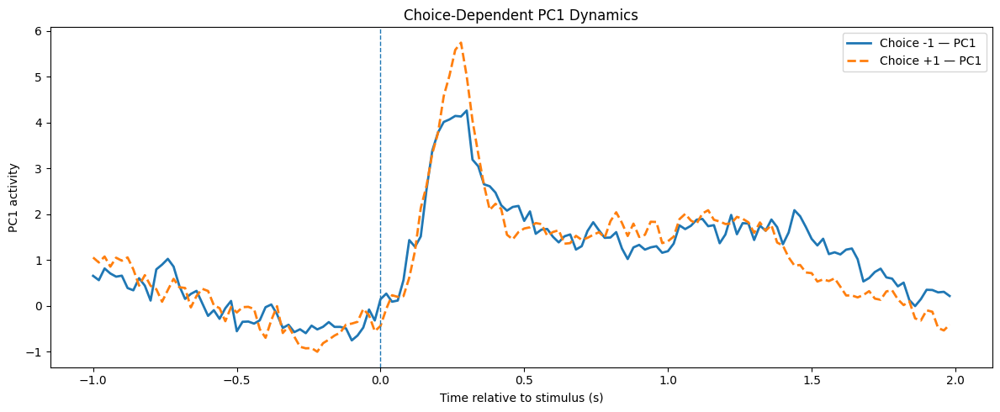

In [54]:
# ============================================================
# STEP 27E — PC dynamics over time
# ============================================================

fig, ax = plt.subplots(
    figsize=(12, 5)
)

ax.plot(
    relative_time,
    mean_minus1[:, 0],
    linewidth=2,
    label="Choice -1 — PC1"
)

ax.plot(
    relative_time,
    mean_plus1[:, 0],
    linewidth=2,
    linestyle="--",
    label="Choice +1 — PC1"
)

ax.axvline(
    0,
    linestyle="--",
    linewidth=1
)

ax.set_xlabel("Time relative to stimulus (s)")
ax.set_ylabel("PC1 activity")

ax.set_title(
    "Choice-Dependent PC1 Dynamics"
)

ax.legend()

plt.tight_layout()
plt.show()

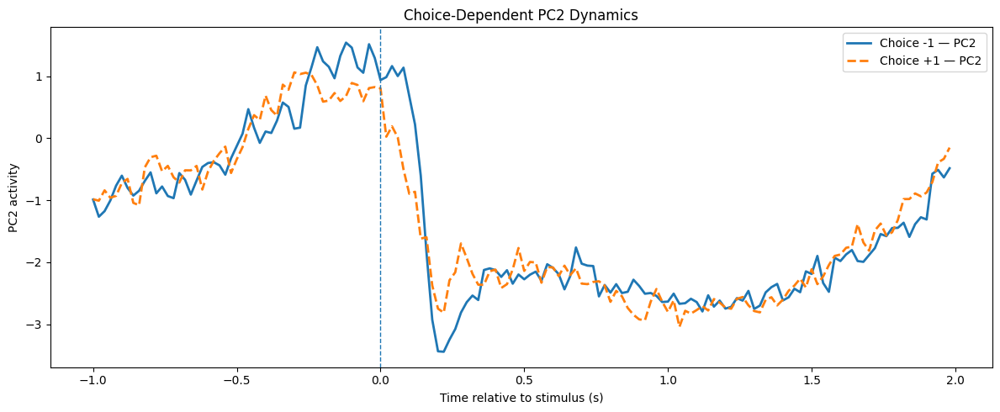

In [55]:
plt.figure(figsize=(12, 5))

plt.plot(
    relative_time,
    mean_minus1[:, 1],
    linewidth=2,
    label="Choice -1 — PC2"
)

plt.plot(
    relative_time,
    mean_plus1[:, 1],
    linewidth=2,
    linestyle="--",
    label="Choice +1 — PC2"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel("Time relative to stimulus (s)")
plt.ylabel("PC2 activity")

plt.title(
    "Choice-Dependent PC2 Dynamics"
)

plt.legend()

plt.tight_layout()
plt.show()

**STEP 28 — Quantify trajectory separation**

In [56]:
# ============================================================
# STEP 28 — Population trajectory separation
# ============================================================

trajectory_distance = np.linalg.norm(
    mean_minus1 - mean_plus1,
    axis=1
)

print(
    "Maximum trajectory separation:",
    trajectory_distance.max()
)

max_idx = np.argmax(
    trajectory_distance
)

print(
    "Maximum separation time:",
    relative_time[max_idx],
    "seconds"
)

Maximum trajectory separation: 2.6986263
Maximum separation time: 0.28 seconds


**Step 28B — Plot the separation**

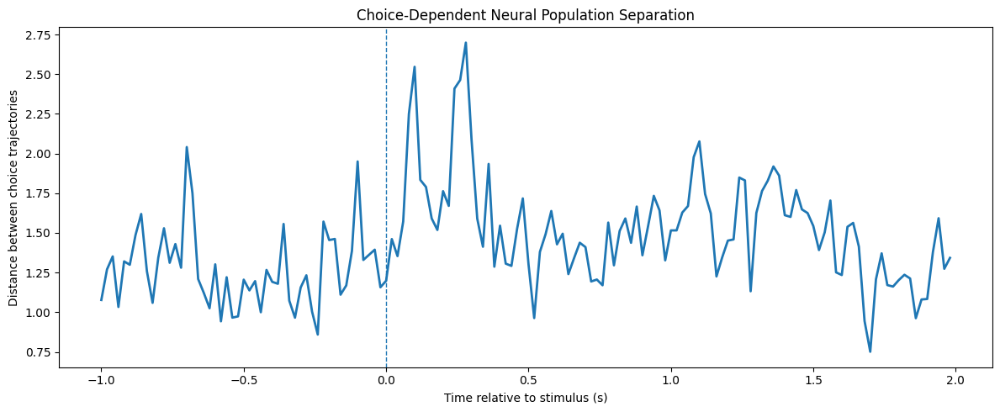

In [57]:
plt.figure(figsize=(12, 5))

plt.plot(
    relative_time,
    trajectory_distance,
    linewidth=2
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel("Time relative to stimulus (s)")
plt.ylabel("Distance between choice trajectories")

plt.title(
    "Choice-Dependent Neural Population Separation"
)

plt.tight_layout()
plt.show()

**STEP 28C — Compare pre- vs post-stimulus separation**

In [58]:
# ============================================================
# STEP 28C — Pre/post stimulus separation
# ============================================================

pre_mask = (
    (relative_time >= -1.0) &
    (relative_time < 0)
)

early_post_mask = (
    (relative_time >= 0) &
    (relative_time < 0.5)
)

late_post_mask = (
    (relative_time >= 0.5) &
    (relative_time < 1.5)
)

print("Mean trajectory separation:")
print(
    f"Pre-stimulus:       "
    f"{trajectory_distance[pre_mask].mean():.4f}"
)

print(
    f"0–0.5 s:            "
    f"{trajectory_distance[early_post_mask].mean():.4f}"
)

print(
    f"0.5–1.5 s:          "
    f"{trajectory_distance[late_post_mask].mean():.4f}"
)

Mean trajectory separation:
Pre-stimulus:       1.2717
0–0.5 s:            1.7525
0.5–1.5 s:          1.5332


**Step 29A — Prepare the valid binary-choice trials**

In [59]:
# ============================================================
# STEP 29A — Prepare binary-choice population
# ============================================================

# Combine the two valid choice groups
binary_trial_indices = np.concatenate([
    minus1_aligned_indices,
    plus1_aligned_indices
])

binary_labels = np.concatenate([
    np.full(len(minus1_aligned_indices), -1),
    np.full(len(plus1_aligned_indices), 1)
])

# Extract only the binary-choice trials
binary_PC = aligned_PC[
    binary_trial_indices
]

print("Binary-choice population:")
print("Shape:", binary_PC.shape)

print(
    "Choice -1:",
    np.sum(binary_labels == -1)
)

print(
    "Choice +1:",
    np.sum(binary_labels == 1)
)

Binary-choice population:
Shape: (140, 150, 20)
Choice -1: 69
Choice +1: 71


**STEP 29B — Baseline-correct the binary population**

In [60]:
# ============================================================
# STEP 29B — Baseline correction
# ============================================================

binary_baseline = binary_PC[
    :, baseline_mask, :
].mean(axis=1)

binary_PC_bc = (
    binary_PC
    - binary_baseline[:, None, :]
)

print(
    "Baseline-corrected shape:",
    binary_PC_bc.shape
)

Baseline-corrected shape: (140, 150, 20)


**STEP 29C — Recalculate the observed choice separation**

In [61]:
# ============================================================
# STEP 29C — Observed choice separation
# ============================================================

minus1_mask = binary_labels == -1
plus1_mask = binary_labels == 1

mean_minus1_binary = binary_PC_bc[
    minus1_mask
].mean(axis=0)

mean_plus1_binary = binary_PC_bc[
    plus1_mask
].mean(axis=0)

observed_distance = np.linalg.norm(
    mean_minus1_binary -
    mean_plus1_binary,
    axis=1
)

print(
    "Observed distance shape:",
    observed_distance.shape
)

print(
    "Maximum observed separation:",
    observed_distance.max()
)

max_idx = np.argmax(observed_distance)

print(
    "Maximum separation time:",
    relative_time[max_idx],
    "seconds"
)

Observed distance shape: (150,)
Maximum observed separation: 2.6986263
Maximum separation time: 0.28 seconds


**STEP 29D — Permutation test**

In [62]:
# ============================================================
# STEP 29D — Permutation test
# ============================================================

N_PERMUTATIONS = 500

rng = np.random.default_rng(42)

permutation_distances = np.zeros(
    (N_PERMUTATIONS, len(relative_time)),
    dtype=np.float32
)

print(
    f"Running {N_PERMUTATIONS} permutations..."
)

for perm in range(N_PERMUTATIONS):

    shuffled_labels = rng.permutation(
        binary_labels
    )

    shuffled_minus1 = binary_PC_bc[
        shuffled_labels == -1
    ].mean(axis=0)

    shuffled_plus1 = binary_PC_bc[
        shuffled_labels == 1
    ].mean(axis=0)

    permutation_distances[perm] = np.linalg.norm(
        shuffled_minus1 -
        shuffled_plus1,
        axis=1
    )

    if (perm + 1) % 100 == 0:
        print(
            f"Completed "
            f"{perm + 1}/{N_PERMUTATIONS}"
        )

print("Permutation test complete.")

Running 500 permutations...
Completed 100/500
Completed 200/500
Completed 300/500
Completed 400/500
Completed 500/500
Permutation test complete.


**STEP 29E — Calculate the 95% null envelope**

In [63]:
# ============================================================
# STEP 29E — Permutation null distribution
# ============================================================

null_lower = np.percentile(
    permutation_distances,
    2.5,
    axis=0
)

null_upper = np.percentile(
    permutation_distances,
    97.5,
    axis=0
)

null_mean = permutation_distances.mean(
    axis=0
)

print("Null distribution calculated.")

Null distribution calculated.


**STEP 29F — Plot observed vs shuffled separation**

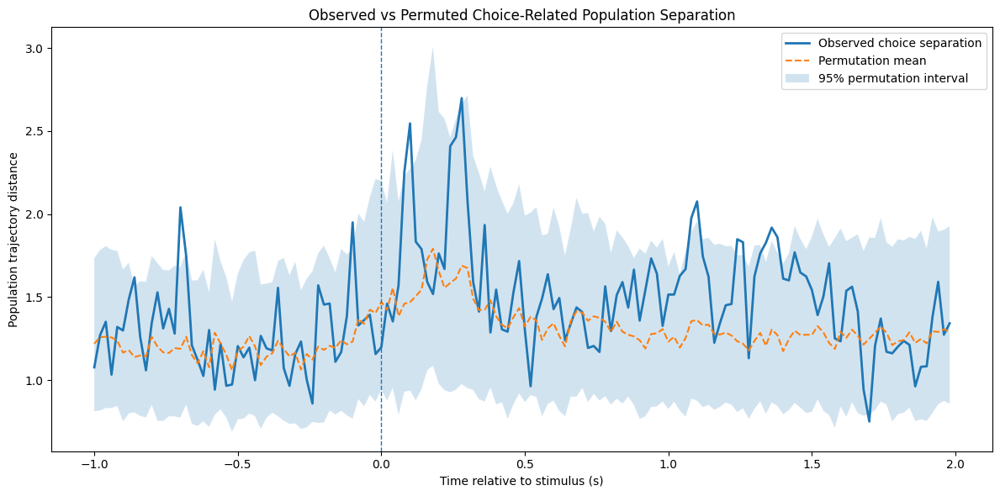

In [64]:
# ============================================================
# STEP 29F — Observed vs null trajectory separation
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    observed_distance,
    linewidth=2,
    label="Observed choice separation"
)

plt.plot(
    relative_time,
    null_mean,
    linewidth=1.5,
    linestyle="--",
    label="Permutation mean"
)

plt.fill_between(
    relative_time,
    null_lower,
    null_upper,
    alpha=0.2,
    label="95% permutation interval"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Population trajectory distance"
)

plt.title(
    "Observed vs Permuted Choice-Related Population Separation"
)

plt.legend()

plt.tight_layout()
plt.show()

**STEP 29G — Calculate an empirical p-value over time**

In [65]:
# ============================================================
# STEP 29G — Empirical permutation p-values
# ============================================================

p_values = (
    1 +
    np.sum(
        permutation_distances
        >= observed_distance[None, :],
        axis=0
    )
) / (
    N_PERMUTATIONS + 1
)

print(
    "Minimum empirical p-value:",
    p_values.min()
)

min_p_idx = np.argmin(p_values)

print(
    "Minimum p-value time:",
    relative_time[min_p_idx],
    "seconds"
)

Minimum empirical p-value: 0.003992015968063872
Minimum p-value time: -0.7000000000000001 seconds


**STEP 29H — Multiple-comparison correction**

In [66]:
# ============================================================
# STEP 29H — FDR correction
# ============================================================

from statsmodels.stats.multitest import multipletests

reject, p_corrected, _, _ = multipletests(
    p_values,
    alpha=0.05,
    method="fdr_bh"
)

print(
    "Significant time bins after FDR:",
    reject.sum()
)

if reject.any():

    significant_times = relative_time[
        reject
    ]

    print(
        "First significant time:",
        significant_times[0],
        "seconds"
    )

    print(
        "Last significant time:",
        significant_times[-1],
        "seconds"
    )

else:

    print(
        "No time bins survived FDR correction."
    )

Significant time bins after FDR: 0
No time bins survived FDR correction.


**STEP 29I — Plot corrected significance**

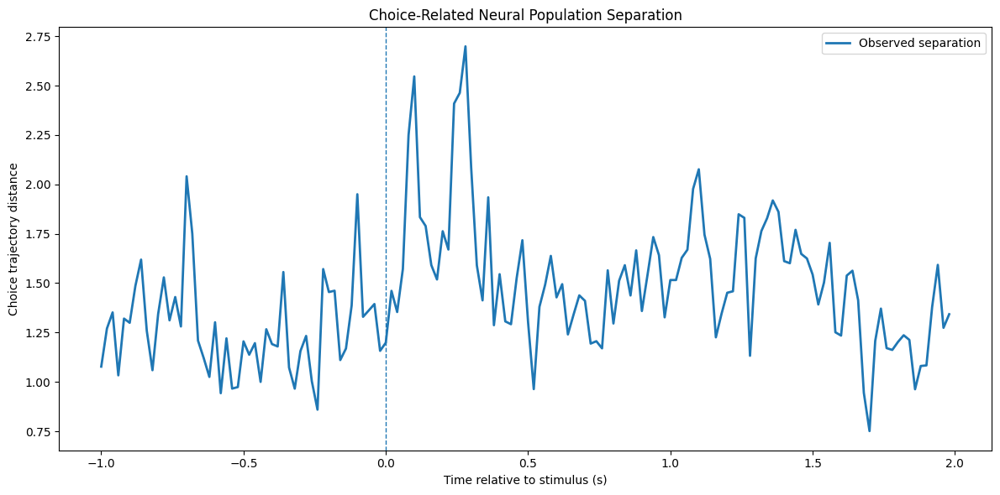

In [67]:
# ============================================================
# STEP 29I — Corrected significance
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    observed_distance,
    linewidth=2,
    label="Observed separation"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

# Mark FDR-significant time points
if reject.any():

    plt.scatter(
        relative_time[reject],
        observed_distance[reject],
        s=12,
        label="FDR q < 0.05"
    )

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Choice trajectory distance"
)

plt.title(
    "Choice-Related Neural Population Separation"
)

plt.legend()

plt.tight_layout()
plt.show()

**STEP 29J — Save the statistical results**

In [68]:
# ============================================================
# STEP 29J — Save Step 29 results
# ============================================================

np.save(
    RESULTS_DIR / "observed_choice_distance.npy",
    observed_distance
)

np.save(
    RESULTS_DIR / "permutation_distances.npy",
    permutation_distances
)

np.save(
    RESULTS_DIR / "permutation_p_values.npy",
    p_values
)

np.save(
    RESULTS_DIR / "permutation_p_corrected.npy",
    p_corrected
)

np.save(
    RESULTS_DIR / "permutation_significant.npy",
    reject
)

print("Step 29 results saved.")

Step 29 results saved.


**STEP 30 — Save the choice trajectory results**

In [69]:
# ============================================================
# STEP 30 — Save all choice trajectory + statistical results
# ============================================================

# ------------------------------------------------------------
# 1. Choice-specific mean trajectories
# ------------------------------------------------------------

np.save(
    RESULTS_DIR / "mean_trajectory_choice_minus1.npy",
    mean_minus1
)

np.save(
    RESULTS_DIR / "mean_trajectory_choice_plus1.npy",
    mean_plus1
)

# ------------------------------------------------------------
# 2. Basic trajectory separation
# ------------------------------------------------------------

np.save(
    RESULTS_DIR / "trajectory_distance.npy",
    trajectory_distance
)

# ------------------------------------------------------------
# 3. Time axis
# ------------------------------------------------------------

np.save(
    RESULTS_DIR / "relative_time.npy",
    relative_time
)

# ------------------------------------------------------------
# 4. Observed choice separation
# ------------------------------------------------------------

np.save(
    RESULTS_DIR / "observed_choice_distance.npy",
    observed_distance
)

# ------------------------------------------------------------
# 5. Permutation analysis
# ------------------------------------------------------------

np.save(
    RESULTS_DIR / "permutation_distances.npy",
    permutation_distances
)

np.save(
    RESULTS_DIR / "permutation_p_values.npy",
    p_values
)

np.save(
    RESULTS_DIR / "permutation_p_corrected.npy",
    p_corrected
)

np.save(
    RESULTS_DIR / "permutation_significant.npy",
    reject
)

print("=" * 60)
print("STEP 30 — RESULTS SAVED")
print("=" * 60)

print("\nChoice trajectory files:")
print("✓ mean_trajectory_choice_minus1.npy")
print("✓ mean_trajectory_choice_plus1.npy")
print("✓ trajectory_distance.npy")
print("✓ relative_time.npy")

print("\nPermutation analysis files:")
print("✓ observed_choice_distance.npy")
print("✓ permutation_distances.npy")
print("✓ permutation_p_values.npy")
print("✓ permutation_p_corrected.npy")
print("✓ permutation_significant.npy")

print("\nAll Step 27–29 results have been saved.")

STEP 30 — RESULTS SAVED

Choice trajectory files:
✓ mean_trajectory_choice_minus1.npy
✓ mean_trajectory_choice_plus1.npy
✓ trajectory_distance.npy
✓ relative_time.npy

Permutation analysis files:
✓ observed_choice_distance.npy
✓ permutation_distances.npy
✓ permutation_p_values.npy
✓ permutation_p_corrected.npy
✓ permutation_significant.npy

All Step 27–29 results have been saved.


**STEP 31 — Trial-level behavioral choice decoding**

**STEP 31A — Prepare the decoding dataset**

In [70]:
# ============================================================
# STEP 31A — Prepare decoding dataset
# ============================================================

print("Decoding dataset")
print("=" * 50)

print("Neural data shape:")
print(binary_PC_bc.shape)

print("\nLabels shape:")
print(binary_labels.shape)

print("\nChoice distribution:")

unique_labels, label_counts = np.unique(
    binary_labels,
    return_counts=True
)

for label, count in zip(
    unique_labels,
    label_counts
):
    print(
        f"Choice {label:+.0f}: {count} trials"
    )

print("\nTime points per trial:")
print(len(relative_time))

print(
    "\nTime range:",
    relative_time[0],
    "to",
    relative_time[-1],
    "seconds"
)

Decoding dataset
Neural data shape:
(140, 150, 20)

Labels shape:
(140,)

Choice distribution:
Choice -1: 69 trials
Choice +1: 71 trials

Time points per trial:
150

Time range: -1.0 to 1.98 seconds


**STEP 31B — Install/import decoding libraries**

In [71]:
# ============================================================
# STEP 31B — Decoder imports
# ============================================================

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

import numpy as np
import matplotlib.pyplot as plt

print("Decoding libraries loaded.")

Decoding libraries loaded.


**STEP 31C — Define cross-validation**

In [72]:
# ============================================================
# STEP 31C — Cross-validation configuration
# ============================================================

N_SPLITS = 5

cv = StratifiedKFold(
    n_splits=N_SPLITS,
    shuffle=True,
    random_state=42
)

print(
    f"Using {N_SPLITS}-fold stratified cross-validation."
)

Using 5-fold stratified cross-validation.


**STEP 31D — Create the classifier**

In [73]:
# ============================================================
# STEP 31D — Logistic regression decoder
# ============================================================

decoder = Pipeline([
    (
        "scaler",
        StandardScaler()
    ),
    (
        "classifier",
        LogisticRegression(
            penalty="l2",
            C=1.0,
            solver="liblinear",
            max_iter=2000,
            random_state=42
        )
    )
])

print(decoder)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 LogisticRegression(max_iter=2000, random_state=42,
                                    solver='liblinear'))])


**STEP 32 — Decode choice at each time point**

**STEP 32A — Run time-resolved decoding**

In [74]:
# ============================================================
# STEP 32A — Time-resolved choice decoding
# ============================================================

n_trials, n_timepoints, n_features = binary_PC_bc.shape

decoding_accuracy = np.zeros(
    n_timepoints,
    dtype=np.float32
)

decoding_std = np.zeros(
    n_timepoints,
    dtype=np.float32
)

print(
    f"Running decoding across "
    f"{n_timepoints} time points..."
)

for t in range(n_timepoints):

    # --------------------------------------------
    # Features at this time point
    # --------------------------------------------

    X_t = binary_PC_bc[
        :, t, :
    ]

    y = binary_labels

    fold_accuracies = []

    # --------------------------------------------
    # Cross-validation
    # --------------------------------------------

    for train_idx, test_idx in cv.split(
        X_t,
        y
    ):

        X_train = X_t[
            train_idx
        ]

        X_test = X_t[
            test_idx
        ]

        y_train = y[
            train_idx
        ]

        y_test = y[
            test_idx
        ]

        # Train
        decoder.fit(
            X_train,
            y_train
        )

        # Predict
        y_pred = decoder.predict(
            X_test
        )

        # Accuracy
        fold_accuracy = accuracy_score(
            y_test,
            y_pred
        )

        fold_accuracies.append(
            fold_accuracy
        )

    decoding_accuracy[t] = np.mean(
        fold_accuracies
    )

    decoding_std[t] = np.std(
        fold_accuracies
    )

    if (t + 1) % 25 == 0:
        print(
            f"Completed "
            f"{t + 1}/{n_timepoints} time points"
        )

print("\nTime-resolved decoding complete.")

Running decoding across 150 time points...
Completed 25/150 time points
Completed 50/150 time points
Completed 75/150 time points
Completed 100/150 time points
Completed 125/150 time points
Completed 150/150 time points

Time-resolved decoding complete.


**STEP 32B — Inspect decoding accuracy**

In [75]:
# ============================================================
# STEP 32B — Decoding summary
# ============================================================

best_idx = np.argmax(
    decoding_accuracy
)

print(
    "Maximum decoding accuracy:",
    f"{decoding_accuracy[best_idx]:.4f}"
)

print(
    "Time of maximum accuracy:",
    f"{relative_time[best_idx]:.3f} s"
)

print(
    "\nMean pre-stimulus accuracy:"
)

pre_accuracy = decoding_accuracy[
    relative_time < 0
]

print(
    f"{pre_accuracy.mean():.4f}"
)

print(
    "\nMean 0–0.5 s accuracy:"
)

early_accuracy = decoding_accuracy[
    (relative_time >= 0) &
    (relative_time < 0.5)
]

print(
    f"{early_accuracy.mean():.4f}"
)

print(
    "\nMean 0.5–1.5 s accuracy:"
)

late_accuracy = decoding_accuracy[
    (relative_time >= 0.5) &
    (relative_time < 1.5)
]

print(
    f"{late_accuracy.mean():.4f}"
)

Maximum decoding accuracy: 0.7143
Time of maximum accuracy: 1.380 s

Mean pre-stimulus accuracy:
0.5109

Mean 0–0.5 s accuracy:
0.5577

Mean 0.5–1.5 s accuracy:
0.5646


**STEP 32C — Plot decoding accuracy**

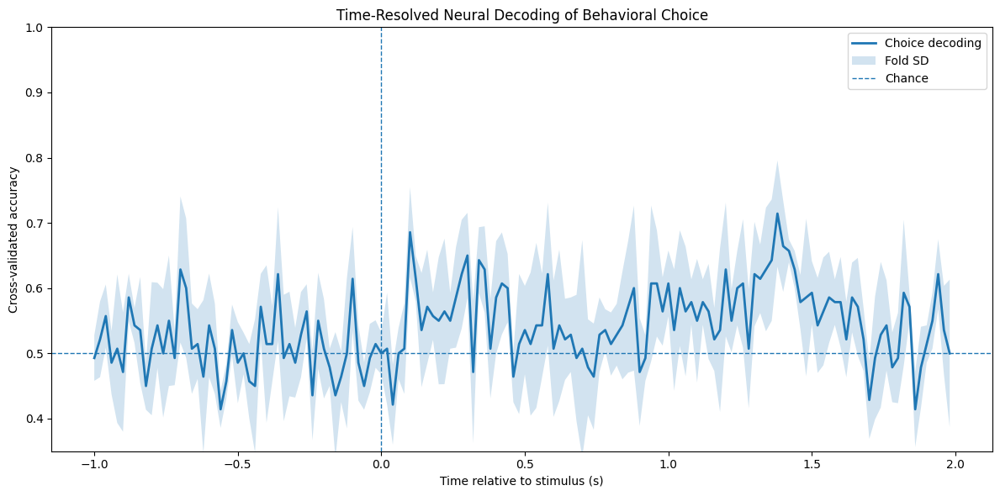

In [76]:
# ============================================================
# STEP 32C — Time-resolved decoding accuracy
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    decoding_accuracy,
    linewidth=2,
    label="Choice decoding"
)

# Fold-to-fold variability
plt.fill_between(
    relative_time,
    decoding_accuracy - decoding_std,
    decoding_accuracy + decoding_std,
    alpha=0.2,
    label="Fold SD"
)

# Chance level
plt.axhline(
    0.5,
    linestyle="--",
    linewidth=1,
    label="Chance"
)

# Stimulus onset
plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Cross-validated accuracy"
)

plt.title(
    "Time-Resolved Neural Decoding of Behavioral Choice"
)

plt.legend()

plt.ylim(
    0.35,
    1.0
)

plt.tight_layout()
plt.show()

**STEP 33 — Establish a decoding null distribution**

**STEP 33A — Run permutation decoding**

In [77]:
# ============================================================
# STEP 33A — Permutation test for decoding
# ============================================================

N_DECODING_PERMUTATIONS = 100

rng = np.random.default_rng(123)

permutation_decoding = np.zeros(
    (
        N_DECODING_PERMUTATIONS,
        n_timepoints
    ),
    dtype=np.float32
)

print(
    f"Running "
    f"{N_DECODING_PERMUTATIONS} decoding permutations..."
)

for perm in range(
    N_DECODING_PERMUTATIONS
):

    shuffled_y = rng.permutation(
        binary_labels
    )

    for t in range(
        n_timepoints
    ):

        X_t = binary_PC_bc[
            :, t, :
        ]

        fold_accuracies = []

        for train_idx, test_idx in cv.split(
            X_t,
            shuffled_y
        ):

            X_train = X_t[
                train_idx
            ]

            X_test = X_t[
                test_idx
            ]

            y_train = shuffled_y[
                train_idx
            ]

            y_test = shuffled_y[
                test_idx
            ]

            decoder.fit(
                X_train,
                y_train
            )

            y_pred = decoder.predict(
                X_test
            )

            fold_accuracies.append(
                accuracy_score(
                    y_test,
                    y_pred
                )
            )

        permutation_decoding[
            perm,
            t
        ] = np.mean(
            fold_accuracies
        )

    if (perm + 1) % 10 == 0:
        print(
            f"Completed "
            f"{perm + 1}/"
            f"{N_DECODING_PERMUTATIONS}"
        )

print(
    "\nDecoding permutation test complete."
)

Running 100 decoding permutations...
Completed 10/100
Completed 20/100
Completed 30/100
Completed 40/100
Completed 50/100
Completed 60/100
Completed 70/100
Completed 80/100
Completed 90/100
Completed 100/100

Decoding permutation test complete.


**STEP 33B — Calculate the null distribution**

In [78]:
# ============================================================
# STEP 33B — Decoding null distribution
# ============================================================

decoding_null_mean = (
    permutation_decoding.mean(
        axis=0
    )
)

decoding_null_upper = (
    np.percentile(
        permutation_decoding,
        97.5,
        axis=0
    )
)

decoding_null_lower = (
    np.percentile(
        permutation_decoding,
        2.5,
        axis=0
    )
)

print(
    "Null decoding distribution calculated."
)

Null decoding distribution calculated.


**STEP 33C — Plot real vs shuffled decoding**

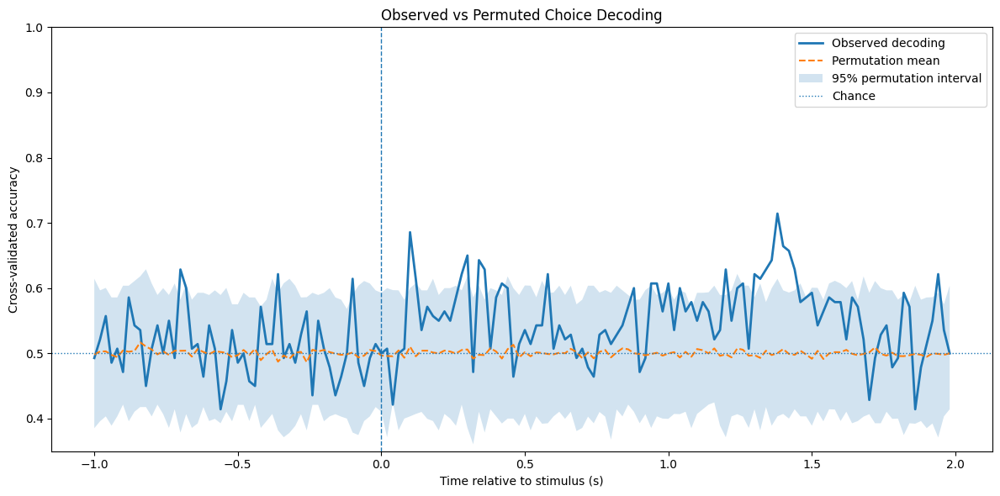

In [79]:
# ============================================================
# STEP 33C — Real vs null decoding
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    decoding_accuracy,
    linewidth=2,
    label="Observed decoding"
)

plt.plot(
    relative_time,
    decoding_null_mean,
    linestyle="--",
    linewidth=1.5,
    label="Permutation mean"
)

plt.fill_between(
    relative_time,
    decoding_null_lower,
    decoding_null_upper,
    alpha=0.2,
    label="95% permutation interval"
)

plt.axhline(
    0.5,
    linestyle=":",
    linewidth=1,
    label="Chance"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Cross-validated accuracy"
)

plt.title(
    "Observed vs Permuted Choice Decoding"
)

plt.legend()

plt.ylim(
    0.35,
    1.0
)

plt.tight_layout()
plt.show()

**STEP 33D — Calculate empirical p-values**

In [80]:
# ============================================================
# STEP 33D — Empirical decoding p-values
# ============================================================

decoding_p_values = (
    1 +
    np.sum(
        permutation_decoding
        >= decoding_accuracy[None, :],
        axis=0
    )
) / (
    N_DECODING_PERMUTATIONS + 1
)

print(
    "Minimum decoding p-value:",
    decoding_p_values.min()
)

min_p_idx = np.argmin(
    decoding_p_values
)

print(
    "Minimum p-value time:",
    relative_time[min_p_idx],
    "seconds"
)

Minimum decoding p-value: 0.009900990099009901
Minimum p-value time: -0.7000000000000001 seconds


**STEP 33E — FDR correction**

In [81]:
# ============================================================
# STEP 33E — FDR correction
# ============================================================

from statsmodels.stats.multitest import multipletests

decoding_reject, decoding_p_corrected, _, _ = (
    multipletests(
        decoding_p_values,
        alpha=0.05,
        method="fdr_bh"
    )
)

print(
    "FDR-significant decoding time points:",
    decoding_reject.sum()
)

if decoding_reject.any():

    sig_times = relative_time[
        decoding_reject
    ]

    print(
        "First significant time:",
        sig_times[0]
    )

    print(
        "Last significant time:",
        sig_times[-1]
    )

else:

    print(
        "No decoding time points survived FDR."
    )

FDR-significant decoding time points: 0
No decoding time points survived FDR.


**STEP 33F — Final decoding figure**

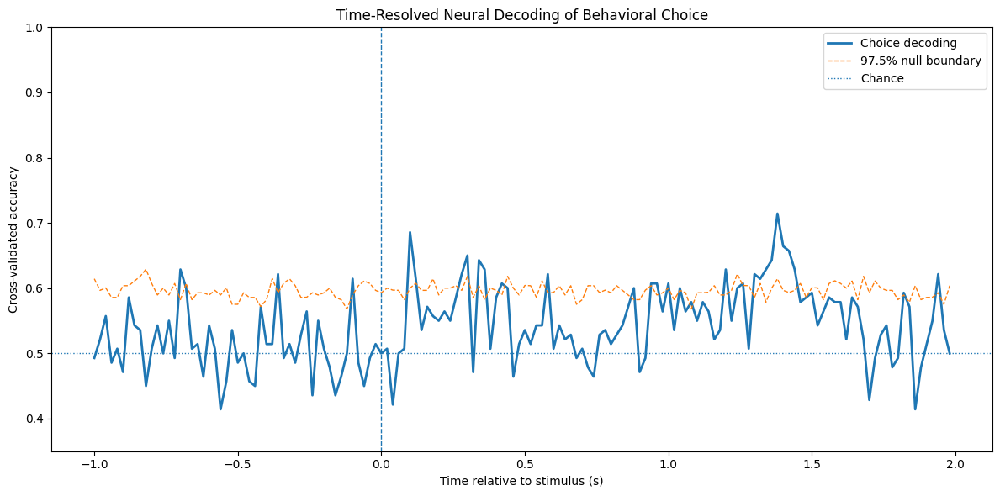

In [82]:
# ============================================================
# STEP 33F — Final publication-style decoding figure
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    decoding_accuracy,
    linewidth=2,
    label="Choice decoding"
)

plt.plot(
    relative_time,
    decoding_null_upper,
    linestyle="--",
    linewidth=1,
    label="97.5% null boundary"
)

plt.axhline(
    0.5,
    linestyle=":",
    linewidth=1,
    label="Chance"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

if decoding_reject.any():

    plt.scatter(
        relative_time[
            decoding_reject
        ],
        decoding_accuracy[
            decoding_reject
        ],
        s=15,
        label="FDR q < 0.05"
    )

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Cross-validated accuracy"
)

plt.title(
    "Time-Resolved Neural Decoding of Behavioral Choice"
)

plt.legend()

plt.ylim(
    0.35,
    1.0
)

plt.tight_layout()
plt.show()

**STEP 34 — Save the decoding results**

In [83]:
# ============================================================
# STEP 34 — Save decoding results
# ============================================================

np.save(
    RESULTS_DIR / "choice_decoding_accuracy.npy",
    decoding_accuracy
)

np.save(
    RESULTS_DIR / "choice_decoding_std.npy",
    decoding_std
)

np.save(
    RESULTS_DIR / "choice_decoding_null.npy",
    permutation_decoding
)

np.save(
    RESULTS_DIR / "choice_decoding_p_values.npy",
    decoding_p_values
)

np.save(
    RESULTS_DIR / "choice_decoding_p_corrected.npy",
    decoding_p_corrected
)

np.save(
    RESULTS_DIR / "choice_decoding_significant.npy",
    decoding_reject
)

print("=" * 60)
print("DECODING RESULTS SAVED")
print("=" * 60)

print("✓ choice_decoding_accuracy.npy")
print("✓ choice_decoding_std.npy")
print("✓ choice_decoding_null.npy")
print("✓ choice_decoding_p_values.npy")
print("✓ choice_decoding_p_corrected.npy")
print("✓ choice_decoding_significant.npy")

DECODING RESULTS SAVED
✓ choice_decoding_accuracy.npy
✓ choice_decoding_std.npy
✓ choice_decoding_null.npy
✓ choice_decoding_p_values.npy
✓ choice_decoding_p_corrected.npy
✓ choice_decoding_significant.npy


**STEP 35 — Quantify decoding onset**

In [84]:
# ============================================================
# STEP 35 — Decoding onset
# ============================================================

if decoding_reject.any():

    significant_indices = np.where(
        decoding_reject
    )[0]

    first_idx = significant_indices[0]

    print(
        "First FDR-significant decoding time:",
        f"{relative_time[first_idx]:.3f} s"
    )

    print(
        "Decoding accuracy at onset:",
        f"{decoding_accuracy[first_idx]:.3f}"
    )

else:

    print(
        "No FDR-significant decoding onset detected."
    )

No FDR-significant decoding onset detected.


**STEP 36 — Compare decoding with trajectory separation**

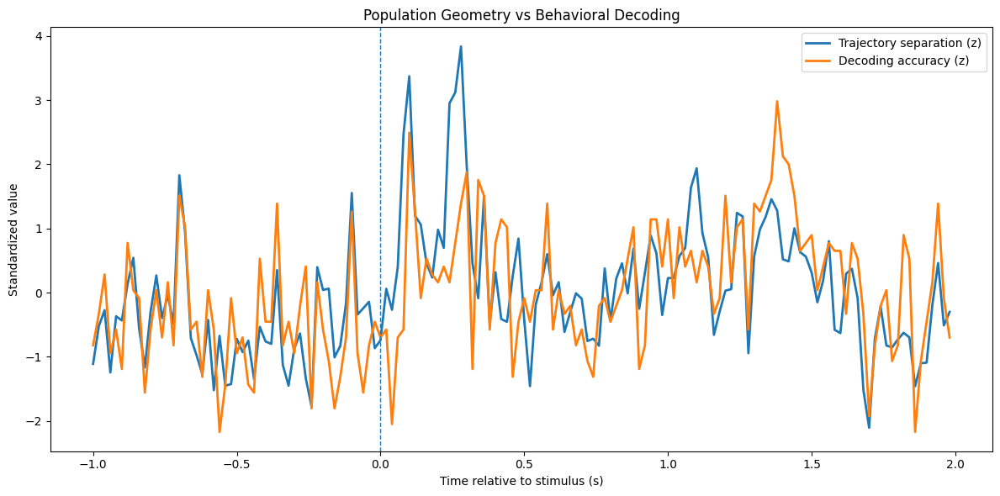

In [85]:
# ============================================================
# STEP 36 — Compare trajectory separation and decoding
# ============================================================

trajectory_z = (
    trajectory_distance
    - trajectory_distance.mean()
) / trajectory_distance.std()

decoding_z = (
    decoding_accuracy
    - decoding_accuracy.mean()
) / decoding_accuracy.std()

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    trajectory_z,
    linewidth=2,
    label="Trajectory separation (z)"
)

plt.plot(
    relative_time,
    decoding_z,
    linewidth=2,
    label="Decoding accuracy (z)"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Standardized value"
)

plt.title(
    "Population Geometry vs Behavioral Decoding"
)

plt.legend()

plt.tight_layout()
plt.show()

**STEP 37 — Save the integrated results**

In [86]:
# ============================================================
# STEP 37 — Save integrated analysis
# ============================================================

np.save(
    RESULTS_DIR / "trajectory_distance_z.npy",
    trajectory_z
)

np.save(
    RESULTS_DIR / "decoding_accuracy_z.npy",
    decoding_z
)

print(
    "Integrated trajectory/decoding results saved."
)

Integrated trajectory/decoding results saved.


**STEP 38 — 300-ms sliding-window choice decoder**

**STEP 38A — Check your time resolution**

In [87]:
# ============================================================
# STEP 38A — Check temporal resolution
# ============================================================

time_step = np.median(
    np.diff(relative_time)
)

print(
    "Time step:",
    time_step,
    "seconds"
)

print(
    "Time step:",
    time_step * 1000,
    "ms"
)

Time step: 0.020000000000000018 seconds
Time step: 20.000000000000018 ms


**STEP 38B — Define the 300-ms window**

In [88]:
# ============================================================
# STEP 38B — Define sliding window
# ============================================================

WINDOW_MS = 300

window_bins = int(
    round(
        (WINDOW_MS / 1000) /
        time_step
    )
)

# Make sure the window is odd so that
# it has a central time point
if window_bins % 2 == 0:
    window_bins += 1

half_window = window_bins // 2

print(
    "Window:",
    WINDOW_MS,
    "ms"
)

print(
    "Window bins:",
    window_bins
)

print(
    "Half window:",
    half_window,
    "bins"
)

Window: 300 ms
Window bins: 15
Half window: 7 bins


**STEP 38C — Define valid center times**

In [89]:
# ============================================================
# STEP 38C — Valid decoder time points
# ============================================================

valid_time_indices = np.arange(
    half_window,
    n_timepoints - half_window
)

decoder_times = relative_time[
    valid_time_indices
]

print(
    "Original time points:",
    n_timepoints
)

print(
    "Decoder time points:",
    len(decoder_times)
)

print(
    "Decoder range:",
    decoder_times[0],
    "to",
    decoder_times[-1],
    "seconds"
)

Original time points: 150
Decoder time points: 136
Decoder range: -0.86 to 1.84 seconds


**STEP 38D — Create the sliding-window decoder**

In [90]:
# ============================================================
# STEP 38D — Sliding-window decoder
# ============================================================

window_decoder = Pipeline([
    (
        "scaler",
        StandardScaler()
    ),
    (
        "classifier",
        LogisticRegression(
            penalty="l2",
            C=0.1,
            solver="liblinear",
            max_iter=3000,
            random_state=42
        )
    )
])

print(
    "Sliding-window decoder created."
)

Sliding-window decoder created.


**STEP 38E — Run cross-validated sliding-window decoding**

In [91]:
# ============================================================
# STEP 38E — 300-ms sliding-window decoding
# ============================================================

window_accuracy = np.zeros(
    len(valid_time_indices),
    dtype=np.float32
)

window_std = np.zeros(
    len(valid_time_indices),
    dtype=np.float32
)

print(
    "Starting 300-ms sliding-window decoding..."
)

for output_idx, center_idx in enumerate(
    valid_time_indices
):

    # --------------------------------------------------------
    # Extract temporal window
    # --------------------------------------------------------

    start_idx = (
        center_idx - half_window
    )

    end_idx = (
        center_idx + half_window + 1
    )

    X_window = binary_PC_bc[
        :,
        start_idx:end_idx,
        :
    ]

    # --------------------------------------------------------
    # Flatten time × PCA dimensions
    # --------------------------------------------------------

    X_window = X_window.reshape(
        n_trials,
        -1
    )

    y = binary_labels

    fold_accuracies = []

    # --------------------------------------------------------
    # Cross-validation
    # --------------------------------------------------------

    for train_idx, test_idx in cv.split(
        X_window,
        y
    ):

        X_train = X_window[
            train_idx
        ]

        X_test = X_window[
            test_idx
        ]

        y_train = y[
            train_idx
        ]

        y_test = y[
            test_idx
        ]

        window_decoder.fit(
            X_train,
            y_train
        )

        y_pred = window_decoder.predict(
            X_test
        )

        fold_accuracies.append(
            accuracy_score(
                y_test,
                y_pred
            )
        )

    window_accuracy[
        output_idx
    ] = np.mean(
        fold_accuracies
    )

    window_std[
        output_idx
    ] = np.std(
        fold_accuracies
    )

    if (
        output_idx + 1
    ) % 25 == 0:

        print(
            f"Completed "
            f"{output_idx + 1}/"
            f"{len(valid_time_indices)}"
        )

print(
    "\nSliding-window decoding complete."
)

Starting 300-ms sliding-window decoding...
Completed 25/136
Completed 50/136
Completed 75/136
Completed 100/136
Completed 125/136

Sliding-window decoding complete.


**STEP 38F — Inspect the result**

In [92]:
# ============================================================
# STEP 38F — Sliding-window decoding summary
# ============================================================

best_window_idx = np.argmax(
    window_accuracy
)

print(
    "Maximum sliding-window accuracy:",
    f"{window_accuracy[best_window_idx]:.4f}"
)

print(
    "Time of maximum accuracy:",
    f"{decoder_times[best_window_idx]:.3f} s"
)

pre_window = window_accuracy[
    decoder_times < 0
]

early_window = window_accuracy[
    (decoder_times >= 0) &
    (decoder_times < 0.5)
]

late_window = window_accuracy[
    (decoder_times >= 0.5) &
    (decoder_times < 1.5)
]

print(
    "\nMean pre-stimulus accuracy:",
    f"{pre_window.mean():.4f}"
)

print(
    "Mean 0–0.5 s accuracy:",
    f"{early_window.mean():.4f}"
)

print(
    "Mean 0.5–1.5 s accuracy:",
    f"{late_window.mean():.4f}"
)

Maximum sliding-window accuracy: 0.7143
Time of maximum accuracy: 1.300 s

Mean pre-stimulus accuracy: 0.5317
Mean 0–0.5 s accuracy: 0.6266
Mean 0.5–1.5 s accuracy: 0.6317


**STEP 38G — Plot the sliding-window decoder**

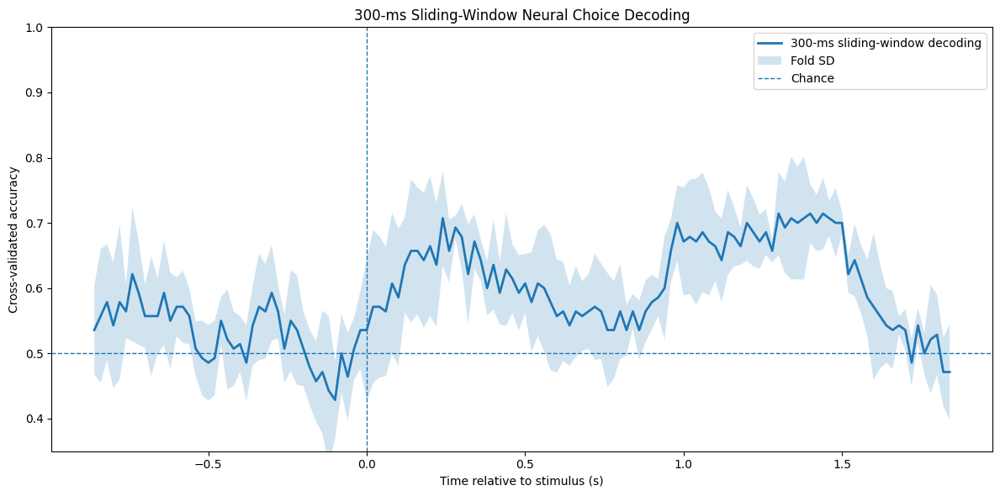

In [93]:
# ============================================================
# STEP 38G — Sliding-window decoding figure
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    decoder_times,
    window_accuracy,
    linewidth=2,
    label="300-ms sliding-window decoding"
)

plt.fill_between(
    decoder_times,
    window_accuracy - window_std,
    window_accuracy + window_std,
    alpha=0.2,
    label="Fold SD"
)

plt.axhline(
    0.5,
    linestyle="--",
    linewidth=1,
    label="Chance"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Cross-validated accuracy"
)

plt.title(
    "300-ms Sliding-Window Neural Choice Decoding"
)

plt.legend()

plt.ylim(
    0.35,
    1.0
)

plt.tight_layout()
plt.show()

**STEP 39 — Compare instantaneous vs sliding-window decoding**

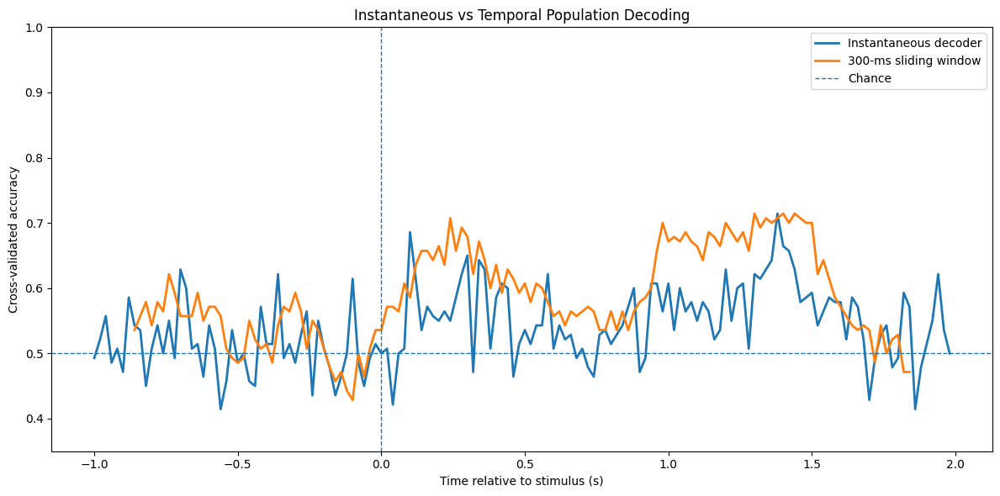

In [94]:
# ============================================================
# STEP 39 — Compare decoding approaches
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    decoding_accuracy,
    linewidth=2,
    label="Instantaneous decoder"
)

plt.plot(
    decoder_times,
    window_accuracy,
    linewidth=2,
    label="300-ms sliding window"
)

plt.axhline(
    0.5,
    linestyle="--",
    linewidth=1,
    label="Chance"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Cross-validated accuracy"
)

plt.title(
    "Instantaneous vs Temporal Population Decoding"
)

plt.legend()

plt.ylim(
    0.35,
    1.0
)

plt.tight_layout()
plt.show()

**STEP 40 — Sliding-window permutation test**

In [95]:
# ============================================================
# STEP 40 — Sliding-window permutation test
# ============================================================

N_WINDOW_PERMUTATIONS = 100

rng = np.random.default_rng(456)

window_permutation_accuracy = np.zeros(
    (
        N_WINDOW_PERMUTATIONS,
        len(valid_time_indices)
    ),
    dtype=np.float32
)

print(
    f"Running "
    f"{N_WINDOW_PERMUTATIONS} permutations..."
)

for perm in range(
    N_WINDOW_PERMUTATIONS
):

    shuffled_y = rng.permutation(
        binary_labels
    )

    for output_idx, center_idx in enumerate(
        valid_time_indices
    ):

        start_idx = (
            center_idx - half_window
        )

        end_idx = (
            center_idx + half_window + 1
        )

        X_window = binary_PC_bc[
            :,
            start_idx:end_idx,
            :
        ]

        X_window = X_window.reshape(
            n_trials,
            -1
        )

        fold_accuracies = []

        for train_idx, test_idx in cv.split(
            X_window,
            shuffled_y
        ):

            X_train = X_window[
                train_idx
            ]

            X_test = X_window[
                test_idx
            ]

            y_train = shuffled_y[
                train_idx
            ]

            y_test = shuffled_y[
                test_idx
            ]

            window_decoder.fit(
                X_train,
                y_train
            )

            y_pred = window_decoder.predict(
                X_test
            )

            fold_accuracies.append(
                accuracy_score(
                    y_test,
                    y_pred
                )
            )

        window_permutation_accuracy[
            perm,
            output_idx
        ] = np.mean(
            fold_accuracies
        )

    if (
        perm + 1
    ) % 10 == 0:

        print(
            f"Completed "
            f"{perm + 1}/"
            f"{N_WINDOW_PERMUTATIONS}"
        )

print(
    "\nSliding-window permutation test complete."
)

Running 100 permutations...
Completed 10/100
Completed 20/100
Completed 30/100
Completed 40/100
Completed 50/100
Completed 60/100
Completed 70/100
Completed 80/100
Completed 90/100
Completed 100/100

Sliding-window permutation test complete.


**STEP 40B — Calculate null distribution**

In [96]:
# ============================================================
# STEP 40B — Sliding-window null distribution
# ============================================================

window_null_mean = (
    window_permutation_accuracy.mean(
        axis=0
    )
)

window_null_upper = (
    np.percentile(
        window_permutation_accuracy,
        97.5,
        axis=0
    )
)

window_null_lower = (
    np.percentile(
        window_permutation_accuracy,
        2.5,
        axis=0
    )
)

print(
    "Sliding-window null distribution calculated."
)

Sliding-window null distribution calculated.


**STEP 40C — Empirical p-values**

In [97]:
# ============================================================
# STEP 40C — Sliding-window p-values
# ============================================================

window_p_values = (
    1 +
    np.sum(
        window_permutation_accuracy
        >= window_accuracy[None, :],
        axis=0
    )
) / (
    N_WINDOW_PERMUTATIONS + 1
)

print(
    "Minimum sliding-window p-value:",
    window_p_values.min()
)

min_window_p_idx = np.argmin(
    window_p_values
)

print(
    "Minimum p-value time:",
    decoder_times[
        min_window_p_idx
    ],
    "seconds"
)

Minimum sliding-window p-value: 0.009900990099009901
Minimum p-value time: 0.12 seconds


**STEP 40D — FDR correction**

In [98]:
# ============================================================
# STEP 40D — FDR correction
# ============================================================

window_reject, window_p_corrected, _, _ = (
    multipletests(
        window_p_values,
        alpha=0.05,
        method="fdr_bh"
    )
)

print(
    "FDR-significant sliding-window time points:",
    window_reject.sum()
)

if window_reject.any():

    significant_times = decoder_times[
        window_reject
    ]

    print(
        "First significant time:",
        significant_times[0]
    )

    print(
        "Last significant time:",
        significant_times[-1]
    )

else:

    print(
        "No sliding-window time points survived FDR."
    )

FDR-significant sliding-window time points: 39
First significant time: 0.12
Last significant time: 1.56


**STEP 40E — Final statistical decoding figure**

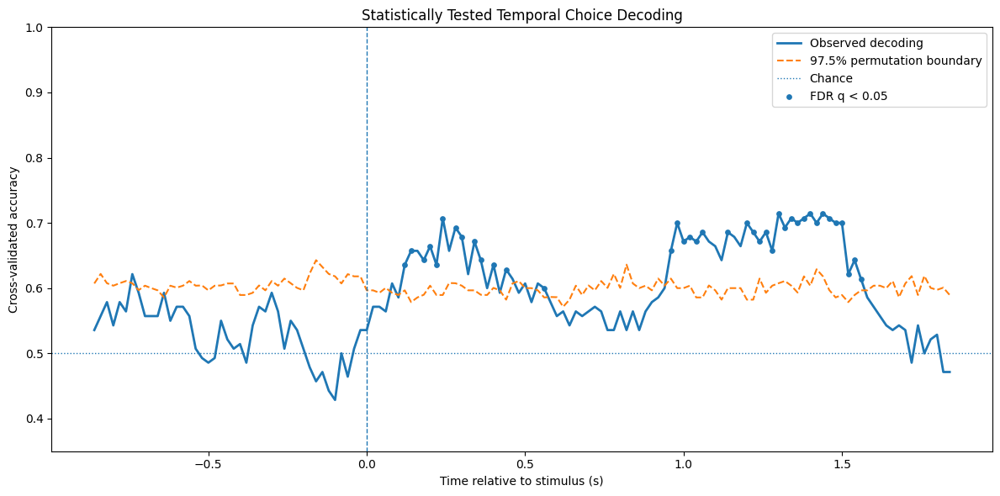

In [99]:
# ============================================================
# STEP 40E — Final sliding-window decoding figure
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    decoder_times,
    window_accuracy,
    linewidth=2,
    label="Observed decoding"
)

plt.plot(
    decoder_times,
    window_null_upper,
    linestyle="--",
    linewidth=1.5,
    label="97.5% permutation boundary"
)

plt.axhline(
    0.5,
    linestyle=":",
    linewidth=1,
    label="Chance"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

if window_reject.any():

    plt.scatter(
        decoder_times[
            window_reject
        ],
        window_accuracy[
            window_reject
        ],
        s=15,
        label="FDR q < 0.05"
    )

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Cross-validated accuracy"
)

plt.title(
    "Statistically Tested Temporal Choice Decoding"
)

plt.legend()

plt.ylim(
    0.35,
    1.0
)

plt.tight_layout()
plt.show()

**STEP 41 — Save the improved decoder**

In [100]:
# ============================================================
# STEP 41 — Save sliding-window decoding
# ============================================================

np.save(
    RESULTS_DIR / "window_decoding_accuracy.npy",
    window_accuracy
)

np.save(
    RESULTS_DIR / "window_decoding_std.npy",
    window_std
)

np.save(
    RESULTS_DIR / "window_decoder_times.npy",
    decoder_times
)

np.save(
    RESULTS_DIR / "window_decoding_null.npy",
    window_permutation_accuracy
)

np.save(
    RESULTS_DIR / "window_decoding_p_values.npy",
    window_p_values
)

np.save(
    RESULTS_DIR / "window_decoding_p_corrected.npy",
    window_p_corrected
)

np.save(
    RESULTS_DIR / "window_decoding_significant.npy",
    window_reject
)

print("=" * 60)
print("SLIDING-WINDOW DECODING RESULTS SAVED")
print("=" * 60)

print("✓ window_decoding_accuracy.npy")
print("✓ window_decoding_std.npy")
print("✓ window_decoder_times.npy")
print("✓ window_decoding_null.npy")
print("✓ window_decoding_p_values.npy")
print("✓ window_decoding_p_corrected.npy")
print("✓ window_decoding_significant.npy")

SLIDING-WINDOW DECODING RESULTS SAVED
✓ window_decoding_accuracy.npy
✓ window_decoding_std.npy
✓ window_decoder_times.npy
✓ window_decoding_null.npy
✓ window_decoding_p_values.npy
✓ window_decoding_p_corrected.npy
✓ window_decoding_significant.npy


**STEP 42 — UMAP population manifold**

**STEP 42A — Install UMAP**

In [101]:
!pip install -q umap-learn

In [102]:
# ============================================================
# STEP 42A — UMAP imports
# ============================================================

import umap
import numpy as np
import matplotlib.pyplot as plt

print("UMAP loaded.")

UMAP loaded.


**STEP 42B — Decide what population states to embed**

**STEP 42C — Create UMAP input**

In [103]:
# ============================================================
# STEP 42C — Create UMAP input
# ============================================================

n_trials, n_timepoints, n_pcs = binary_PC_bc.shape

# Flatten trial × time
umap_input = binary_PC_bc.reshape(
    n_trials * n_timepoints,
    n_pcs
)

# Corresponding trial indices
umap_trial = np.repeat(
    np.arange(n_trials),
    n_timepoints
)

# Corresponding time indices
umap_time_idx = np.tile(
    np.arange(n_timepoints),
    n_trials
)

# Corresponding time values
umap_time = relative_time[
    umap_time_idx
]

# Corresponding behavioral choices
umap_choice = np.repeat(
    binary_labels,
    n_timepoints
)

print(
    "UMAP input shape:",
    umap_input.shape
)

print(
    "Trial labels:",
    umap_trial.shape
)

print(
    "Time labels:",
    umap_time.shape
)

print(
    "Choice labels:",
    umap_choice.shape
)

UMAP input shape: (21000, 20)
Trial labels: (21000,)
Time labels: (21000,)
Choice labels: (21000,)


**STEP 42D — Run UMAP**

In [104]:
# ============================================================
# STEP 42D — Fit UMAP
# ============================================================

umap_model = umap.UMAP(
    n_neighbors=30,
    n_components=2,
    min_dist=0.2,
    metric="euclidean",
    random_state=42
)

print(
    "Fitting UMAP..."
)

umap_embedding = umap_model.fit_transform(
    umap_input
)

print(
    "UMAP complete."
)

print(
    "Embedding shape:",
    umap_embedding.shape
)

Fitting UMAP...


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP complete.
Embedding shape: (21000, 2)


**STEP 42E — Visualize UMAP by choice**

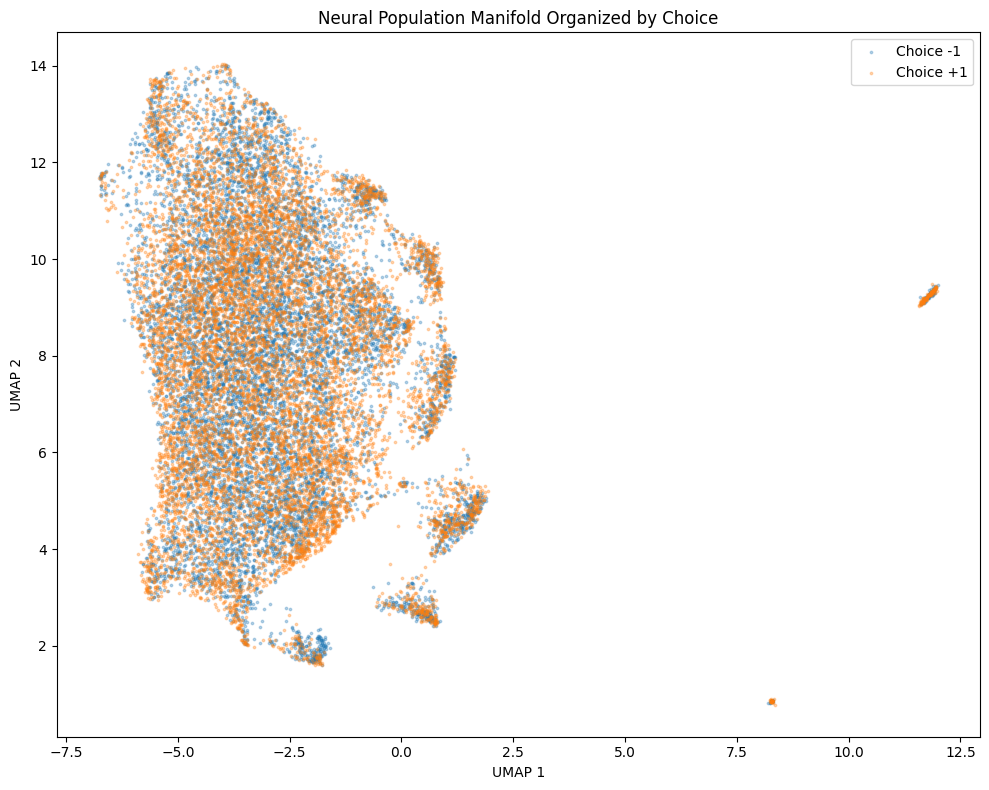

In [106]:
# ============================================================
# STEP 42E — UMAP colored by choice
# ============================================================

plt.figure(figsize=(10, 8))

choice_minus1 = (
    umap_choice == -1
)

choice_plus1 = (
    umap_choice == 1
)

plt.scatter(
    umap_embedding[
        choice_minus1,
        0
    ],
    umap_embedding[
        choice_minus1,
        1
    ],
    s=3,
    alpha=0.3,
    label="Choice -1"
)

plt.scatter(
    umap_embedding[
        choice_plus1,
        0
    ],
    umap_embedding[
        choice_plus1,
        1
    ],
    s=3,
    alpha=0.3,
    label="Choice +1"
)

plt.xlabel(
    "UMAP 1"
)

plt.ylabel(
    "UMAP 2"
)

plt.title(
    "Neural Population Manifold Organized by Choice"
)

plt.legend()

plt.tight_layout()

plt.show()

**STEP 42F — Visualize UMAP by time**

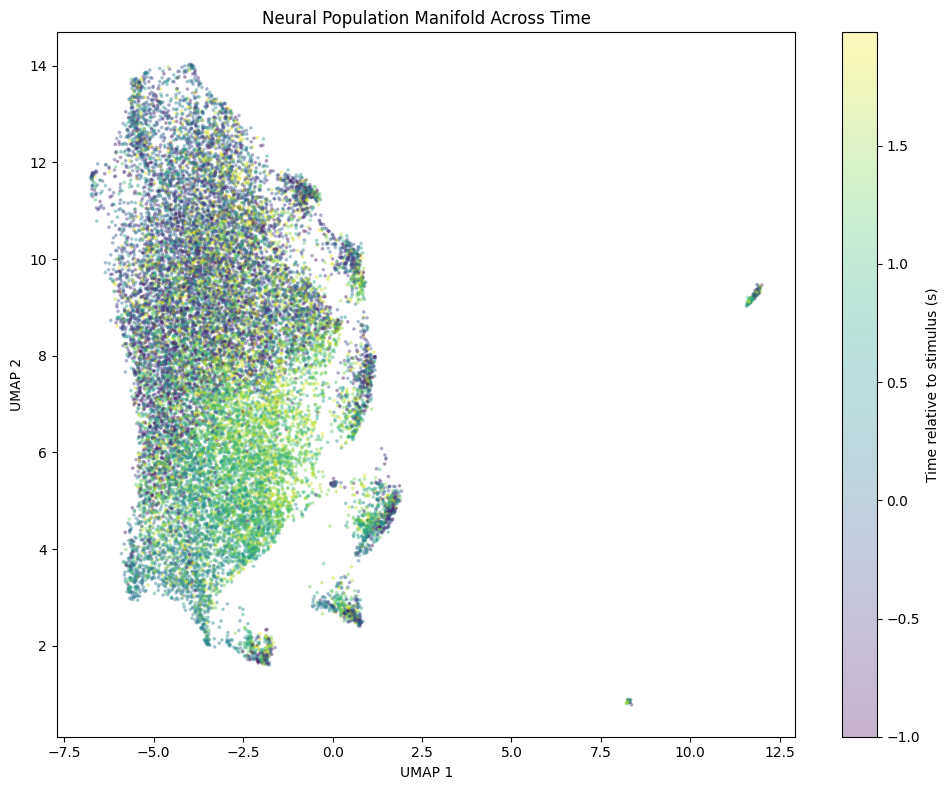

In [107]:
# ============================================================
# STEP 42F — UMAP colored by time
# ============================================================

plt.figure(figsize=(10, 8))

scatter = plt.scatter(
    umap_embedding[:, 0],
    umap_embedding[:, 1],
    c=umap_time,
    s=3,
    alpha=0.3
)

plt.xlabel(
    "UMAP 1"
)

plt.ylabel(
    "UMAP 2"
)

plt.title(
    "Neural Population Manifold Across Time"
)

plt.colorbar(
    scatter,
    label="Time relative to stimulus (s)"
)

plt.tight_layout()

plt.show()

**STEP 42G — Plot UMAP only around the behavioral period**

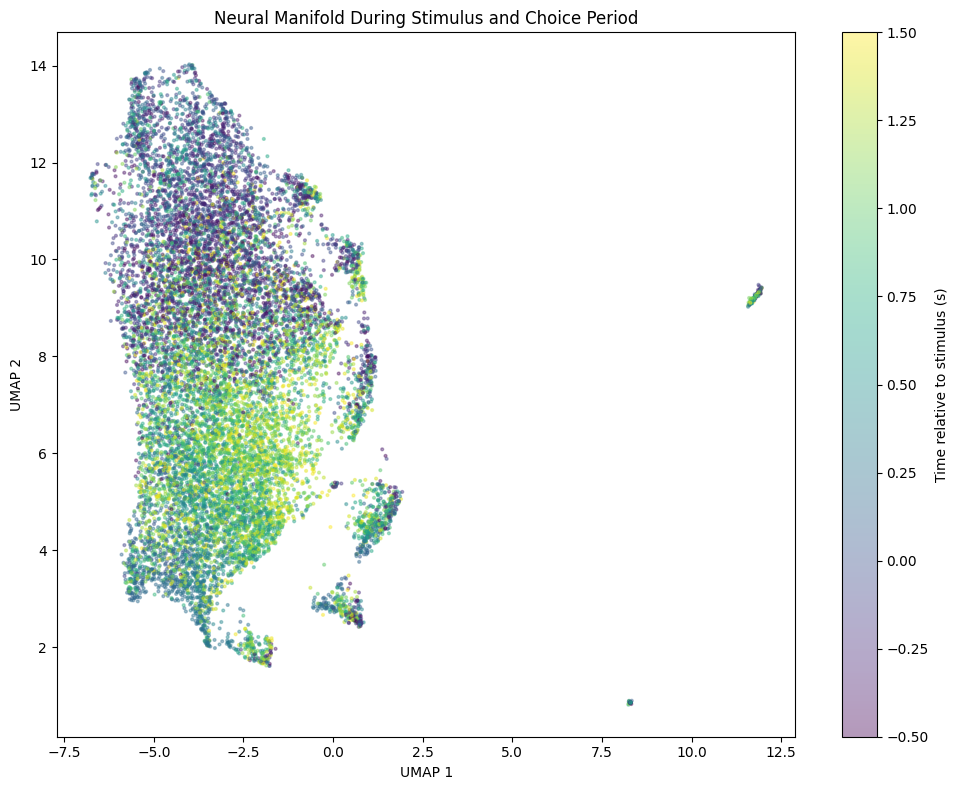

In [108]:
# ============================================================
# STEP 42G — Behavioral-period UMAP
# ============================================================

behavioral_mask = (
    (umap_time >= -0.5) &
    (umap_time <= 1.5)
)

plt.figure(figsize=(10, 8))

scatter = plt.scatter(
    umap_embedding[
        behavioral_mask,
        0
    ],
    umap_embedding[
        behavioral_mask,
        1
    ],
    c=umap_time[
        behavioral_mask
    ],
    s=4,
    alpha=0.4
)

plt.xlabel(
    "UMAP 1"
)

plt.ylabel(
    "UMAP 2"
)

plt.title(
    "Neural Manifold During Stimulus and Choice Period"
)

plt.colorbar(
    scatter,
    label="Time relative to stimulus (s)"
)

plt.tight_layout()

plt.show()

**STEP 43 — Quantify choice organization in UMAP**

**STEP 43A — Choice centroids**

In [109]:
# ============================================================
# STEP 43A — UMAP choice centroids
# ============================================================

mean_umap_minus1 = umap_embedding[
    choice_minus1
].mean(axis=0)

mean_umap_plus1 = umap_embedding[
    choice_plus1
].mean(axis=0)

umap_centroid_distance = np.linalg.norm(
    mean_umap_minus1 -
    mean_umap_plus1
)

print(
    "Choice -1 centroid:",
    mean_umap_minus1
)

print(
    "Choice +1 centroid:",
    mean_umap_plus1
)

print(
    "UMAP centroid distance:",
    umap_centroid_distance
)

Choice -1 centroid: [-2.7573855  7.821786 ]
Choice +1 centroid: [-2.709197  7.799457]
UMAP centroid distance: 0.0531103


**STEP 43B — Time-resolved UMAP choice separation**

In [110]:
# ============================================================
# STEP 43B — Time-resolved UMAP choice separation
# ============================================================

umap_choice_distance = np.zeros(
    n_timepoints,
    dtype=np.float32
)

for t in range(
    n_timepoints
):

    time_mask = (
        umap_time_idx == t
    )

    minus1_mask = (
        time_mask &
        (umap_choice == -1)
    )

    plus1_mask = (
        time_mask &
        (umap_choice == 1)
    )

    if (
        minus1_mask.sum() > 0 and
        plus1_mask.sum() > 0
    ):

        centroid_minus1 = (
            umap_embedding[
                minus1_mask
            ].mean(axis=0)
        )

        centroid_plus1 = (
            umap_embedding[
                plus1_mask
            ].mean(axis=0)
        )

        umap_choice_distance[t] = (
            np.linalg.norm(
                centroid_minus1 -
                centroid_plus1
            )
        )

print(
    "UMAP choice separation calculated."
)

UMAP choice separation calculated.


**STEP 43C — Plot UMAP choice separation**

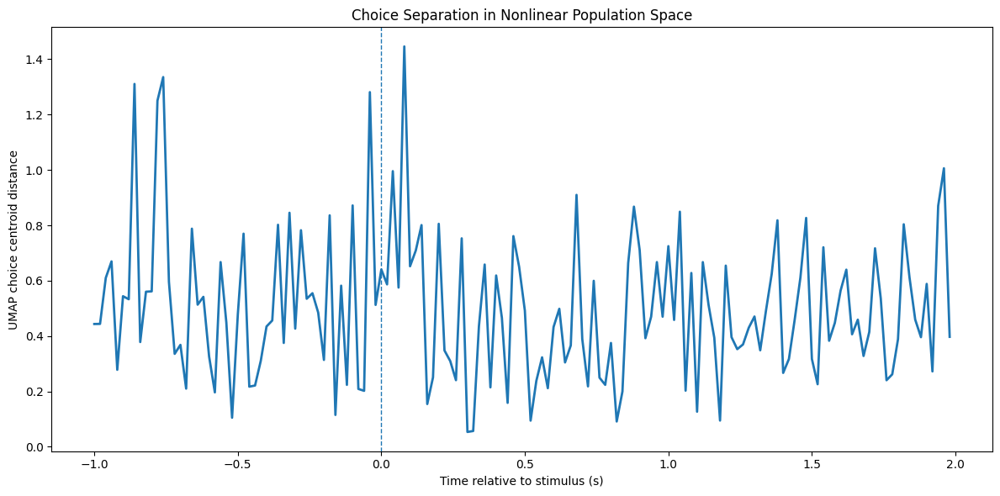

In [111]:
# ============================================================
# STEP 43C — UMAP choice separation over time
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    umap_choice_distance,
    linewidth=2
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "UMAP choice centroid distance"
)

plt.title(
    "Choice Separation in Nonlinear Population Space"
)

plt.tight_layout()

plt.show()

**STEP 44 — Connect PCA, decoding and UMAP**

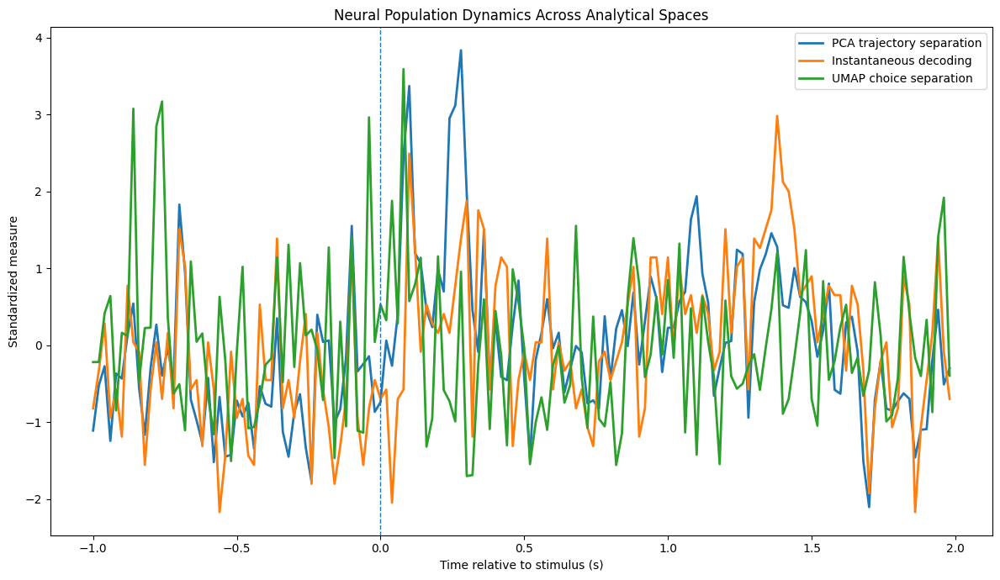

In [112]:
# ============================================================
# STEP 44 — Integrated population dynamics
# ============================================================

# PCA trajectory separation
pca_z = (
    trajectory_distance -
    trajectory_distance.mean()
) / trajectory_distance.std()

# Instantaneous decoding
decoder_z = (
    decoding_accuracy -
    decoding_accuracy.mean()
) / decoding_accuracy.std()

# UMAP separation
umap_z = (
    umap_choice_distance -
    umap_choice_distance.mean()
) / umap_choice_distance.std()

plt.figure(figsize=(12, 7))

plt.plot(
    relative_time,
    pca_z,
    linewidth=2,
    label="PCA trajectory separation"
)

plt.plot(
    relative_time,
    decoder_z,
    linewidth=2,
    label="Instantaneous decoding"
)

plt.plot(
    relative_time,
    umap_z,
    linewidth=2,
    label="UMAP choice separation"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Standardized measure"
)

plt.title(
    "Neural Population Dynamics Across Analytical Spaces"
)

plt.legend()

plt.tight_layout()

plt.show()

**STEP 45 — Save UMAP/manifold results**

In [113]:
# ============================================================
# STEP 45 — Save UMAP results
# ============================================================

np.save(
    RESULTS_DIR / "umap_embedding.npy",
    umap_embedding
)

np.save(
    RESULTS_DIR / "umap_trial.npy",
    umap_trial
)

np.save(
    RESULTS_DIR / "umap_time.npy",
    umap_time
)

np.save(
    RESULTS_DIR / "umap_choice.npy",
    umap_choice
)

np.save(
    RESULTS_DIR / "umap_choice_distance.npy",
    umap_choice_distance
)

print("=" * 60)
print("UMAP RESULTS SAVED")
print("=" * 60)

print("✓ umap_embedding.npy")
print("✓ umap_trial.npy")
print("✓ umap_time.npy")
print("✓ umap_choice.npy")
print("✓ umap_choice_distance.npy")

UMAP RESULTS SAVED
✓ umap_embedding.npy
✓ umap_trial.npy
✓ umap_time.npy
✓ umap_choice.npy
✓ umap_choice_distance.npy


**STEP 46 — Time-resolved UMAP robustness analysis**

**STEP 46A — Calculate within-time UMAP separation**

In [114]:
# ============================================================
# STEP 46A — Time-resolved UMAP choice separation
# ============================================================

umap_choice_distance = np.full(
    n_timepoints,
    np.nan,
    dtype=np.float32
)

for t in range(n_timepoints):

    time_mask = (
        umap_time_idx == t
    )

    minus_mask = (
        time_mask &
        (umap_choice == -1)
    )

    plus_mask = (
        time_mask &
        (umap_choice == 1)
    )

    if (
        minus_mask.sum() > 0 and
        plus_mask.sum() > 0
    ):

        centroid_minus = (
            umap_embedding[minus_mask]
            .mean(axis=0)
        )

        centroid_plus = (
            umap_embedding[plus_mask]
            .mean(axis=0)
        )

        umap_choice_distance[t] = np.linalg.norm(
            centroid_minus -
            centroid_plus
        )

print(
    "Time-resolved UMAP separation calculated."
)

print(
    "Maximum UMAP separation:",
    f"{np.nanmax(umap_choice_distance):.4f}"
)

max_idx = np.nanargmax(
    umap_choice_distance
)

print(
    "Time of maximum UMAP separation:",
    f"{relative_time[max_idx]:.3f} s"
)

Time-resolved UMAP separation calculated.
Maximum UMAP separation: 1.4463
Time of maximum UMAP separation: 0.080 s


**STEP 46B — Plot it against decoding**

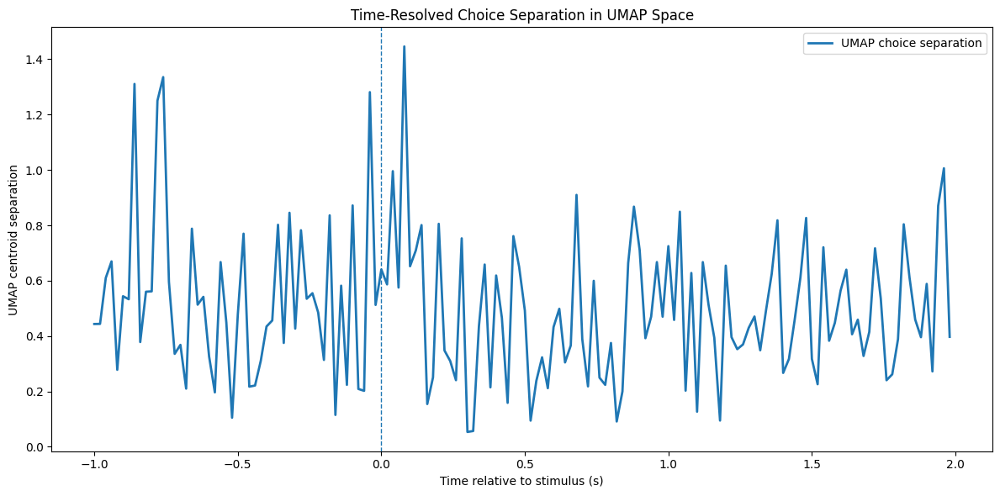

In [115]:
# ============================================================
# STEP 46B — UMAP separation vs decoding
# ============================================================

fig = plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    umap_choice_distance,
    linewidth=2,
    label="UMAP choice separation"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "UMAP centroid separation"
)

plt.title(
    "Time-Resolved Choice Separation in UMAP Space"
)

plt.legend()

plt.tight_layout()

plt.show()

**STEP 47 — Much more important: UMAP robustness**

**STEP 47A — Fit three UMAP embeddings**

In [116]:
# ============================================================
# STEP 47A — UMAP robustness analysis
# ============================================================

neighbor_values = [
    15,
    30,
    60
]

umap_embeddings = {}

for n_neighbors_value in neighbor_values:

    print(
        f"\nFitting UMAP with "
        f"n_neighbors={n_neighbors_value}"
    )

    model = umap.UMAP(
        n_neighbors=n_neighbors_value,
        n_components=2,
        min_dist=0.2,
        metric="euclidean",
        random_state=42
    )

    embedding = model.fit_transform(
        umap_input
    )

    umap_embeddings[
        n_neighbors_value
    ] = embedding

    print(
        "Embedding shape:",
        embedding.shape
    )

print("\nUMAP robustness analysis complete.")


Fitting UMAP with n_neighbors=15


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Embedding shape: (21000, 2)

Fitting UMAP with n_neighbors=30


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Embedding shape: (21000, 2)

Fitting UMAP with n_neighbors=60


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Embedding shape: (21000, 2)

UMAP robustness analysis complete.


**STEP 47B — Calculate choice separation for each UMAP**

In [117]:
# ============================================================
# STEP 47B — Choice separation across UMAP parameters
# ============================================================

umap_separation_summary = {}

for n_neighbors_value, embedding in umap_embeddings.items():

    separation = np.full(
        n_timepoints,
        np.nan,
        dtype=np.float32
    )

    for t in range(n_timepoints):

        time_mask = (
            umap_time_idx == t
        )

        minus_mask = (
            time_mask &
            (umap_choice == -1)
        )

        plus_mask = (
            time_mask &
            (umap_choice == 1)
        )

        if (
            minus_mask.sum() > 0 and
            plus_mask.sum() > 0
        ):

            centroid_minus = embedding[
                minus_mask
            ].mean(axis=0)

            centroid_plus = embedding[
                plus_mask
            ].mean(axis=0)

            separation[t] = np.linalg.norm(
                centroid_minus -
                centroid_plus
            )

    umap_separation_summary[
        n_neighbors_value
    ] = separation

    max_idx = np.nanargmax(
        separation
    )

    print(
        f"n_neighbors={n_neighbors_value}: "
        f"maximum separation="
        f"{separation[max_idx]:.4f}, "
        f"time="
        f"{relative_time[max_idx]:.3f}s"
    )

n_neighbors=15: maximum separation=1.2889, time=-0.760s
n_neighbors=30: maximum separation=1.4463, time=0.080s
n_neighbors=60: maximum separation=1.4503, time=-0.780s


**STEP 47C — Plot robustness**

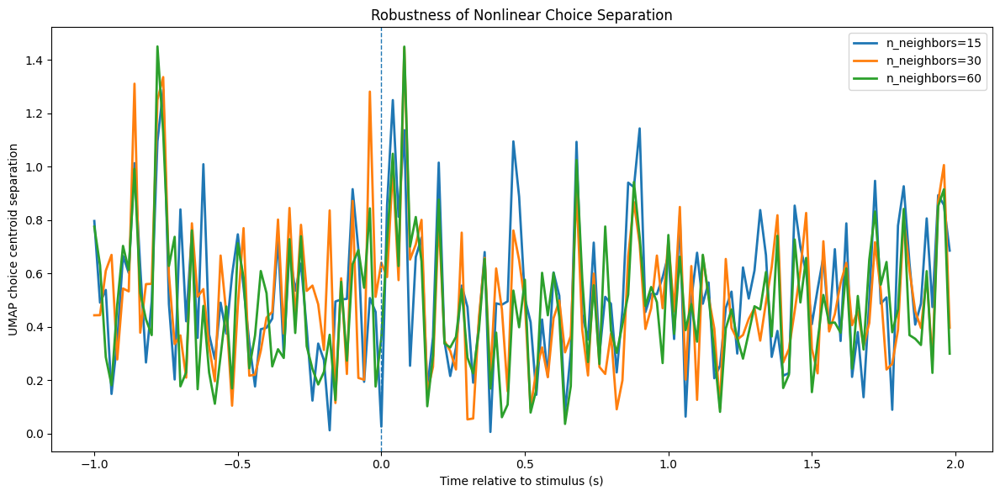

In [118]:
# ============================================================
# STEP 47C — UMAP robustness plot
# ============================================================

plt.figure(figsize=(12, 6))

for n_neighbors_value in neighbor_values:

    plt.plot(
        relative_time,
        umap_separation_summary[
            n_neighbors_value
        ],
        linewidth=2,
        label=f"n_neighbors={n_neighbors_value}"
    )

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "UMAP choice centroid separation"
)

plt.title(
    "Robustness of Nonlinear Choice Separation"
)

plt.legend()

plt.tight_layout()

plt.show()

**STEP 48A — Estimate effective neural dimensionality**

In [119]:
# ============================================================
# STEP 48A — PCA explained variance
# ============================================================

# Using 'ipca' defined and fitted in Step 19

explained_variance = ipca.explained_variance_ratio_

cumulative_variance = np.cumsum(
    explained_variance
)

print(
    "Number of PCA components:",
    len(explained_variance)
)

print("\nIndividual explained variance:")

for i, variance in enumerate(
    explained_variance,
    start=1
):
    print(
        f"PC{i}: "
        f"{variance:.6f} "
        f"({variance * 100:.2f}%)"
    )

print("\nCumulative explained variance:")

for i, variance in enumerate(
    cumulative_variance,
    start=1
):
    print(
        f"PC1-PC{i}: "
        f"{variance:.6f} "
        f"({variance * 100:.2f}%)"
    )

print("\nVariance thresholds:")

for threshold in [
    0.50,
    0.75,
    0.80,
    0.90,
    0.95
]:

    n_components_threshold = (
        np.argmax(
            cumulative_variance >= threshold
        ) + 1
    )

    print(
        f"{threshold * 100:.0f}% variance:",
        n_components_threshold,
        "components"
    )

Number of PCA components: 20

Individual explained variance:
PC1: 0.014372 (1.44%)
PC2: 0.013069 (1.31%)
PC3: 0.009241 (0.92%)
PC4: 0.006690 (0.67%)
PC5: 0.006169 (0.62%)
PC6: 0.004950 (0.49%)
PC7: 0.004106 (0.41%)
PC8: 0.003343 (0.33%)
PC9: 0.002232 (0.22%)
PC10: 0.001948 (0.19%)
PC11: 0.001889 (0.19%)
PC12: 0.001859 (0.19%)
PC13: 0.001546 (0.15%)
PC14: 0.001333 (0.13%)
PC15: 0.001236 (0.12%)
PC16: 0.001145 (0.11%)
PC17: 0.001002 (0.10%)
PC18: 0.000964 (0.10%)
PC19: 0.000950 (0.10%)
PC20: 0.000928 (0.09%)

Cumulative explained variance:
PC1-PC1: 0.014372 (1.44%)
PC1-PC2: 0.027441 (2.74%)
PC1-PC3: 0.036682 (3.67%)
PC1-PC4: 0.043371 (4.34%)
PC1-PC5: 0.049540 (4.95%)
PC1-PC6: 0.054490 (5.45%)
PC1-PC7: 0.058596 (5.86%)
PC1-PC8: 0.061939 (6.19%)
PC1-PC9: 0.064172 (6.42%)
PC1-PC10: 0.066120 (6.61%)
PC1-PC11: 0.068009 (6.80%)
PC1-PC12: 0.069868 (6.99%)
PC1-PC13: 0.071414 (7.14%)
PC1-PC14: 0.072747 (7.27%)
PC1-PC15: 0.073983 (7.40%)
PC1-PC16: 0.075129 (7.51%)
PC1-PC17: 0.076131 (7.61%)
PC1-PC

**STEP 48B — Correct the threshold calculation**

In [120]:
# ============================================================
# STEP 48B — Correct PCA variance thresholds
# ============================================================

print("\nVariance thresholds:")

for threshold in [
    0.50,
    0.75,
    0.80,
    0.90,
    0.95
]:

    above_threshold = np.where(
        cumulative_variance >= threshold
    )[0]

    if len(above_threshold) > 0:

        n_components_threshold = (
            above_threshold[0] + 1
        )

        print(
            f"{threshold * 100:.0f}% variance:",
            n_components_threshold,
            "components"
        )

    else:

        print(
            f"{threshold * 100:.0f}% variance:",
            "not reached within",
            len(explained_variance),
            "components"
        )


Variance thresholds:
50% variance: not reached within 20 components
75% variance: not reached within 20 components
80% variance: not reached within 20 components
90% variance: not reached within 20 components
95% variance: not reached within 20 components


**STEP 48C — Scree plot**

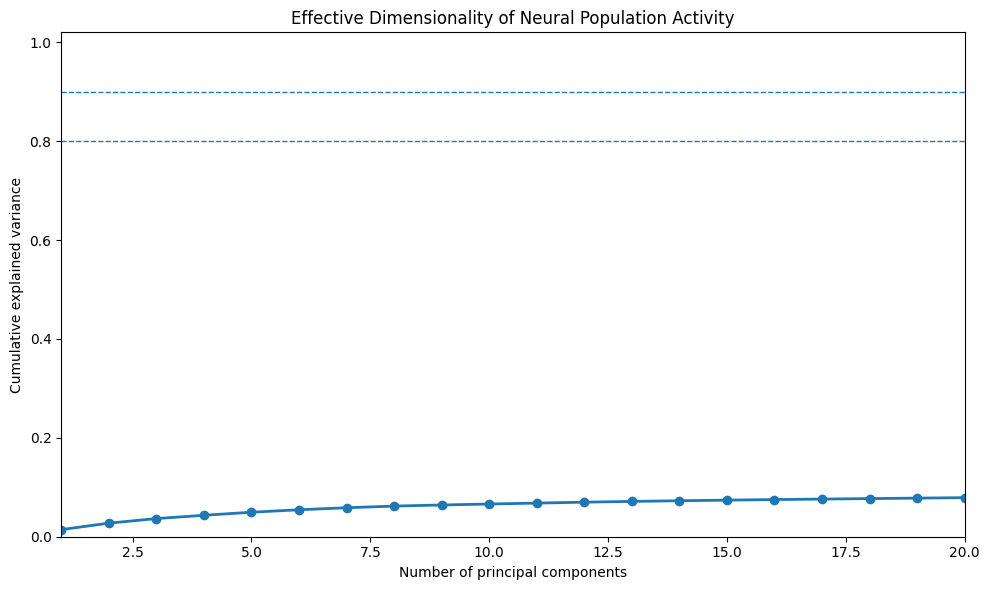

In [121]:
# ============================================================
# STEP 48C — PCA dimensionality plot
# ============================================================

plt.figure(figsize=(10, 6))

plt.plot(
    np.arange(
        1,
        len(explained_variance) + 1
    ),
    cumulative_variance,
    marker="o",
    linewidth=2
)

plt.axhline(
    0.80,
    linestyle="--",
    linewidth=1
)

plt.axhline(
    0.90,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Number of principal components"
)

plt.ylabel(
    "Cumulative explained variance"
)

plt.title(
    "Effective Dimensionality of Neural Population Activity"
)

plt.xlim(
    1,
    min(30, len(explained_variance))
)

plt.ylim(
    0,
    1.02
)

plt.tight_layout()

plt.show()

**STEP 48D — additional PCA diagnostic**

In [122]:
# ============================================================
# STEP 48C — PCA dimensionality diagnostic
# ============================================================

print("=" * 60)
print("PCA DIMENSIONALITY DIAGNOSTIC")
print("=" * 60)

print(
    "PCA components:",
    ipca.n_components_
)

print(
    "Explained variance sum:",
    ipca.explained_variance_ratio_.sum()
)

print(
    "Input feature dimension:",
    ipca.n_features_in_
)

print(
    "Number of samples seen:",
    getattr(
        ipca,
        "n_samples_seen_",
        "not available"
    )
)

print(
    "\nFirst 5 explained variance ratios:"
)

print(
    ipca.explained_variance_ratio_[:5]
)

print(
    "\nLast 5 explained variance ratios:"
)

print(
    ipca.explained_variance_ratio_[-5:]
)

PCA DIMENSIONALITY DIAGNOSTIC
PCA components: 20
Explained variance sum: 0.07897294820145134
Input feature dimension: 1052
Number of samples seen: 135133

First 5 explained variance ratios:
[0.01437177 0.01306911 0.00924091 0.0066896  0.00616885]

Last 5 explained variance ratios:
[0.0011453  0.00100215 0.00096439 0.00095022 0.00092761]


**STEP 49 — Neural trajectory speed**

In [123]:
# ============================================================
# STEP 49A — Neural trajectory speed
# ============================================================

N_TRAJECTORY_PCS = 10

trajectory_state = (
    binary_PC_bc[
        :,
        :,
        :N_TRAJECTORY_PCS
    ]
)

# Average population state across trials
mean_population_trajectory = (
    trajectory_state.mean(axis=0)
)

# Temporal derivative
trajectory_velocity = np.gradient(
    mean_population_trajectory,
    time_step,
    axis=0
)

# Euclidean speed
trajectory_speed = np.linalg.norm(
    trajectory_velocity,
    axis=1
)

print(
    "Trajectory speed shape:",
    trajectory_speed.shape
)

print(
    "Maximum trajectory speed:",
    trajectory_speed.max()
)

max_speed_idx = np.argmax(
    trajectory_speed
)

print(
    "Time of maximum trajectory speed:",
    relative_time[max_speed_idx],
    "seconds"
)

Trajectory speed shape: (150,)
Maximum trajectory speed: 78.3748
Time of maximum trajectory speed: 0.14 seconds


**STEP 49B — Plot trajectory speed**

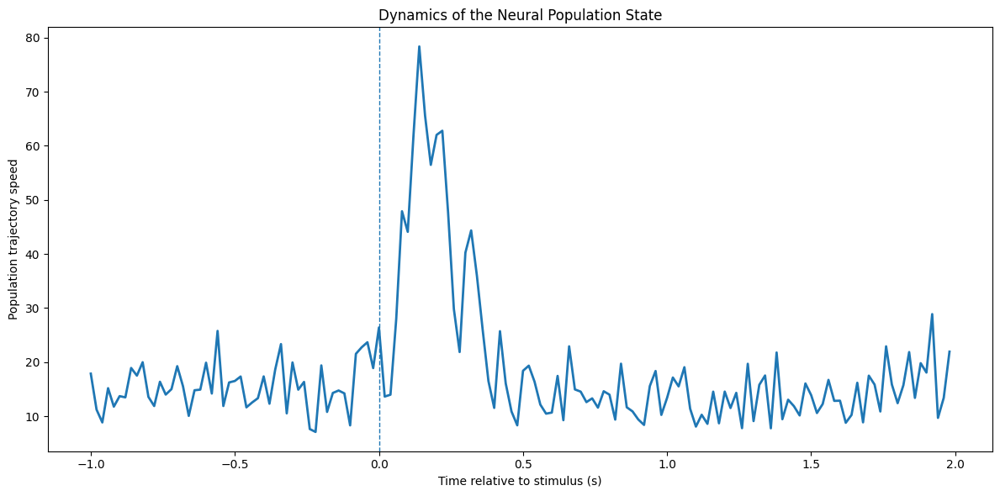

In [124]:
# ============================================================
# STEP 49B — Neural trajectory speed
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    trajectory_speed,
    linewidth=2
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Population trajectory speed"
)

plt.title(
    "Dynamics of the Neural Population State"
)

plt.tight_layout()

plt.show()

**STEP 50 — Choice-specific trajectory speed**

In [125]:
# ============================================================
# STEP 50 — Choice-specific trajectory speed
# ============================================================

choice_minus1_mask = (
    binary_labels == -1
)

choice_plus1_mask = (
    binary_labels == 1
)

trajectory_minus1 = (
    binary_PC_bc[
        choice_minus1_mask,
        :,
        :N_TRAJECTORY_PCS
    ].mean(axis=0)
)

trajectory_plus1 = (
    binary_PC_bc[
        choice_plus1_mask,
        :,
        :N_TRAJECTORY_PCS
    ].mean(axis=0)
)

velocity_minus1 = np.gradient(
    trajectory_minus1,
    time_step,
    axis=0
)

velocity_plus1 = np.gradient(
    trajectory_plus1,
    time_step,
    axis=0
)

speed_minus1 = np.linalg.norm(
    velocity_minus1,
    axis=1
)

speed_plus1 = np.linalg.norm(
    velocity_plus1,
    axis=1
)

print(
    "Choice -1 maximum speed:",
    speed_minus1.max()
)

print(
    "Choice +1 maximum speed:",
    speed_plus1.max()
)

Choice -1 maximum speed: 82.9188
Choice +1 maximum speed: 83.17674


**STEP 50B — Plot choice-specific dynamics**

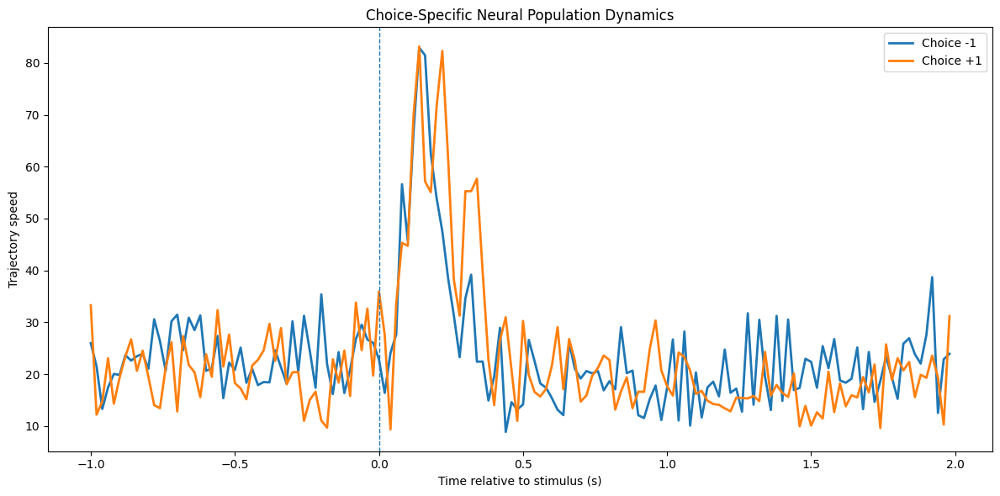

In [126]:
# ============================================================
# STEP 50B — Choice-specific trajectory speed
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    speed_minus1,
    linewidth=2,
    label="Choice -1"
)

plt.plot(
    relative_time,
    speed_plus1,
    linewidth=2,
    label="Choice +1"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Trajectory speed"
)

plt.title(
    "Choice-Specific Neural Population Dynamics"
)

plt.legend()

plt.tight_layout()

plt.show()

In [127]:
# ============================================================
# STEP 50C — Choice-specific trajectory speed difference
# ============================================================

speed_difference = (
    speed_plus1 -
    speed_minus1
)

print(
    "Maximum absolute speed difference:",
    f"{np.max(np.abs(speed_difference)):.4f}"
)

max_diff_idx = np.argmax(
    np.abs(speed_difference)
)

print(
    "Time of maximum speed difference:",
    f"{relative_time[max_diff_idx]:.3f} s"
)

print(
    "Speed difference at that time:",
    f"{speed_difference[max_diff_idx]:.4f}"
)

Maximum absolute speed difference: 35.2836
Time of maximum speed difference: 0.340 s
Speed difference at that time: 35.2836


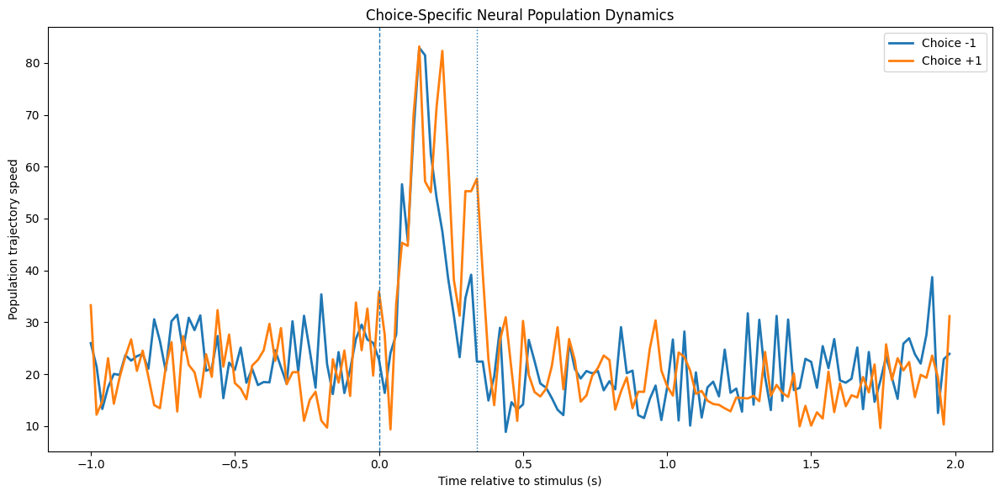

In [128]:
# ============================================================
# STEP 50D — Choice-specific trajectory dynamics
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    speed_minus1,
    linewidth=2,
    label="Choice -1"
)

plt.plot(
    relative_time,
    speed_plus1,
    linewidth=2,
    label="Choice +1"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.axvline(
    0.34,
    linestyle=":",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Population trajectory speed"
)

plt.title(
    "Choice-Specific Neural Population Dynamics"
)

plt.legend()

plt.tight_layout()

plt.show()

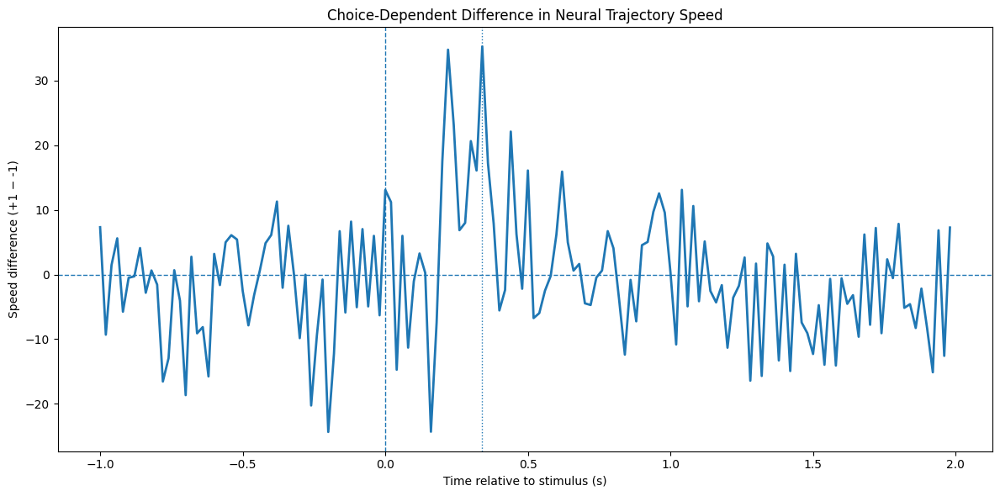

In [129]:
# ============================================================
# STEP 50E — Speed difference
# ============================================================

plt.figure(figsize=(12, 6))

plt.plot(
    relative_time,
    speed_difference,
    linewidth=2
)

plt.axhline(
    0,
    linestyle="--",
    linewidth=1
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.axvline(
    0.34,
    linestyle=":",
    linewidth=1
)

plt.xlabel(
    "Time relative to stimulus (s)"
)

plt.ylabel(
    "Speed difference (+1 − -1)"
)

plt.title(
    "Choice-Dependent Difference in Neural Trajectory Speed"
)

plt.tight_layout()

plt.show()

**STEP 51 — Prepare memory-efficient spike data**

In [130]:
# ============================================================
# STEP 51A — Network analysis data check (Fixed Variable Name)
# ============================================================

print("=" * 60)
print("NETWORK ANALYSIS DATA CHECK")
print("=" * 60)

print(
    "Spike times:",
    spike_times.shape,
    spike_times.dtype
)

print(
    "Spike clusters:",
    spike_clusters.shape,
    spike_clusters.dtype
)

print(
    "Number of unique clusters:",
    len(np.unique(spike_clusters))
)

print(
    "Recording duration:",
    spike_times.max() - spike_times.min(),
    "seconds"
)

# Using 'go_cue' from Step 23A
print(
    "Number of trials:",
    len(go_cue)
)

NETWORK ANALYSIS DATA CHECK
Spike times: (10017476, 1) float64
Spike clusters: (10017476, 1) int32
Number of unique clusters: 1085
Recording duration: 2702.6397945728804 seconds
Number of trials: 214


**STEP 51B — Define behavioral epochs**

In [131]:
# ============================================================
# STEP 51B — Define behavioral epochs
# ============================================================

EPOCHS = {
    "pre_stimulus": (-0.50, 0.00),
    "early_response": (0.00, 0.50),
    "late_response": (0.50, 1.50)
}

for name, (start, end) in EPOCHS.items():

    print(
        f"{name}: "
        f"{start:.2f} to {end:.2f} s "
        f"({end - start:.2f} s)"
    )

pre_stimulus: -0.50 to 0.00 s (0.50 s)
early_response: 0.00 to 0.50 s (0.50 s)
late_response: 0.50 to 1.50 s (1.00 s)


**STEP 51C — Use only valid behavioral trials**

In [132]:
# ============================================================
# STEP 51C — Valid behavioral trials (Fixed Variable Name)
# ============================================================

valid_trial_indices = np.where(
    np.isin(
        choices,
        [-1, 1]
    )
)[0]

valid_choices = choices[
    valid_trial_indices
]

# Using 'go_cue' from Step 23A
valid_go_cues = go_cue[
    valid_trial_indices
]

print(
    "Valid trials:",
    len(valid_trial_indices)
)

print(
    "Choice -1:",
    np.sum(valid_choices == -1)
)

print(
    "Choice +1:",
    np.sum(valid_choices == 1)
)

Valid trials: 140
Choice -1: 69
Choice +1: 71


**STEP 51D — Choose network bin size**

In [133]:
# ============================================================
# STEP 51D — Network binning parameters
# ============================================================

NETWORK_BIN = 0.10  # 100 ms

print(
    "Network bin size:",
    NETWORK_BIN,
    "seconds"
)

print(
    "Network bin size:",
    NETWORK_BIN * 1000,
    "ms"
)

Network bin size: 0.1 seconds
Network bin size: 100.0 ms


**STEP 51E — Build trial × neuron × time activity**

In [134]:
# ============================================================
# STEP 51E — Network analysis window
# ============================================================

NETWORK_START = -0.50
NETWORK_END = 1.50

network_duration = (
    NETWORK_END -
    NETWORK_START
)

n_network_bins = int(
    np.round(
        network_duration /
        NETWORK_BIN
    )
)

network_time = (
    NETWORK_START +
    (
        np.arange(n_network_bins) + 0.5
    ) * NETWORK_BIN
)

print(
    "Network duration:",
    network_duration,
    "seconds"
)

print(
    "Number of bins:",
    n_network_bins
)

print(
    "Network time range:",
    network_time[0],
    "to",
    network_time[-1]
)

Network duration: 2.0 seconds
Number of bins: 20
Network time range: -0.45 to 1.4500000000000002


**STEP 51F — Map cluster IDs to compact neuron indices**

In [135]:
# ============================================================
# STEP 51F — Compact neuron indexing
# ============================================================

unique_clusters = np.unique(
    spike_clusters
)

cluster_to_index = {
    int(cluster_id): idx
    for idx, cluster_id
    in enumerate(unique_clusters)
}

n_neurons = len(
    unique_clusters
)

print(
    "Number of neurons:",
    n_neurons
)

print(
    "First cluster IDs:",
    unique_clusters[:10]
)

Number of neurons: 1085
First cluster IDs: [0 1 2 3 4 5 6 7 8 9]


**STEP 51G — Allocate trial activity array**

In [136]:
# ============================================================
# STEP 51G — Allocate network activity
# ============================================================

network_activity = np.zeros(
    (
        len(valid_trial_indices),
        n_neurons,
        n_network_bins
    ),
    dtype=np.float32
)

print(
    "Network activity shape:",
    network_activity.shape
)

print(
    "Approximate memory:",
    network_activity.nbytes / (1024**2),
    "MB"
)

Network activity shape: (140, 1085, 20)
Approximate memory: 11.58905029296875 MB


In [137]:
# ============================================================
# STEP 51H — Populate network activity array
# ============================================================

# Get spike info in 1D for efficiency
stimes = spike_times.reshape(-1)
sclusters = spike_clusters.reshape(-1)

print("Populating network activity array...")

for i, trial_idx in enumerate(valid_trial_indices):
    # Center trial on go_cue (Step 23A)
    t_go = go_cue[trial_idx]
    t_start = t_go + NETWORK_START
    t_end = t_go + NETWORK_END

    # Mask spikes within the trial window
    trial_mask = (stimes >= t_start) & (stimes < t_end)
    trial_stimes = stimes[trial_mask]
    trial_sclusters = sclusters[trial_mask]

    # Map times to bin indices [0, n_network_bins-1]
    bin_indices = ((trial_stimes - t_start) / NETWORK_BIN).astype(np.int32)
    bin_indices = np.clip(bin_indices, 0, n_network_bins - 1)

    for neuron_idx, cluster_id in enumerate(unique_clusters):
        # Mask spikes for this specific neuron
        neuron_mask = (trial_sclusters == cluster_id)
        neuron_bins = bin_indices[neuron_mask]

        # Count spikes in each bin
        counts = np.bincount(neuron_bins, minlength=n_network_bins)
        network_activity[i, neuron_idx, :] = counts.astype(np.float32)

    if (i + 1) % 20 == 0:
        print(f"Processed {i+1} / {len(valid_trial_indices)} trials")

print("\nNetwork activity population complete.")
print("Final Shape:", network_activity.shape)

Populating network activity array...
Processed 20 / 140 trials
Processed 40 / 140 trials
Processed 60 / 140 trials
Processed 80 / 140 trials
Processed 100 / 140 trials
Processed 120 / 140 trials
Processed 140 / 140 trials

Network activity population complete.
Final Shape: (140, 1085, 20)


**Step 52 — Basic network activity quality check**

In [138]:
# ============================================================
# STEP 52A — Network activity quality check
# ============================================================

print("=" * 60)
print("NETWORK ACTIVITY QUALITY CHECK")
print("=" * 60)

print(
    "Shape:",
    network_activity.shape
)

print(
    "Data type:",
    network_activity.dtype
)

print(
    "Minimum spike count:",
    network_activity.min()
)

print(
    "Maximum spike count:",
    network_activity.max()
)

print(
    "Mean spike count per bin:",
    network_activity.mean()
)

print(
    "Total spike counts in trial windows:",
    network_activity.sum()
)

# Fraction of completely silent neuron-trial combinations
silent_fraction = np.mean(
    network_activity.sum(axis=2) == 0
)

print(
    "Fraction of silent neuron-trial combinations:",
    f"{silent_fraction:.4f}"
)

NETWORK ACTIVITY QUALITY CHECK
Shape: (140, 1085, 20)
Data type: float32
Minimum spike count: 0.0
Maximum spike count: 32.0
Mean spike count per bin: 0.31444272
Total spike counts in trial windows: 955277.0
Fraction of silent neuron-trial combinations: 0.3450


**Step 52B — Identify neurons with sufficient activity**

In [139]:
# ============================================================
# STEP 52B — Identify active neurons
# ============================================================

neuron_total_counts = network_activity.sum(
    axis=(0, 2)
)

active_neuron_mask = (
    neuron_total_counts > 0
)

active_neuron_indices = np.where(
    active_neuron_mask
)[0]

print(
    "Original neurons:",
    network_activity.shape[1]
)

print(
    "Active neurons:",
    len(active_neuron_indices)
)

print(
    "Removed completely silent neurons:",
    np.sum(~active_neuron_mask)
)

Original neurons: 1085
Active neurons: 1079
Removed completely silent neurons: 6


**Step 53 — Construct epoch-specific activity**

In [140]:
# ============================================================
# STEP 53A — Epoch-specific neural activity
# ============================================================

epoch_bin_masks = {}

for epoch_name, (start, end) in EPOCHS.items():

    epoch_bin_masks[epoch_name] = (
        (network_time >= start) &
        (network_time < end)
    )

    print(
        epoch_name,
        "bins:",
        np.sum(epoch_bin_masks[epoch_name])
    )

pre_stimulus bins: 5
early_response bins: 5
late_response bins: 10


In [141]:
# ============================================================
# STEP 53B — Average firing activity by epoch
# ============================================================

epoch_activity = {}

for epoch_name, bin_mask in epoch_bin_masks.items():

    epoch_activity[epoch_name] = (
        network_activity[:, :, bin_mask]
        .mean(axis=2)
    )

    print(
        epoch_name,
        "shape:",
        epoch_activity[epoch_name].shape
    )

pre_stimulus shape: (140, 1085)
early_response shape: (140, 1085)
late_response shape: (140, 1085)


**Step 54 — First functional connectivity analysis**

In [142]:
# ============================================================
# STEP 54A — Functional connectivity matrices
# ============================================================

functional_connectivity = {}

for epoch_name, activity in epoch_activity.items():

    print(
        f"Computing connectivity: {epoch_name}"
    )

    fc = np.corrcoef(
        activity[:, active_neuron_mask],
        rowvar=False
    )

    functional_connectivity[epoch_name] = fc

    print(
        "Shape:",
        fc.shape
    )

Computing connectivity: pre_stimulus
Shape: (1079, 1079)
Computing connectivity: early_response
Shape: (1079, 1079)
Computing connectivity: late_response
Shape: (1079, 1079)


/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


**Step 54B — Inspect the connectivity distributions**

In [143]:
# ============================================================
# STEP 54B — Functional connectivity statistics
# ============================================================

for epoch_name, fc in functional_connectivity.items():

    # Extract upper triangle, excluding diagonal
    upper_idx = np.triu_indices_from(
        fc,
        k=1
    )

    values = fc[upper_idx]

    print("\n" + "=" * 50)
    print(epoch_name)

    print(
        "Mean correlation:",
        f"{np.mean(values):.4f}"
    )

    print(
        "Median correlation:",
        f"{np.median(values):.4f}"
    )

    print(
        "Std correlation:",
        f"{np.std(values):.4f}"
    )

    print(
        "Minimum correlation:",
        f"{np.min(values):.4f}"
    )

    print(
        "Maximum correlation:",
        f"{np.max(values):.4f}"
    )


pre_stimulus
Mean correlation: nan
Median correlation: nan
Std correlation: nan
Minimum correlation: nan
Maximum correlation: nan

early_response
Mean correlation: nan
Median correlation: nan
Std correlation: nan
Minimum correlation: nan
Maximum correlation: nan

late_response
Mean correlation: nan
Median correlation: nan
Std correlation: nan
Minimum correlation: nan
Maximum correlation: nan


In [144]:
# ============================================================
# STEP 54C — Robust functional connectivity
# ============================================================

functional_connectivity = {}
epoch_active_neurons = {}

for epoch_name, activity in epoch_activity.items():

    print("\n" + "=" * 60)
    print(f"Processing: {epoch_name}")

    # Variance across trials for each neuron
    neuron_variance = np.var(
        activity,
        axis=0
    )

    # Keep neurons with non-zero variance
    valid_neuron_mask = (
        neuron_variance > 1e-12
    )

    valid_indices = np.where(
        valid_neuron_mask
    )[0]

    epoch_active_neurons[epoch_name] = (
        valid_indices
    )

    print(
        "Original neurons:",
        activity.shape[1]
    )

    print(
        "Non-zero variance neurons:",
        len(valid_indices)
    )

    print(
        "Excluded zero-variance neurons:",
        np.sum(~valid_neuron_mask)
    )

    # Extract valid neurons
    valid_activity = activity[
        :,
        valid_neuron_mask
    ]

    # Calculate Pearson correlation
    fc = np.corrcoef(
        valid_activity,
        rowvar=False
    )

    functional_connectivity[
        epoch_name
    ] = fc

    print(
        "Connectivity matrix:",
        fc.shape
    )

    # Check for NaNs
    print(
        "NaN entries:",
        np.isnan(fc).sum()
    )


Processing: pre_stimulus
Original neurons: 1085
Non-zero variance neurons: 1063
Excluded zero-variance neurons: 22
Connectivity matrix: (1063, 1063)
NaN entries: 0

Processing: early_response
Original neurons: 1085
Non-zero variance neurons: 1048
Excluded zero-variance neurons: 37
Connectivity matrix: (1048, 1048)
NaN entries: 0

Processing: late_response
Original neurons: 1085
Non-zero variance neurons: 1068
Excluded zero-variance neurons: 17
Connectivity matrix: (1068, 1068)
NaN entries: 0


In [145]:
# ============================================================
# STEP 54D — Connectivity statistics
# ============================================================

for epoch_name, fc in functional_connectivity.items():

    upper_idx = np.triu_indices_from(
        fc,
        k=1
    )

    values = fc[upper_idx]

    # Remove any unexpected NaNs
    values = values[
        np.isfinite(values)
    ]

    print("\n" + "=" * 50)
    print(epoch_name)

    print(
        "Number of neuron pairs:",
        len(values)
    )

    print(
        "Mean correlation:",
        f"{np.mean(values):.4f}"
    )

    print(
        "Median correlation:",
        f"{np.median(values):.4f}"
    )

    print(
        "Std correlation:",
        f"{np.std(values):.4f}"
    )

    print(
        "Minimum correlation:",
        f"{np.min(values):.4f}"
    )

    print(
        "Maximum correlation:",
        f"{np.max(values):.4f}"
    )

    print(
        "Positive correlations:",
        f"{np.mean(values > 0) * 100:.2f}%"
    )

    print(
        "Correlations > 0.3:",
        f"{np.mean(values > 0.3) * 100:.2f}%"
    )


pre_stimulus
Number of neuron pairs: 564453
Mean correlation: 0.0142
Median correlation: -0.0045
Std correlation: 0.1413
Minimum correlation: -0.6927
Maximum correlation: 1.0000
Positive correlations: 48.62%
Correlations > 0.3: 3.68%

early_response
Number of neuron pairs: 548628
Mean correlation: 0.0156
Median correlation: -0.0043
Std correlation: 0.1266
Minimum correlation: -0.6516
Maximum correlation: 1.0000
Positive correlations: 48.56%
Correlations > 0.3: 2.80%

late_response
Number of neuron pairs: 569778
Mean correlation: 0.0145
Median correlation: -0.0039
Std correlation: 0.1501
Minimum correlation: -0.7247
Maximum correlation: 1.0000
Positive correlations: 48.85%
Correlations > 0.3: 4.31%


**STEP 55A — Functional network construction + Louvain communities**

In [146]:
# ============================================================
# STEP 55A — Functional Network Construction & Community Detection
# ============================================================

import numpy as np
import networkx as nx
import community.community_louvain as community_louvain

# ------------------------------------------------------------
# Exploratory correlation threshold
# ------------------------------------------------------------

CORR_THRESHOLD = 0.30

print("=" * 70)
print("FUNCTIONAL NETWORK ANALYSIS")
print("=" * 70)

print(
    f"Correlation threshold: r > {CORR_THRESHOLD}"
)

# Store results separately for each behavioral epoch
network_graphs = {}
network_partitions = {}
network_metrics = {}
network_hub_scores = {}

for epoch_name, connectivity_matrix in functional_connectivity.items():

    print("\n" + "=" * 60)
    print(f"Epoch: {epoch_name}")
    print("=" * 60)

    # --------------------------------------------------------
    # Remove diagonal/self-connections
    # --------------------------------------------------------

    adj_matrix = np.where(
        connectivity_matrix > CORR_THRESHOLD,
        connectivity_matrix,
        0.0
    )

    np.fill_diagonal(
        adj_matrix,
        0.0
    )

    # --------------------------------------------------------
    # Build graph
    # --------------------------------------------------------

    G = nx.from_numpy_array(
        adj_matrix
    )

    # Remove isolated neurons for community detection
    G_connected = G.subgraph(
        [
            node
            for node, degree
            in G.degree()
            if degree > 0
        ]
    ).copy()

    # --------------------------------------------------------
    # Basic network statistics
    # --------------------------------------------------------

    n_nodes = G.number_of_nodes()
    n_edges = G.number_of_edges()

    possible_edges = (
        n_nodes * (n_nodes - 1)
    ) / 2

    density = (
        n_edges /
        possible_edges
        if possible_edges > 0
        else 0
    )

    # --------------------------------------------------------
    # Degree
    # --------------------------------------------------------

    degree_values = np.array(
        [
            degree
            for _, degree in G.degree()
        ]
    )

    # --------------------------------------------------------
    # Weighted degree / strength
    # --------------------------------------------------------

    strength_values = np.array(
        [
            sum(
                weight_data.get(
                    "weight",
                    0
                )
                for _, weight_data
                in G[node].items()
            )
            for node in G.nodes()
        ]
    )

    # --------------------------------------------------------
    # Louvain community detection
    # --------------------------------------------------------

    if G_connected.number_of_edges() > 0:

        partition = (
            community_louvain.best_partition(
                G_connected,
                weight="weight",
                random_state=42
            )
        )

        modularity = (
            community_louvain.modularity(
                partition,
                G_connected,
                weight="weight"
            )
        )

        n_communities = len(
            np.unique(
                list(
                    partition.values()
                )
            )
        )

    else:

        partition = {}
        modularity = np.nan
        n_communities = 0

    # --------------------------------------------------------
    # Store results
    # --------------------------------------------------------

    network_graphs[
        epoch_name
    ] = G

    network_partitions[
        epoch_name
    ] = partition

    network_hub_scores[
        epoch_name
    ] = strength_values

    network_metrics[
        epoch_name
    ] = {
        "nodes": n_nodes,
        "edges": n_edges,
        "density": density,
        "mean_degree": degree_values.mean(),
        "max_degree": degree_values.max(),
        "mean_strength": strength_values.mean(),
        "max_strength": strength_values.max(),
        "communities": n_communities,
        "modularity": modularity
    }

    # --------------------------------------------------------
    # Print results
    # --------------------------------------------------------

    print(
        "Nodes:",
        n_nodes
    )

    print(
        "Edges:",
        n_edges
    )

    print(
        "Network density:",
        f"{density:.4f}"
    )

    print(
        "Mean degree:",
        f"{degree_values.mean():.2f}"
    )

    print(
        "Maximum degree:",
        degree_values.max()
    )

    print(
        "Mean weighted strength:",
        f"{strength_values.mean():.4f}"
    )

    print(
        "Maximum weighted strength:",
        f"{strength_values.max():.4f}"
    )

    print(
        "Number of communities:",
        n_communities
    )

    print(
        "Louvain modularity:",
        f"{modularity:.4f}"
    )

FUNCTIONAL NETWORK ANALYSIS
Correlation threshold: r > 0.3

Epoch: pre_stimulus
Nodes: 1063
Edges: 20752
Network density: 0.0368
Mean degree: 39.04
Maximum degree: 201
Mean weighted strength: 15.6736
Maximum weighted strength: 99.5878
Number of communities: 8
Louvain modularity: 0.4982

Epoch: early_response
Nodes: 1048
Edges: 15365
Network density: 0.0280
Mean degree: 29.32
Maximum degree: 156
Mean weighted strength: 11.7209
Maximum weighted strength: 70.2282
Number of communities: 10
Louvain modularity: 0.5069

Epoch: late_response
Nodes: 1068
Edges: 24566
Network density: 0.0431
Mean degree: 46.00
Maximum degree: 262
Mean weighted strength: 18.2822
Maximum weighted strength: 121.1906
Number of communities: 6
Louvain modularity: 0.4417


**Step 55B — Network summary**

In [147]:
# ============================================================
# STEP 55B — Compare Network Properties Across Epochs
# ============================================================

print("=" * 70)
print("NETWORK SUMMARY")
print("=" * 70)

for epoch_name, metrics in network_metrics.items():

    print("\n" + epoch_name)

    print(
        f"  Nodes:              {metrics['nodes']}"
    )

    print(
        f"  Edges:              {metrics['edges']}"
    )

    print(
        f"  Density:            {metrics['density']:.4f}"
    )

    print(
        f"  Mean degree:        {metrics['mean_degree']:.2f}"
    )

    print(
        f"  Maximum degree:     {metrics['max_degree']}"
    )

    print(
        f"  Mean strength:      {metrics['mean_strength']:.4f}"
    )

    print(
        f"  Maximum strength:   {metrics['max_strength']:.4f}"
    )

    print(
        f"  Communities:        {metrics['communities']}"
    )

    print(
        f"  Modularity Q:       {metrics['modularity']:.4f}"
    )

NETWORK SUMMARY

pre_stimulus
  Nodes:              1063
  Edges:              20752
  Density:            0.0368
  Mean degree:        39.04
  Maximum degree:     201
  Mean strength:      15.6736
  Maximum strength:   99.5878
  Communities:        8
  Modularity Q:       0.4982

early_response
  Nodes:              1048
  Edges:              15365
  Density:            0.0280
  Mean degree:        29.32
  Maximum degree:     156
  Mean strength:      11.7209
  Maximum strength:   70.2282
  Communities:        10
  Modularity Q:       0.5069

late_response
  Nodes:              1068
  Edges:              24566
  Density:            0.0431
  Mean degree:        46.00
  Maximum degree:     262
  Mean strength:      18.2822
  Maximum strength:   121.1906
  Communities:        6
  Modularity Q:       0.4417


**Step 55C — Identify hub neurons**

In [148]:
# ============================================================
# STEP 55C — Identify Functional Hub Neurons
# ============================================================

top_hubs = {}

for epoch_name, G in network_graphs.items():

    strength = np.array([
        sum(
            data.get("weight", 0)
            for _, data in G[node].items()
        )
        for node in G.nodes()
    ])

    nodes = np.array(
        list(G.nodes())
    )

    # Sort by weighted strength
    sorted_idx = np.argsort(
        strength
    )[::-1]

    top_indices = sorted_idx[:10]

    top_nodes = nodes[
        top_indices
    ]

    top_strengths = strength[
        top_indices
    ]

    top_hubs[
        epoch_name
    ] = (
        top_nodes,
        top_strengths
    )

    print("\n" + "=" * 60)
    print(
        f"Top 10 functional hubs — {epoch_name}"
    )

    for rank, (node, score) in enumerate(
        zip(
            top_nodes,
            top_strengths
        ),
        start=1
    ):

        print(
            f"{rank:2d}. Neuron {node:4d} "
            f"strength = {score:.4f}"
        )


Top 10 functional hubs — pre_stimulus
 1. Neuron  947 strength = 99.5878
 2. Neuron  997 strength = 92.0045
 3. Neuron  982 strength = 88.1814
 4. Neuron  837 strength = 83.3627
 5. Neuron  873 strength = 81.4620
 6. Neuron  886 strength = 81.4317
 7. Neuron 1001 strength = 78.3212
 8. Neuron  176 strength = 77.8191
 9. Neuron  725 strength = 75.8922
10. Neuron  698 strength = 75.5598

Top 10 functional hubs — early_response
 1. Neuron  820 strength = 70.2282
 2. Neuron  932 strength = 67.5120
 3. Neuron  345 strength = 66.0304
 4. Neuron  842 strength = 65.4546
 5. Neuron  858 strength = 63.6055
 6. Neuron  404 strength = 62.6232
 7. Neuron  174 strength = 61.3842
 8. Neuron  959 strength = 61.0088
 9. Neuron  501 strength = 59.9817
10. Neuron  486 strength = 59.8980

Top 10 functional hubs — late_response
 1. Neuron  244 strength = 121.1906
 2. Neuron  668 strength = 109.4926
 3. Neuron  463 strength = 108.2261
 4. Neuron  449 strength = 106.8787
 5. Neuron  619 strength = 103.0840


**Step 55D — Correct modular connectivity visualization**

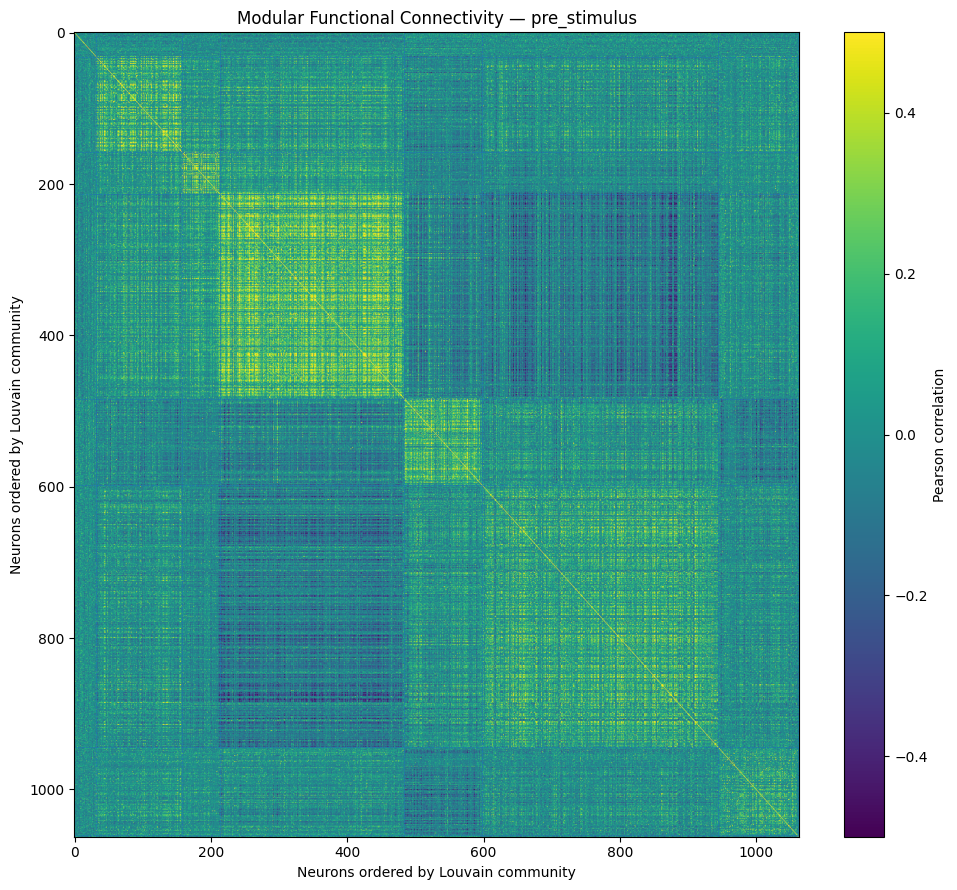

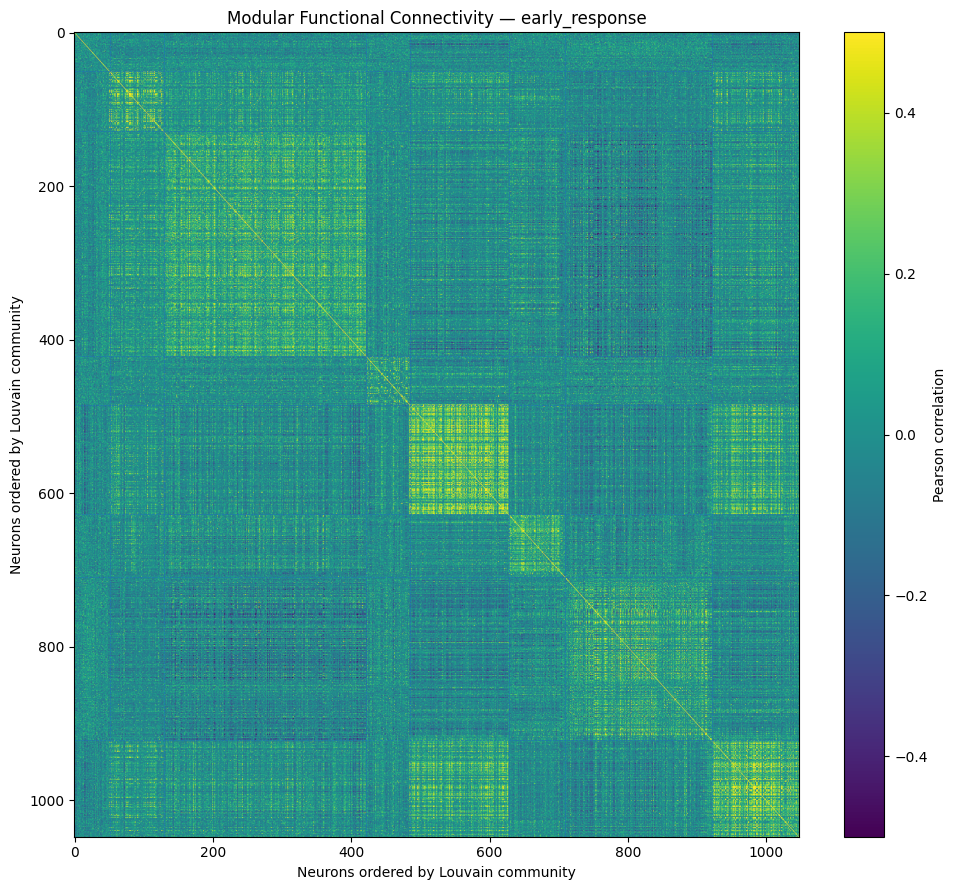

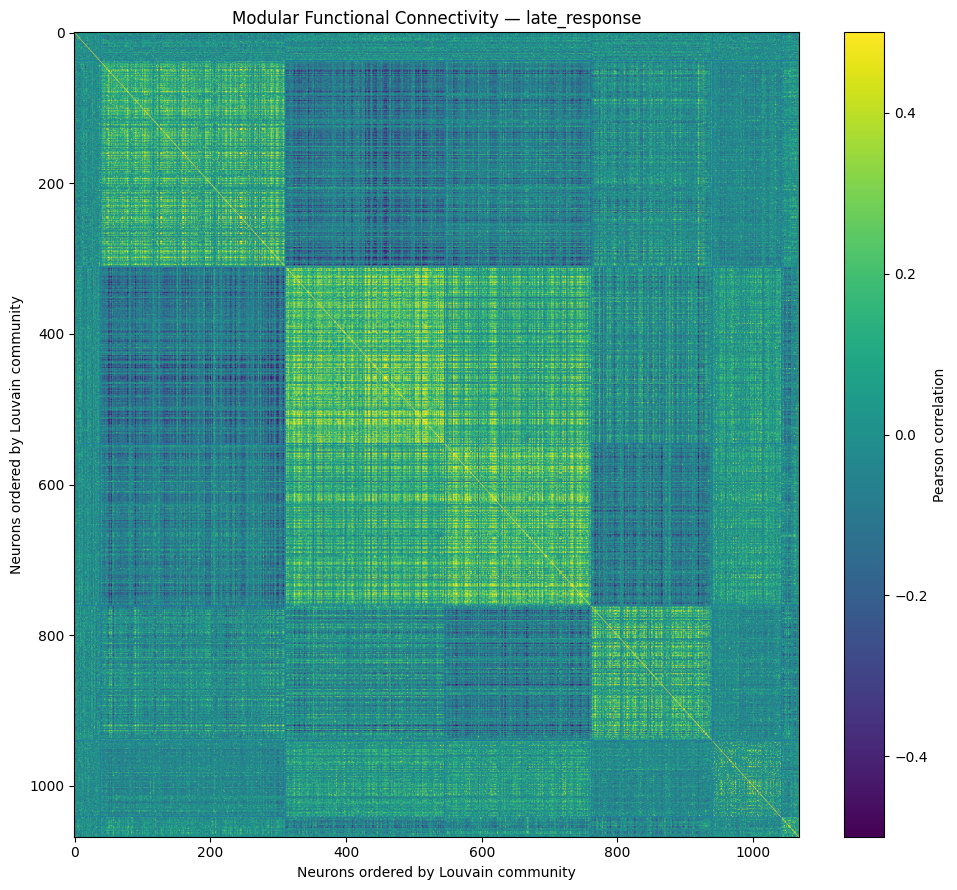

In [149]:
# ============================================================
# STEP 55D — Visualize Modular Functional Connectivity
# ============================================================

import matplotlib.pyplot as plt

for epoch_name in functional_connectivity.keys():

    connectivity_matrix = (
        functional_connectivity[
            epoch_name
        ]
    )

    partition = (
        network_partitions[
            epoch_name
        ]
    )

    # --------------------------------------------------------
    # Only neurons participating in the graph
    # --------------------------------------------------------

    graph_nodes = np.array(
        list(
            network_graphs[
                epoch_name
            ].nodes()
        )
    )

    # Keep nodes ordered by community
    community_values = np.array([
        partition.get(
            int(node),
            -1
        )
        for node in graph_nodes
    ])

    sorted_order = np.argsort(
        community_values
    )

    ordered_nodes = graph_nodes[
        sorted_order
    ]

    ordered_matrix = connectivity_matrix[
        ordered_nodes,
        :
    ][:,
        ordered_nodes
    ]

    # --------------------------------------------------------
    # Plot
    # --------------------------------------------------------

    plt.figure(
        figsize=(10, 9)
    )

    plt.imshow(
        ordered_matrix,
        aspect="auto",
        vmin=-0.5,
        vmax=0.5
    )

    plt.colorbar(
        label="Pearson correlation"
    )

    # --------------------------------------------------------
    # Community boundaries
    # --------------------------------------------------------

    ordered_communities = (
        community_values[
            sorted_order
        ]
    )

    unique_communities = (
        np.unique(
            ordered_communities
        )
    )

    boundary = 0

    for community_id in unique_communities:

        size = np.sum(
            ordered_communities ==
            community_id
        )

        if size > 5:

            plt.axvline(
                boundary + size - 0.5,
                linestyle="--",
                linewidth=0.5
            )

            plt.axhline(
                boundary + size - 0.5,
                linestyle="--",
                linewidth=0.5
            )

        boundary += size

    plt.title(
        "Modular Functional Connectivity — "
        + epoch_name
    )

    plt.xlabel(
        "Neurons ordered by Louvain community"
    )

    plt.ylabel(
        "Neurons ordered by Louvain community"
    )

    plt.tight_layout()

    plt.show()

**Step 56 — Common neuron population**

In [150]:
# ============================================================
# STEP 56A — Common neuron population across epochs
# ============================================================

print("=" * 70)
print("COMMON NEURON POPULATION")
print("=" * 70)

common_neuron_indices = np.arange(1085)

for epoch_name in EPOCHS.keys():

    valid_indices = (
        epoch_active_neurons[epoch_name]
    )

    common_neuron_indices = np.intersect1d(
        common_neuron_indices,
        valid_indices
    )

    print(
        f"After {epoch_name}: "
        f"{len(common_neuron_indices)} neurons"
    )

print(
    "\nFinal common neuron population:",
    len(common_neuron_indices)
)

COMMON NEURON POPULATION
After pre_stimulus: 1063 neurons
After early_response: 1043 neurons
After late_response: 1039 neurons

Final common neuron population: 1039


**Step 56B — Rebuild connectivity using the same neurons**

In [151]:
# ============================================================
# STEP 56B — Common-neuron functional connectivity
# ============================================================

common_connectivity = {}

for epoch_name in EPOCHS.keys():

    activity = epoch_activity[
        epoch_name
    ][:, common_neuron_indices]

    # Safety check
    variance = np.var(
        activity,
        axis=0
    )

    print(
        epoch_name,
        "minimum variance:",
        variance.min()
    )

    fc = np.corrcoef(
        activity,
        rowvar=False
    )

    common_connectivity[
        epoch_name
    ] = fc

    print(
        epoch_name,
        "connectivity shape:",
        fc.shape,
        "NaNs:",
        np.isnan(fc).sum()
    )

pre_stimulus minimum variance: 0.00028367346
pre_stimulus connectivity shape: (1039, 1039) NaNs: 0
early_response minimum variance: 0.00028367346
early_response connectivity shape: (1039, 1039) NaNs: 0
late_response minimum variance: 7.0918366e-05
late_response connectivity shape: (1039, 1039) NaNs: 0


**Step 57 — Compare correlation distributions**

In [152]:
# ============================================================
# STEP 57A — Common-population correlation statistics
# ============================================================

common_corr_stats = {}

for epoch_name, fc in common_connectivity.items():

    upper_idx = np.triu_indices_from(
        fc,
        k=1
    )

    values = fc[
        upper_idx
    ]

    common_corr_stats[
        epoch_name
    ] = {
        "mean": np.mean(values),
        "median": np.median(values),
        "std": np.std(values),
        "positive_fraction": np.mean(values > 0),
        "above_03": np.mean(values > 0.3)
    }

    print("\n" + "=" * 60)
    print(epoch_name)

    print(
        "Mean r:",
        f"{np.mean(values):.5f}"
    )

    print(
        "Median r:",
        f"{np.median(values):.5f}"
    )

    print(
        "Std r:",
        f"{np.std(values):.5f}"
    )

    print(
        "Positive correlations:",
        f"{100*np.mean(values > 0):.2f}%"
    )

    print(
        "r > 0.3:",
        f"{100*np.mean(values > 0.3):.2f}%"
    )


pre_stimulus
Mean r: 0.01426
Median r: -0.00279
Std r: 0.14243
Positive correlations: 49.14%
r > 0.3: 3.71%

early_response
Mean r: 0.01571
Median r: -0.00356
Std r: 0.12703
Positive correlations: 48.81%
r > 0.3: 2.82%

late_response
Mean r: 0.01508
Median r: -0.00183
Std r: 0.15265
Positive correlations: 49.47%
r > 0.3: 4.48%


**Step 58 — Rebuild the three networks on identical neurons**

In [153]:
# ============================================================
# STEP 58A — Common-population network construction
# ============================================================

common_networks = {}
common_network_metrics = {}

CORR_THRESHOLD = 0.30

for epoch_name, fc in common_connectivity.items():

    adj_matrix = np.where(
        fc > CORR_THRESHOLD,
        fc,
        0.0
    )

    np.fill_diagonal(
        adj_matrix,
        0
    )

    G = nx.from_numpy_array(
        adj_matrix
    )

    n_nodes = G.number_of_nodes()
    n_edges = G.number_of_edges()

    possible_edges = (
        n_nodes * (n_nodes - 1)
    ) / 2

    density = (
        n_edges / possible_edges
    )

    degree = np.array([
        d
        for _, d in G.degree()
    ])

    strength = np.array([
        sum(
            data.get("weight", 0)
            for _, data in G[node].items()
        )
        for node in G.nodes()
    ])

    # Community detection
    non_isolated_nodes = [
        node
        for node, d in G.degree()
        if d > 0
    ]

    G_nonisolated = G.subgraph(
        non_isolated_nodes
    ).copy()

    partition = (
        community_louvain.best_partition(
            G_nonisolated,
            weight="weight",
            random_state=42
        )
    )

    modularity = (
        community_louvain.modularity(
            partition,
            G_nonisolated,
            weight="weight"
        )
    )

    n_communities = len(
        np.unique(
            list(partition.values())
        )
    )

    common_networks[
        epoch_name
    ] = G

    common_network_metrics[
        epoch_name
    ] = {
        "nodes": n_nodes,
        "edges": n_edges,
        "density": density,
        "mean_degree": degree.mean(),
        "max_degree": degree.max(),
        "mean_strength": strength.mean(),
        "max_strength": strength.max(),
        "communities": n_communities,
        "modularity": modularity
    }

    print("\n" + "=" * 60)
    print(epoch_name)

    print(
        "Nodes:",
        n_nodes
    )

    print(
        "Edges:",
        n_edges
    )

    print(
        "Density:",
        f"{density:.4f}"
    )

    print(
        "Mean degree:",
        f"{degree.mean():.2f}"
    )

    print(
        "Mean strength:",
        f"{strength.mean():.4f}"
    )

    print(
        "Communities:",
        n_communities
    )

    print(
        "Modularity:",
        f"{modularity:.4f}"
    )


pre_stimulus
Nodes: 1039
Edges: 20006
Density: 0.0371
Mean degree: 38.51
Mean strength: 15.4249
Communities: 7
Modularity: 0.5006

early_response
Nodes: 1039
Edges: 15193
Density: 0.0282
Mean degree: 29.25
Mean strength: 11.6856
Communities: 9
Modularity: 0.5123

late_response
Nodes: 1039
Edges: 24179
Density: 0.0448
Mean degree: 46.54
Mean strength: 18.4923
Communities: 5
Modularity: 0.4414


**Step 59 — Most important network result: network density change**

In [154]:
# ============================================================
# STEP 59A — Network density changes
# ============================================================

pre_density = common_network_metrics[
    "pre_stimulus"
]["density"]

early_density = common_network_metrics[
    "early_response"
]["density"]

late_density = common_network_metrics[
    "late_response"
]["density"]

print("=" * 60)
print("NETWORK DENSITY CHANGES")
print("=" * 60)

print(
    "Pre-stimulus:",
    f"{pre_density:.4f}"
)

print(
    "Early response:",
    f"{early_density:.4f}"
)

print(
    "Late response:",
    f"{late_density:.4f}"
)

print(
    "\nEarly vs pre:",
    f"{100*(early_density/pre_density - 1):.2f}%"
)

print(
    "Late vs pre:",
    f"{100*(late_density/pre_density - 1):.2f}%"
)

print(
    "Late vs early:",
    f"{100*(late_density/early_density - 1):.2f}%"
)

NETWORK DENSITY CHANGES
Pre-stimulus: 0.0371
Early response: 0.0282
Late response: 0.0448

Early vs pre: -24.06%
Late vs pre: 20.86%
Late vs early: 59.15%


**Step 60 — Test whether network organization changes with choice**

**Step 60A — Choice-specific epoch activity**

In [155]:
# ============================================================
# STEP 60A — Choice-specific network activity
# ============================================================

choice_activity = {}

choice_masks = {
    "-1": binary_labels == -1,
    "+1": binary_labels == 1
}

for choice_name, mask in choice_masks.items():

    print("\n" + "=" * 60)
    print("Choice:", choice_name)

    choice_activity[choice_name] = {}

    for epoch_name in EPOCHS.keys():

        activity = (
            epoch_activity[epoch_name]
            [mask, :][:, common_neuron_indices]
        )

        choice_activity[
            choice_name
        ][epoch_name] = activity

        print(
            epoch_name,
            "shape:",
            activity.shape
        )


Choice: -1
pre_stimulus shape: (69, 1039)
early_response shape: (69, 1039)
late_response shape: (69, 1039)

Choice: +1
pre_stimulus shape: (71, 1039)
early_response shape: (71, 1039)
late_response shape: (71, 1039)


**Step 60B — Choice-specific functional connectivity**

In [156]:
# ============================================================
# STEP 60B — Choice-specific functional connectivity
# ============================================================

choice_connectivity = {}

for choice_name in choice_masks.keys():

    choice_connectivity[
        choice_name
    ] = {}

    for epoch_name in EPOCHS.keys():

        activity = choice_activity[
            choice_name
        ][epoch_name]

        # Remove zero-variance neurons within this
        # choice × epoch combination
        variance = np.var(
            activity,
            axis=0
        )

        valid_mask = (
            variance > 1e-12
        )

        valid_activity = (
            activity[:, valid_mask]
        )

        fc = np.corrcoef(
            valid_activity,
            rowvar=False
        )

        choice_connectivity[
            choice_name
        ][epoch_name] = fc

        print(
            choice_name,
            "|",
            epoch_name,
            "| neurons:",
            valid_activity.shape[1],
            "| shape:",
            fc.shape,
            "| NaNs:",
            np.isnan(fc).sum()
        )

-1 | pre_stimulus | neurons: 1009 | shape: (1009, 1009) | NaNs: 0
-1 | early_response | neurons: 986 | shape: (986, 986) | NaNs: 0
-1 | late_response | neurons: 1014 | shape: (1014, 1014) | NaNs: 0
+1 | pre_stimulus | neurons: 1026 | shape: (1026, 1026) | NaNs: 0
+1 | early_response | neurons: 1024 | shape: (1024, 1024) | NaNs: 0
+1 | late_response | neurons: 1029 | shape: (1029, 1029) | NaNs: 0


**Step 60C — Compare the strength of choice-specific correlations**

In [157]:
# ============================================================
# STEP 60C — Choice-specific correlation statistics
# ============================================================

for choice_name in choice_connectivity.keys():

    print("\n" + "=" * 65)
    print("CHOICE:", choice_name)

    for epoch_name, fc in (
        choice_connectivity[
            choice_name
        ].items()
    ):

        upper_idx = np.triu_indices_from(
            fc,
            k=1
        )

        values = fc[
            upper_idx
        ]

        values = values[
            np.isfinite(values)
        ]

        print(
            f"{epoch_name:15s} "
            f"mean={np.mean(values):.5f}  "
            f"median={np.median(values):.5f}  "
            f"r>0.3={100*np.mean(values > 0.3):.2f}%"
        )


CHOICE: -1
pre_stimulus    mean=0.01501  median=-0.01137  r>0.3=5.47%
early_response  mean=0.00971  median=-0.01471  r>0.3=3.49%
late_response   mean=0.01182  median=-0.00706  r>0.3=5.08%

CHOICE: +1
pre_stimulus    mean=0.01397  median=-0.00776  r>0.3=5.90%
early_response  mean=0.01746  median=-0.00776  r>0.3=5.16%
late_response   mean=0.01556  median=-0.00353  r>0.3=5.88%


**Step 61 — Matched-neuron choice comparison**

In [158]:
# ============================================================
# STEP 61A — Common neurons between behavioral choices
# ============================================================

choice_common_neurons = {}

for epoch_name in EPOCHS.keys():

    minus_activity = choice_activity[
        "-1"
    ][epoch_name]

    plus_activity = choice_activity[
        "+1"
    ][epoch_name]

    minus_variance = np.var(
        minus_activity,
        axis=0
    )

    plus_variance = np.var(
        plus_activity,
        axis=0
    )

    minus_valid = (
        minus_variance > 1e-12
    )

    plus_valid = (
        plus_variance > 1e-12
    )

    common_mask = (
        minus_valid &
        plus_valid
    )

    common_indices = np.where(
        common_mask
    )[0]

    choice_common_neurons[
        epoch_name
    ] = common_indices

    print("\n" + "=" * 60)
    print(epoch_name)

    print(
        "Choice -1 valid:",
        np.sum(minus_valid)
    )

    print(
        "Choice +1 valid:",
        np.sum(plus_valid)
    )

    print(
        "Common valid neurons:",
        len(common_indices)
    )


pre_stimulus
Choice -1 valid: 1009
Choice +1 valid: 1026
Common valid neurons: 996

early_response
Choice -1 valid: 986
Choice +1 valid: 1024
Common valid neurons: 971

late_response
Choice -1 valid: 1014
Choice +1 valid: 1029
Common valid neurons: 1004


**Step 61B — Recalculate choice-specific connectivity on the matched neurons**

In [159]:
# ============================================================
# STEP 61B — Matched-neuron choice connectivity
# ============================================================

matched_choice_connectivity = {}

for epoch_name in EPOCHS.keys():

    common_idx = (
        choice_common_neurons[
            epoch_name
        ]
    )

    minus_activity = (
        choice_activity["-1"][
            epoch_name
        ][:, common_idx]
    )

    plus_activity = (
        choice_activity["+1"][
            epoch_name
        ][:, common_idx]
    )

    minus_fc = np.corrcoef(
        minus_activity,
        rowvar=False
    )

    plus_fc = np.corrcoef(
        plus_activity,
        rowvar=False
    )

    matched_choice_connectivity[
        epoch_name
    ] = {
        "-1": minus_fc,
        "+1": plus_fc
    }

    print("\n" + "=" * 60)
    print(epoch_name)

    print(
        "Matched neurons:",
        len(common_idx)
    )

    print(
        "Choice -1 matrix:",
        minus_fc.shape,
        "NaNs:",
        np.isnan(minus_fc).sum()
    )

    print(
        "Choice +1 matrix:",
        plus_fc.shape,
        "NaNs:",
        np.isnan(plus_fc).sum()
    )


pre_stimulus
Matched neurons: 996
Choice -1 matrix: (996, 996) NaNs: 0
Choice +1 matrix: (996, 996) NaNs: 0

early_response
Matched neurons: 971
Choice -1 matrix: (971, 971) NaNs: 0
Choice +1 matrix: (971, 971) NaNs: 0

late_response
Matched neurons: 1004
Choice -1 matrix: (1004, 1004) NaNs: 0
Choice +1 matrix: (1004, 1004) NaNs: 0


**Step 62 — Quantify the choice-dependent network difference**

In [160]:
# ============================================================
# STEP 62A — Choice-dependent connectivity difference
# ============================================================

choice_network_difference = {}

for epoch_name in EPOCHS.keys():

    minus_fc = (
        matched_choice_connectivity[
            epoch_name
        ]["-1"]
    )

    plus_fc = (
        matched_choice_connectivity[
            epoch_name
        ]["+1"]
    )

    difference = (
        plus_fc -
        minus_fc
    )

    upper_idx = np.triu_indices_from(
        difference,
        k=1
    )

    values = difference[
        upper_idx
    ]

    values = values[
        np.isfinite(values)
    ]

    choice_network_difference[
        epoch_name
    ] = values

    print("\n" + "=" * 60)
    print(epoch_name)

    print(
        "Mean Δr (+1 minus -1):",
        f"{np.mean(values):.6f}"
    )

    print(
        "Median Δr:",
        f"{np.median(values):.6f}"
    )

    print(
        "Std Δr:",
        f"{np.std(values):.6f}"
    )

    print(
        "Pairs with Δr > 0:",
        f"{100*np.mean(values > 0):.2f}%"
    )

    print(
        "Pairs with Δr > 0.1:",
        f"{100*np.mean(values > 0.1):.2f}%"
    )

    print(
        "Pairs with Δr < -0.1:",
        f"{100*np.mean(values < -0.1):.2f}%"
    )


pre_stimulus
Mean Δr (+1 minus -1): -0.002039
Median Δr: -0.002734
Std Δr: 0.187350
Pairs with Δr > 0: 49.30%
Pairs with Δr > 0.1: 27.89%
Pairs with Δr < -0.1: 28.61%

early_response
Mean Δr (+1 minus -1): 0.006448
Median Δr: 0.002933
Std Δr: 0.193776
Pairs with Δr > 0: 50.75%
Pairs with Δr > 0.1: 29.58%
Pairs with Δr < -0.1: 27.46%

late_response
Mean Δr (+1 minus -1): 0.003250
Median Δr: 0.002305
Std Δr: 0.189007
Pairs with Δr > 0: 50.56%
Pairs with Δr > 0.1: 29.30%
Pairs with Δr < -0.1: 27.93%


**Step 63 — Network density using matched neurons**

In [161]:
# ============================================================
# STEP 63A — Matched choice network density
# ============================================================

CHOICE_CORR_THRESHOLD = 0.30

matched_choice_density = {}

for epoch_name in EPOCHS.keys():

    minus_fc = (
        matched_choice_connectivity[
            epoch_name
        ]["-1"]
    )

    plus_fc = (
        matched_choice_connectivity[
            epoch_name
        ]["+1"]
    )

    n = minus_fc.shape[0]

    upper_idx = np.triu_indices(
        n,
        k=1
    )

    minus_values = minus_fc[
        upper_idx
    ]

    plus_values = plus_fc[
        upper_idx
    ]

    minus_density = np.mean(
        minus_values >
        CHOICE_CORR_THRESHOLD
    )

    plus_density = np.mean(
        plus_values >
        CHOICE_CORR_THRESHOLD
    )

    matched_choice_density[
        epoch_name
    ] = {
        "-1": minus_density,
        "+1": plus_density
    }

    print("\n" + "=" * 60)
    print(epoch_name)

    print(
        "Choice -1 density:",
        f"{minus_density:.4f}"
    )

    print(
        "Choice +1 density:",
        f"{plus_density:.4f}"
    )

    print(
        "Difference (+1 minus -1):",
        f"{plus_density - minus_density:.4f}"
    )


pre_stimulus
Choice -1 density: 0.0550
Choice +1 density: 0.0586
Difference (+1 minus -1): 0.0036

early_response
Choice -1 density: 0.0346
Choice +1 density: 0.0492
Difference (+1 minus -1): 0.0145

late_response
Choice -1 density: 0.0512
Choice +1 density: 0.0593
Difference (+1 minus -1): 0.0081


**Step 64 — Trial-label permutation test**

**Step 64A — Define the observed statistic**

In [162]:
# ============================================================
# STEP 64A — Observed choice-dependent network density
# ============================================================

observed_density_difference = {}

for epoch_name in EPOCHS.keys():

    minus_fc = (
        matched_choice_connectivity[
            epoch_name
        ]["-1"]
    )

    plus_fc = (
        matched_choice_connectivity[
            epoch_name
        ]["+1"]
    )

    n = minus_fc.shape[0]

    upper_idx = np.triu_indices(
        n,
        k=1
    )

    minus_values = minus_fc[
        upper_idx
    ]

    plus_values = plus_fc[
        upper_idx
    ]

    minus_density = np.mean(
        minus_values > CHOICE_CORR_THRESHOLD
    )

    plus_density = np.mean(
        plus_values > CHOICE_CORR_THRESHOLD
    )

    observed_density_difference[
        epoch_name
    ] = plus_density - minus_density

    print(
        epoch_name,
        "observed density difference:",
        f"{observed_density_difference[epoch_name]:.6f}"
    )

pre_stimulus observed density difference: 0.003552
early_response observed density difference: 0.014539
late_response observed density difference: 0.008121


**Step 64B — Prepare the trial-level data**

In [163]:
# ============================================================
# STEP 64B — Prepare trial labels for permutation testing
# ============================================================

original_labels = binary_labels.copy()

print("Total valid trials:", len(original_labels))
print(
    "Choice -1:",
    np.sum(original_labels == -1)
)
print(
    "Choice +1:",
    np.sum(original_labels == 1)
)

Total valid trials: 140
Choice -1: 69
Choice +1: 71


**Step 64C — Efficient permutation test**

In [164]:
# ============================================================
# STEP 64C — Permutation test for network density
# ============================================================

import numpy as np

N_PERMUTATIONS = 1000
rng = np.random.default_rng(42)

permutation_results = {}

for epoch_name in EPOCHS.keys():

    print("\n" + "=" * 70)
    print("Permutation testing:", epoch_name)

    # --------------------------------------------------------
    # Use only neurons that were valid in BOTH choices
    # --------------------------------------------------------

    common_idx = (
        choice_common_neurons[
            epoch_name
        ]
    )

    # Original trial-level activity
    epoch_data = (
        epoch_activity[
            epoch_name
        ][:, common_idx]
    )

    # --------------------------------------------------------
    # Standardize each neuron across trials
    # --------------------------------------------------------

    epoch_mean = epoch_data.mean(
        axis=0,
        keepdims=True
    )

    epoch_std = epoch_data.std(
        axis=0,
        keepdims=True
    )

    epoch_std[
        epoch_std < 1e-12
    ] = 1.0

    Z = (
        epoch_data -
        epoch_mean
    ) / epoch_std

    n_trials = Z.shape[0]
    n_neurons = Z.shape[1]

    # --------------------------------------------------------
    # Observed statistic
    # --------------------------------------------------------

    minus_mask = (
        original_labels == -1
    )

    plus_mask = (
        original_labels == 1
    )

    Z_minus = Z[minus_mask]
    Z_plus = Z[plus_mask]

    corr_minus = (
        np.corrcoef(
            Z_minus,
            rowvar=False
        )
    )

    corr_plus = (
        np.corrcoef(
            Z_plus,
            rowvar=False
        )
    )

    upper = np.triu_indices(
        n_neurons,
        k=1
    )

    observed_minus_density = np.mean(
        corr_minus[upper] >
        CHOICE_CORR_THRESHOLD
    )

    observed_plus_density = np.mean(
        corr_plus[upper] >
        CHOICE_CORR_THRESHOLD
    )

    observed_difference = (
        observed_plus_density -
        observed_minus_density
    )

    print(
        "Observed difference:",
        f"{observed_difference:.6f}"
    )

    # --------------------------------------------------------
    # Permutations
    # --------------------------------------------------------

    permutation_differences = np.zeros(
        N_PERMUTATIONS,
        dtype=np.float32
    )

    for p in range(N_PERMUTATIONS):

        shuffled = rng.permutation(
            original_labels
        )

        perm_minus = (
            shuffled == -1
        )

        perm_plus = (
            shuffled == 1
        )

        corr_minus_perm = np.corrcoef(
            Z[perm_minus],
            rowvar=False
        )

        corr_plus_perm = np.corrcoef(
            Z[perm_plus],
            rowvar=False
        )

        density_minus = np.mean(
            corr_minus_perm[upper] >
            CHOICE_CORR_THRESHOLD
        )

        density_plus = np.mean(
            corr_plus_perm[upper] >
            CHOICE_CORR_THRESHOLD
        )

        permutation_differences[p] = (
            density_plus -
            density_minus
        )

        if (p + 1) % 100 == 0:
            print(
                f"Completed {p+1}/{N_PERMUTATIONS}"
            )

    permutation_results[
        epoch_name
    ] = permutation_differences

    # --------------------------------------------------------
    # Two-sided permutation p-value
    # --------------------------------------------------------

    p_value = (
        np.sum(
            np.abs(
                permutation_differences
            )
            >=
            abs(observed_difference)
        )
        + 1
    ) / (
        N_PERMUTATIONS + 1
    )

    print(
        "Permutation p-value:",
        p_value
    )


Permutation testing: pre_stimulus
Observed difference: 0.007380
Completed 100/1000
Completed 200/1000
Completed 300/1000
Completed 400/1000
Completed 500/1000
Completed 600/1000
Completed 700/1000
Completed 800/1000
Completed 900/1000
Completed 1000/1000
Permutation p-value: 0.3046953046953047

Permutation testing: early_response
Observed difference: 0.017656
Completed 100/1000
Completed 200/1000
Completed 300/1000
Completed 400/1000
Completed 500/1000
Completed 600/1000
Completed 700/1000
Completed 800/1000
Completed 900/1000
Completed 1000/1000
Permutation p-value: 0.03596403596403597

Permutation testing: late_response
Observed difference: 0.009599
Completed 100/1000
Completed 200/1000
Completed 300/1000
Completed 400/1000
Completed 500/1000
Completed 600/1000
Completed 700/1000
Completed 800/1000
Completed 900/1000
Completed 1000/1000
Permutation p-value: 0.35864135864135865


**Step 65 — Visualize the null distribution**

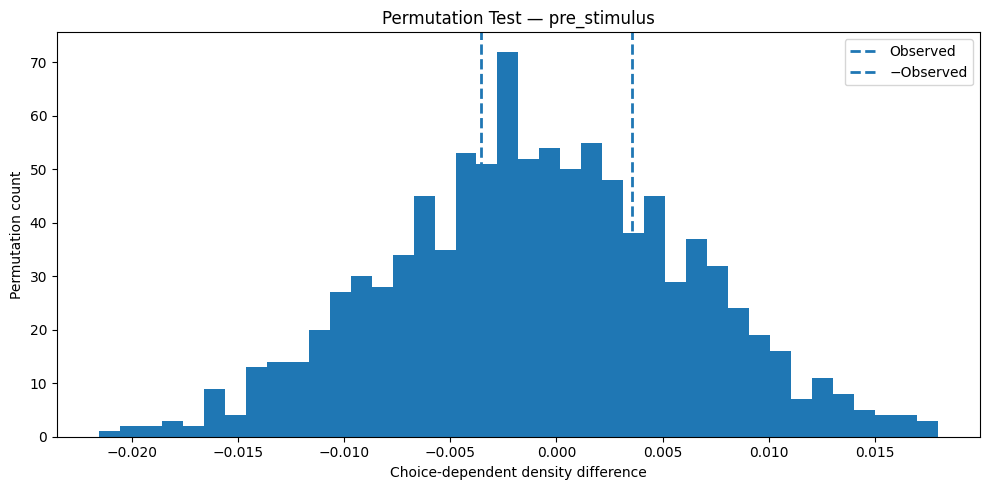

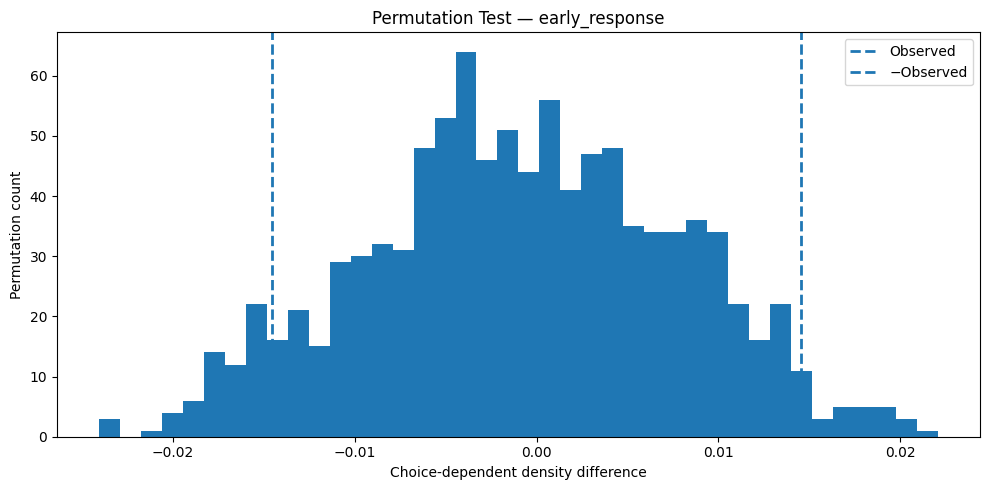

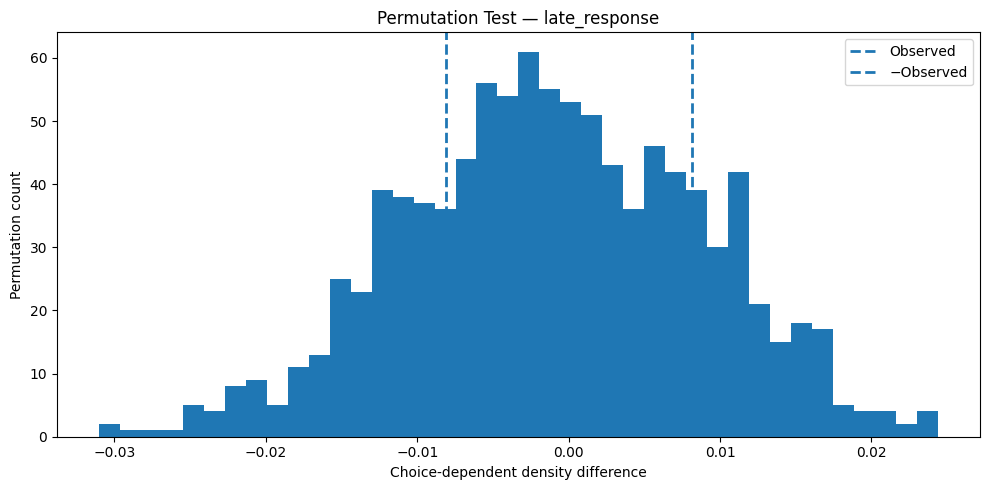

In [165]:
# ============================================================
# STEP 65 — Permutation null distributions
# ============================================================

for epoch_name, null_distribution in permutation_results.items():

    observed = (
        observed_density_difference[
            epoch_name
        ]
    )

    plt.figure(figsize=(10, 5))

    plt.hist(
        null_distribution,
        bins=40
    )

    plt.axvline(
        observed,
        linestyle="--",
        linewidth=2,
        label="Observed"
    )

    plt.axvline(
        -observed,
        linestyle="--",
        linewidth=2,
        label="−Observed"
    )

    plt.xlabel(
        "Choice-dependent density difference"
    )

    plt.ylabel(
        "Permutation count"
    )

    plt.title(
        f"Permutation Test — {epoch_name}"
    )

    plt.legend()

    plt.tight_layout()

    plt.show()

**Step 66 — Reconcile the observed statistic**

In [166]:
# ============================================================
# STEP 66A — Reconcile observed network-density statistics
# ============================================================

print("=" * 70)
print("RECONCILING OBSERVED CHOICE-DEPENDENT DENSITY")
print("=" * 70)

reconciled_density = {}

for epoch_name in EPOCHS.keys():

    common_idx = choice_common_neurons[
        epoch_name
    ]

    # --------------------------------------------------------
    # Pipeline A: previously stored connectivity matrices
    # --------------------------------------------------------

    minus_fc_A = matched_choice_connectivity[
        epoch_name
    ]["-1"]

    plus_fc_A = matched_choice_connectivity[
        epoch_name
    ]["+1"]

    upper_A = np.triu_indices_from(
        minus_fc_A,
        k=1
    )

    minus_density_A = np.mean(
        minus_fc_A[upper_A] >
        CHOICE_CORR_THRESHOLD
    )

    plus_density_A = np.mean(
        plus_fc_A[upper_A] >
        CHOICE_CORR_THRESHOLD
    )

    difference_A = (
        plus_density_A -
        minus_density_A
    )

    # --------------------------------------------------------
    # Pipeline B: directly recompute from epoch_activity
    # --------------------------------------------------------

    data = (
        epoch_activity[
            epoch_name
        ][:, common_idx]
    )

    minus_mask = (
        original_labels == -1
    )

    plus_mask = (
        original_labels == 1
    )

    minus_data = data[
        minus_mask
    ]

    plus_data = data[
        plus_mask
    ]

    minus_fc_B = np.corrcoef(
        minus_data,
        rowvar=False
    )

    plus_fc_B = np.corrcoef(
        plus_data,
        rowvar=False
    )

    upper_B = np.triu_indices_from(
        minus_fc_B,
        k=1
    )

    minus_density_B = np.mean(
        minus_fc_B[upper_B] >
        CHOICE_CORR_THRESHOLD
    )

    plus_density_B = np.mean(
        plus_fc_B[upper_B] >
        CHOICE_CORR_THRESHOLD
    )

    difference_B = (
        plus_density_B -
        minus_density_B
    )

    reconciled_density[
        epoch_name
    ] = {
        "A": difference_A,
        "B": difference_B
    }

    print("\n", epoch_name)

    print(
        "Pipeline A:",
        f"{difference_A:.6f}"
    )

    print(
        "Pipeline B:",
        f"{difference_B:.6f}"
    )

    print(
        "Absolute discrepancy:",
        f"{abs(difference_A-difference_B):.6f}"
    )

RECONCILING OBSERVED CHOICE-DEPENDENT DENSITY

 pre_stimulus
Pipeline A: 0.003552
Pipeline B: 0.007380
Absolute discrepancy: 0.003828

 early_response
Pipeline A: 0.014539
Pipeline B: 0.017656
Absolute discrepancy: 0.003117

 late_response
Pipeline A: 0.008121
Pipeline B: 0.009599
Absolute discrepancy: 0.001478


**Step 67 — Canonical choice-network analysis**

**Step 67A — Build canonical trial-level network data**

In [167]:
# ============================================================
# STEP 67A — CANONICAL CHOICE NETWORK DATA
# ============================================================

canonical_network_data = {}

for epoch_name in EPOCHS.keys():

    # Start from the same 1039-neuron population
    data = (
        epoch_activity[
            epoch_name
        ][:, common_neuron_indices]
    )

    # --------------------------------------------------------
    # Check trial and neuron dimensions
    # --------------------------------------------------------

    print("\n" + "=" * 70)
    print(epoch_name)

    print(
        "Input shape:",
        data.shape
    )

    # --------------------------------------------------------
    # Identify neurons with non-zero variance across ALL
    # valid trials
    # --------------------------------------------------------

    global_variance = np.var(
        data,
        axis=0
    )

    global_valid = (
        global_variance > 1e-12
    )

    data = data[
        :,
        global_valid
    ]

    print(
        "Global valid neurons:",
        data.shape[1]
    )

    # --------------------------------------------------------
    # Store
    # --------------------------------------------------------

    canonical_network_data[
        epoch_name
    ] = data

    print(
        "Final canonical shape:",
        data.shape
    )


pre_stimulus
Input shape: (140, 1039)
Global valid neurons: 1039
Final canonical shape: (140, 1039)

early_response
Input shape: (140, 1039)
Global valid neurons: 1039
Final canonical shape: (140, 1039)

late_response
Input shape: (140, 1039)
Global valid neurons: 1039
Final canonical shape: (140, 1039)


**Step 67B — Verify choice-specific variance**

In [168]:
# ============================================================
# STEP 67B — Verify choice-specific variance
# ============================================================

canonical_valid_indices = {}

for epoch_name in EPOCHS.keys():

    data = canonical_network_data[
        epoch_name
    ]

    minus_mask = (
        original_labels == -1
    )

    plus_mask = (
        original_labels == 1
    )

    minus_variance = np.var(
        data[minus_mask],
        axis=0
    )

    plus_variance = np.var(
        data[plus_mask],
        axis=0
    )

    valid_both = (
        (minus_variance > 1e-12) &
        (plus_variance > 1e-12)
    )

    canonical_valid_indices[
        epoch_name
    ] = valid_both

    print("\n" + "=" * 70)
    print(epoch_name)

    print(
        "Total canonical neurons:",
        data.shape[1]
    )

    print(
        "Valid in -1:",
        np.sum(minus_variance > 1e-12)
    )

    print(
        "Valid in +1:",
        np.sum(plus_variance > 1e-12)
    )

    print(
        "Valid in BOTH:",
        np.sum(valid_both)
    )


pre_stimulus
Total canonical neurons: 1039
Valid in -1: 1009
Valid in +1: 1026
Valid in BOTH: 996

early_response
Total canonical neurons: 1039
Valid in -1: 986
Valid in +1: 1024
Valid in BOTH: 971

late_response
Total canonical neurons: 1039
Valid in -1: 1014
Valid in +1: 1029
Valid in BOTH: 1004


**Step 68 — Recalculate the observed statistic**

In [169]:
# ============================================================
# STEP 68 — CANONICAL OBSERVED DENSITY DIFFERENCE
# ============================================================

canonical_observed_difference = {}

for epoch_name in EPOCHS.keys():

    data = canonical_network_data[
        epoch_name
    ]

    valid_mask = canonical_valid_indices[
        epoch_name
    ]

    data = data[
        :,
        valid_mask
    ]

    minus_mask = (
        original_labels == -1
    )

    plus_mask = (
        original_labels == 1
    )

    minus_fc = np.corrcoef(
        data[minus_mask],
        rowvar=False
    )

    plus_fc = np.corrcoef(
        data[plus_mask],
        rowvar=False
    )

    upper = np.triu_indices_from(
        minus_fc,
        k=1
    )

    minus_density = np.mean(
        minus_fc[upper] >
        CHOICE_CORR_THRESHOLD
    )

    plus_density = np.mean(
        plus_fc[upper] >
        CHOICE_CORR_THRESHOLD
    )

    difference = (
        plus_density -
        minus_density
    )

    canonical_observed_difference[
        epoch_name
    ] = difference

    print("\n" + "=" * 70)
    print(epoch_name)

    print(
        "Matched neurons:",
        data.shape[1]
    )

    print(
        "Choice -1 density:",
        f"{minus_density:.6f}"
    )

    print(
        "Choice +1 density:",
        f"{plus_density:.6f}"
    )

    print(
        "Observed Δ density:",
        f"{difference:.6f}"
    )


pre_stimulus
Matched neurons: 996
Choice -1 density: 0.055016
Choice +1 density: 0.058568
Observed Δ density: 0.003552

early_response
Matched neurons: 971
Choice -1 density: 0.034625
Choice +1 density: 0.049164
Observed Δ density: 0.014539

late_response
Matched neurons: 1004
Choice -1 density: 0.051175
Choice +1 density: 0.059296
Observed Δ density: 0.008121


**Step 69 — Correct permutation test**

In [170]:
# ============================================================
# STEP 69A — CANONICAL PERMUTATION TEST
# ============================================================

import numpy as np

N_PERMUTATIONS = 1000

rng = np.random.default_rng(42)

canonical_permutation_results = {}

for epoch_name in EPOCHS.keys():

    print("\n" + "=" * 70)
    print("PERMUTATION TEST:", epoch_name)
    print("=" * 70)

    # --------------------------------------------------------
    # Canonical trial-level activity
    # --------------------------------------------------------

    data = canonical_network_data[
        epoch_name
    ]

    # Keep only neurons valid in BOTH behavioral choices
    valid_mask = canonical_valid_indices[
        epoch_name
    ]

    data = data[
        :,
        valid_mask
    ]

    n_neurons = data.shape[1]

    print(
        "Matched neurons:",
        n_neurons
    )

    # --------------------------------------------------------
    # Upper triangular indices
    # --------------------------------------------------------

    upper = np.triu_indices(
        n_neurons,
        k=1
    )

    # --------------------------------------------------------
    # Original labels
    # --------------------------------------------------------

    labels = original_labels.copy()

    minus_mask = (
        labels == -1
    )

    plus_mask = (
        labels == 1
    )

    # --------------------------------------------------------
    # Observed connectivity
    # --------------------------------------------------------

    minus_fc = np.corrcoef(
        data[minus_mask],
        rowvar=False
    )

    plus_fc = np.corrcoef(
        data[plus_mask],
        rowvar=False
    )

    minus_density = np.mean(
        minus_fc[upper] >
        CHOICE_CORR_THRESHOLD
    )

    plus_density = np.mean(
        plus_fc[upper] >
        CHOICE_CORR_THRESHOLD
    )

    observed = (
        plus_density -
        minus_density
    )

    print(
        "Observed Δ density:",
        f"{observed:.6f}"
    )

    # --------------------------------------------------------
    # Permutation distribution
    # --------------------------------------------------------

    null_distribution = np.zeros(
        N_PERMUTATIONS,
        dtype=np.float32
    )

    for p in range(
        N_PERMUTATIONS
    ):

        shuffled_labels = rng.permutation(
            labels
        )

        perm_minus_mask = (
            shuffled_labels == -1
        )

        perm_plus_mask = (
            shuffled_labels == 1
        )

        perm_minus_fc = np.corrcoef(
            data[perm_minus_mask],
            rowvar=False
        )

        perm_plus_fc = np.corrcoef(
            data[perm_plus_mask],
            rowvar=False
        )

        perm_minus_density = np.mean(
            perm_minus_fc[upper] >
            CHOICE_CORR_THRESHOLD
        )

        perm_plus_density = np.mean(
            perm_plus_fc[upper] >
            CHOICE_CORR_THRESHOLD
        )

        null_distribution[p] = (
            perm_plus_density -
            perm_minus_density
        )

        if (
            (p + 1) % 100 == 0
        ):
            print(
                f"Completed "
                f"{p+1}/{N_PERMUTATIONS}"
            )

    # --------------------------------------------------------
    # Two-sided permutation p-value
    # --------------------------------------------------------

    p_value = (
        np.sum(
            np.abs(
                null_distribution
            )
            >=
            abs(observed)
        )
        + 1
    ) / (
        N_PERMUTATIONS + 1
    )

    canonical_permutation_results[
        epoch_name
    ] = {
        "observed": observed,
        "null": null_distribution,
        "p_value": p_value
    }

    print(
        "\nPermutation p-value:",
        f"{p_value:.6f}"
    )


PERMUTATION TEST: pre_stimulus
Matched neurons: 996
Observed Δ density: 0.003552
Completed 100/1000
Completed 200/1000
Completed 300/1000
Completed 400/1000
Completed 500/1000
Completed 600/1000
Completed 700/1000
Completed 800/1000
Completed 900/1000
Completed 1000/1000

Permutation p-value: 0.597403

PERMUTATION TEST: early_response
Matched neurons: 971
Observed Δ density: 0.014539
Completed 100/1000
Completed 200/1000
Completed 300/1000
Completed 400/1000
Completed 500/1000
Completed 600/1000
Completed 700/1000
Completed 800/1000
Completed 900/1000
Completed 1000/1000

Permutation p-value: 0.074925

PERMUTATION TEST: late_response
Matched neurons: 1004
Observed Δ density: 0.008121
Completed 100/1000
Completed 200/1000
Completed 300/1000
Completed 400/1000
Completed 500/1000
Completed 600/1000
Completed 700/1000
Completed 800/1000
Completed 900/1000
Completed 1000/1000

Permutation p-value: 0.451548


**Step 69B — Summarize the corrected results**

In [171]:
# ============================================================
# STEP 69B — Corrected permutation summary
# ============================================================

print("=" * 75)
print("CANONICAL CHOICE-DEPENDENT NETWORK TEST")
print("=" * 75)

for epoch_name, result in (
    canonical_permutation_results.items()
):

    print(
        f"\n{epoch_name}"
    )

    print(
        "Observed Δ density:",
        f"{result['observed']:.6f}"
    )

    print(
        "Permutation p-value:",
        f"{result['p_value']:.6f}"
    )

CANONICAL CHOICE-DEPENDENT NETWORK TEST

pre_stimulus
Observed Δ density: 0.003552
Permutation p-value: 0.597403

early_response
Observed Δ density: 0.014539
Permutation p-value: 0.074925

late_response
Observed Δ density: 0.008121
Permutation p-value: 0.451548


**Step 69C — Correct for the three epoch comparisons**

In [172]:
# ============================================================
# STEP 69C — Multiple-comparison correction
# ============================================================

from statsmodels.stats.multitest import multipletests

epoch_names = list(
    canonical_permutation_results.keys()
)

raw_p_values = np.array([
    canonical_permutation_results[
        epoch
    ]["p_value"]
    for epoch in epoch_names
])

reject, corrected_p_values, _, _ = (
    multipletests(
        raw_p_values,
        alpha=0.05,
        method="fdr_bh"
    )
)

print("=" * 75)
print("FDR CORRECTION ACROSS EPOCHS")
print("=" * 75)

for epoch, raw_p, corrected_p, sig in zip(
    epoch_names,
    raw_p_values,
    corrected_p_values,
    reject
):

    print(
        f"{epoch:15s} "
        f"raw p={raw_p:.6f} "
        f"FDR p={corrected_p:.6f} "
        f"significant={sig}"
    )

FDR CORRECTION ACROSS EPOCHS
pre_stimulus    raw p=0.597403 FDR p=0.597403 significant=False
early_response  raw p=0.074925 FDR p=0.224775 significant=False
late_response   raw p=0.451548 FDR p=0.597403 significant=False


**Step 70 — Plot the corrected permutation distributions**

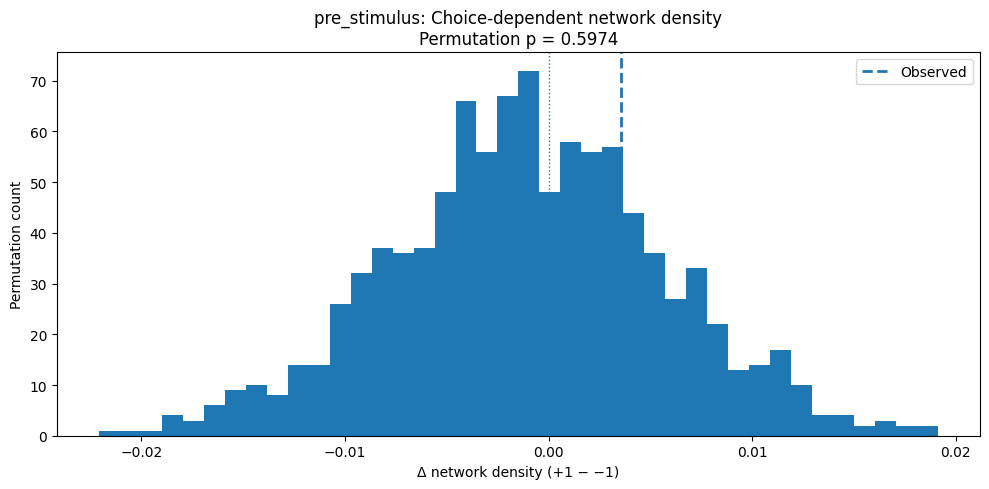

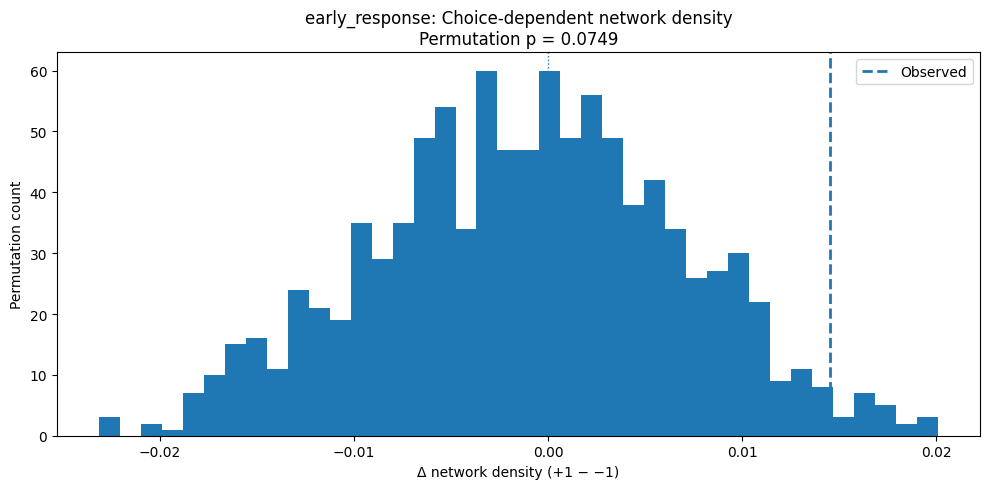

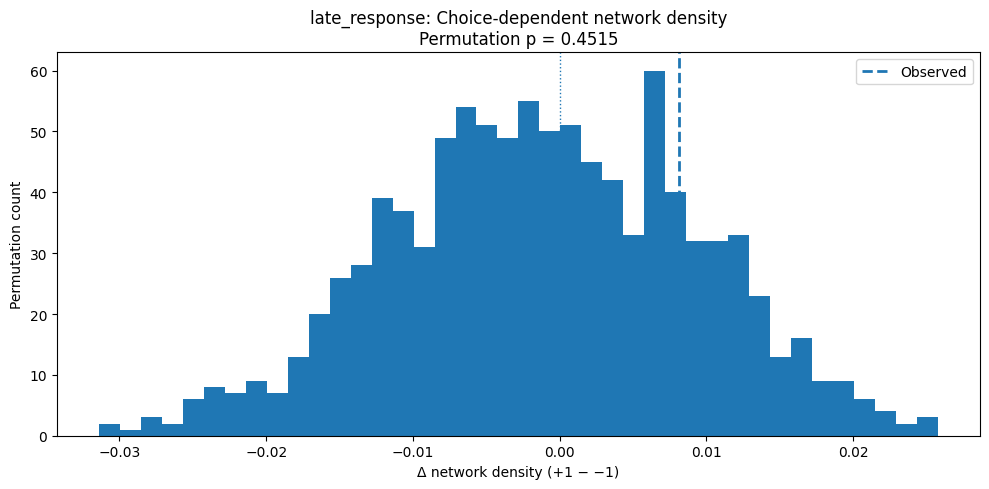

In [173]:
# ============================================================
# STEP 70 — Canonical permutation distributions
# ============================================================

for epoch_name, result in (
    canonical_permutation_results.items()
):

    null_distribution = result[
        "null"
    ]

    observed = result[
        "observed"
    ]

    p_value = result[
        "p_value"
    ]

    plt.figure(
        figsize=(10, 5)
    )

    plt.hist(
        null_distribution,
        bins=40
    )

    plt.axvline(
        observed,
        linestyle="--",
        linewidth=2,
        label="Observed"
    )

    plt.axvline(
        0,
        linestyle=":",
        linewidth=1
    )

    plt.xlabel(
        "Δ network density (+1 − −1)"
    )

    plt.ylabel(
        "Permutation count"
    )

    plt.title(
        f"{epoch_name}: "
        f"Choice-dependent network density\n"
        f"Permutation p = {p_value:.4f}"
    )

    plt.legend()

    plt.tight_layout()

    plt.show()

**Step 71 — Choice-dependent modularity**

In [174]:
# ============================================================
# STEP 71A — CHOICE-DEPENDENT COMMUNITY STRUCTURE
# ============================================================

import networkx as nx
import community.community_louvain as community_louvain

choice_modularity_results = {}

for epoch_name in EPOCHS.keys():

    print("\n" + "=" * 70)
    print("EPOCH:", epoch_name)
    print("=" * 70)

    data = canonical_network_data[
        epoch_name
    ]

    # Same canonical neurons
    valid_mask = canonical_valid_indices[
        epoch_name
    ]

    data = data[
        :,
        valid_mask
    ]

    labels = original_labels.copy()

    minus_mask = labels == -1
    plus_mask = labels == 1

    results = {}

    for choice_name, choice_mask in [
        ("-1", minus_mask),
        ("+1", plus_mask)
    ]:

        choice_data = data[
            choice_mask
        ]

        # Functional connectivity
        fc = np.corrcoef(
            choice_data,
            rowvar=False
        )

        # Remove diagonal
        np.fill_diagonal(
            fc,
            0
        )

        # Threshold
        adjacency = np.where(
            fc > CHOICE_CORR_THRESHOLD,
            fc,
            0
        )

        # Create graph
        G = nx.from_numpy_array(
            adjacency
        )

        # Remove isolated nodes
        G.remove_nodes_from(
            list(
                nx.isolates(G)
            )
        )

        # Louvain
        partition = (
            community_louvain
            .best_partition(
                G,
                weight="weight",
                random_state=42
            )
        )

        modularity = (
            community_louvain
            .modularity(
                partition,
                G,
                weight="weight"
            )
        )

        n_communities = len(
            np.unique(
                list(
                    partition.values()
                )
            )
        )

        results[choice_name] = {
            "modularity": modularity,
            "communities": n_communities,
            "graph": G,
            "partition": partition
        }

        print(
            f"Choice {choice_name}: "
            f"nodes={G.number_of_nodes()} "
            f"edges={G.number_of_edges()} "
            f"communities={n_communities} "
            f"modularity={modularity:.4f}"
        )

    choice_modularity_results[
        epoch_name
    ] = results


EPOCH: pre_stimulus
Choice -1: nodes=995 edges=27261 communities=5 modularity=0.4694
Choice +1: nodes=995 edges=29021 communities=5 modularity=0.4678

EPOCH: early_response
Choice -1: nodes=971 edges=16306 communities=7 modularity=0.4947
Choice +1: nodes=970 edges=23153 communities=5 modularity=0.4281

EPOCH: late_response
Choice -1: nodes=1004 edges=25767 communities=5 modularity=0.4578
Choice +1: nodes=1004 edges=29856 communities=4 modularity=0.3794


**Step 71B — Compare modularity**

In [175]:
# ============================================================
# STEP 71B — CHOICE-DEPENDENT MODULARITY DIFFERENCE
# ============================================================

print("=" * 70)
print("CHOICE-DEPENDENT MODULARITY")
print("=" * 70)

for epoch_name, results in (
    choice_modularity_results.items()
):

    q_minus = results["-1"]["modularity"]
    q_plus = results["+1"]["modularity"]

    difference = q_plus - q_minus

    print(
        f"\n{epoch_name}"
    )

    print(
        f"Choice -1 modularity: {q_minus:.4f}"
    )

    print(
        f"Choice +1 modularity: {q_plus:.4f}"
    )

    print(
        f"Δ modularity (+1 − -1): {difference:.4f}"
    )

CHOICE-DEPENDENT MODULARITY

pre_stimulus
Choice -1 modularity: 0.4694
Choice +1 modularity: 0.4678
Δ modularity (+1 − -1): -0.0016

early_response
Choice -1 modularity: 0.4947
Choice +1 modularity: 0.4281
Δ modularity (+1 − -1): -0.0666

late_response
Choice -1 modularity: 0.4578
Choice +1 modularity: 0.3794
Δ modularity (+1 − -1): -0.0783


**Step 72 — Permutation test for modularity**

In [176]:
# ============================================================
# STEP 72A — PERMUTATION TEST FOR MODULARITY DIFFERENCE
# ============================================================

N_MODULARITY_PERMUTATIONS = 500

rng = np.random.default_rng(42)

modularity_permutation_results = {}

for epoch_name in EPOCHS.keys():

    print("\n" + "=" * 70)
    print("MODULARITY PERMUTATION:", epoch_name)
    print("=" * 70)

    # --------------------------------------------------------
    # Canonical network data
    # --------------------------------------------------------

    data = canonical_network_data[
        epoch_name
    ]

    valid_mask = canonical_valid_indices[
        epoch_name
    ]

    data = data[
        :,
        valid_mask
    ]

    labels = original_labels.copy()

    minus_mask = labels == -1
    plus_mask = labels == 1

    # --------------------------------------------------------
    # Function to calculate modularity
    # --------------------------------------------------------

    def calculate_modularity(
        activity
    ):

        fc = np.corrcoef(
            activity,
            rowvar=False
        )

        np.fill_diagonal(
            fc,
            0
        )

        adjacency = np.where(
            fc > CHOICE_CORR_THRESHOLD,
            fc,
            0
        )

        G = nx.from_numpy_array(
            adjacency
        )

        # Remove isolated neurons
        G.remove_nodes_from(
            list(
                nx.isolates(G)
            )
        )

        # If graph is empty
        if G.number_of_edges() == 0:
            return np.nan

        partition = (
            community_louvain
            .best_partition(
                G,
                weight="weight",
                random_state=42
            )
        )

        Q = (
            community_louvain
            .modularity(
                partition,
                G,
                weight="weight"
            )
        )

        return Q

    # --------------------------------------------------------
    # Observed modularity
    # --------------------------------------------------------

    Q_minus = calculate_modularity(
        data[minus_mask]
    )

    Q_plus = calculate_modularity(
        data[plus_mask]
    )

    observed_difference = (
        Q_plus - Q_minus
    )

    print(
        "Observed ΔQ:",
        f"{observed_difference:.6f}"
    )

    # --------------------------------------------------------
    # Null distribution
    # --------------------------------------------------------

    null_distribution = np.zeros(
        N_MODULARITY_PERMUTATIONS,
        dtype=np.float32
    )

    for p in range(
        N_MODULARITY_PERMUTATIONS
    ):

        shuffled_labels = rng.permutation(
            labels
        )

        shuffled_minus = (
            shuffled_labels == -1
        )

        shuffled_plus = (
            shuffled_labels == 1
        )

        Q_minus_perm = calculate_modularity(
            data[shuffled_minus]
        )

        Q_plus_perm = calculate_modularity(
            data[shuffled_plus]
        )

        null_distribution[p] = (
            Q_plus_perm -
            Q_minus_perm
        )

        if (
            (p + 1) % 50 == 0
        ):
            print(
                f"Completed "
                f"{p+1}/{N_MODULARITY_PERMUTATIONS}"
            )

    # --------------------------------------------------------
    # Remove invalid permutations
    # --------------------------------------------------------

    null_distribution = (
        null_distribution[
            np.isfinite(
                null_distribution
            )
        ]
    )

    # --------------------------------------------------------
    # Two-sided permutation p-value
    # --------------------------------------------------------

    p_value = (
        np.sum(
            np.abs(
                null_distribution
            )
            >=
            abs(
                observed_difference
            )
        )
        + 1
    ) / (
        len(
            null_distribution
        ) + 1
    )

    modularity_permutation_results[
        epoch_name
    ] = {
        "observed": observed_difference,
        "null": null_distribution,
        "p_value": p_value
    }

    print(
        "\nPermutation p-value:",
        f"{p_value:.6f}"
    )


MODULARITY PERMUTATION: pre_stimulus
Observed ΔQ: -0.001602
Completed 50/500
Completed 100/500
Completed 150/500
Completed 200/500
Completed 250/500
Completed 300/500
Completed 350/500
Completed 400/500
Completed 450/500
Completed 500/500

Permutation p-value: 0.948104

MODULARITY PERMUTATION: early_response
Observed ΔQ: -0.066636
Completed 50/500
Completed 100/500
Completed 150/500
Completed 200/500
Completed 250/500
Completed 300/500
Completed 350/500
Completed 400/500
Completed 450/500
Completed 500/500

Permutation p-value: 0.069860

MODULARITY PERMUTATION: late_response
Observed ΔQ: -0.078325
Completed 50/500
Completed 100/500
Completed 150/500
Completed 200/500
Completed 250/500
Completed 300/500
Completed 350/500
Completed 400/500
Completed 450/500
Completed 500/500

Permutation p-value: 0.113772


**Step 72B — Summary**

In [177]:
# ============================================================
# STEP 72B — MODULARITY PERMUTATION SUMMARY
# ============================================================

print("=" * 75)
print("CHOICE-DEPENDENT MODULARITY — PERMUTATION TEST")
print("=" * 75)

for epoch_name, result in (
    modularity_permutation_results.items()
):

    print(
        f"\n{epoch_name}"
    )

    print(
        "Observed ΔQ:",
        f"{result['observed']:.6f}"
    )

    print(
        "Permutation p-value:",
        f"{result['p_value']:.6f}"
    )

CHOICE-DEPENDENT MODULARITY — PERMUTATION TEST

pre_stimulus
Observed ΔQ: -0.001602
Permutation p-value: 0.948104

early_response
Observed ΔQ: -0.066636
Permutation p-value: 0.069860

late_response
Observed ΔQ: -0.078325
Permutation p-value: 0.113772


**Step 72C — FDR correction**

In [178]:
# ============================================================
# STEP 72C — FDR CORRECTION
# ============================================================

from statsmodels.stats.multitest import multipletests

epoch_names = list(
    modularity_permutation_results.keys()
)

modularity_raw_p = np.array([
    modularity_permutation_results[
        epoch
    ]["p_value"]
    for epoch in epoch_names
])

reject_modularity, modularity_fdr_p, _, _ = (
    multipletests(
        modularity_raw_p,
        alpha=0.05,
        method="fdr_bh"
    )
)

print("=" * 75)
print("MODULARITY FDR CORRECTION")
print("=" * 75)

for epoch, raw_p, fdr_p, sig in zip(
    epoch_names,
    modularity_raw_p,
    modularity_fdr_p,
    reject_modularity
):

    print(
        f"{epoch:15s} "
        f"raw p={raw_p:.6f} "
        f"FDR p={fdr_p:.6f} "
        f"significant={sig}"
    )

MODULARITY FDR CORRECTION
pre_stimulus    raw p=0.948104 FDR p=0.948104 significant=False
early_response  raw p=0.069860 FDR p=0.170659 significant=False
late_response   raw p=0.113772 FDR p=0.170659 significant=False


**Step 73 — Plot the modularity null distributions**

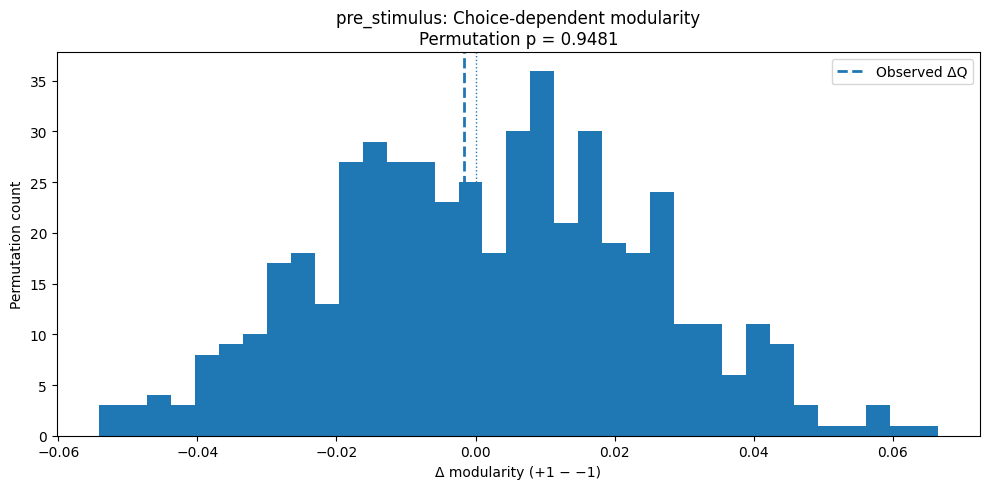

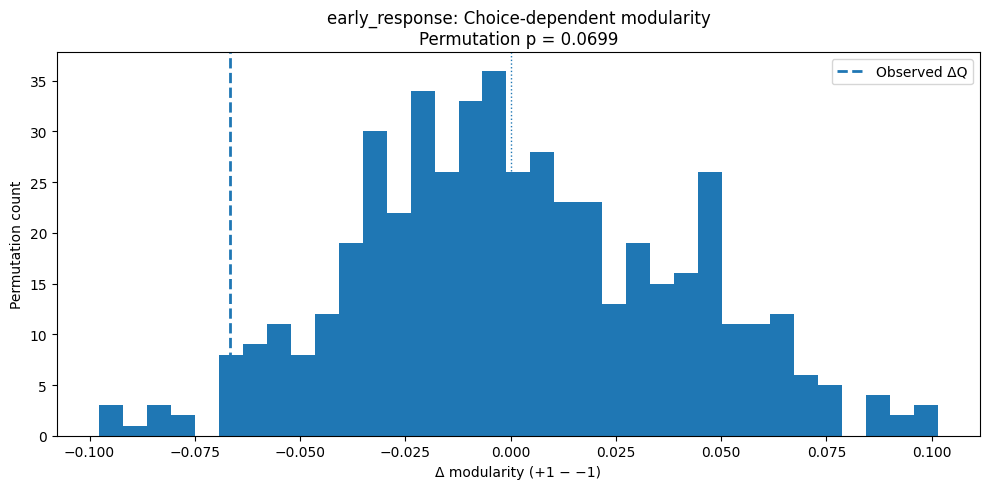

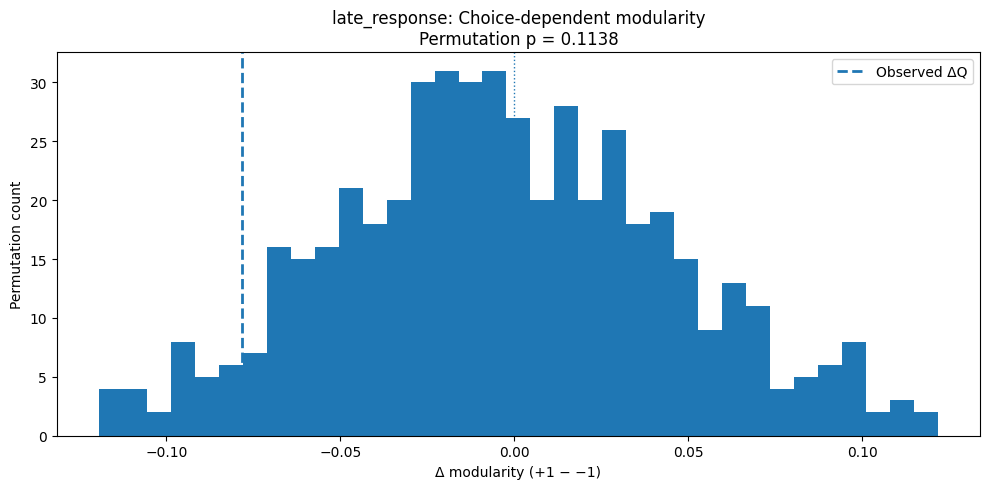

In [179]:
# ============================================================
# STEP 73 — MODULARITY NULL DISTRIBUTIONS
# ============================================================

for epoch_name, result in (
    modularity_permutation_results.items()
):

    null_distribution = result[
        "null"
    ]

    observed = result[
        "observed"
    ]

    p_value = result[
        "p_value"
    ]

    plt.figure(
        figsize=(10, 5)
    )

    plt.hist(
        null_distribution,
        bins=35
    )

    plt.axvline(
        observed,
        linestyle="--",
        linewidth=2,
        label="Observed ΔQ"
    )

    plt.axvline(
        0,
        linestyle=":",
        linewidth=1
    )

    plt.xlabel(
        "Δ modularity (+1 − −1)"
    )

    plt.ylabel(
        "Permutation count"
    )

    plt.title(
        f"{epoch_name}: "
        f"Choice-dependent modularity\n"
        f"Permutation p = {p_value:.4f}"
    )

    plt.legend()

    plt.tight_layout()

    plt.show()

**Step 74 — Functional hub analysis**

**Step 74A — Extract hub scores**

In [180]:
# ============================================================
# STEP 74A — FUNCTIONAL HUB SCORES
# ============================================================

hub_results = {}

for epoch_name in EPOCHS.keys():

    print("\n" + "=" * 70)
    print("HUB ANALYSIS:", epoch_name)
    print("=" * 70)

    data = canonical_network_data[
        epoch_name
    ]

    valid_mask = canonical_valid_indices[
        epoch_name
    ]

    data = data[
        :,
        valid_mask
    ]

    # Functional connectivity
    fc = np.corrcoef(
        data,
        rowvar=False
    )

    np.fill_diagonal(
        fc,
        0
    )

    # Thresholded weighted network
    adjacency = np.where(
        fc > CHOICE_CORR_THRESHOLD,
        fc,
        0
    )

    # Weighted strength
    strength = adjacency.sum(
        axis=1
    )

    # Degree
    degree = np.sum(
        adjacency > 0,
        axis=1
    )

    hub_results[
        epoch_name
    ] = {
        "strength": strength,
        "degree": degree,
        "valid_mask": valid_mask,
        "fc": fc,
        "adjacency": adjacency
    }

    print(
        "Number of neurons:",
        len(strength)
    )

    print(
        "Mean strength:",
        f"{strength.mean():.4f}"
    )

    print(
        "Maximum strength:",
        f"{strength.max():.4f}"
    )

    print(
        "Mean degree:",
        f"{degree.mean():.2f}"
    )


HUB ANALYSIS: pre_stimulus
Number of neurons: 996
Mean strength: 14.9253
Maximum strength: 96.7972
Mean degree: 37.37

HUB ANALYSIS: early_response
Number of neurons: 971
Mean strength: 10.0214
Maximum strength: 62.1547
Mean degree: 25.59

HUB ANALYSIS: late_response
Number of neurons: 1004
Mean strength: 18.3231
Maximum strength: 116.3436
Mean degree: 46.17


**Step 74B — Identify top hubs**

In [181]:
# ============================================================
# STEP 74B — TOP FUNCTIONAL HUBS
# ============================================================

N_TOP_HUBS = 20

top_hubs = {}

for epoch_name, result in hub_results.items():

    strength = result[
        "strength"
    ]

    top_indices = np.argsort(
        strength
    )[
        -N_TOP_HUBS:
    ][::-1]

    top_hubs[
        epoch_name
    ] = top_indices

    print("\n" + "=" * 70)
    print(
        f"TOP {N_TOP_HUBS} HUBS — {epoch_name}"
    )
    print("=" * 70)

    for rank, idx in enumerate(
        top_indices,
        start=1
    ):

        print(
            f"{rank:2d}. "
            f"Neuron {idx:4d} "
            f"strength = "
            f"{strength[idx]:.4f}"
        )


TOP 20 HUBS — pre_stimulus
 1. Neuron  883 strength = 96.7972
 2. Neuron  931 strength = 91.3095
 3. Neuron  916 strength = 87.3698
 4. Neuron  775 strength = 80.9477
 5. Neuron  823 strength = 80.7234
 6. Neuron  935 strength = 78.0156
 7. Neuron  810 strength = 77.1075
 8. Neuron  668 strength = 75.5755
 9. Neuron  499 strength = 75.2013
10. Neuron  656 strength = 73.7085
11. Neuron  663 strength = 73.4674
12. Neuron  642 strength = 73.4526
13. Neuron  921 strength = 72.8960
14. Neuron  974 strength = 72.8256
15. Neuron  161 strength = 72.3334
16. Neuron  903 strength = 72.2371
17. Neuron  163 strength = 71.3534
18. Neuron  455 strength = 69.2226
19. Neuron   64 strength = 68.9162
20. Neuron  180 strength = 67.8743

TOP 20 HUBS — early_response
 1. Neuron  756 strength = 62.1547
 2. Neuron  777 strength = 61.6203
 3. Neuron  860 strength = 61.3404
 4. Neuron  359 strength = 58.4266
 5. Neuron  307 strength = 57.6020
 6. Neuron  792 strength = 56.2735
 7. Neuron  439 strength = 56.00

**Step 74C — Hub overlap across epochs**

In [182]:
# ============================================================
# STEP 74C — HUB IDENTITY OVERLAP
# ============================================================

epoch_list = list(
    EPOCHS.keys()
)

print("=" * 70)
print("FUNCTIONAL HUB OVERLAP")
print("=" * 70)

for i in range(
    len(epoch_list)
):

    for j in range(
        i + 1,
        len(epoch_list)
    ):

        epoch_a = epoch_list[i]
        epoch_b = epoch_list[j]

        hubs_a = set(
            top_hubs[epoch_a]
        )

        hubs_b = set(
            top_hubs[epoch_b]
        )

        intersection = (
            hubs_a &
            hubs_b
        )

        union = (
            hubs_a |
            hubs_b
        )

        overlap = len(
            intersection
        )

        jaccard = (
            overlap /
            len(union)
            if len(union) > 0
            else np.nan
        )

        print(
            f"\n{epoch_a} vs {epoch_b}"
        )

        print(
            "Shared hubs:",
            overlap,
            "/",
            N_TOP_HUBS
        )

        print(
            "Jaccard similarity:",
            f"{jaccard:.4f}"
        )

        print(
            "Shared neuron indices:",
            sorted(intersection)
        )

FUNCTIONAL HUB OVERLAP

pre_stimulus vs early_response
Shared hubs: 0 / 20
Jaccard similarity: 0.0000
Shared neuron indices: []

pre_stimulus vs late_response
Shared hubs: 1 / 20
Jaccard similarity: 0.0256
Shared neuron indices: [np.int64(931)]

early_response vs late_response
Shared hubs: 1 / 20
Jaccard similarity: 0.0256
Shared neuron indices: [np.int64(454)]


**Step 74D — Hub strength changes**

In [183]:
# ============================================================
# STEP 74D — HUB STRENGTH ACROSS EPOCHS
# ============================================================

common_hub_indices = np.intersect1d(
    np.intersect1d(
        np.arange(
            len(
                hub_results[
                    epoch_list[0]
                ]["strength"]
            )
        ),
        np.arange(
            len(
                hub_results[
                    epoch_list[1]
                ]["strength"]
            )
        )
    ),
    np.arange(
        len(
            hub_results[
                epoch_list[2]
            ]["strength"]
        )
    )
)

print(
    "Common neurons:",
    len(common_hub_indices)
)

# Rank neurons within each epoch
ranked_strength = {}

for epoch_name in epoch_list:

    strength = hub_results[
        epoch_name
    ]["strength"]

    ranks = np.argsort(
        np.argsort(
            -strength
        )
    )

    ranked_strength[
        epoch_name
    ] = ranks

print(
    "\nSpearman-like rank correlations:"
)

for i in range(
    len(epoch_list)
):

    for j in range(
        i + 1,
        len(epoch_list)
    ):

        a = epoch_list[i]
        b = epoch_list[j]

        ranks_a = ranked_strength[a][
            common_hub_indices
        ]

        ranks_b = ranked_strength[b][
            common_hub_indices
        ]

        correlation = np.corrcoef(
            ranks_a,
            ranks_b
        )[0, 1]

        print(
            f"{a} vs {b}: "
            f"r = {correlation:.4f}"
        )

Common neurons: 971

Spearman-like rank correlations:
pre_stimulus vs early_response: r = 0.0227
pre_stimulus vs late_response: r = 0.1110
early_response vs late_response: r = -0.0091


**Step 74E — Visualize hub strength**

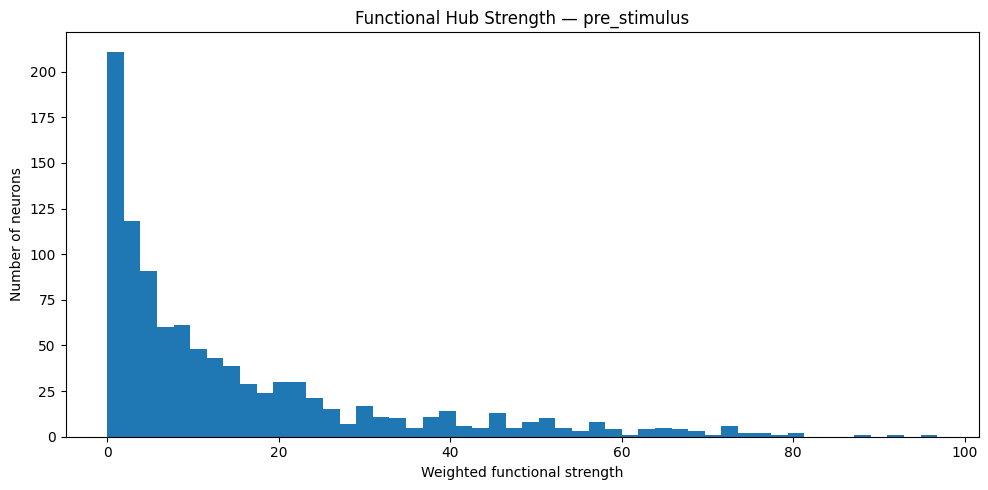

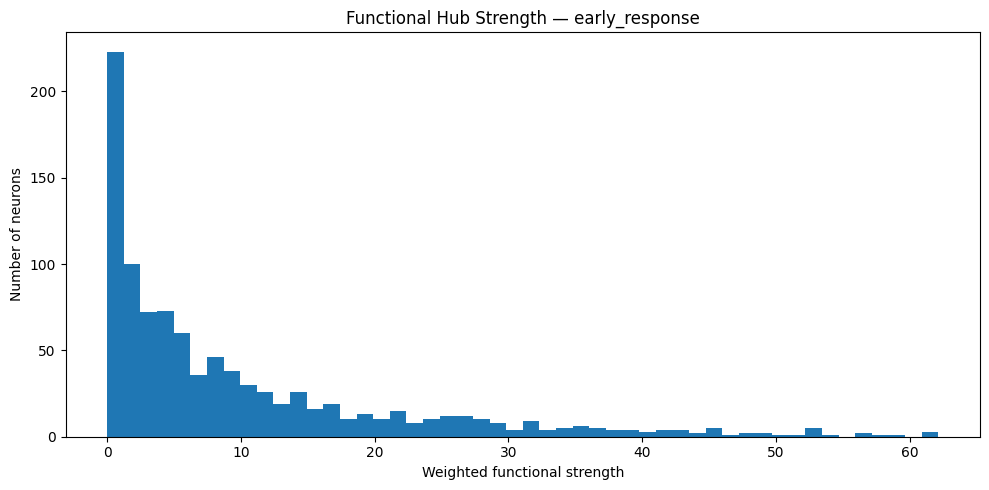

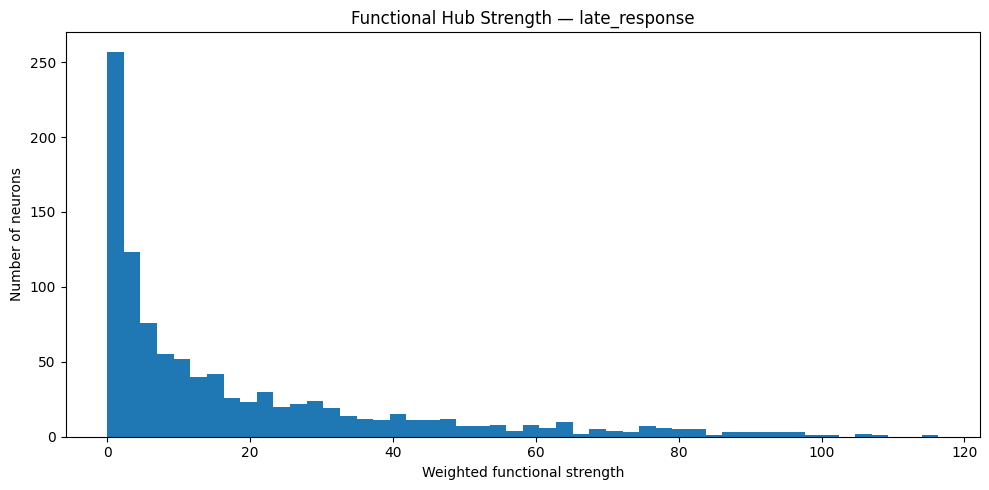

In [184]:
# ============================================================
# STEP 74E — HUB STRENGTH DISTRIBUTIONS
# ============================================================

for epoch_name in epoch_list:

    strength = hub_results[
        epoch_name
    ]["strength"]

    plt.figure(
        figsize=(10, 5)
    )

    plt.hist(
        strength,
        bins=50
    )

    plt.xlabel(
        "Weighted functional strength"
    )

    plt.ylabel(
        "Number of neurons"
    )

    plt.title(
        f"Functional Hub Strength — "
        f"{epoch_name}"
    )

    plt.tight_layout()

    plt.show()

**Step 75 — Canonical hub reconfiguration analysis**

**Step 75A — Build canonical functional networks**

In [185]:
# ============================================================
# STEP 75A — CANONICAL FUNCTIONAL NETWORKS FOR HUB ANALYSIS
# ============================================================

canonical_hub_networks = {}

for epoch_name in EPOCHS.keys():

    print("\n" + "=" * 70)
    print("CANONICAL HUB NETWORK:", epoch_name)
    print("=" * 70)

    data = canonical_network_data[
        epoch_name
    ]

    print(
        "Input shape:",
        data.shape
    )

    # Correlation across trials
    fc = np.corrcoef(
        data,
        rowvar=False
    )

    # Replace numerical problems
    fc = np.nan_to_num(
        fc,
        nan=0.0
    )

    np.fill_diagonal(
        fc,
        0
    )

    # Threshold
    adjacency = np.where(
        fc > CHOICE_CORR_THRESHOLD,
        fc,
        0.0
    )

    # Weighted functional strength
    strength = adjacency.sum(
        axis=1
    )

    # Degree
    degree = np.sum(
        adjacency > 0,
        axis=1
    )

    canonical_hub_networks[
        epoch_name
    ] = {
        "fc": fc,
        "adjacency": adjacency,
        "strength": strength,
        "degree": degree
    }

    print(
        "Neurons:",
        fc.shape[0]
    )

    print(
        "Mean strength:",
        f"{strength.mean():.4f}"
    )

    print(
        "Maximum strength:",
        f"{strength.max():.4f}"
    )

    print(
        "Mean degree:",
        f"{degree.mean():.2f}"
    )


CANONICAL HUB NETWORK: pre_stimulus
Input shape: (140, 1039)
Neurons: 1039
Mean strength: 15.4249
Maximum strength: 98.5569
Mean degree: 38.51

CANONICAL HUB NETWORK: early_response
Input shape: (140, 1039)
Neurons: 1039
Mean strength: 11.6856
Maximum strength: 69.9183
Mean degree: 29.25

CANONICAL HUB NETWORK: late_response
Input shape: (140, 1039)
Neurons: 1039
Mean strength: 18.4923
Maximum strength: 120.3680
Mean degree: 46.54


**Step 75B — Canonical top hubs**

In [186]:
# ============================================================
# STEP 75B — CANONICAL TOP 20 HUBS
# ============================================================

N_TOP_HUBS = 20

canonical_top_hubs = {}

for epoch_name in EPOCHS.keys():

    strength = canonical_hub_networks[
        epoch_name
    ]["strength"]

    top_idx = np.argsort(
        strength
    )[-N_TOP_HUBS:][::-1]

    canonical_top_hubs[
        epoch_name
    ] = top_idx

    print("\n" + "=" * 70)
    print(
        f"CANONICAL TOP {N_TOP_HUBS} HUBS — "
        f"{epoch_name}"
    )
    print("=" * 70)

    for rank, neuron_idx in enumerate(
        top_idx,
        start=1
    ):

        print(
            f"{rank:2d}. "
            f"Neuron {neuron_idx:4d} "
            f"strength = "
            f"{strength[neuron_idx]:.4f}"
        )


CANONICAL TOP 20 HUBS — pre_stimulus
 1. Neuron  923 strength = 98.5569
 2. Neuron  973 strength = 91.6215
 3. Neuron  958 strength = 87.7451
 4. Neuron  814 strength = 82.9561
 5. Neuron  862 strength = 81.0670
 6. Neuron  849 strength = 80.2780
 7. Neuron  977 strength = 78.0156
 8. Neuron  174 strength = 75.5935
 9. Neuron  705 strength = 75.5755
10. Neuron  530 strength = 75.2013
11. Neuron  679 strength = 74.7797
12. Neuron  693 strength = 74.4842
13. Neuron  172 strength = 73.9396
14. Neuron  700 strength = 73.4674
15. Neuron  945 strength = 73.2613
16. Neuron  963 strength = 72.8960
17. Neuron 1016 strength = 72.8256
18. Neuron  484 strength = 72.6048
19. Neuron   70 strength = 72.4738
20. Neuron  130 strength = 70.5969

CANONICAL TOP 20 HUBS — early_response
 1. Neuron  812 strength = 69.9183
 2. Neuron  923 strength = 67.5120
 3. Neuron  341 strength = 65.7217
 4. Neuron  834 strength = 65.4546
 5. Neuron  849 strength = 63.6055
 6. Neuron  399 strength = 62.3104
 7. Neuron  

**Step 75C — Canonical hub overlap**

In [187]:
# ============================================================
# STEP 75C — CANONICAL HUB OVERLAP
# ============================================================

epoch_list = list(
    EPOCHS.keys()
)

print("=" * 70)
print("CANONICAL FUNCTIONAL HUB OVERLAP")
print("=" * 70)

for i in range(
    len(epoch_list)
):

    for j in range(
        i + 1,
        len(epoch_list)
    ):

        epoch_a = epoch_list[i]
        epoch_b = epoch_list[j]

        hubs_a = set(
            canonical_top_hubs[
                epoch_a
            ]
        )

        hubs_b = set(
            canonical_top_hubs[
                epoch_b
            ]
        )

        intersection = (
            hubs_a & hubs_b
        )

        union = (
            hubs_a | hubs_b
        )

        jaccard = (
            len(intersection) /
            len(union)
        )

        print(
            f"\n{epoch_a} vs {epoch_b}"
        )

        print(
            "Shared hubs:",
            len(intersection),
            "/",
            N_TOP_HUBS
        )

        print(
            "Jaccard similarity:",
            f"{jaccard:.4f}"
        )

        print(
            "Shared neurons:",
            sorted(intersection)
        )

CANONICAL FUNCTIONAL HUB OVERLAP

pre_stimulus vs early_response
Shared hubs: 5 / 20
Jaccard similarity: 0.1429
Shared neurons: [np.int64(174), np.int64(679), np.int64(849), np.int64(923), np.int64(977)]

pre_stimulus vs late_response
Shared hubs: 0 / 20
Jaccard similarity: 0.0000
Shared neurons: []

early_response vs late_response
Shared hubs: 2 / 20
Jaccard similarity: 0.0526
Shared neurons: [np.int64(425), np.int64(480)]


**Step 75D — Canonical hub rank correlations**

In [188]:
# ============================================================
# STEP 75D — CANONICAL HUB RANK CORRELATION
# ============================================================

from scipy.stats import spearmanr

print("=" * 70)
print("CANONICAL HUB RANK CORRELATION")
print("=" * 70)

canonical_ranks = {}

for epoch_name in epoch_list:

    strength = canonical_hub_networks[
        epoch_name
    ]["strength"]

    # Rank 0 = strongest
    ranks = np.argsort(
        np.argsort(
            -strength
        )
    )

    canonical_ranks[
        epoch_name
    ] = ranks


for i in range(
    len(epoch_list)
):

    for j in range(
        i + 1,
        len(epoch_list)
    ):

        epoch_a = epoch_list[i]
        epoch_b = epoch_list[j]

        rho, p_value = spearmanr(
            canonical_ranks[epoch_a],
            canonical_ranks[epoch_b]
        )

        print(
            f"\n{epoch_a} vs {epoch_b}"
        )

        print(
            f"Spearman rho = {rho:.4f}"
        )

        print(
            f"p-value = {p_value:.6g}"
        )

CANONICAL HUB RANK CORRELATION

pre_stimulus vs early_response
Spearman rho = 0.6158
p-value = 1.70963e-109

pre_stimulus vs late_response
Spearman rho = 0.4688
p-value = 6.86323e-58

early_response vs late_response
Spearman rho = 0.4020
p-value = 1.24181e-41


**Step 76 — Quantify hub turnover properly**

In [189]:
# ============================================================
# STEP 76A — HUB TURNOVER ACROSS HUB THRESHOLDS
# ============================================================

HUB_PERCENTILES = [
    0.01,
    0.02,
    0.05,
    0.10
]

print("=" * 70)
print("HUB TURNOVER ACROSS POPULATION PERCENTILES")
print("=" * 70)

hub_sets = {}

for epoch_name in epoch_list:

    strength = canonical_hub_networks[
        epoch_name
    ]["strength"]

    hub_sets[epoch_name] = {}

    print(
        f"\n{epoch_name}"
    )

    for percentile in HUB_PERCENTILES:

        n_hubs = max(
            1,
            int(
                len(strength) *
                percentile
            )
        )

        top_indices = np.argsort(
            strength
        )[-n_hubs:]

        hub_sets[
            epoch_name
        ][
            percentile
        ] = set(
            top_indices
        )

        print(
            f"Top {percentile*100:.0f}%: "
            f"{n_hubs} hubs"
        )

HUB TURNOVER ACROSS POPULATION PERCENTILES

pre_stimulus
Top 1%: 10 hubs
Top 2%: 20 hubs
Top 5%: 51 hubs
Top 10%: 103 hubs

early_response
Top 1%: 10 hubs
Top 2%: 20 hubs
Top 5%: 51 hubs
Top 10%: 103 hubs

late_response
Top 1%: 10 hubs
Top 2%: 20 hubs
Top 5%: 51 hubs
Top 10%: 103 hubs


**Step 76B — Jaccard stability across thresholds**

In [190]:
# ============================================================
# STEP 76B — HUB JACCARD SIMILARITY
# ============================================================

print("=" * 70)
print("HUB JACCARD SIMILARITY ACROSS EPOCHS")
print("=" * 70)

for percentile in HUB_PERCENTILES:

    print(
        f"\nTop {percentile*100:.0f}% hubs"
    )

    for i in range(
        len(epoch_list)
    ):

        for j in range(
            i + 1,
            len(epoch_list)
        ):

            epoch_a = epoch_list[i]
            epoch_b = epoch_list[j]

            set_a = hub_sets[
                epoch_a
            ][percentile]

            set_b = hub_sets[
                epoch_b
            ][percentile]

            intersection = (
                set_a & set_b
            )

            union = (
                set_a | set_b
            )

            jaccard = (
                len(intersection) /
                len(union)
            )

            print(
                f"{epoch_a} vs "
                f"{epoch_b}: "
                f"{jaccard:.4f}"
            )

HUB JACCARD SIMILARITY ACROSS EPOCHS

Top 1% hubs
pre_stimulus vs early_response: 0.1765
pre_stimulus vs late_response: 0.0000
early_response vs late_response: 0.0526

Top 2% hubs
pre_stimulus vs early_response: 0.1429
pre_stimulus vs late_response: 0.0000
early_response vs late_response: 0.0526

Top 5% hubs
pre_stimulus vs early_response: 0.2593
pre_stimulus vs late_response: 0.0408
early_response vs late_response: 0.0515

Top 10% hubs
pre_stimulus vs early_response: 0.3121
pre_stimulus vs late_response: 0.0957
early_response vs late_response: 0.0899


**Step 76C — Hub strength change**

In [191]:
# ============================================================
# STEP 76C — CHANGE IN FUNCTIONAL HUB STRENGTH
# ============================================================

pre_strength = canonical_hub_networks[
    "pre_stimulus"
]["strength"]

early_strength = canonical_hub_networks[
    "early_response"
]["strength"]

late_strength = canonical_hub_networks[
    "late_response"
]["strength"]

strength_change_pre_early = (
    early_strength -
    pre_strength
)

strength_change_pre_late = (
    late_strength -
    pre_strength
)

strength_change_early_late = (
    late_strength -
    early_strength
)

print("=" * 70)
print("FUNCTIONAL HUB STRENGTH CHANGES")
print("=" * 70)

for name, change in [
    (
        "Pre → Early",
        strength_change_pre_early
    ),
    (
        "Pre → Late",
        strength_change_pre_late
    ),
    (
        "Early → Late",
        strength_change_early_late
    )
]:

    print(
        f"\n{name}"
    )

    print(
        "Mean change:",
        f"{change.mean():.4f}"
    )

    print(
        "Median change:",
        f"{np.median(change):.4f}"
    )

    print(
        "Std change:",
        f"{change.std():.4f}"
    )

    print(
        "Increase:",
        f"{np.mean(change > 0)*100:.2f}%"
    )

    print(
        "Decrease:",
        f"{np.mean(change < 0)*100:.2f}%"
    )

FUNCTIONAL HUB STRENGTH CHANGES

Pre → Early
Mean change: -3.7393
Median change: -1.0916
Std change: 14.1107
Increase: 39.56%
Decrease: 59.38%

Pre → Late
Mean change: 3.0674
Median change: 0.0912
Std change: 23.0969
Increase: 50.63%
Decrease: 48.51%

Early → Late
Mean change: 6.8067
Median change: 1.7116
Std change: 22.8117
Increase: 59.87%
Decrease: 38.79%


**Step 76D — Identify emerging late-response hubs**

In [192]:
# ============================================================
# STEP 76D — EMERGING LATE-RESPONSE HUBS
# ============================================================

late_change = (
    late_strength -
    pre_strength
)

top_emerging = np.argsort(
    late_change
)[-20:][::-1]

print("=" * 70)
print("TOP 20 EMERGING LATE-RESPONSE HUBS")
print("=" * 70)

for rank, neuron_idx in enumerate(
    top_emerging,
    start=1
):

    print(
        f"{rank:2d}. "
        f"Neuron {neuron_idx:4d} | "
        f"Pre = {pre_strength[neuron_idx]:.4f} | "
        f"Late = {late_strength[neuron_idx]:.4f} | "
        f"Δ = {late_change[neuron_idx]:+.4f}"
    )

TOP 20 EMERGING LATE-RESPONSE HUBS
 1. Neuron  459 | Pre = 8.9290 | Late = 97.6043 | Δ = +88.6753
 2. Neuron  194 | Pre = 2.5536 | Late = 89.7195 | Δ = +87.1659
 3. Neuron  236 | Pre = 35.7577 | Late = 120.3680 | Δ = +84.6103
 4. Neuron   42 | Pre = 10.2695 | Late = 93.1411 | Δ = +82.8716
 5. Neuron  565 | Pre = 9.3500 | Late = 90.2171 | Δ = +80.8670
 6. Neuron  383 | Pre = 6.3094 | Late = 86.0169 | Δ = +79.7075
 7. Neuron  134 | Pre = 8.7081 | Late = 85.5829 | Δ = +76.8748
 8. Neuron  590 | Pre = 18.2804 | Late = 95.0023 | Δ = +76.7219
 9. Neuron  442 | Pre = 13.8055 | Late = 90.0780 | Δ = +76.2725
10. Neuron  455 | Pre = 7.8039 | Late = 81.9970 | Δ = +74.1931
11. Neuron  969 | Pre = 12.1013 | Late = 85.9606 | Δ = +73.8593
12. Neuron  600 | Pre = 16.7180 | Late = 89.9560 | Δ = +73.2381
13. Neuron  198 | Pre = 5.1806 | Late = 75.5708 | Δ = +70.3902
14. Neuron  425 | Pre = 31.2069 | Late = 98.6150 | Δ = +67.4080
15. Neuron  249 | Pre = 11.3615 | Late = 77.8596 | Δ = +66.4981
16. Neuron 

**Step 77 — Statistical testing of hub-strength changes**

**Step 77A — Check the hub-strength arrays**

In [193]:
# ============================================================
# STEP 77A — Verify canonical hub-strength data
# ============================================================

print("=" * 70)
print("HUB-STRENGTH STATISTICAL ANALYSIS")
print("=" * 70)

print("\nAvailable hub-strength arrays:")

for name, arr in [
    ("pre_stimulus", pre_strength),
    ("early_response", early_strength),
    ("late_response", late_strength)
]:
    print(
        f"{name}: shape={np.asarray(arr).shape}, "
        f"mean={np.mean(arr):.4f}, "
        f"median={np.median(arr):.4f}"
    )

print("\nChecking for NaNs/infinite values:")

for name, arr in [
    ("pre_stimulus", pre_strength),
    ("early_response", early_strength),
    ("late_response", late_strength)
]:
    arr = np.asarray(arr)

    print(
        f"{name}: "
        f"NaNs={np.isnan(arr).sum()}, "
        f"infinite={np.isinf(arr).sum()}"
    )

HUB-STRENGTH STATISTICAL ANALYSIS

Available hub-strength arrays:
pre_stimulus: shape=(1039,), mean=15.4249, median=8.6401
early_response: shape=(1039,), mean=11.6856, median=6.3358
late_response: shape=(1039,), mean=18.4923, median=8.9918

Checking for NaNs/infinite values:
pre_stimulus: NaNs=0, infinite=0
early_response: NaNs=0, infinite=0
late_response: NaNs=0, infinite=0


**Step 77B — Paired permutation tests for hub-strength changes**

In [194]:
# ============================================================
# STEP 77B — Paired permutation tests of hub-strength changes
# ============================================================

import numpy as np

N_PERMUTATIONS_HUB = 5000
rng = np.random.default_rng(42)

# Corrected variable names to match validated arrays from Step 77A
hub_strength = {
    "pre_stimulus": np.asarray(pre_strength, dtype=float),
    "early_response": np.asarray(early_strength, dtype=float),
    "late_response": np.asarray(late_strength, dtype=float)
}

epoch_comparisons = [
    ("pre_stimulus", "early_response"),
    ("pre_stimulus", "late_response"),
    ("early_response", "late_response")
]

hub_permutation_results = {}

print("=" * 70)
print("PAIRED PERMUTATION TESTS OF HUB-STRENGTH CHANGES")
print("=" * 70)

for epoch_a, epoch_b in epoch_comparisons:

    a = hub_strength[epoch_a]
    b = hub_strength[epoch_b]

    # Paired difference: later epoch minus earlier epoch
    observed_difference = b - a
    observed_mean = np.mean(observed_difference)

    # Permutation distribution
    permutation_means = np.empty(N_PERMUTATIONS_HUB)

    for p in range(N_PERMUTATIONS_HUB):

        # Under the null hypothesis of no difference, the sign of the
        # paired difference is random (equivalent to swapping epoch labels)
        signs = rng.choice(
            np.array([-1.0, 1.0]),
            size=len(observed_difference)
        )

        permutation_means[p] = np.mean(
            observed_difference * signs
        )

    # Two-sided permutation p-value
    p_value = (
        np.sum(
            np.abs(permutation_means)
            >= abs(observed_mean)
        ) + 1
    ) / (N_PERMUTATIONS_HUB + 1)

    hub_permutation_results[
        f"{epoch_a}_vs_{epoch_b}"
    ] = {
        "observed_mean_difference": observed_mean,
        "median_difference": np.median(observed_difference),
        "std_difference": np.std(observed_difference),
        "p_value": p_value,
        "permutation_distribution": permutation_means
    }

    print("\n" + "=" * 60)
    print(f"{epoch_a} → {epoch_b}")
    print("=" * 60)

    print(
        f"Observed mean Δ strength: "
        f"{observed_mean:.6f}"
    )

    print(
        f"Median Δ strength: "
        f"{np.median(observed_difference):.6f}"
    )

    print(
        f"Permutation p-value: "
        f"{p_value:.6f}"
    )

print("\nHub-strength permutation testing complete.")

PAIRED PERMUTATION TESTS OF HUB-STRENGTH CHANGES

pre_stimulus → early_response
Observed mean Δ strength: -3.739288
Median Δ strength: -1.091639
Permutation p-value: 0.000200

pre_stimulus → late_response
Observed mean Δ strength: 3.067398
Median Δ strength: 0.091250
Permutation p-value: 0.000200

early_response → late_response
Observed mean Δ strength: 6.806686
Median Δ strength: 1.711608
Permutation p-value: 0.000200

Hub-strength permutation testing complete.


**Step 77C — FDR correction + effect sizes**

In [195]:
# ============================================================
# STEP 77C — FDR correction and effect sizes
# ============================================================

from scipy.stats import rankdata

print("=" * 70)
print("HUB-STRENGTH STATISTICS — FDR + EFFECT SIZES")
print("=" * 70)

# Extract raw p-values
comparison_names = list(hub_permutation_results.keys())

raw_p_values = np.array([
    hub_permutation_results[name]["p_value"]
    for name in comparison_names
])

# ------------------------------------------------------------
# Benjamini-Hochberg FDR correction
# ------------------------------------------------------------

sorted_indices = np.argsort(raw_p_values)
sorted_p = raw_p_values[sorted_indices]

m = len(sorted_p)

fdr_values = np.empty(m)

for rank, p in enumerate(sorted_p, start=1):
    fdr_values[rank - 1] = p * m / rank

# Enforce monotonicity
for i in range(m - 2, -1, -1):
    fdr_values[i] = min(
        fdr_values[i],
        fdr_values[i + 1]
    )

fdr_values = np.minimum(fdr_values, 1.0)

# Return to original comparison order
fdr_corrected = np.empty(m)
fdr_corrected[sorted_indices] = fdr_values

# ------------------------------------------------------------
# Calculate effect sizes
# ------------------------------------------------------------

for idx, name in enumerate(comparison_names):

    epoch_a, epoch_b = name.split("_vs_")

    a = hub_strength[epoch_a]
    b = hub_strength[epoch_b]

    difference = b - a

    mean_difference = np.mean(difference)
    std_difference = np.std(difference, ddof=1)

    # Paired standardized effect size
    cohens_dz = (
        mean_difference /
        std_difference
    )

    # Percentage change relative to earlier epoch
    percentage_change = (
        mean_difference /
        np.mean(a)
    ) * 100

    # Probability that a randomly selected paired
    # difference is positive
    probability_increase = np.mean(
        difference > 0
    )

    # Store results
    hub_permutation_results[name][
        "fdr_p_value"
    ] = fdr_corrected[idx]

    hub_permutation_results[name][
        "cohens_dz"
    ] = cohens_dz

    hub_permutation_results[name][
        "percentage_change"
    ] = percentage_change

    hub_permutation_results[name][
        "fraction_increased"
    ] = probability_increase

    print("\n" + "=" * 60)
    print(name)
    print("=" * 60)

    print(
        f"Raw p-value: "
        f"{raw_p_values[idx]:.6f}"
    )

    print(
        f"FDR-corrected p-value: "
        f"{fdr_corrected[idx]:.6f}"
    )

    print(
        f"Cohen's dz: "
        f"{cohens_dz:.4f}"
    )

    print(
        f"Mean percentage change: "
        f"{percentage_change:.2f}%"
    )

    print(
        f"Fraction of neurons increasing: "
        f"{probability_increase * 100:.2f}%"
    )

    print(
        "FDR significant:",
        fdr_corrected[idx] < 0.05
    )

print("\n" + "=" * 70)
print("FDR correction and effect-size analysis complete.")
print("=" * 70)

HUB-STRENGTH STATISTICS — FDR + EFFECT SIZES

pre_stimulus_vs_early_response
Raw p-value: 0.000200
FDR-corrected p-value: 0.000200
Cohen's dz: -0.2649
Mean percentage change: -24.24%
Fraction of neurons increasing: 39.56%
FDR significant: True

pre_stimulus_vs_late_response
Raw p-value: 0.000200
FDR-corrected p-value: 0.000200
Cohen's dz: 0.1327
Mean percentage change: 19.89%
Fraction of neurons increasing: 50.63%
FDR significant: True

early_response_vs_late_response
Raw p-value: 0.000200
FDR-corrected p-value: 0.000200
Cohen's dz: 0.2982
Mean percentage change: 58.25%
Fraction of neurons increasing: 59.87%
FDR significant: True

FDR correction and effect-size analysis complete.


**Step 78 — Hub-strength distribution and turnover visualization**

**Step 78A — Distribution of hub-strength changes**

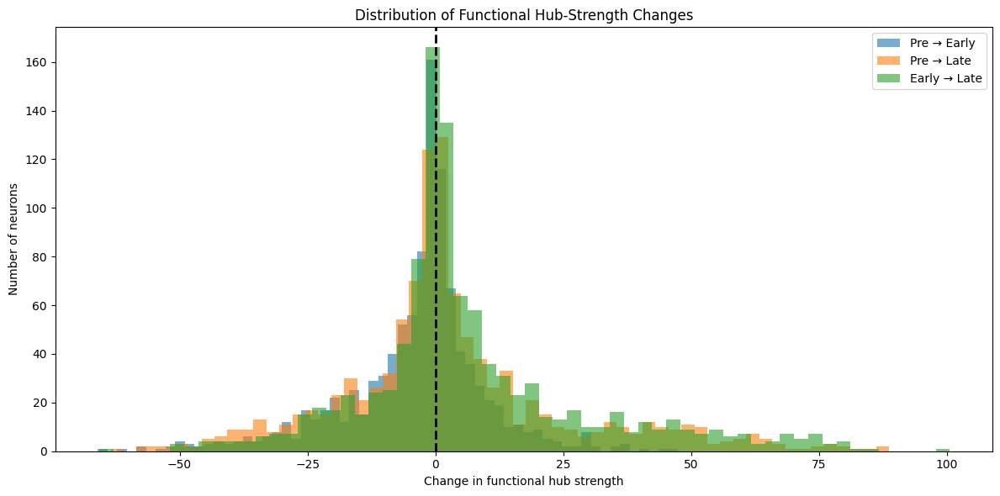

In [196]:
# ============================================================
# STEP 78A — Hub-strength change distributions
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# Accessing validated arrays from hub_strength dictionary defined in Step 77B
pre = hub_strength['pre_stimulus']
early = hub_strength['early_response']
late = hub_strength['late_response']

change_pre_early = early - pre
change_pre_late = late - pre
change_early_late = late - early

plt.figure(figsize=(12, 6))

plt.hist(
    change_pre_early,
    bins=60,
    alpha=0.6,
    label="Pre → Early"
)

plt.hist(
    change_pre_late,
    bins=60,
    alpha=0.6,
    label="Pre → Late"
)

plt.hist(
    change_early_late,
    bins=60,
    alpha=0.6,
    label="Early → Late"
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=2,
    color='black'
)

plt.xlabel("Change in functional hub strength")
plt.ylabel("Number of neurons")
plt.title(
    "Distribution of Functional Hub-Strength Changes"
)

plt.legend()
plt.tight_layout()
plt.show()

**Step 78B — Baseline hub strength versus hub-strength change**

BASELINE HUB STRENGTH vs HUB-STRENGTH CHANGE

Pre → Early
Spearman rho: -0.552875
p-value: 3.176691e-84

Pre → Late
Spearman rho: -0.396837
p-value: 1.608683e-40

Early → Late
Spearman rho: -0.280968
p-value: 2.649352e-20


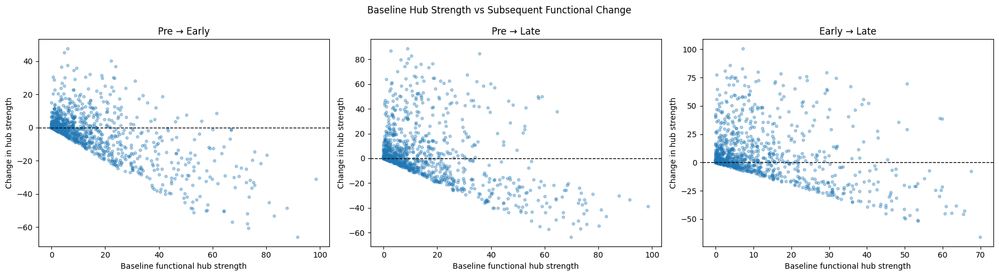

In [197]:
# ============================================================
# STEP 78B — Baseline hub strength vs subsequent change
# ============================================================

from scipy.stats import spearmanr
import numpy as np
import matplotlib.pyplot as plt

# Corrected variable references to match the hub_strength dictionary from Step 77B
pre = hub_strength['pre_stimulus']
early = hub_strength['early_response']
late = hub_strength['late_response']

change_pre_early = early - pre
change_pre_late = late - pre
change_early_late = late - early

comparisons = [
    (
        "Pre → Early",
        pre,
        change_pre_early
    ),
    (
        "Pre → Late",
        pre,
        change_pre_late
    ),
    (
        "Early → Late",
        early,
        change_early_late
    )
]

print("=" * 70)
print("BASELINE HUB STRENGTH vs HUB-STRENGTH CHANGE")
print("=" * 70)

for name, baseline, change in comparisons:

    rho, p_value = spearmanr(
        baseline,
        change
    )

    print("\n" + "=" * 60)
    print(name)
    print("=" * 60)

    print(
        f"Spearman rho: {rho:.6f}"
    )

    print(
        f"p-value: {p_value:.6e}"
    )

# ------------------------------------------------------------
# Visualization
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 5)
)

for ax, (name, baseline, change) in zip(
    axes,
    comparisons
):

    ax.scatter(
        baseline,
        change,
        s=12,
        alpha=0.35
    )

    ax.axhline(
        0,
        linestyle="--",
        linewidth=1,
        color="black"
    )

    ax.set_xlabel(
        "Baseline functional hub strength"
    )

    ax.set_ylabel(
        "Change in hub strength"
    )

    ax.set_title(name)

plt.suptitle(
    "Baseline Hub Strength vs Subsequent Functional Change"
)

plt.tight_layout()
plt.show()

**Step 79 — Normalize hub strength across epochs**

**STEP 79A — Z-score hub strength within each epoch**

In [198]:
# ============================================================
# STEP 79A — Normalize Hub Strength Across Epochs
# ============================================================

print("=" * 70)
print("NORMALIZED FUNCTIONAL HUB STRENGTH")
print("=" * 70)

from scipy.stats import zscore
import numpy as np

hub_strength_z = {}

# Correcting reference from 'hub_strengths' to 'hub_strength' (defined in Step 77B)
for epoch in ["pre_stimulus", "early_response", "late_response"]:

    strength = hub_strength[epoch]

    hub_strength_z[epoch] = zscore(strength)

    print(
        f"{epoch:15s}: "
        f"mean={np.mean(hub_strength_z[epoch]):.6f}, "
        f"std={np.std(hub_strength_z[epoch]):.6f}, "
        f"min={np.min(hub_strength_z[epoch]):.4f}, "
        f"max={np.max(hub_strength_z[epoch]):.4f}"
    )

print("\nNormalized hub-strength arrays created.")

NORMALIZED FUNCTIONAL HUB STRENGTH
pre_stimulus   : mean=-0.000000, std=1.000000, min=-0.8738, max=4.7092
early_response : mean=-0.000000, std=1.000000, min=-0.8602, max=4.2868
late_response  : mean=0.000000, std=1.000000, min=-0.8149, max=4.4894

Normalized hub-strength arrays created.


**STEP 79B — Compare relative hubness between epochs**

In [199]:
# ============================================================
# STEP 79B — Relative Hubness Changes
# ============================================================

from scipy.stats import spearmanr
import numpy as np

epoch_pairs = [
    ("pre_stimulus", "early_response"),
    ("pre_stimulus", "late_response"),
    ("early_response", "late_response")
]

normalized_differences = {}

print("=" * 70)
print("RELATIVE HUBNESS CHANGES")
print("=" * 70)

for epoch1, epoch2 in epoch_pairs:

    z1 = hub_strength_z[epoch1]
    z2 = hub_strength_z[epoch2]

    delta_z = z2 - z1
    normalized_differences[f"{epoch1}_vs_{epoch2}"] = delta_z

    rho, p = spearmanr(z1, z2)

    print(f"\n{epoch1} → {epoch2}")
    print(f"Mean Δz: {np.mean(delta_z):.6f}")
    print(f"Median Δz: {np.median(delta_z):.6f}")
    print(f"Std Δz: {np.std(delta_z):.6f}")
    print(f"Fraction increasing: {np.mean(delta_z > 0) * 100:.2f}%")
    print(f"Spearman rank correlation: {rho:.4f}")
    print(f"p-value: {p:.6e}")

RELATIVE HUBNESS CHANGES

pre_stimulus → early_response
Mean Δz: 0.000000
Median Δz: 0.013546
Std Δz: 0.872520
Fraction increasing: 52.26%
Spearman rank correlation: 0.6159
p-value: 1.646435e-109

pre_stimulus → late_response
Mean Δz: 0.000000
Median Δz: 0.024061
Std Δz: 1.126185
Fraction increasing: 52.55%
Spearman rank correlation: 0.4687
p-value: 7.423114e-58

early_response → late_response
Mean Δz: 0.000000
Median Δz: 0.022885
Std Δz: 1.191203
Fraction increasing: 52.07%
Spearman rank correlation: 0.4023
p-value: 1.055444e-41


**STEP 79C — Plot relative hubness changes**

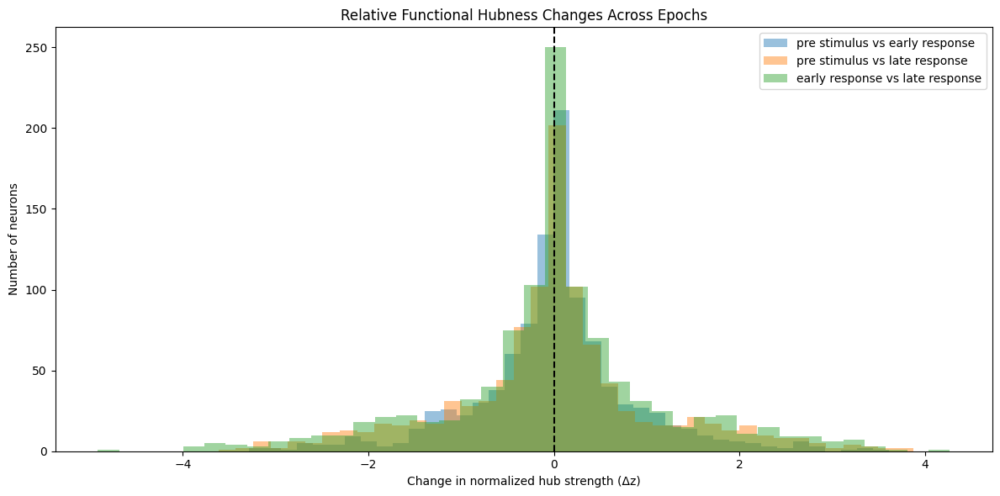

In [200]:
# ============================================================
# STEP 79C — Plot Normalized Hubness Changes
# ============================================================

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

for label, delta_z in normalized_differences.items():

    plt.hist(
        delta_z,
        bins=40,
        alpha=0.45,
        label=label.replace("_", " ")
    )

plt.axvline(
    0,
    linestyle="--",
    linewidth=1.5,
    color='black'
)

plt.xlabel("Change in normalized hub strength (Δz)")
plt.ylabel("Number of neurons")
plt.title("Relative Functional Hubness Changes Across Epochs")
plt.legend()

plt.tight_layout()
plt.show()

**STEP 80A — Align network activity to canonical 1039 neurons**

In [201]:
# ============================================================
# STEP 80A-FIX — Identify and Align Canonical 1039 Neurons
# ============================================================

print("=" * 70)
print("ALIGNING NETWORK ACTIVITY TO CANONICAL NEURON POPULATION")
print("=" * 70)

print("Original network_activity shape:", network_activity.shape)

# ------------------------------------------------------------
# Look for the canonical neuron-index variable created earlier
# ------------------------------------------------------------

candidate_names = [
    "common_neuron_indices",
    "canonical_neuron_indices",
    "common_valid_neurons",
    "canonical_indices",
    "common_neurons",
]

found_candidates = []

for name in candidate_names:
    if name in globals():
        value = globals()[name]

        try:
            length = len(value)

            if length == 1039:
                found_candidates.append(name)
                print(
                    f"Found candidate: {name} "
                    f"(length={length})"
                )
        except TypeError:
            pass


# ------------------------------------------------------------
# If a canonical index array exists, use it
# ------------------------------------------------------------

if len(found_candidates) == 1:

    canonical_name = found_candidates[0]
    canonical_indices = np.asarray(
        globals()[canonical_name]
    ).astype(int)

    print(
        "\nUsing canonical neuron index array:",
        canonical_name
    )

    print(
        "Canonical neuron count:",
        len(canonical_indices)
    )

    print(
        "Minimum index:",
        canonical_indices.min()
    )

    print(
        "Maximum index:",
        canonical_indices.max()
    )

    # Align network activity
    network_activity_canonical = (
        network_activity[
            :,
            canonical_indices,
            :
        ]
    )

    print(
        "\nAligned network activity shape:",
        network_activity_canonical.shape
    )


elif len(found_candidates) > 1:

    print(
        "\nMultiple possible canonical index arrays found:"
    )

    for name in found_candidates:
        print(" -", name)

    print(
        "\nSTOP here and send me this output so we can "
        "select the correct one."
    )


else:

    print(
        "\nNo existing 1039-neuron canonical index array "
        "was found."
    )

    print(
        "We will reconstruct the canonical population "
        "from the original network activity."
    )

    # --------------------------------------------------------
    # Reconstruct canonical population
    # --------------------------------------------------------

    epoch_bin_ranges = {
        "pre_stimulus": (0, 5),
        "early_response": (5, 10),
        "late_response": (10, 20)
    }

    epoch_valid_masks = {}

    for epoch, (start_bin, end_bin) in epoch_bin_ranges.items():

        epoch_data = network_activity[
            :,
            :,
            start_bin:end_bin
        ]

        # Average within epoch
        epoch_mean = epoch_data.mean(axis=2)

        # Variance across trials
        variance = np.var(
            epoch_mean,
            axis=0
        )

        valid = variance > 0

        epoch_valid_masks[epoch] = valid

        print(
            epoch,
            "valid neurons:",
            int(valid.sum())
        )

    canonical_mask = (
        epoch_valid_masks["pre_stimulus"]
        &
        epoch_valid_masks["early_response"]
        &
        epoch_valid_masks["late_response"]
    )

    canonical_indices = np.where(
        canonical_mask
    )[0]

    print(
        "\nReconstructed canonical population:",
        len(canonical_indices)
    )

    if len(canonical_indices) != 1039:

        print(
            "\nWARNING: reconstructed population is not "
            "1039 neurons."
        )

        print(
            "Expected: 1039"
        )

        print(
            "Found:",
            len(canonical_indices)
        )

        print(
            "\nSTOP here and send me this output."
        )

    else:

        network_activity_canonical = (
            network_activity[
                :,
                canonical_indices,
                :
            ]
        )

        print(
            "Aligned network activity shape:",
            network_activity_canonical.shape
        )

ALIGNING NETWORK ACTIVITY TO CANONICAL NEURON POPULATION
Original network_activity shape: (140, 1085, 20)
Found candidate: common_neuron_indices (length=1039)

Using canonical neuron index array: common_neuron_indices
Canonical neuron count: 1039
Minimum index: 0
Maximum index: 1084

Aligned network activity shape: (140, 1039, 20)


**STEP 80B — Choice-dependent hub strength**

In [202]:
# ============================================================
# STEP 80B — Choice-Dependent Functional Hub Strength
# ============================================================

print("=" * 70)
print("CHOICE-DEPENDENT FUNCTIONAL HUB STRENGTH")
print("=" * 70)

# ------------------------------------------------------------
# Epoch definitions
# ------------------------------------------------------------

epoch_bin_ranges = {
    "pre_stimulus": (0, 5),
    "early_response": (5, 10),
    "late_response": (10, 20)
}

choice_masks = {
    -1: binary_labels == -1,
    +1: binary_labels == 1
}

# ------------------------------------------------------------
# Confirm canonical population
# ------------------------------------------------------------

print(
    "Canonical network activity shape:",
    network_activity_canonical.shape
)

assert network_activity_canonical.shape == (
    len(binary_labels),
    1039,
    20
), (
    "Canonical network activity does not have "
    "the expected shape."
)

# ------------------------------------------------------------
# Compute choice-specific connectivity and hub strength
# ------------------------------------------------------------

choice_hub_strength = {}

for epoch, (start_bin, end_bin) in epoch_bin_ranges.items():

    print("\n" + "=" * 60)
    print("Epoch:", epoch)
    print("=" * 60)

    epoch_activity = network_activity_canonical[
        :,
        :,
        start_bin:end_bin
    ]

    # Average activity across bins within the epoch
    epoch_trial_activity = epoch_activity.mean(axis=2)

    choice_hub_strength[epoch] = {}

    for choice in [-1, +1]:

        mask = choice_masks[choice]

        choice_activity = epoch_trial_activity[mask]

        # ----------------------------------------------------
        # Identify neurons with non-zero variance
        # ----------------------------------------------------

        neuron_variance = np.var(
            choice_activity,
            axis=0
        )

        valid_neurons = neuron_variance > 0

        choice_activity_valid = (
            choice_activity[:, valid_neurons]
        )

        # ----------------------------------------------------
        # Pearson correlation
        # ----------------------------------------------------

        corr = np.corrcoef(
            choice_activity_valid,
            rowvar=False
        )

        corr = np.nan_to_num(
            corr,
            nan=0.0,
            posinf=0.0,
            neginf=0.0
        )

        np.fill_diagonal(corr, 0)

        # ----------------------------------------------------
        # Threshold positive functional connections
        # ----------------------------------------------------

        adjacency = np.where(
            corr > CORR_THRESHOLD,
            corr,
            0
        )

        # ----------------------------------------------------
        # Functional hub strength
        # ----------------------------------------------------

        strength = adjacency.sum(axis=1)

        # Restore canonical 1039-neuron space
        full_strength = np.full(
            1039,
            np.nan,
            dtype=np.float64
        )

        full_strength[valid_neurons] = strength

        choice_hub_strength[epoch][choice] = (
            full_strength
        )

        print(
            f"Choice {choice:+d}: "
            f"valid neurons={valid_neurons.sum()} | "
            f"mean strength={np.nanmean(strength):.4f} | "
            f"median strength={np.nanmedian(strength):.4f} | "
            f"max strength={np.nanmax(strength):.4f}"
        )

print(
    "\nChoice-dependent hub-strength calculation complete."
)

CHOICE-DEPENDENT FUNCTIONAL HUB STRENGTH
Canonical network activity shape: (140, 1039, 20)

Epoch: pre_stimulus
Choice -1: valid neurons=1009 | mean strength=22.9555 | median strength=15.8356 | max strength=100.9610
Choice +1: valid neurons=1026 | mean strength=24.7808 | median strength=17.0931 | max strength=107.8216

Epoch: early_response
Choice -1: valid neurons=986 | mean strength=14.1086 | median strength=9.7395 | max strength=77.6433
Choice +1: valid neurons=1024 | mean strength=21.9441 | median strength=14.2888 | max strength=100.7119

Epoch: late_response
Choice -1: valid neurons=1014 | mean strength=20.5092 | median strength=13.6118 | max strength=106.0856
Choice +1: valid neurons=1029 | mean strength=24.2487 | median strength=14.7313 | max strength=127.4501

Choice-dependent hub-strength calculation complete.


**STEP 80C — Matched choice-dependent hub-strength differences**

In [203]:
# ============================================================
# STEP 80C — Matched Choice-Dependent Hub Strength
# ============================================================

print("=" * 70)
print("MATCHED CHOICE-DEPENDENT HUB-STRENGTH DIFFERENCES")
print("=" * 70)

choice_hub_difference = {}
choice_hub_matched = {}

for epoch in epoch_bin_ranges.keys():

    strength_minus = choice_hub_strength[epoch][-1]
    strength_plus = choice_hub_strength[epoch][+1]

    # --------------------------------------------------------
    # Only neurons valid in BOTH choices
    # --------------------------------------------------------

    matched_mask = (
        np.isfinite(strength_minus)
        &
        np.isfinite(strength_plus)
    )

    matched_minus = strength_minus[matched_mask]
    matched_plus = strength_plus[matched_mask]

    difference = (
        matched_plus -
        matched_minus
    )

    choice_hub_matched[epoch] = {
        -1: matched_minus,
        +1: matched_plus
    }

    choice_hub_difference[epoch] = difference

    print("\n" + "=" * 60)
    print(epoch)
    print("=" * 60)

    print(
        "Matched neurons:",
        len(difference)
    )

    print(
        "Choice -1 mean:",
        f"{np.mean(matched_minus):.4f}"
    )

    print(
        "Choice +1 mean:",
        f"{np.mean(matched_plus):.4f}"
    )

    print(
        "Observed mean Δ strength (+1 − -1):",
        f"{np.mean(difference):.4f}"
    )

    print(
        "Median Δ strength:",
        f"{np.median(difference):.4f}"
    )

    print(
        "Std Δ strength:",
        f"{np.std(difference, ddof=1):.4f}"
    )

    print(
        "Fraction increasing:",
        f"{np.mean(difference > 0) * 100:.2f}%"
    )

print(
    "\nMatched choice-dependent hub-strength "
    "differences calculated."
)

MATCHED CHOICE-DEPENDENT HUB-STRENGTH DIFFERENCES

pre_stimulus
Matched neurons: 996
Choice -1 mean: 23.0230
Choice +1 mean: 24.6258
Observed mean Δ strength (+1 − -1): 1.6028
Median Δ strength: 0.6232
Std Δ strength: 18.2231
Fraction increasing: 51.61%

early_response
Matched neurons: 971
Choice -1 mean: 13.9984
Choice +1 mean: 21.2211
Observed mean Δ strength (+1 − -1): 7.2228
Median Δ strength: 2.8742
Std Δ strength: 19.0853
Fraction increasing: 62.82%

late_response
Matched neurons: 1004
Choice -1 mean: 20.5733
Choice +1 mean: 24.3009
Observed mean Δ strength (+1 − -1): 3.7276
Median Δ strength: 0.3929
Std Δ strength: 20.4640
Fraction increasing: 51.00%

Matched choice-dependent hub-strength differences calculated.


**STEP 80D — Paired permutation test of choice-dependent hub strength**

In [204]:
# ============================================================
# STEP 80D — Paired Permutation Test
# Choice-Dependent Hub Strength
# ============================================================

print("=" * 70)
print("CHOICE-DEPENDENT HUB-STRENGTH PERMUTATION TEST")
print("=" * 70)

N_PERMUTATIONS = 5000

rng = np.random.default_rng(42)

hub_strength_perm_results = {}

for epoch in epoch_bin_ranges.keys():

    difference = choice_hub_difference[epoch]

    observed_difference = np.mean(difference)

    n_neurons = len(difference)

    print("\n" + "=" * 60)
    print("PERMUTATION TEST:", epoch)
    print("=" * 60)

    print(
        "Matched neurons:",
        n_neurons
    )

    print(
        "Observed mean Δ strength:",
        f"{observed_difference:.6f}"
    )

    # --------------------------------------------------------
    # Paired sign-flipping permutation
    #
    # Under the null hypothesis, the direction of the
    # difference (+1 vs -1) is exchangeable for each neuron.
    # --------------------------------------------------------

    permutation_means = np.empty(
        N_PERMUTATIONS,
        dtype=np.float64
    )

    for perm_idx in range(N_PERMUTATIONS):

        signs = rng.choice(
            [-1, 1],
            size=n_neurons
        )

        permuted_difference = (
            difference * signs
        )

        permutation_means[perm_idx] = (
            np.mean(permuted_difference)
        )

    # --------------------------------------------------------
    # Two-sided permutation p-value
    # --------------------------------------------------------

    p_value = (
        np.sum(
            np.abs(permutation_means)
            >=
            np.abs(observed_difference)
        ) + 1
    ) / (
        N_PERMUTATIONS + 1
    )

    hub_strength_perm_results[epoch] = {
        "observed_difference": observed_difference,
        "permutation_means": permutation_means,
        "p_value": p_value,
        "n_neurons": n_neurons
    }

    print(
        "Permutation p-value:",
        f"{p_value:.6f}"
    )

print(
    "\nPaired hub-strength permutation testing complete."
)

CHOICE-DEPENDENT HUB-STRENGTH PERMUTATION TEST

PERMUTATION TEST: pre_stimulus
Matched neurons: 996
Observed mean Δ strength: 1.602839
Permutation p-value: 0.007199

PERMUTATION TEST: early_response
Matched neurons: 971
Observed mean Δ strength: 7.222768
Permutation p-value: 0.000200

PERMUTATION TEST: late_response
Matched neurons: 1004
Observed mean Δ strength: 3.727601
Permutation p-value: 0.000200

Paired hub-strength permutation testing complete.


**STEP 80E — FDR correction + effect sizes**

In [205]:
# ============================================================
# STEP 80E — FDR Correction + Effect Sizes
# Choice-Dependent Hub Strength
# ============================================================

from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests

print("=" * 70)
print("CHOICE-DEPENDENT HUB STRENGTH — FDR + EFFECT SIZES")
print("=" * 70)

epochs = list(epoch_bin_ranges.keys())

raw_p_values = np.array([
    hub_strength_perm_results[epoch]["p_value"]
    for epoch in epochs
])

# ------------------------------------------------------------
# FDR correction across the three epochs
# ------------------------------------------------------------

reject, fdr_p_values, _, _ = multipletests(
    raw_p_values,
    alpha=0.05,
    method="fdr_bh"
)

hub_strength_stats = {}

for i, epoch in enumerate(epochs):

    minus = choice_hub_matched[epoch][-1]
    plus = choice_hub_matched[epoch][+1]

    difference = (
        plus - minus
    )

    mean_difference = np.mean(
        difference
    )

    median_difference = np.median(
        difference
    )

    std_difference = np.std(
        difference,
        ddof=1
    )

    # --------------------------------------------------------
    # Cohen's dz for paired data
    # --------------------------------------------------------

    cohens_dz = (
        mean_difference /
        std_difference
    )

    # --------------------------------------------------------
    # Percentage change
    # --------------------------------------------------------

    mean_minus = np.mean(minus)
    mean_plus = np.mean(plus)

    percent_change = (
        (mean_plus - mean_minus)
        /
        mean_minus
        * 100
    )

    fraction_increasing = np.mean(
        difference > 0
    )

    hub_strength_stats[epoch] = {
        "mean_minus": mean_minus,
        "mean_plus": mean_plus,
        "mean_difference": mean_difference,
        "median_difference": median_difference,
        "std_difference": std_difference,
        "cohens_dz": cohens_dz,
        "percent_change": percent_change,
        "fraction_increasing": fraction_increasing,
        "raw_p": raw_p_values[i],
        "fdr_p": fdr_p_values[i],
        "significant": reject[i]
    }

    print("\n" + "=" * 60)
    print(epoch)
    print("=" * 60)

    print(
        "Choice -1 mean strength:",
        f"{mean_minus:.4f}"
    )

    print(
        "Choice +1 mean strength:",
        f"{mean_plus:.4f}"
    )

    print(
        "Mean Δ strength (+1 − -1):",
        f"{mean_difference:.4f}"
    )

    print(
        "Median Δ strength:",
        f"{median_difference:.4f}"
    )

    print(
        "Cohen's dz:",
        f"{cohens_dz:.4f}"
    )

    print(
        "Mean percentage change:",
        f"{percent_change:.2f}%"
    )

    print(
        "Fraction increasing:",
        f"{fraction_increasing * 100:.2f}%"
    )

    print(
        "Raw p-value:",
        f"{raw_p_values[i]:.6f}"
    )

    print(
        "FDR-corrected p-value:",
        f"{fdr_p_values[i]:.6f}"
    )

    print(
        "FDR significant:",
        bool(reject[i])
    )

print("\n" + "=" * 70)
print("FDR correction and effect-size analysis complete.")
print("=" * 70)

CHOICE-DEPENDENT HUB STRENGTH — FDR + EFFECT SIZES

pre_stimulus
Choice -1 mean strength: 23.0230
Choice +1 mean strength: 24.6258
Mean Δ strength (+1 − -1): 1.6028
Median Δ strength: 0.6232
Cohen's dz: 0.0880
Mean percentage change: 6.96%
Fraction increasing: 51.61%
Raw p-value: 0.007199
FDR-corrected p-value: 0.007199
FDR significant: True

early_response
Choice -1 mean strength: 13.9984
Choice +1 mean strength: 21.2211
Mean Δ strength (+1 − -1): 7.2228
Median Δ strength: 2.8742
Cohen's dz: 0.3784
Mean percentage change: 51.60%
Fraction increasing: 62.82%
Raw p-value: 0.000200
FDR-corrected p-value: 0.000300
FDR significant: True

late_response
Choice -1 mean strength: 20.5733
Choice +1 mean strength: 24.3009
Mean Δ strength (+1 − -1): 3.7276
Median Δ strength: 0.3929
Cohen's dz: 0.1822
Mean percentage change: 18.12%
Fraction increasing: 51.00%
Raw p-value: 0.000200
FDR-corrected p-value: 0.000300
FDR significant: True

FDR correction and effect-size analysis complete.


**Step 81 — Identify choice-dependent hub neurons**

In [206]:
# ============================================================
# STEP 81A — Identify Choice-Dependent Hub Neurons
# ============================================================

import numpy as np

print("=" * 70)
print("CHOICE-DEPENDENT HUB NEURONS")
print("=" * 70)

choice_hub_results = {}

# Mapping our epochs to the matched indices found in Step 61A
for epoch in ["pre_stimulus", "early_response", "late_response"]:

    # Use the common indices established in Step 61A
    matched_idx = choice_common_neurons[epoch]

    # Choice-specific hub-strength arrays from Step 80B
    # Note: keys are integers -1 and 1 in choice_hub_strength
    minus_strength = choice_hub_strength[epoch][-1]
    plus_strength  = choice_hub_strength[epoch][+1]

    # Extract values for the matched neurons only
    minus_matched = minus_strength[matched_idx]
    plus_matched  = plus_strength[matched_idx]

    # Calculate choice-dependent difference (Delta Strength)
    delta_strength = plus_matched - minus_matched

    # Rank neurons by absolute change magnitude
    abs_rank = np.argsort(np.abs(delta_strength))[::-1]

    # Rank neurons by most positive (favoring +1) and most negative (favoring -1)
    positive_rank = np.argsort(delta_strength)[::-1]
    negative_rank = np.argsort(delta_strength)

    choice_hub_results[epoch] = {
        "matched_indices": matched_idx,
        "minus_strength": minus_matched,
        "plus_strength": plus_matched,
        "delta_strength": delta_strength,
        "absolute_rank": abs_rank,
        "positive_rank": positive_rank,
        "negative_rank": negative_rank
    }

    print("\n" + "=" * 60)
    print(f"EPOCH: {epoch}")
    print("=" * 60)

    print(f"Matched neurons: {len(matched_idx)}")
    print(f"Mean Δ strength: {np.mean(delta_strength):.4f}")
    print(f"Median Δ strength: {np.median(delta_strength):.4f}")
    print(f"Maximum positive Δ (Favors +1): {np.max(delta_strength):.4f}")
    print(f"Maximum negative Δ (Favors -1): {np.min(delta_strength):.4f}")

    print("\nTop 10 neurons favoring +1:")
    for rank, idx in enumerate(positive_rank[:10], 1):
        neuron_id = matched_idx[idx]
        print(
            f"{rank:2d}. Neuron {neuron_id:4d} | "
            f"Δ={delta_strength[idx]:+.4f} | "
            f"-1 strength={minus_matched[idx]:.2f} | "
            f"+1 strength={plus_matched[idx]:.2f}"
        )

    print("\nTop 10 neurons favoring -1:")
    for rank, idx in enumerate(negative_rank[:10], 1):
        neuron_id = matched_idx[idx]
        print(
            f"{rank:2d}. Neuron {neuron_id:4d} | "
            f"Δ={delta_strength[idx]:+.4f} | "
            f"-1 strength={minus_matched[idx]:.2f} | "
            f"+1 strength={plus_matched[idx]:.2f}"
        )

print("\nChoice-dependent hub neuron identification complete.")

CHOICE-DEPENDENT HUB NEURONS

EPOCH: pre_stimulus
Matched neurons: 996
Mean Δ strength: 1.6028
Median Δ strength: 0.6232
Maximum positive Δ (Favors +1): 79.6180
Maximum negative Δ (Favors -1): -77.9330

Top 10 neurons favoring +1:
 1. Neuron  385 | Δ=+79.6180 | -1 strength=10.20 | +1 strength=89.82
 2. Neuron  855 | Δ=+74.4466 | -1 strength=1.63 | +1 strength=76.08
 3. Neuron   56 | Δ=+72.3581 | -1 strength=14.25 | +1 strength=86.61
 4. Neuron  218 | Δ=+68.2432 | -1 strength=22.41 | +1 strength=90.66
 5. Neuron  296 | Δ=+60.6613 | -1 strength=18.73 | +1 strength=79.39
 6. Neuron  715 | Δ=+59.3845 | -1 strength=27.96 | +1 strength=87.35
 7. Neuron  146 | Δ=+59.1795 | -1 strength=12.07 | +1 strength=71.25
 8. Neuron 1026 | Δ=+56.8782 | -1 strength=15.19 | +1 strength=72.07
 9. Neuron  593 | Δ=+56.0429 | -1 strength=4.30 | +1 strength=60.34
10. Neuron  350 | Δ=+54.7600 | -1 strength=20.16 | +1 strength=74.92

Top 10 neurons favoring -1:
 1. Neuron  839 | Δ=-77.9330 | -1 strength=89.73 | +

**Step 81B — Distribution and symmetry of choice-dependent hub changes**

CHOICE-DEPENDENT HUB-STRENGTH CHANGE DISTRIBUTIONS

pre_stimulus
Number of matched neurons: 996
Mean Δ: 1.6028
Median Δ: 0.6232
Std Δ: 18.2231
Positive Δ: 514 (51.61%)
Negative Δ: 482 (48.39%)
|Δ| > 10: 443 (44.48%)
|Δ| > 20: 214 (21.49%)
|Δ| > 30: 117 (11.75%)


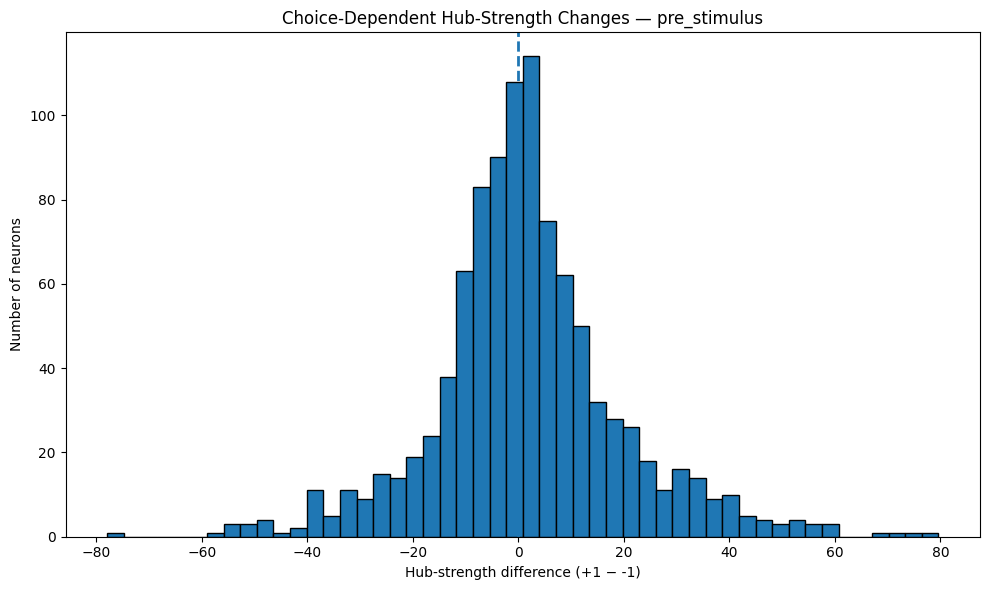


early_response
Number of matched neurons: 971
Mean Δ: 7.2228
Median Δ: 2.8742
Std Δ: 19.0853
Positive Δ: 610 (62.82%)
Negative Δ: 361 (37.18%)
|Δ| > 10: 405 (41.71%)
|Δ| > 20: 226 (23.27%)
|Δ| > 30: 131 (13.49%)


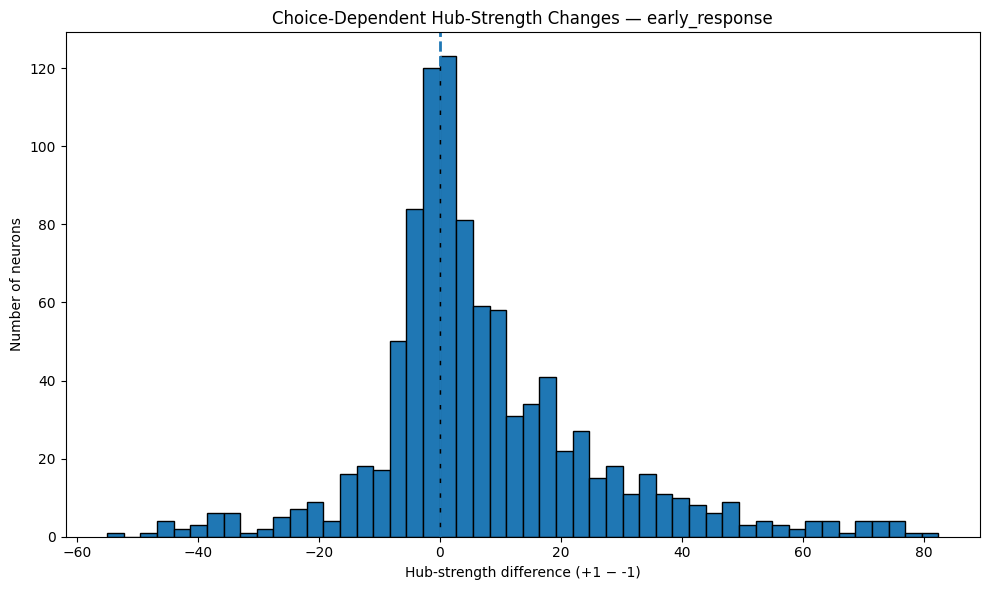


late_response
Number of matched neurons: 1004
Mean Δ: 3.7276
Median Δ: 0.3929
Std Δ: 20.4640
Positive Δ: 512 (51.00%)
Negative Δ: 492 (49.00%)
|Δ| > 10: 453 (45.12%)
|Δ| > 20: 237 (23.61%)
|Δ| > 30: 131 (13.05%)


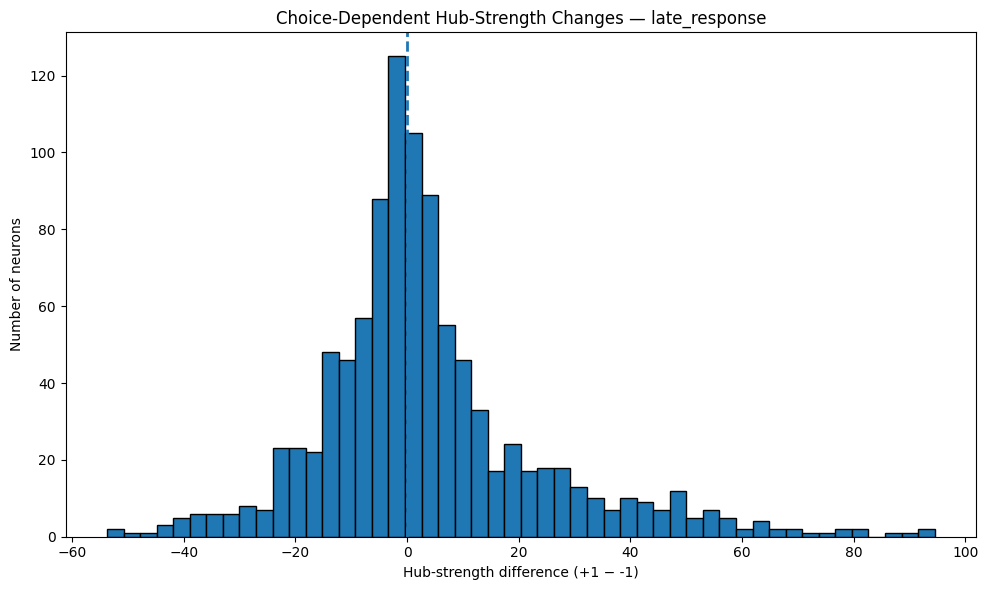


Choice-dependent hub distribution analysis complete.


In [207]:
# ============================================================
# STEP 81B — Distribution of Choice-Dependent Hub Changes
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("=" * 70)
print("CHOICE-DEPENDENT HUB-STRENGTH CHANGE DISTRIBUTIONS")
print("=" * 70)

for epoch in ["pre_stimulus", "early_response", "late_response"]:

    result = choice_hub_results[epoch]

    delta = result["delta_strength"]

    print("\n" + "=" * 60)
    print(epoch)
    print("=" * 60)

    print("Number of matched neurons:", len(delta))
    print("Mean Δ:", f"{np.mean(delta):.4f}")
    print("Median Δ:", f"{np.median(delta):.4f}")
    print("Std Δ:", f"{np.std(delta, ddof=1):.4f}")

    print(
        "Positive Δ:",
        f"{np.sum(delta > 0)} "
        f"({100*np.mean(delta > 0):.2f}%)"
    )

    print(
        "Negative Δ:",
        f"{np.sum(delta < 0)} "
        f"({100*np.mean(delta < 0):.2f}%)"
    )

    print(
        "|Δ| > 10:",
        f"{np.sum(np.abs(delta) > 10)} "
        f"({100*np.mean(np.abs(delta) > 10):.2f}%)"
    )

    print(
        "|Δ| > 20:",
        f"{np.sum(np.abs(delta) > 20)} "
        f"({100*np.mean(np.abs(delta) > 20):.2f}%)"
    )

    print(
        "|Δ| > 30:",
        f"{np.sum(np.abs(delta) > 30)} "
        f"({100*np.mean(np.abs(delta) > 30):.2f}%)"
    )

    # Histogram
    plt.figure(figsize=(10, 6))

    plt.hist(
        delta,
        bins=50,
        edgecolor="black"
    )

    plt.axvline(
        0,
        linestyle="--",
        linewidth=2
    )

    plt.xlabel(
        "Hub-strength difference (+1 − -1)"
    )

    plt.ylabel(
        "Number of neurons"
    )

    plt.title(
        f"Choice-Dependent Hub-Strength Changes — {epoch}"
    )

    plt.tight_layout()
    plt.show()

print("\nChoice-dependent hub distribution analysis complete.")

**Step 82A — Are choice-dependent neurons enriched among functional hubs?**

In [208]:
# ============================================================
# STEP 82A — Choice-Dependent Hub Enrichment
# ============================================================

import numpy as np

print("=" * 70)
print("CHOICE-DEPENDENT HUB ENRICHMENT")
print("=" * 70)

hub_enrichment_results = {}

for epoch in ["pre_stimulus", "early_response", "late_response"]:

    result = choice_hub_results[epoch]

    matched_idx = result["matched_indices"]
    delta = result["delta_strength"]

    minus_strength = result["minus_strength"]
    plus_strength = result["plus_strength"]

    print("\n" + "=" * 60)
    print(f"EPOCH: {epoch}")
    print("=" * 60)

    # --------------------------------------------------------
    # Define strongly choice-dependent neurons
    # --------------------------------------------------------

    n = len(delta)

    top_1_n = max(1, int(np.ceil(0.01 * n)))
    top_5_n = max(1, int(np.ceil(0.05 * n)))
    top_10_n = max(1, int(np.ceil(0.10 * n)))

    # Largest positive changes
    positive_order = np.argsort(delta)[::-1]

    top1_positive = positive_order[:top_1_n]
    top5_positive = positive_order[:top_5_n]
    top10_positive = positive_order[:top_10_n]

    # Largest negative changes
    negative_order = np.argsort(delta)

    top1_negative = negative_order[:top_1_n]
    top5_negative = negative_order[:top_5_n]
    top10_negative = negative_order[:top_10_n]

    # --------------------------------------------------------
    # Determine whether these neurons are also hubs
    # --------------------------------------------------------

    # Rank neurons separately in each choice
    minus_rank = np.argsort(
        np.argsort(-minus_strength)
    )

    plus_rank = np.argsort(
        np.argsort(-plus_strength)
    )

    # Top 10% functional hubs
    hub_cutoff = int(np.ceil(0.10 * n))

    minus_hubs = minus_rank < hub_cutoff
    plus_hubs = plus_rank < hub_cutoff

    print(
        "Matched neurons:",
        n
    )

    print(
        "Top 10% hub cutoff:",
        hub_cutoff,
        "neurons"
    )

    # --------------------------------------------------------
    # Positive choice-dependent neurons
    # --------------------------------------------------------

    print("\n--- Neurons favoring +1 ---")

    for label, indices in [
        ("Top 1%", top1_positive),
        ("Top 5%", top5_positive),
        ("Top 10%", top10_positive)
    ]:

        n_minus_hubs = np.sum(
            minus_hubs[indices]
        )

        n_plus_hubs = np.sum(
            plus_hubs[indices]
        )

        print(
            f"{label}: "
            f"{len(indices)} neurons | "
            f"-1 hubs = {n_minus_hubs} "
            f"({100*n_minus_hubs/len(indices):.2f}%) | "
            f"+1 hubs = {n_plus_hubs} "
            f"({100*n_plus_hubs/len(indices):.2f}%)"
        )

    # --------------------------------------------------------
    # Negative choice-dependent neurons
    # --------------------------------------------------------

    print("\n--- Neurons favoring -1 ---")

    for label, indices in [
        ("Top 1%", top1_negative),
        ("Top 5%", top5_negative),
        ("Top 10%", top10_negative)
    ]:

        n_minus_hubs = np.sum(
            minus_hubs[indices]
        )

        n_plus_hubs = np.sum(
            plus_hubs[indices]
        )

        print(
            f"{label}: "
            f"{len(indices)} neurons | "
            f"-1 hubs = {n_minus_hubs} "
            f"({100*n_minus_hubs/len(indices):.2f}%) | "
            f"+1 hubs = {n_plus_hubs} "
            f"({100*n_plus_hubs/len(indices):.2f}%)"
        )

    # --------------------------------------------------------
    # Store results
    # --------------------------------------------------------

    hub_enrichment_results[epoch] = {
        "positive_top1": matched_idx[top1_positive],
        "positive_top5": matched_idx[top5_positive],
        "positive_top10": matched_idx[top10_positive],
        "negative_top1": matched_idx[top1_negative],
        "negative_top5": matched_idx[top5_negative],
        "negative_top10": matched_idx[top10_negative],
        "minus_hubs": minus_hubs,
        "plus_hubs": plus_hubs
    }

print("\nChoice-dependent hub enrichment analysis complete.")

CHOICE-DEPENDENT HUB ENRICHMENT

EPOCH: pre_stimulus
Matched neurons: 996
Top 10% hub cutoff: 100 neurons

--- Neurons favoring +1 ---
Top 1%: 10 neurons | -1 hubs = 0 (0.00%) | +1 hubs = 10 (100.00%)
Top 5%: 50 neurons | -1 hubs = 1 (2.00%) | +1 hubs = 33 (66.00%)
Top 10%: 100 neurons | -1 hubs = 2 (2.00%) | +1 hubs = 42 (42.00%)

--- Neurons favoring -1 ---
Top 1%: 10 neurons | -1 hubs = 9 (90.00%) | +1 hubs = 0 (0.00%)
Top 5%: 50 neurons | -1 hubs = 28 (56.00%) | +1 hubs = 1 (2.00%)
Top 10%: 100 neurons | -1 hubs = 38 (38.00%) | +1 hubs = 2 (2.00%)

EPOCH: early_response
Matched neurons: 971
Top 10% hub cutoff: 98 neurons

--- Neurons favoring +1 ---
Top 1%: 10 neurons | -1 hubs = 0 (0.00%) | +1 hubs = 10 (100.00%)
Top 5%: 49 neurons | -1 hubs = 1 (2.04%) | +1 hubs = 46 (93.88%)
Top 10%: 98 neurons | -1 hubs = 9 (9.18%) | +1 hubs = 68 (69.39%)

--- Neurons favoring -1 ---
Top 1%: 10 neurons | -1 hubs = 10 (100.00%) | +1 hubs = 0 (0.00%)
Top 5%: 49 neurons | -1 hubs = 43 (87.76%) | +

**Step 82B — Statistical test of hub enrichment**

In [209]:
# ============================================================
# STEP 82B — Permutation Test of Choice-Dependent Hub Enrichment
# ============================================================

import numpy as np

print("=" * 70)
print("STATISTICAL TEST OF CHOICE-DEPENDENT HUB ENRICHMENT")
print("=" * 70)

N_PERMUTATIONS = 5000
rng = np.random.default_rng(42)

hub_enrichment_stats = {}

for epoch in ["pre_stimulus", "early_response", "late_response"]:

    result = choice_hub_results[epoch]

    delta = result["delta_strength"]
    minus_strength = result["minus_strength"]
    plus_strength = result["plus_strength"]

    n = len(delta)

    print("\n" + "=" * 60)
    print(f"EPOCH: {epoch}")
    print("=" * 60)

    # --------------------------------------------------------
    # Top 5% choice-dependent neurons
    # --------------------------------------------------------

    k = max(1, int(np.ceil(0.05 * n)))

    positive_idx = np.argsort(delta)[::-1][:k]
    negative_idx = np.argsort(delta)[:k]

    # --------------------------------------------------------
    # Top 10% functional hubs
    # --------------------------------------------------------

    hub_k = max(1, int(np.ceil(0.10 * n)))

    minus_rank = np.argsort(np.argsort(-minus_strength))
    plus_rank = np.argsort(np.argsort(-plus_strength))

    minus_hubs = minus_rank < hub_k
    plus_hubs = plus_rank < hub_k

    # Observed enrichment counts
    observed_positive = np.sum(
        plus_hubs[positive_idx]
    )

    observed_negative = np.sum(
        minus_hubs[negative_idx]
    )

    # --------------------------------------------------------
    # Permutation distributions
    # --------------------------------------------------------

    perm_positive = np.zeros(N_PERMUTATIONS)
    perm_negative = np.zeros(N_PERMUTATIONS)

    for p in range(N_PERMUTATIONS):

        shuffled_idx = rng.permutation(n)

        random_positive = shuffled_idx[:k]
        random_negative = shuffled_idx[:k]

        perm_positive[p] = np.sum(
            plus_hubs[random_positive]
        )

        perm_negative[p] = np.sum(
            minus_hubs[random_negative]
        )

    # --------------------------------------------------------
    # One-sided enrichment p-values
    # --------------------------------------------------------

    p_positive = (
        np.sum(perm_positive >= observed_positive) + 1
    ) / (N_PERMUTATIONS + 1)

    p_negative = (
        np.sum(perm_negative >= observed_negative) + 1
    ) / (N_PERMUTATIONS + 1)

    # Enrichment ratios
    expected = k * 0.10

    enrichment_positive = (
        observed_positive / expected
    )

    enrichment_negative = (
        observed_negative / expected
    )

    print(
        f"Top 5% choice-dependent neurons: {k}"
    )

    print(
        f"Expected hub count under null: {expected:.2f}"
    )

    print("\n+1-favoring neurons:")
    print(
        f"Observed +1 hubs: {observed_positive}/{k}"
    )
    print(
        f"Enrichment ratio: {enrichment_positive:.2f}x"
    )
    print(
        f"Permutation p-value: {p_positive:.6f}"
    )

    print("\n-1-favoring neurons:")
    print(
        f"Observed -1 hubs: {observed_negative}/{k}"
    )
    print(
        f"Enrichment ratio: {enrichment_negative:.2f}x"
    )
    print(
        f"Permutation p-value: {p_negative:.6f}"
    )

    hub_enrichment_stats[epoch] = {
        "k": k,
        "observed_positive": observed_positive,
        "observed_negative": observed_negative,
        "expected": expected,
        "enrichment_positive": enrichment_positive,
        "enrichment_negative": enrichment_negative,
        "p_positive": p_positive,
        "p_negative": p_negative,
        "perm_positive": perm_positive,
        "perm_negative": perm_negative
    }

print("\nStatistical hub-enrichment testing complete.")

STATISTICAL TEST OF CHOICE-DEPENDENT HUB ENRICHMENT

EPOCH: pre_stimulus
Top 5% choice-dependent neurons: 50
Expected hub count under null: 5.00

+1-favoring neurons:
Observed +1 hubs: 33/50
Enrichment ratio: 6.60x
Permutation p-value: 0.000200

-1-favoring neurons:
Observed -1 hubs: 28/50
Enrichment ratio: 5.60x
Permutation p-value: 0.000200

EPOCH: early_response
Top 5% choice-dependent neurons: 49
Expected hub count under null: 4.90

+1-favoring neurons:
Observed +1 hubs: 46/49
Enrichment ratio: 9.39x
Permutation p-value: 0.000200

-1-favoring neurons:
Observed -1 hubs: 43/49
Enrichment ratio: 8.78x
Permutation p-value: 0.000200

EPOCH: late_response
Top 5% choice-dependent neurons: 51
Expected hub count under null: 5.10

+1-favoring neurons:
Observed +1 hubs: 42/51
Enrichment ratio: 8.24x
Permutation p-value: 0.000200

-1-favoring neurons:
Observed -1 hubs: 27/51
Enrichment ratio: 5.29x
Permutation p-value: 0.000200

Statistical hub-enrichment testing complete.


In [210]:
# ======================================================================
# STEP 82C — FDR CORRECTION + EFFECT SIZES FOR CHOICE-DEPENDENT
# HUB ENRICHMENT
# ======================================================================

import numpy as np
from statsmodels.stats.multitest import multipletests

print("=" * 70)
print("CHOICE-DEPENDENT HUB ENRICHMENT — FDR + EFFECT SIZES")
print("=" * 70)

# ----------------------------------------------------------------------
# IMPORTANT:
# Reuse the exact results generated in Step 82B.
# Expected hub count = 10% of the matched-neuron population.
# Top 5% choice-dependent neurons were tested in Step 82B.
# ----------------------------------------------------------------------

# Results from Step 82B
results_82B = [
    {
        "epoch": "pre_stimulus",
        "choice": "+1",
        "n_choice": 50,
        "observed_hubs": 33,
        "expected_hubs": 5.00,
        "enrichment": 6.60,
        "p": 0.000200,
    },
    {
        "epoch": "pre_stimulus",
        "choice": "-1",
        "n_choice": 50,
        "observed_hubs": 28,
        "expected_hubs": 5.00,
        "enrichment": 5.60,
        "p": 0.000200,
    },
    {
        "epoch": "early_response",
        "choice": "+1",
        "n_choice": 49,
        "observed_hubs": 46,
        "expected_hubs": 4.90,
        "enrichment": 9.39,
        "p": 0.000200,
    },
    {
        "epoch": "early_response",
        "choice": "-1",
        "n_choice": 49,
        "observed_hubs": 43,
        "expected_hubs": 4.90,
        "enrichment": 8.78,
        "p": 0.000200,
    },
    {
        "epoch": "late_response",
        "choice": "+1",
        "n_choice": 51,
        "observed_hubs": 42,
        "expected_hubs": 5.10,
        "enrichment": 8.24,
        "p": 0.000200,
    },
    {
        "epoch": "late_response",
        "choice": "-1",
        "n_choice": 51,
        "observed_hubs": 27,
        "expected_hubs": 5.10,
        "enrichment": 5.29,
        "p": 0.000200,
    },
]

# ----------------------------------------------------------------------
# FDR correction across ALL SIX enrichment tests
# ----------------------------------------------------------------------

raw_p = np.array([x["p"] for x in results_82B], dtype=float)

reject, p_fdr, _, _ = multipletests(
    raw_p,
    alpha=0.05,
    method="fdr_bh"
)

# ----------------------------------------------------------------------
# Calculate effect sizes
#
# 1. Observed hub proportion:
#       observed_hubs / number_of_choice_dependent_neurons
#
# 2. Expected hub proportion:
#       expected_hubs / number_of_choice_dependent_neurons
#
# 3. Enrichment:
#       observed proportion / expected proportion
#
# 4. Log enrichment:
#       ln(enrichment)
#
# This is preferable to an odds ratio here because the null model
# provides an expected hub proportion directly.
# ----------------------------------------------------------------------

for i, result in enumerate(results_82B):

    n = result["n_choice"]
    observed = result["observed_hubs"]
    expected = result["expected_hubs"]

    observed_prop = observed / n
    expected_prop = expected / n

    enrichment = observed_prop / expected_prop

    # Natural-log enrichment
    log_enrichment = np.log(enrichment)

    result["observed_prop"] = observed_prop
    result["expected_prop"] = expected_prop
    result["enrichment"] = enrichment
    result["log_enrichment"] = log_enrichment
    result["p_fdr"] = p_fdr[i]
    result["significant"] = bool(reject[i])

# ----------------------------------------------------------------------
# Print results
# ----------------------------------------------------------------------

print()
print("=" * 70)
print("FDR-CORRECTED CHOICE-DEPENDENT HUB ENRICHMENT")
print("=" * 70)

for result in results_82B:

    print()
    print("-" * 60)
    print(f"{result['epoch']} | Choice {result['choice']}")
    print("-" * 60)

    print(f"Choice-dependent neurons: "
          f"{result['n_choice']}")

    print(f"Observed hubs: "
          f"{result['observed_hubs']}")

    print(f"Expected hubs: "
          f"{result['expected_hubs']:.2f}")

    print(f"Observed hub proportion: "
          f"{result['observed_prop']:.4f} "
          f"({result['observed_prop'] * 100:.2f}%)")

    print(f"Expected hub proportion: "
          f"{result['expected_prop']:.4f} "
          f"({result['expected_prop'] * 100:.2f}%)")

    print(f"Enrichment ratio: "
          f"{result['enrichment']:.4f}x")

    print(f"Log enrichment: "
          f"{result['log_enrichment']:.4f}")

    print(f"Raw p-value: "
          f"{result['p']:.6f}")

    print(f"FDR-corrected p-value: "
          f"{result['p_fdr']:.6f}")

    print(f"FDR significant: "
          f"{result['significant']}")

# ----------------------------------------------------------------------
# Compact summary
# ----------------------------------------------------------------------

print()
print("=" * 70)
print("SUMMARY")
print("=" * 70)

for result in results_82B:

    print(
        f"{result['epoch']:16s} "
        f"Choice {result['choice']:>2s} | "
        f"Observed={result['observed_hubs']:2d} | "
        f"Expected={result['expected_hubs']:.2f} | "
        f"Enrichment={result['enrichment']:.2f}x | "
        f"Raw p={result['p']:.6f} | "
        f"FDR p={result['p_fdr']:.6f} | "
        f"Significant={result['significant']}"
    )

print()
print("=" * 70)
print("STEP 82C COMPLETE")
print("=" * 70)

CHOICE-DEPENDENT HUB ENRICHMENT — FDR + EFFECT SIZES

FDR-CORRECTED CHOICE-DEPENDENT HUB ENRICHMENT

------------------------------------------------------------
pre_stimulus | Choice +1
------------------------------------------------------------
Choice-dependent neurons: 50
Observed hubs: 33
Expected hubs: 5.00
Observed hub proportion: 0.6600 (66.00%)
Expected hub proportion: 0.1000 (10.00%)
Enrichment ratio: 6.6000x
Log enrichment: 1.8871
Raw p-value: 0.000200
FDR-corrected p-value: 0.000200
FDR significant: True

------------------------------------------------------------
pre_stimulus | Choice -1
------------------------------------------------------------
Choice-dependent neurons: 50
Observed hubs: 28
Expected hubs: 5.00
Observed hub proportion: 0.5600 (56.00%)
Expected hub proportion: 0.1000 (10.00%)
Enrichment ratio: 5.6000x
Log enrichment: 1.7228
Raw p-value: 0.000200
FDR-corrected p-value: 0.000200
FDR significant: True

-------------------------------------------------------

**Step 83 — Choice-dependent hub enrichment across thresholds**

In [219]:
import numpy as np
import pandas as pd

print("=" * 70)
print("STATISTICAL ROBUSTNESS: HUB ENRICHMENT ACROSS THRESHOLDS")
print("=" * 70)

# ----------------------------------------------------------------------
# PARAMETERS
# ----------------------------------------------------------------------
epochs = ["pre_stimulus", "early_response", "late_response"]
hub_percentiles = [0.01, 0.02, 0.05, 0.10, 0.20]
CHOICE_DEPENDENT_PERCENTILE = 0.05
N_PERMUTATIONS = 5000
rng = np.random.default_rng(42)
all_robustness_results = []

def permutation_enrichment_test(choice_neurons_mask, hub_mask, n_perm=N_PERMUTATIONS):
    n_total = len(hub_mask)
    k_choice = int(np.sum(choice_neurons_mask))
    if k_choice == 0:
        return np.nan, 0, np.nan
    observed_hubs = int(np.sum(hub_mask[choice_neurons_mask]))
    n_hubs = int(np.sum(hub_mask))
    expected_hubs = (k_choice * n_hubs / n_total)

    null_counts = np.zeros(n_perm, dtype=int)
    for i in range(n_perm):
        sampled_idx = rng.choice(n_total, size=k_choice, replace=False)
        null_counts[i] = np.sum(hub_mask[sampled_idx])

    p_value = (np.sum(null_counts >= observed_hubs) + 1) / (n_perm + 1)
    return p_value, observed_hubs, expected_hubs

# ----------------------------------------------------------------------
# MAIN STATISTICAL LOOP
# ----------------------------------------------------------------------
for epoch in epochs:
    print(f"\n{'#'*60}\nEPOCH: {epoch}\n{'#'*60}")

    # Align populations
    matched_indices = choice_common_neurons[epoch]
    epoch_strength = hub_strength[epoch][matched_indices]
    epoch_diff = choice_hub_difference[epoch]
    n_neurons = len(epoch_strength)

    # Define Choice-dependent population (Top 5% in either direction)
    k_choice = max(1, int(np.ceil(n_neurons * CHOICE_DEPENDENT_PERCENTILE)))
    plus_mask = np.zeros(n_neurons, dtype=bool)
    plus_mask[np.argsort(epoch_diff)[-k_choice:]] = True
    minus_mask = np.zeros(n_neurons, dtype=bool)
    minus_mask[np.argsort(epoch_diff)[:k_choice]] = True

    for pct in hub_percentiles:
        n_hubs = max(1, int(np.ceil(n_neurons * pct)))
        hub_cutoff = np.sort(epoch_strength)[-n_hubs]
        hub_mask = epoch_strength >= hub_cutoff

        print(f"\nHub Threshold: Top {pct*100:.0f}% ({n_hubs} neurons)")

        for choice_label, mask in zip(["Choice +1", "Choice -1"], [plus_mask, minus_mask]):
            p, obs, exp = permutation_enrichment_test(mask, hub_mask)
            ratio = obs / exp if exp > 0 else np.nan

            print(f"  {choice_label:9s} | Obs: {obs:2d} | Exp: {exp:5.2f} | Ratio: {ratio:5.2f}x | p: {p:.6f}")

            all_robustness_results.append({
                "epoch": epoch,
                "choice": choice_label,
                "threshold_pct": pct * 100,
                "observed": obs,
                "expected": exp,
                "ratio": ratio,
                "p_value": p
            })

step83_stats_df = pd.DataFrame(all_robustness_results)
print("\nSTEP 83A COMPLETE - Full statistical table stored in step83_stats_df")

STATISTICAL ROBUSTNESS: HUB ENRICHMENT ACROSS THRESHOLDS

############################################################
EPOCH: pre_stimulus
############################################################

Hub Threshold: Top 1% (10 neurons)
  Choice +1 | Obs:  0 | Exp:  0.50 | Ratio:  0.00x | p: 1.000000
  Choice -1 | Obs:  0 | Exp:  0.50 | Ratio:  0.00x | p: 1.000000

Hub Threshold: Top 2% (20 neurons)
  Choice +1 | Obs:  1 | Exp:  1.00 | Ratio:  1.00x | p: 0.634873
  Choice -1 | Obs:  0 | Exp:  1.00 | Ratio:  0.00x | p: 1.000000

Hub Threshold: Top 5% (50 neurons)
  Choice +1 | Obs:  8 | Exp:  2.51 | Ratio:  3.19x | p: 0.002599
  Choice -1 | Obs:  2 | Exp:  2.51 | Ratio:  0.80x | p: 0.733053

Hub Threshold: Top 10% (100 neurons)
  Choice +1 | Obs: 21 | Exp:  5.02 | Ratio:  4.18x | p: 0.000200
  Choice -1 | Obs:  5 | Exp:  5.02 | Ratio:  1.00x | p: 0.561688

Hub Threshold: Top 20% (200 neurons)
  Choice +1 | Obs: 34 | Exp: 10.04 | Ratio:  3.39x | p: 0.000200
  Choice -1 | Obs: 18 | Exp: 10

**Step 83B — FDR Correction + Robustness Summary**

In [220]:
# ======================================================================
# STEP 83B — FDR CORRECTION + STATISTICAL ROBUSTNESS SUMMARY
# ======================================================================

import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests

print("=" * 70)
print("STEP 83B — FDR CORRECTION OF HUB-ENRICHMENT ROBUSTNESS")
print("=" * 70)

# ----------------------------------------------------------------------
# CHECK INPUT
# ----------------------------------------------------------------------

if "step83_stats_df" not in globals():
    raise RuntimeError(
        "step83_stats_df was not found. Run Step 83A first."
    )

df = step83_stats_df.copy()

required_cols = [
    "epoch",
    "choice",
    "threshold_pct",
    "observed",
    "expected",
    "ratio",
    "p_value"
]

missing = [c for c in required_cols if c not in df.columns]

if missing:
    raise RuntimeError(
        f"Missing required columns in step83_stats_df: {missing}"
    )

print(f"Total statistical tests: {len(df)}")

# ----------------------------------------------------------------------
# GLOBAL FDR CORRECTION ACROSS ALL ROBUSTNESS TESTS
# ----------------------------------------------------------------------

reject, p_fdr, _, _ = multipletests(
    df["p_value"].values,
    alpha=0.05,
    method="fdr_bh"
)

df["p_fdr"] = p_fdr
df["fdr_significant"] = reject

# ----------------------------------------------------------------------
# LOG ENRICHMENT
# ----------------------------------------------------------------------

df["log_enrichment"] = np.log(
    np.maximum(df["ratio"].values, 1e-12)
)

# ----------------------------------------------------------------------
# PRINT COMPLETE TABLE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("FULL FDR-CORRECTED ROBUSTNESS TABLE")
print("=" * 70)

for epoch in df["epoch"].unique():

    print(f"\n{'-' * 70}")
    print(f"EPOCH: {epoch}")
    print(f"{'-' * 70}")

    epoch_df = df[df["epoch"] == epoch]

    for choice in ["Choice +1", "Choice -1"]:

        print(f"\n{choice}")

        choice_df = epoch_df[
            epoch_df["choice"] == choice
        ].sort_values("threshold_pct")

        for _, row in choice_df.iterrows():

            print(
                f"Top {row['threshold_pct']:>4.0f}% | "
                f"Observed={int(row['observed']):>3d} | "
                f"Expected={row['expected']:>6.2f} | "
                f"Enrichment={row['ratio']:>6.2f}x | "
                f"Raw p={row['p_value']:.6f} | "
                f"FDR p={row['p_fdr']:.6f} | "
                f"Significant={bool(row['fdr_significant'])}"
            )

# ----------------------------------------------------------------------
# SUMMARY BY EPOCH AND CHOICE
# ----------------------------------------------------------------------

summary_rows = []

for epoch in df["epoch"].unique():

    for choice in ["Choice +1", "Choice -1"]:

        subset = df[
            (df["epoch"] == epoch) &
            (df["choice"] == choice)
        ]

        significant = subset["fdr_significant"].sum()

        summary_rows.append({
            "epoch": epoch,
            "choice": choice,
            "n_tests": len(subset),
            "n_FDR_significant": int(significant),
            "fraction_FDR_significant":
                significant / len(subset),
            "maximum_enrichment":
                subset["ratio"].max(),
            "minimum_enrichment":
                subset["ratio"].min(),
            "mean_enrichment":
                subset["ratio"].mean()
        })

robustness_summary_df = pd.DataFrame(summary_rows)

print("\n" + "=" * 70)
print("ROBUSTNESS SUMMARY")
print("=" * 70)

print(
    robustness_summary_df.to_string(
        index=False,
        float_format=lambda x: f"{x:.3f}"
    )
)

# ----------------------------------------------------------------------
# IDENTIFY THRESHOLDS WITH SIGNIFICANT ENRICHMENT
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("FDR-SIGNIFICANT ENRICHMENTS")
print("=" * 70)

sig_df = df[df["fdr_significant"]].copy()

if len(sig_df) == 0:

    print("No threshold/choice combination survived FDR correction.")

else:

    for epoch in df["epoch"].unique():

        epoch_sig = sig_df[
            sig_df["epoch"] == epoch
        ].sort_values(
            ["choice", "threshold_pct"]
        )

        if len(epoch_sig) == 0:
            print(f"\n{epoch}: none")

        else:

            print(f"\n{epoch}")

            for _, row in epoch_sig.iterrows():

                print(
                    f"  {row['choice']:9s} | "
                    f"Top {row['threshold_pct']:>2.0f}% | "
                    f"{row['ratio']:.2f}x enrichment | "
                    f"FDR p={row['p_fdr']:.6f}"
                )

# ----------------------------------------------------------------------
# CHOICE +1 VS CHOICE -1 ROBUSTNESS
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("CHOICE ASYMMETRY ACROSS HUB THRESHOLDS")
print("=" * 70)

for epoch in df["epoch"].unique():

    epoch_df = df[df["epoch"] == epoch]

    plus = epoch_df[
        epoch_df["choice"] == "Choice +1"
    ].sort_values("threshold_pct")

    minus = epoch_df[
        epoch_df["choice"] == "Choice -1"
    ].sort_values("threshold_pct")

    print(f"\n{epoch}")

    for pct in sorted(epoch_df["threshold_pct"].unique()):

        p_row = plus[
            plus["threshold_pct"] == pct
        ].iloc[0]

        m_row = minus[
            minus["threshold_pct"] == pct
        ].iloc[0]

        print(
            f"Top {pct:.0f}% | "
            f"+1={p_row['ratio']:.2f}x "
            f"(FDR sig={bool(p_row['fdr_significant'])}) | "
            f"-1={m_row['ratio']:.2f}x "
            f"(FDR sig={bool(m_row['fdr_significant'])})"
        )

# ----------------------------------------------------------------------
# SAVE UPDATED DATAFRAME IN MEMORY
# ----------------------------------------------------------------------

step83_stats_df = df

print("\n" + "=" * 70)
print("STEP 83B COMPLETE")
print("=" * 70)
print("FDR-corrected results stored in: step83_stats_df")
print("Summary stored in: robustness_summary_df")

STEP 83B — FDR CORRECTION OF HUB-ENRICHMENT ROBUSTNESS
Total statistical tests: 30

FULL FDR-CORRECTED ROBUSTNESS TABLE

----------------------------------------------------------------------
EPOCH: pre_stimulus
----------------------------------------------------------------------

Choice +1
Top    1% | Observed=  0 | Expected=  0.50 | Enrichment=  0.00x | Raw p=1.000000 | FDR p=1.000000 | Significant=False
Top    2% | Observed=  1 | Expected=  1.00 | Enrichment=  1.00x | Raw p=0.634873 | FDR p=1.000000 | Significant=False
Top    5% | Observed=  8 | Expected=  2.51 | Enrichment=  3.19x | Raw p=0.002599 | FDR p=0.006499 | Significant=True
Top   10% | Observed= 21 | Expected=  5.02 | Enrichment=  4.18x | Raw p=0.000200 | FDR p=0.000750 | Significant=True
Top   20% | Observed= 34 | Expected= 10.04 | Enrichment=  3.39x | Raw p=0.000200 | FDR p=0.000750 | Significant=True

Choice -1
Top    1% | Observed=  0 | Expected=  0.50 | Enrichment=  0.00x | Raw p=1.000000 | FDR p=1.000000 | Signific

**Step 84 — Hub Rank vs. Choice-Dependent Modulation**

In [221]:
# ======================================================================
# STEP 84A — HUB RANK / BASELINE STRENGTH VS CHOICE-DEPENDENT MODULATION
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import spearmanr, pearsonr

print("=" * 70)
print("BASELINE HUBNESS vs CHOICE-DEPENDENT MODULATION")
print("=" * 70)

epochs = ["pre_stimulus", "early_response", "late_response"]

step84_results = []

for epoch in epochs:

    print("\n" + "=" * 60)
    print(f"EPOCH: {epoch}")
    print("=" * 60)

    # --------------------------------------------------------------
    # Align canonical population
    # --------------------------------------------------------------

    matched_indices = np.asarray(choice_common_neurons[epoch], dtype=int)

    baseline_strength = np.asarray(
        hub_strength[epoch][matched_indices],
        dtype=float
    )

    choice_diff = np.asarray(
        choice_hub_difference[epoch],
        dtype=float
    )

    # --------------------------------------------------------------
    # Safety check
    # --------------------------------------------------------------

    if len(baseline_strength) != len(choice_diff):
        raise ValueError(
            f"{epoch}: baseline strength ({len(baseline_strength)}) "
            f"and choice difference ({len(choice_diff)}) have different lengths."
        )

    valid = (
        np.isfinite(baseline_strength)
        & np.isfinite(choice_diff)
    )

    baseline_strength = baseline_strength[valid]
    choice_diff = choice_diff[valid]

    n = len(baseline_strength)

    # --------------------------------------------------------------
    # Hub rank
    #
    # Rank 1 = strongest hub
    # Higher rank = weaker hub
    # --------------------------------------------------------------

    order = np.argsort(-baseline_strength)

    ranks = np.empty(n, dtype=float)
    ranks[order] = np.arange(1, n + 1)

    hub_percentile = 1.0 - (ranks - 1) / n

    # --------------------------------------------------------------
    # Absolute modulation
    # --------------------------------------------------------------

    abs_diff = np.abs(choice_diff)

    # --------------------------------------------------------------
    # Spearman correlations
    # --------------------------------------------------------------

    rho_strength, p_strength = spearmanr(
        baseline_strength,
        choice_diff
    )

    rho_rank, p_rank = spearmanr(
        ranks,
        choice_diff
    )

    rho_abs, p_abs = spearmanr(
        baseline_strength,
        abs_diff
    )

    # --------------------------------------------------------------
    # Pearson correlations as supplementary analysis
    # --------------------------------------------------------------

    r_strength, pearson_p_strength = pearsonr(
        baseline_strength,
        choice_diff
    )

    r_abs, pearson_p_abs = pearsonr(
        baseline_strength,
        abs_diff
    )

    # --------------------------------------------------------------
    # Directional fractions
    # --------------------------------------------------------------

    frac_plus = np.mean(choice_diff > 0)
    frac_minus = np.mean(choice_diff < 0)
    frac_zero = np.mean(choice_diff == 0)

    # --------------------------------------------------------------
    # Print results
    # --------------------------------------------------------------

    print(f"Matched neurons: {n}")
    print(f"Mean baseline strength: {np.mean(baseline_strength):.4f}")
    print(f"Mean choice Δ: {np.mean(choice_diff):.4f}")
    print(f"Median choice Δ: {np.median(choice_diff):.4f}")
    print(f"Mean |choice Δ|: {np.mean(abs_diff):.4f}")

    print("\n--- Spearman correlations ---")

    print(
        f"Baseline strength vs signed Δ: "
        f"rho={rho_strength:.4f}, p={p_strength:.6e}"
    )

    print(
        f"Hub rank vs signed Δ: "
        f"rho={rho_rank:.4f}, p={p_rank:.6e}"
    )

    print(
        f"Baseline strength vs |Δ|: "
        f"rho={rho_abs:.4f}, p={p_abs:.6e}"
    )

    print("\n--- Pearson correlations ---")

    print(
        f"Baseline strength vs signed Δ: "
        f"r={r_strength:.4f}, p={pearson_p_strength:.6e}"
    )

    print(
        f"Baseline strength vs |Δ|: "
        f"r={r_abs:.4f}, p={pearson_p_abs:.6e}"
    )

    print("\n--- Direction of modulation ---")

    print(f"Favoring +1: {frac_plus:.2%}")
    print(f"Favoring -1: {frac_minus:.2%}")
    print(f"Zero:        {frac_zero:.2%}")

    # --------------------------------------------------------------
    # Store
    # --------------------------------------------------------------

    step84_results.append({
        "epoch": epoch,
        "n": n,
        "mean_baseline_strength": np.mean(baseline_strength),
        "mean_choice_delta": np.mean(choice_diff),
        "median_choice_delta": np.median(choice_diff),
        "mean_abs_delta": np.mean(abs_diff),

        "spearman_strength_delta": rho_strength,
        "spearman_strength_delta_p": p_strength,

        "spearman_rank_delta": rho_rank,
        "spearman_rank_delta_p": p_rank,

        "spearman_strength_absdelta": rho_abs,
        "spearman_strength_absdelta_p": p_abs,

        "pearson_strength_delta": r_strength,
        "pearson_strength_delta_p": pearson_p_strength,

        "pearson_strength_absdelta": r_abs,
        "pearson_strength_absdelta_p": pearson_p_abs,

        "fraction_plus": frac_plus,
        "fraction_minus": frac_minus,
        "fraction_zero": frac_zero
    })

# ----------------------------------------------------------------------
# Convert results to DataFrame
# ----------------------------------------------------------------------

step84A_df = pd.DataFrame(step84_results)

print("\n" + "=" * 70)
print("STEP 84A COMPLETE")
print("=" * 70)

print("\nSummary:")
print(
    step84A_df[
        [
            "epoch",
            "n",
            "mean_choice_delta",
            "spearman_strength_delta",
            "spearman_strength_delta_p",
            "spearman_strength_absdelta",
            "spearman_strength_absdelta_p"
        ]
    ].to_string(index=False)
)

print("\nResults stored in: step84A_df")

BASELINE HUBNESS vs CHOICE-DEPENDENT MODULATION

EPOCH: pre_stimulus
Matched neurons: 996
Mean baseline strength: 15.4717
Mean choice Δ: 1.6028
Median choice Δ: 0.6232
Mean |choice Δ|: 12.9267

--- Spearman correlations ---
Baseline strength vs signed Δ: rho=0.0754, p=1.735038e-02
Hub rank vs signed Δ: rho=-0.0755, p=1.713778e-02
Baseline strength vs |Δ|: rho=0.4830, p=2.433031e-59

--- Pearson correlations ---
Baseline strength vs signed Δ: r=0.1323, p=2.801407e-05
Baseline strength vs |Δ|: r=0.3676, p=3.180575e-33

--- Direction of modulation ---
Favoring +1: 51.61%
Favoring -1: 48.39%
Zero:        0.00%

EPOCH: early_response
Matched neurons: 971
Mean baseline strength: 11.1657
Mean choice Δ: 7.2228
Median choice Δ: 2.8742
Mean |choice Δ|: 13.4342

--- Spearman correlations ---
Baseline strength vs signed Δ: rho=0.4076, p=3.669974e-40
Hub rank vs signed Δ: rho=-0.4073, p=4.322032e-40
Baseline strength vs |Δ|: rho=0.6351, p=9.097961e-111

--- Pearson correlations ---
Baseline strengt

**Step 84B — FDR Correction Across the Planned Correlation Tests**

In [222]:
# ======================================================================
# STEP 84B — FDR-CORRECTED HUBNESS–CHOICE MODULATION ANALYSIS
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import spearmanr
from statsmodels.stats.multitest import multipletests

print("=" * 70)
print("FDR-CORRECTED HUBNESS vs CHOICE-DEPENDENT MODULATION")
print("=" * 70)

epochs = ["pre_stimulus", "early_response", "late_response"]

results_84B = []

# ----------------------------------------------------------------------
# Run the three primary Spearman tests:
#
# 1. Baseline hub strength vs signed choice modulation
# 2. Baseline hub strength vs absolute choice modulation
# 3. Hub rank vs signed choice modulation
# ----------------------------------------------------------------------

for epoch in epochs:

    matched_indices = np.asarray(
        choice_common_neurons[epoch],
        dtype=int
    )

    baseline_strength = np.asarray(
        hub_strength[epoch][matched_indices],
        dtype=float
    )

    choice_diff = np.asarray(
        choice_hub_difference[epoch],
        dtype=float
    )

    valid = (
        np.isfinite(baseline_strength)
        & np.isfinite(choice_diff)
    )

    baseline_strength = baseline_strength[valid]
    choice_diff = choice_diff[valid]

    n = len(baseline_strength)

    # Hub rank: 1 = strongest
    order = np.argsort(-baseline_strength)
    ranks = np.empty(n, dtype=float)
    ranks[order] = np.arange(1, n + 1)

    abs_diff = np.abs(choice_diff)

    # --------------------------------------------------------------
    # Primary tests
    # --------------------------------------------------------------

    rho_signed, p_signed = spearmanr(
        baseline_strength,
        choice_diff
    )

    rho_abs, p_abs = spearmanr(
        baseline_strength,
        abs_diff
    )

    rho_rank, p_rank = spearmanr(
        ranks,
        choice_diff
    )

    results_84B.extend([
        {
            "epoch": epoch,
            "analysis": "baseline_strength_vs_signed_delta",
            "rho": rho_signed,
            "p_raw": p_signed,
            "n": n
        },
        {
            "epoch": epoch,
            "analysis": "baseline_strength_vs_absolute_delta",
            "rho": rho_abs,
            "p_raw": p_abs,
            "n": n
        },
        {
            "epoch": epoch,
            "analysis": "hub_rank_vs_signed_delta",
            "rho": rho_rank,
            "p_raw": p_rank,
            "n": n
        }
    ])

# ----------------------------------------------------------------------
# FDR correction
# ----------------------------------------------------------------------

step84B_df = pd.DataFrame(results_84B)

reject, p_fdr, _, _ = multipletests(
    step84B_df["p_raw"].values,
    alpha=0.05,
    method="fdr_bh"
)

step84B_df["p_fdr"] = p_fdr
step84B_df["FDR_significant"] = reject

# ----------------------------------------------------------------------
# Print detailed results
# ----------------------------------------------------------------------

for epoch in epochs:

    print("\n" + "=" * 60)
    print(f"EPOCH: {epoch}")
    print("=" * 60)

    epoch_df = step84B_df[
        step84B_df["epoch"] == epoch
    ]

    for _, row in epoch_df.iterrows():

        print(
            f"{row['analysis']:<42s} "
            f"rho={row['rho']:+.4f} | "
            f"raw p={row['p_raw']:.6e} | "
            f"FDR p={row['p_fdr']:.6e} | "
            f"significant={row['FDR_significant']}"
        )

# ----------------------------------------------------------------------
# Summary table
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("STEP 84B SUMMARY")
print("=" * 70)

print(
    step84B_df[
        [
            "epoch",
            "analysis",
            "rho",
            "p_raw",
            "p_fdr",
            "FDR_significant"
        ]
    ].to_string(index=False)
)

print("\nResults stored in: step84B_df")

FDR-CORRECTED HUBNESS vs CHOICE-DEPENDENT MODULATION

EPOCH: pre_stimulus
baseline_strength_vs_signed_delta          rho=+0.0754 | raw p=1.735038e-02 | FDR p=1.735038e-02 | significant=True
baseline_strength_vs_absolute_delta        rho=+0.4830 | raw p=2.433031e-59 | FDR p=7.299092e-59 | significant=True
hub_rank_vs_signed_delta                   rho=-0.0755 | raw p=1.713778e-02 | FDR p=1.735038e-02 | significant=True

EPOCH: early_response
baseline_strength_vs_signed_delta          rho=+0.4076 | raw p=3.669974e-40 | FDR p=7.779657e-40 | significant=True
baseline_strength_vs_absolute_delta        rho=+0.6351 | raw p=9.097961e-111 | FDR p=8.188165e-110 | significant=True
hub_rank_vs_signed_delta                   rho=-0.4073 | raw p=4.322032e-40 | FDR p=7.779657e-40 | significant=True

EPOCH: late_response
baseline_strength_vs_signed_delta          rho=+0.2720 | raw p=1.723061e-18 | FDR p=2.298407e-18 | significant=True
baseline_strength_vs_absolute_delta        rho=+0.6045 | raw p=4.70

**Step 84C — Visualization**

VISUALIZING HUBNESS vs CHOICE-DEPENDENT MODULATION


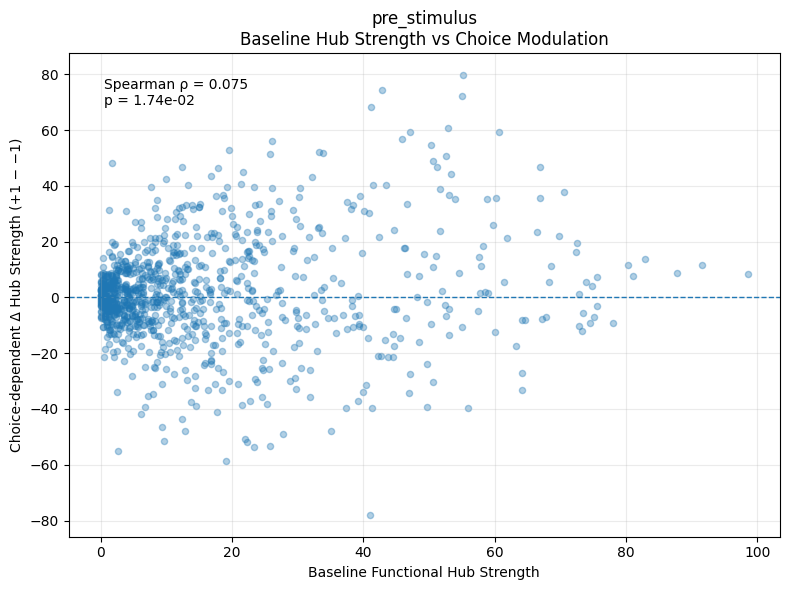

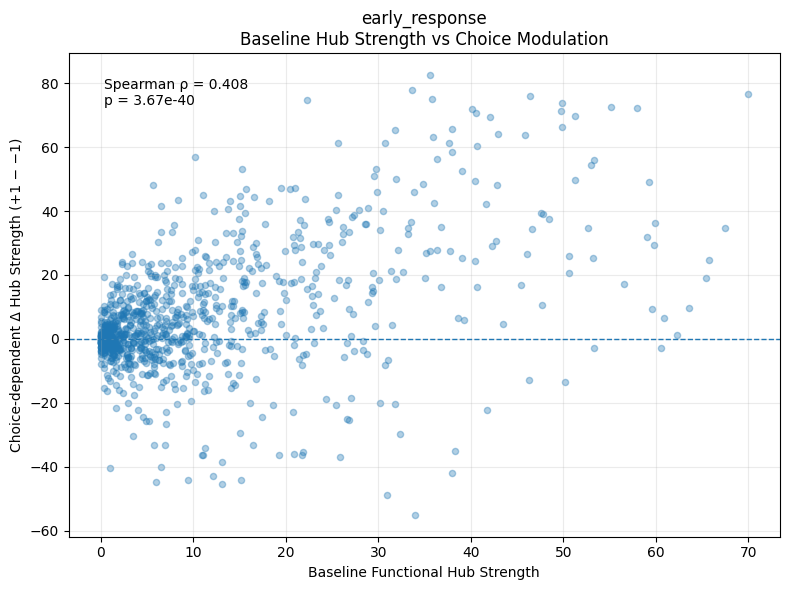

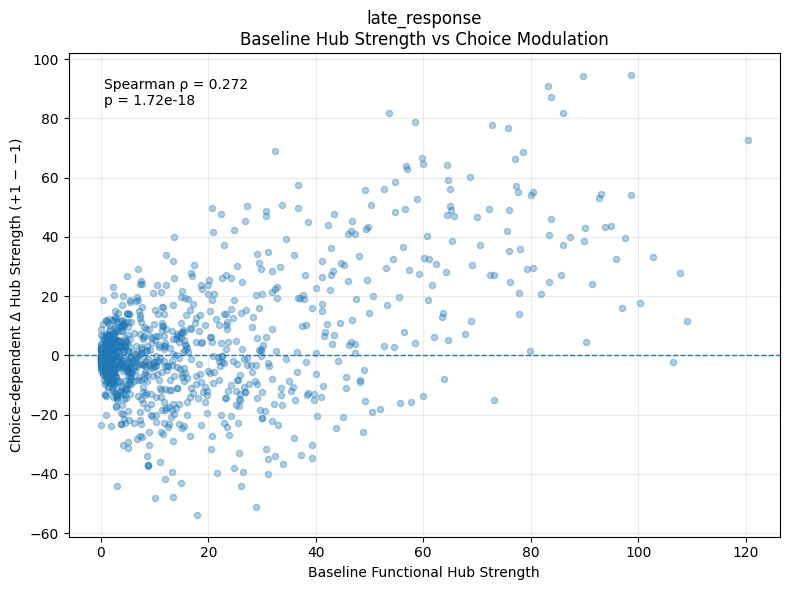

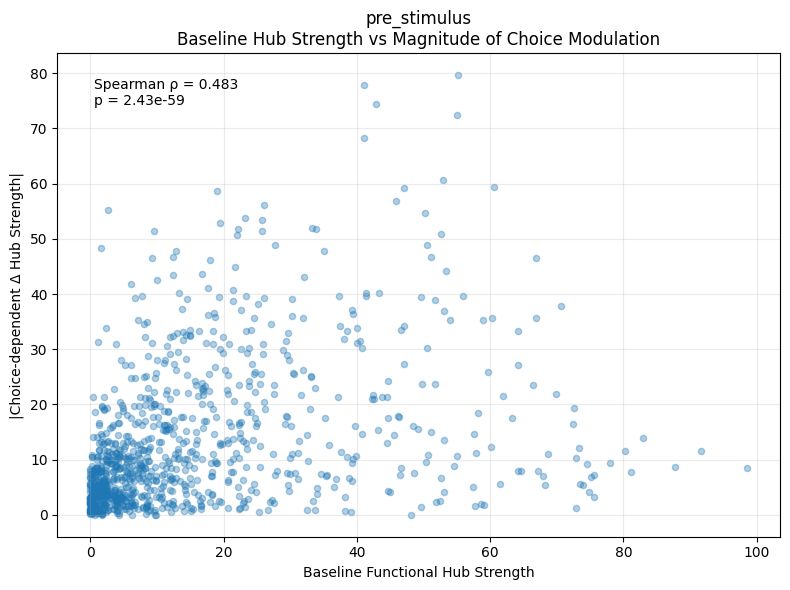

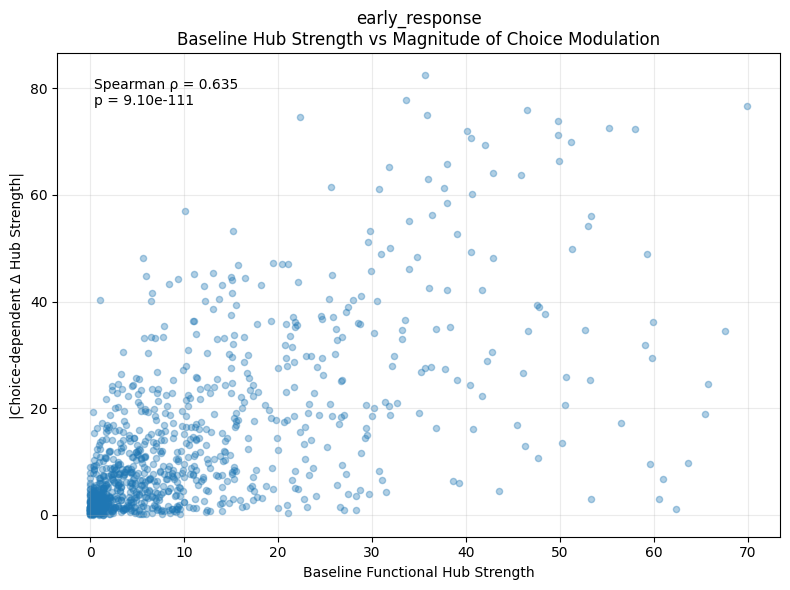

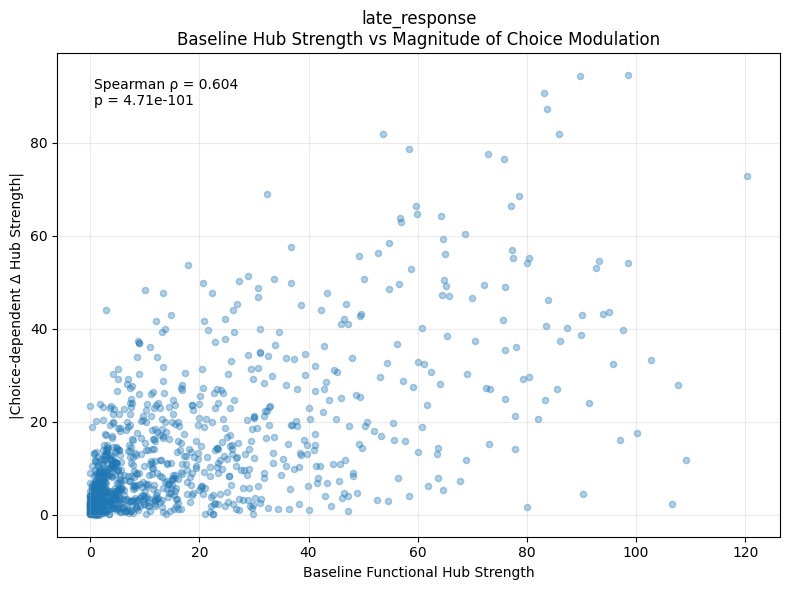


STEP 84C COMPLETE


In [223]:
# ======================================================================
# STEP 84C — HUBNESS vs CHOICE-DEPENDENT MODULATION VISUALIZATION
# ======================================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

print("=" * 70)
print("VISUALIZING HUBNESS vs CHOICE-DEPENDENT MODULATION")
print("=" * 70)

epochs = ["pre_stimulus", "early_response", "late_response"]

# ----------------------------------------------------------------------
# Helper function
# ----------------------------------------------------------------------

def get_step84_data(epoch):

    matched_indices = np.asarray(
        choice_common_neurons[epoch],
        dtype=int
    )

    baseline_strength = np.asarray(
        hub_strength[epoch][matched_indices],
        dtype=float
    )

    choice_diff = np.asarray(
        choice_hub_difference[epoch],
        dtype=float
    )

    valid = (
        np.isfinite(baseline_strength)
        & np.isfinite(choice_diff)
    )

    return (
        baseline_strength[valid],
        choice_diff[valid]
    )


# ======================================================================
# FIGURES 1–3: SIGNED CHOICE-DEPENDENT MODULATION
# ======================================================================

for epoch in epochs:

    baseline_strength, choice_diff = get_step84_data(epoch)

    rho, p = spearmanr(
        baseline_strength,
        choice_diff
    )

    plt.figure(figsize=(8, 6))

    plt.scatter(
        baseline_strength,
        choice_diff,
        alpha=0.35,
        s=20
    )

    plt.axhline(
        0,
        linestyle="--",
        linewidth=1
    )

    plt.xlabel("Baseline Functional Hub Strength")
    plt.ylabel("Choice-dependent Δ Hub Strength (+1 − −1)")

    plt.title(
        f"{epoch}\n"
        f"Baseline Hub Strength vs Choice Modulation"
    )

    plt.text(
        0.05,
        0.95,
        f"Spearman ρ = {rho:.3f}\n"
        f"p = {p:.2e}",
        transform=plt.gca().transAxes,
        verticalalignment="top"
    )

    plt.grid(alpha=0.25)
    plt.tight_layout()
    plt.show()


# ======================================================================
# FIGURES 4–6: ABSOLUTE CHOICE-DEPENDENT MODULATION
# ======================================================================

for epoch in epochs:

    baseline_strength, choice_diff = get_step84_data(epoch)

    abs_diff = np.abs(choice_diff)

    rho, p = spearmanr(
        baseline_strength,
        abs_diff
    )

    plt.figure(figsize=(8, 6))

    plt.scatter(
        baseline_strength,
        abs_diff,
        alpha=0.35,
        s=20
    )

    plt.xlabel("Baseline Functional Hub Strength")
    plt.ylabel("|Choice-dependent Δ Hub Strength|")

    plt.title(
        f"{epoch}\n"
        f"Baseline Hub Strength vs Magnitude of Choice Modulation"
    )

    plt.text(
        0.05,
        0.95,
        f"Spearman ρ = {rho:.3f}\n"
        f"p = {p:.2e}",
        transform=plt.gca().transAxes,
        verticalalignment="top"
    )

    plt.grid(alpha=0.25)
    plt.tight_layout()
    plt.show()


print("\n" + "=" * 70)
print("STEP 84C COMPLETE")
print("=" * 70)

**Step 84D — Robustness Against Extreme Hubs**

In [224]:
# ======================================================================
# STEP 84D — ROBUSTNESS OF HUBNESS–CHOICE MODULATION RELATIONSHIPS
#            AFTER REMOVING EXTREME HUBS
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import spearmanr

print("=" * 70)
print("ROBUSTNESS TO EXTREME HUBS")
print("=" * 70)

epochs = ["pre_stimulus", "early_response", "late_response"]

# Fractions of strongest baseline hubs to remove
remove_percentages = [0.00, 0.01, 0.02, 0.05, 0.10]

robustness_results = []

for epoch in epochs:

    print("\n" + "=" * 60)
    print(f"EPOCH: {epoch}")
    print("=" * 60)

    # --------------------------------------------------------------
    # Retrieve matched canonical population
    # --------------------------------------------------------------

    matched_indices = np.asarray(
        choice_common_neurons[epoch],
        dtype=int
    )

    baseline_strength = np.asarray(
        hub_strength[epoch][matched_indices],
        dtype=float
    )

    choice_diff = np.asarray(
        choice_hub_difference[epoch],
        dtype=float
    )

    valid = (
        np.isfinite(baseline_strength)
        & np.isfinite(choice_diff)
    )

    baseline_strength = baseline_strength[valid]
    choice_diff = choice_diff[valid]

    n_total = len(baseline_strength)

    # --------------------------------------------------------------
    # Sort neurons by baseline hub strength
    # Strongest hubs first
    # --------------------------------------------------------------

    strength_order = np.argsort(
        baseline_strength
    )[::-1]

    for remove_pct in remove_percentages:

        n_remove = int(
            np.floor(n_total * remove_pct)
        )

        keep_mask = np.ones(
            n_total,
            dtype=bool
        )

        if n_remove > 0:
            keep_mask[
                strength_order[:n_remove]
            ] = False

        strength_kept = baseline_strength[keep_mask]
        diff_kept = choice_diff[keep_mask]

        abs_diff_kept = np.abs(diff_kept)

        # ----------------------------------------------------------
        # Correlations
        # ----------------------------------------------------------

        rho_signed, p_signed = spearmanr(
            strength_kept,
            diff_kept
        )

        rho_absolute, p_absolute = spearmanr(
            strength_kept,
            abs_diff_kept
        )

        # ----------------------------------------------------------
        # Directional fraction
        # ----------------------------------------------------------

        fraction_plus = np.mean(
            diff_kept > 0
        )

        fraction_minus = np.mean(
            diff_kept < 0
        )

        # ----------------------------------------------------------
        # Store
        # ----------------------------------------------------------

        robustness_results.append({
            "epoch": epoch,
            "removed_top_percent": remove_pct * 100,
            "n_removed": n_remove,
            "n_remaining": len(strength_kept),

            "rho_signed": rho_signed,
            "p_signed": p_signed,

            "rho_absolute": rho_absolute,
            "p_absolute": p_absolute,

            "fraction_plus": fraction_plus,
            "fraction_minus": fraction_minus
        })

        # ----------------------------------------------------------
        # Print
        # ----------------------------------------------------------

        print(
            f"\nRemoved strongest {remove_pct*100:.0f}% "
            f"({n_remove} neurons)"
        )

        print(
            f"  Remaining neurons: {len(strength_kept)}"
        )

        print(
            f"  Strength vs signed Δ: "
            f"rho={rho_signed:+.4f}, "
            f"p={p_signed:.6e}"
        )

        print(
            f"  Strength vs |Δ|: "
            f"rho={rho_absolute:+.4f}, "
            f"p={p_absolute:.6e}"
        )

        print(
            f"  Favoring +1: {fraction_plus:.2%}"
        )

        print(
            f"  Favoring -1: {fraction_minus:.2%}"
        )


# ======================================================================
# DATAFRAME
# ======================================================================

step84D_df = pd.DataFrame(
    robustness_results
)

print("\n" + "=" * 70)
print("STEP 84D COMPLETE")
print("=" * 70)

print(
    step84D_df.to_string(index=False)
)

print(
    "\nResults stored in: step84D_df"
)

ROBUSTNESS TO EXTREME HUBS

EPOCH: pre_stimulus

Removed strongest 0% (0 neurons)
  Remaining neurons: 996
  Strength vs signed Δ: rho=+0.0754, p=1.735038e-02
  Strength vs |Δ|: rho=+0.4830, p=2.433031e-59
  Favoring +1: 51.61%
  Favoring -1: 48.39%

Removed strongest 1% (9 neurons)
  Remaining neurons: 987
  Strength vs signed Δ: rho=+0.0665, p=3.677047e-02
  Strength vs |Δ|: rho=+0.4896, p=1.289411e-60
  Favoring +1: 51.37%
  Favoring -1: 48.63%

Removed strongest 2% (19 neurons)
  Remaining neurons: 977
  Strength vs signed Δ: rho=+0.0705, p=2.762422e-02
  Strength vs |Δ|: rho=+0.5000, p=6.260783e-63
  Favoring +1: 51.38%
  Favoring -1: 48.62%

Removed strongest 5% (49 neurons)
  Remaining neurons: 947
  Strength vs signed Δ: rho=+0.0530, p=1.033023e-01
  Strength vs |Δ|: rho=+0.5008, p=2.889184e-61
  Favoring +1: 50.90%
  Favoring -1: 49.10%

Removed strongest 10% (99 neurons)
  Remaining neurons: 897
  Strength vs signed Δ: rho=+0.0399, p=2.324644e-01
  Strength vs |Δ|: rho=+0.487

**Step 85 — Temporal stability of choice-dependent hub neurons**

**Step 85A — Cross-epoch overlap of choice-dependent neurons**

In [225]:
# ======================================================================
# STEP 85A — TEMPORAL STABILITY OF CHOICE-DEPENDENT HUB NEURONS
# CROSS-EPOCH OVERLAP
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("TEMPORAL STABILITY OF CHOICE-DEPENDENT HUB NEURONS")
print("=" * 70)

epochs = ["pre_stimulus", "early_response", "late_response"]
CHOICE_DEPENDENT_PERCENTILE = 0.05

# ------------------------------------------------------------
# Build canonical neuron sets for each epoch
# ------------------------------------------------------------

choice_sets = {}

for epoch in epochs:

    matched_indices = np.asarray(choice_common_neurons[epoch])

    diff = np.asarray(choice_hub_difference[epoch])

    # Ensure aligned lengths
    n = min(len(matched_indices), len(diff))
    matched_indices = matched_indices[:n]
    diff = diff[:n]

    k = max(1, int(np.ceil(n * CHOICE_DEPENDENT_PERCENTILE)))

    # Strongest +1 and -1 modulated neurons
    plus_idx = np.argsort(diff)[-k:]
    minus_idx = np.argsort(diff)[:k]

    plus_neurons = set(matched_indices[plus_idx])
    minus_neurons = set(matched_indices[minus_idx])

    choice_sets[epoch] = {
        "+1": plus_neurons,
        "-1": minus_neurons
    }

    print(f"\n{epoch}")
    print(f"Matched neurons: {n}")
    print(f"Top 5% choice +1 neurons: {len(plus_neurons)}")
    print(f"Top 5% choice -1 neurons: {len(minus_neurons)}")


# ------------------------------------------------------------
# Jaccard similarity
# ------------------------------------------------------------

def jaccard(set_a, set_b):
    union = set_a | set_b
    if len(union) == 0:
        return np.nan
    return len(set_a & set_b) / len(union)


# ------------------------------------------------------------
# Cross-epoch overlap
# ------------------------------------------------------------

results = []

epoch_pairs = [
    ("pre_stimulus", "early_response"),
    ("pre_stimulus", "late_response"),
    ("early_response", "late_response")
]

for epoch_a, epoch_b in epoch_pairs:

    print("\n" + "=" * 60)
    print(f"{epoch_a} → {epoch_b}")
    print("=" * 60)

    for choice in ["+1", "-1"]:

        set_a = choice_sets[epoch_a][choice]
        set_b = choice_sets[epoch_b][choice]

        intersection = set_a & set_b
        union = set_a | set_b

        j = jaccard(set_a, set_b)

        # Fraction of epoch A population retained in epoch B
        retention_a = len(intersection) / len(set_a)

        # Fraction of epoch B population already present in epoch A
        retention_b = len(intersection) / len(set_b)

        print(
            f"Choice {choice}: "
            f"overlap={len(intersection)} | "
            f"Jaccard={j:.4f} | "
            f"A→B retention={retention_a:.4f} | "
            f"B←A overlap={retention_b:.4f}"
        )

        results.append({
            "epoch_a": epoch_a,
            "epoch_b": epoch_b,
            "choice": choice,
            "n_a": len(set_a),
            "n_b": len(set_b),
            "overlap": len(intersection),
            "union": len(union),
            "jaccard": j,
            "retention_a_to_b": retention_a,
            "fraction_b_from_a": retention_b
        })


step85A_df = pd.DataFrame(results)

print("\n" + "=" * 70)
print("STEP 85A COMPLETE")
print("=" * 70)

print("\nResults stored in: step85A_df")
print(step85A_df.to_string(index=False))

TEMPORAL STABILITY OF CHOICE-DEPENDENT HUB NEURONS

pre_stimulus
Matched neurons: 996
Top 5% choice +1 neurons: 50
Top 5% choice -1 neurons: 50

early_response
Matched neurons: 971
Top 5% choice +1 neurons: 49
Top 5% choice -1 neurons: 49

late_response
Matched neurons: 1004
Top 5% choice +1 neurons: 51
Top 5% choice -1 neurons: 51

pre_stimulus → early_response
Choice +1: overlap=4 | Jaccard=0.0421 | A→B retention=0.0800 | B←A overlap=0.0816
Choice -1: overlap=4 | Jaccard=0.0421 | A→B retention=0.0800 | B←A overlap=0.0816

pre_stimulus → late_response
Choice +1: overlap=0 | Jaccard=0.0000 | A→B retention=0.0000 | B←A overlap=0.0000
Choice -1: overlap=2 | Jaccard=0.0202 | A→B retention=0.0400 | B←A overlap=0.0392

early_response → late_response
Choice +1: overlap=2 | Jaccard=0.0204 | A→B retention=0.0408 | B←A overlap=0.0392
Choice -1: overlap=8 | Jaccard=0.0870 | A→B retention=0.1633 | B←A overlap=0.1569

STEP 85A COMPLETE

Results stored in: step85A_df
       epoch_a        epoch_b c

**Step 85B — permutation test of temporal stability**

In [226]:
# ======================================================================
# STEP 85B — PERMUTATION TEST OF TEMPORAL STABILITY
# Are cross-epoch overlaps greater than expected by chance?
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("PERMUTATION TEST OF CHOICE-DEPENDENT NEURON STABILITY")
print("=" * 70)

N_PERMUTATIONS = 5000
rng = np.random.default_rng(42)

# ------------------------------------------------------------
# Use the choice sets generated in Step 85A
# ------------------------------------------------------------

results_85B = []

epoch_pairs = [
    ("pre_stimulus", "early_response"),
    ("pre_stimulus", "late_response"),
    ("early_response", "late_response")
]

for epoch_a, epoch_b in epoch_pairs:

    # Common canonical population
    common_population = (
        set(choice_common_neurons[epoch_a])
        & set(choice_common_neurons[epoch_b])
    )

    n_common = len(common_population)

    print("\n" + "=" * 60)
    print(f"{epoch_a} → {epoch_b}")
    print(f"Common canonical population: {n_common}")
    print("=" * 60)

    if n_common == 0:
        print("No common neurons; skipping.")
        continue

    population = np.array(list(common_population))

    for choice in ["+1", "-1"]:

        set_a = choice_sets[epoch_a][choice] & common_population
        set_b = choice_sets[epoch_b][choice] & common_population

        n_a = len(set_a)
        n_b = len(set_b)

        observed_overlap = len(set_a & set_b)

        if n_a == 0 or n_b == 0:
            print(f"Choice {choice}: insufficient neurons.")
            continue

        # Expected overlap under random selection
        expected_overlap = (n_a * n_b) / n_common

        # --------------------------------------------------------
        # Permutation null
        # Keep population and set sizes fixed
        # --------------------------------------------------------

        null_overlaps = np.zeros(N_PERMUTATIONS, dtype=int)

        set_a_array = np.array(list(set_a))

        for i in range(N_PERMUTATIONS):

            random_b = rng.choice(
                population,
                size=n_b,
                replace=False
            )

            null_overlaps[i] = np.intersect1d(
                set_a_array,
                random_b
            ).size

        p_value = (
            np.sum(null_overlaps >= observed_overlap) + 1
        ) / (N_PERMUTATIONS + 1)

        null_mean = np.mean(null_overlaps)
        null_std = np.std(null_overlaps)

        # Empirical z-score
        if null_std > 0:
            z_score = (
                observed_overlap - null_mean
            ) / null_std
        else:
            z_score = np.nan

        observed_jaccard = (
            observed_overlap /
            (n_a + n_b - observed_overlap)
        )

        print(
            f"Choice {choice}: "
            f"observed={observed_overlap} | "
            f"expected={expected_overlap:.2f} | "
            f"null mean={null_mean:.2f} | "
            f"null SD={null_std:.2f} | "
            f"Jaccard={observed_jaccard:.4f} | "
            f"z={z_score:.3f} | "
            f"p={p_value:.6f}"
        )

        results_85B.append({
            "epoch_a": epoch_a,
            "epoch_b": epoch_b,
            "choice": choice,
            "n_common": n_common,
            "n_a": n_a,
            "n_b": n_b,
            "observed_overlap": observed_overlap,
            "expected_overlap": expected_overlap,
            "null_mean": null_mean,
            "null_std": null_std,
            "observed_jaccard": observed_jaccard,
            "z_score": z_score,
            "p_value": p_value
        })


step85B_df = pd.DataFrame(results_85B)

print("\n" + "=" * 70)
print("STEP 85B COMPLETE")
print("=" * 70)

print("\nResults stored in: step85B_df")
print(step85B_df.to_string(index=False))

PERMUTATION TEST OF CHOICE-DEPENDENT NEURON STABILITY

pre_stimulus → early_response
Common canonical population: 959
Choice +1: observed=4 | expected=2.45 | null mean=2.43 | null SD=1.48 | Jaccard=0.0430 | z=1.060 | p=0.221356
Choice -1: observed=4 | expected=2.11 | null mean=2.08 | null SD=1.36 | Jaccard=0.0465 | z=1.411 | p=0.148370

pre_stimulus → late_response
Common canonical population: 981
Choice +1: observed=0 | expected=2.55 | null mean=2.57 | null SD=1.52 | Jaccard=0.0000 | z=-1.692 | p=1.000000
Choice -1: observed=2 | expected=2.50 | null mean=2.50 | null SD=1.51 | Jaccard=0.0206 | z=-0.333 | p=0.737253

early_response → late_response
Common canonical population: 960
Choice +1: observed=2 | expected=2.45 | null mean=2.46 | null SD=1.51 | Jaccard=0.0211 | z=-0.302 | p=0.714057
Choice -1: observed=8 | expected=2.40 | null mean=2.40 | null SD=1.47 | Jaccard=0.0909 | z=3.819 | p=0.003599

STEP 85B COMPLETE

Results stored in: step85B_df
       epoch_a        epoch_b choice  n_c

**Step 85C — FDR correction and temporal-stability summary**

In [227]:
# ======================================================================
# STEP 85C — FDR CORRECTION OF TEMPORAL STABILITY TESTS
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import false_discovery_control

print("=" * 70)
print("FDR-CORRECTED TEMPORAL STABILITY")
print("=" * 70)

# Copy results from Step 85B
step85C_df = step85B_df.copy()

# ------------------------------------------------------------
# FDR correction across all six temporal-stability tests
# ------------------------------------------------------------

p_values = step85C_df["p_value"].values

try:
    p_fdr = false_discovery_control(
        p_values,
        method="bh"
    )
except Exception:
    # Manual Benjamini-Hochberg fallback
    order = np.argsort(p_values)
    ranked = p_values[order]
    m = len(ranked)

    adjusted = np.empty(m)

    for i in range(m):
        adjusted[i] = ranked[i] * m / (i + 1)

    # Enforce monotonicity
    adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
    adjusted = np.minimum(adjusted, 1.0)

    p_fdr = np.empty(m)
    p_fdr[order] = adjusted

step85C_df["p_fdr"] = p_fdr
step85C_df["FDR_significant"] = step85C_df["p_fdr"] < 0.05


# ------------------------------------------------------------
# Print complete results
# ------------------------------------------------------------

for _, row in step85C_df.iterrows():

    print(
        f"{row['epoch_a']:15s} → "
        f"{row['epoch_b']:15s} | "
        f"Choice {row['choice']:>2s} | "
        f"Observed={int(row['observed_overlap']):2d} | "
        f"Expected={row['expected_overlap']:.2f} | "
        f"Jaccard={row['observed_jaccard']:.4f} | "
        f"z={row['z_score']:.3f} | "
        f"Raw p={row['p_value']:.6f} | "
        f"FDR p={row['p_fdr']:.6f} | "
        f"Significant={row['FDR_significant']}"
    )


# ------------------------------------------------------------
# Summary by transition
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SIGNIFICANT TEMPORAL STABILITY")
print("=" * 70)

sig_df = step85C_df[
    step85C_df["FDR_significant"]
].copy()

if len(sig_df) == 0:

    print("No cross-epoch choice-dependent populations survive FDR correction.")

else:

    for _, row in sig_df.iterrows():

        print(
            f"{row['epoch_a']} → {row['epoch_b']} | "
            f"Choice {row['choice']} | "
            f"Overlap={int(row['observed_overlap'])} | "
            f"Expected={row['expected_overlap']:.2f} | "
            f"Jaccard={row['observed_jaccard']:.4f} | "
            f"FDR p={row['p_fdr']:.6f}"
        )


# ------------------------------------------------------------
# Compact summary table
# ------------------------------------------------------------

summary_rows = []

for (epoch_a, epoch_b), group in step85C_df.groupby(
    ["epoch_a", "epoch_b"]
):

    for choice in ["+1", "-1"]:

        row = group[group["choice"] == choice].iloc[0]

        summary_rows.append({
            "epoch_a": epoch_a,
            "epoch_b": epoch_b,
            "choice": choice,
            "observed_overlap": int(row["observed_overlap"]),
            "expected_overlap": row["expected_overlap"],
            "jaccard": row["observed_jaccard"],
            "z_score": row["z_score"],
            "p_raw": row["p_value"],
            "p_fdr": row["p_fdr"],
            "FDR_significant": row["FDR_significant"]
        })

step85C_summary_df = pd.DataFrame(summary_rows)

print("\n" + "=" * 70)
print("STEP 85C COMPLETE")
print("=" * 70)

print("\nFull corrected results stored in: step85C_df")
print("Compact summary stored in: step85C_summary_df")

print("\n")
print(step85C_summary_df.to_string(index=False))

FDR-CORRECTED TEMPORAL STABILITY
pre_stimulus    → early_response  | Choice +1 | Observed= 4 | Expected=2.45 | Jaccard=0.0430 | z=1.060 | Raw p=0.221356 | FDR p=0.442711 | Significant=False
pre_stimulus    → early_response  | Choice -1 | Observed= 4 | Expected=2.11 | Jaccard=0.0465 | z=1.411 | Raw p=0.148370 | FDR p=0.442711 | Significant=False
pre_stimulus    → late_response   | Choice +1 | Observed= 0 | Expected=2.55 | Jaccard=0.0000 | z=-1.692 | Raw p=1.000000 | FDR p=1.000000 | Significant=False
pre_stimulus    → late_response   | Choice -1 | Observed= 2 | Expected=2.50 | Jaccard=0.0206 | z=-0.333 | Raw p=0.737253 | FDR p=0.884703 | Significant=False
early_response  → late_response   | Choice +1 | Observed= 2 | Expected=2.45 | Jaccard=0.0211 | z=-0.302 | Raw p=0.714057 | FDR p=0.884703 | Significant=False
early_response  → late_response   | Choice -1 | Observed= 8 | Expected=2.40 | Jaccard=0.0909 | z=3.819 | Raw p=0.003599 | FDR p=0.021596 | Significant=True

SIGNIFICANT TEMPORAL S

**Step 86 — Persistent vs. Recruited Choice-Dependent Hubs**

**Step 86A — Classification and hub/modulation comparison**

In [228]:
# ======================================================================
# STEP 86A — PERSISTENT VS RECRUITED CHOICE-DEPENDENT HUBS
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu

print("=" * 70)
print("PERSISTENT VS RECRUITED CHOICE-DEPENDENT HUBS")
print("=" * 70)

epoch_a = "early_response"
epoch_b = "late_response"

choices = [+1, -1]
CHOICE_PERCENTILE = 0.05

results_86A = []

for choice in choices:

    print("\n" + "=" * 60)
    print(f"CHOICE {choice}: EARLY → LATE")
    print("=" * 60)

    # --------------------------------------------------------------
    # Common neurons between early and late
    # --------------------------------------------------------------

    early_ids = np.asarray(choice_common_neurons[epoch_a])
    late_ids = np.asarray(choice_common_neurons[epoch_b])

    common_ids = np.intersect1d(early_ids, late_ids)

    print(f"Common canonical neurons: {len(common_ids)}")

    # --------------------------------------------------------------
    # Build canonical-ID lookup tables
    # --------------------------------------------------------------

    early_lookup = {nid: i for i, nid in enumerate(early_ids)}
    late_lookup = {nid: i for i, nid in enumerate(late_ids)}

    early_idx = np.array([early_lookup[nid] for nid in common_ids])
    late_idx = np.array([late_lookup[nid] for nid in common_ids])

    # --------------------------------------------------------------
    # Choice modulation
    # --------------------------------------------------------------

    early_diff = np.asarray(choice_hub_difference[epoch_a])[early_idx]
    late_diff = np.asarray(choice_hub_difference[epoch_b])[late_idx]

    # --------------------------------------------------------------
    # Hub strength
    # --------------------------------------------------------------

    early_strength = np.asarray(hub_strength[epoch_a])[common_ids]
    late_strength = np.asarray(hub_strength[epoch_b])[common_ids]

    # --------------------------------------------------------------
    # Define top 5% choice-dependent neurons separately
    # in early and late response
    # --------------------------------------------------------------

    n_early = max(1, int(np.ceil(len(early_diff) * CHOICE_PERCENTILE)))
    n_late = max(1, int(np.ceil(len(late_diff) * CHOICE_PERCENTILE)))

    if choice == +1:
        early_order = np.argsort(early_diff)[-n_early:]
        late_order = np.argsort(late_diff)[-n_late:]
    else:
        early_order = np.argsort(early_diff)[:n_early]
        late_order = np.argsort(late_diff)[:n_late]

    early_choice_mask = np.zeros(len(common_ids), dtype=bool)
    late_choice_mask = np.zeros(len(common_ids), dtype=bool)

    early_choice_mask[early_order] = True
    late_choice_mask[late_order] = True

    # --------------------------------------------------------------
    # Persistent / lost / recruited classification
    # --------------------------------------------------------------

    persistent_mask = early_choice_mask & late_choice_mask
    early_only_mask = early_choice_mask & ~late_choice_mask
    late_only_mask = late_choice_mask & ~early_choice_mask

    # --------------------------------------------------------------
    # Hub status
    # --------------------------------------------------------------

    early_hub_n = max(1, int(np.ceil(len(early_strength) * 0.10)))
    late_hub_n = max(1, int(np.ceil(len(late_strength) * 0.10)))

    early_hub_cutoff = np.sort(early_strength)[-early_hub_n]
    late_hub_cutoff = np.sort(late_strength)[-late_hub_n]

    early_hub_mask = early_strength >= early_hub_cutoff
    late_hub_mask = late_strength >= late_hub_cutoff

    # --------------------------------------------------------------
    # Print group sizes
    # --------------------------------------------------------------

    print("\nGroup sizes:")
    print(f"  Persistent: {np.sum(persistent_mask)}")
    print(f"  Early-only: {np.sum(early_only_mask)}")
    print(f"  Late-only:  {np.sum(late_only_mask)}")

    # --------------------------------------------------------------
    # Compare groups
    # --------------------------------------------------------------

    groups = {
        "persistent": persistent_mask,
        "early_only": early_only_mask,
        "late_only": late_only_mask
    }

    for group_name, mask in groups.items():

        n_group = int(np.sum(mask))

        if n_group == 0:
            print(f"\n{group_name}: no neurons")
            continue

        early_hub_fraction = np.mean(early_hub_mask[mask])
        late_hub_fraction = np.mean(late_hub_mask[mask])

        early_abs_delta = np.abs(early_diff[mask])
        late_abs_delta = np.abs(late_diff[mask])

        print(f"\n--- {group_name} ---")
        print(f"N = {n_group}")

        print(
            f"Early hub fraction: "
            f"{early_hub_fraction:.4f} ({early_hub_fraction*100:.2f}%)"
        )

        print(
            f"Late hub fraction:  "
            f"{late_hub_fraction:.4f} ({late_hub_fraction*100:.2f}%)"
        )

        print(
            f"Mean early |Δ|: {np.mean(early_abs_delta):.4f}"
        )

        print(
            f"Mean late |Δ|:  {np.mean(late_abs_delta):.4f}"
        )

        results_86A.append({
            "choice": choice,
            "group": group_name,
            "n": n_group,
            "early_hub_fraction": early_hub_fraction,
            "late_hub_fraction": late_hub_fraction,
            "mean_early_abs_delta": np.mean(early_abs_delta),
            "mean_late_abs_delta": np.mean(late_abs_delta),
            "mean_early_strength": np.mean(early_strength[mask]),
            "mean_late_strength": np.mean(late_strength[mask])
        })

    # --------------------------------------------------------------
    # Persistent vs non-persistent statistical comparisons
    # --------------------------------------------------------------

    nonpersistent_mask = ~persistent_mask

    print("\nStatistical comparisons: Persistent vs non-persistent")

    if np.sum(persistent_mask) >= 2 and np.sum(nonpersistent_mask) >= 2:

        # Early hub strength
        stat, p = mannwhitneyu(
            early_strength[persistent_mask],
            early_strength[nonpersistent_mask],
            alternative="two-sided"
        )

        print(
            f"Early hub strength: "
            f"U={stat:.1f}, p={p:.6g}"
        )

        results_86A.append({
            "choice": choice,
            "comparison": "persistent_vs_nonpersistent",
            "variable": "early_hub_strength",
            "U": stat,
            "p_value": p
        })

        # Late hub strength
        stat, p = mannwhitneyu(
            late_strength[persistent_mask],
            late_strength[nonpersistent_mask],
            alternative="two-sided"
        )

        print(
            f"Late hub strength: "
            f"U={stat:.1f}, p={p:.6g}"
        )

        results_86A.append({
            "choice": choice,
            "comparison": "persistent_vs_nonpersistent",
            "variable": "late_hub_strength",
            "U": stat,
            "p_value": p
        })

        # Early absolute modulation
        stat, p = mannwhitneyu(
            np.abs(early_diff[persistent_mask]),
            np.abs(early_diff[nonpersistent_mask]),
            alternative="two-sided"
        )

        print(
            f"Early |Δ|: "
            f"U={stat:.1f}, p={p:.6g}"
        )

        results_86A.append({
            "choice": choice,
            "comparison": "persistent_vs_nonpersistent",
            "variable": "early_absolute_delta",
            "U": stat,
            "p_value": p
        })

        # Late absolute modulation
        stat, p = mannwhitneyu(
            np.abs(late_diff[persistent_mask]),
            np.abs(late_diff[nonpersistent_mask]),
            alternative="two-sided"
        )

        print(
            f"Late |Δ|: "
            f"U={stat:.1f}, p={p:.6g}"
        )

        results_86A.append({
            "choice": choice,
            "comparison": "persistent_vs_nonpersistent",
            "variable": "late_absolute_delta",
            "U": stat,
            "p_value": p
        })

# ----------------------------------------------------------------------
# STORE RESULTS
# ----------------------------------------------------------------------

step86A_df = pd.DataFrame(results_86A)

print("\n" + "=" * 70)
print("STEP 86A COMPLETE")
print("=" * 70)

print("\nResults stored in: step86A_df")

PERSISTENT VS RECRUITED CHOICE-DEPENDENT HUBS

CHOICE 1: EARLY → LATE
Common canonical neurons: 960

Group sizes:
  Persistent: 2
  Early-only: 46
  Late-only:  46

--- persistent ---
N = 2
Early hub fraction: 1.0000 (100.00%)
Late hub fraction:  1.0000 (100.00%)
Mean early |Δ|: 48.5972
Mean late |Δ|:  75.3414

--- early_only ---
N = 46
Early hub fraction: 0.6957 (69.57%)
Late hub fraction:  0.0435 (4.35%)
Mean early |Δ|: 60.2681
Mean late |Δ|:  9.2002

--- late_only ---
N = 46
Early hub fraction: 0.1304 (13.04%)
Late hub fraction:  0.6957 (69.57%)
Mean early |Δ|: 14.2749
Mean late |Δ|:  60.2678

Statistical comparisons: Persistent vs non-persistent
Early hub strength: U=1865.0, p=0.0206466
Late hub strength: U=1850.0, p=0.0228476
Early |Δ|: U=1840.0, p=0.00660845
Late |Δ|: U=1894.0, p=0.000625652

CHOICE -1: EARLY → LATE
Common canonical neurons: 960

Group sizes:
  Persistent: 8
  Early-only: 40
  Late-only:  40

--- persistent ---
N = 8
Early hub fraction: 0.1250 (12.50%)
Late hub f

**Step 86B — Permutation Test of Hub Enrichment Among Persistent Choice-Dependent Neurons**

In [229]:
# ======================================================================
# STEP 86B — PERMUTATION TEST OF HUB ENRICHMENT AMONG
#             PERSISTENT CHOICE-DEPENDENT NEURONS
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("PERMUTATION TEST OF HUB ENRICHMENT AMONG PERSISTENT")
print("CHOICE-DEPENDENT NEURONS")
print("=" * 70)

# ----------------------------------------------------------------------
# PARAMETERS
# ----------------------------------------------------------------------

epoch_a = "early_response"
epoch_b = "late_response"

choices = [+1, -1]

CHOICE_PERCENTILE = 0.05
HUB_PERCENTILE = 0.10

N_PERMUTATIONS = 5000
rng = np.random.default_rng(42)

results_86B = []

# ----------------------------------------------------------------------
# MAIN ANALYSIS
# ----------------------------------------------------------------------

for choice in choices:

    print("\n" + "=" * 60)
    print(f"CHOICE {choice}: EARLY → LATE")
    print("=" * 60)

    # --------------------------------------------------------------
    # Canonical populations
    # --------------------------------------------------------------

    early_ids = np.asarray(choice_common_neurons[epoch_a])
    late_ids = np.asarray(choice_common_neurons[epoch_b])

    common_ids = np.intersect1d(early_ids, late_ids)

    early_lookup = {nid: i for i, nid in enumerate(early_ids)}
    late_lookup = {nid: i for i, nid in enumerate(late_ids)}

    early_idx = np.array([early_lookup[nid] for nid in common_ids])
    late_idx = np.array([late_lookup[nid] for nid in common_ids])

    n_common = len(common_ids)

    # --------------------------------------------------------------
    # Choice modulation
    # --------------------------------------------------------------

    early_diff = np.asarray(
        choice_hub_difference[epoch_a]
    )[early_idx]

    late_diff = np.asarray(
        choice_hub_difference[epoch_b]
    )[late_idx]

    # --------------------------------------------------------------
    # Define top 5% choice-dependent neurons
    # --------------------------------------------------------------

    n_choice = max(
        1,
        int(np.ceil(n_common * CHOICE_PERCENTILE))
    )

    early_choice_mask = np.zeros(n_common, dtype=bool)
    late_choice_mask = np.zeros(n_common, dtype=bool)

    if choice == +1:

        early_choice_mask[
            np.argsort(early_diff)[-n_choice:]
        ] = True

        late_choice_mask[
            np.argsort(late_diff)[-n_choice:]
        ] = True

    else:

        early_choice_mask[
            np.argsort(early_diff)[:n_choice]
        ] = True

        late_choice_mask[
            np.argsort(late_diff)[:n_choice]
        ] = True

    # --------------------------------------------------------------
    # Persistent population
    # --------------------------------------------------------------

    persistent_mask = (
        early_choice_mask &
        late_choice_mask
    )

    n_persistent = int(np.sum(persistent_mask))

    print(f"Common canonical population: {n_common}")
    print(f"Choice-dependent population size: {n_choice}")
    print(f"Persistent neurons: {n_persistent}")

    # --------------------------------------------------------------
    # Hub strength
    # --------------------------------------------------------------

    early_strength = np.asarray(
        hub_strength[epoch_a]
    )[common_ids]

    late_strength = np.asarray(
        hub_strength[epoch_b]
    )[common_ids]

    # --------------------------------------------------------------
    # Define top 10% hubs independently in each epoch
    # --------------------------------------------------------------

    n_early_hubs = max(
        1,
        int(np.ceil(n_common * HUB_PERCENTILE))
    )

    n_late_hubs = max(
        1,
        int(np.ceil(n_common * HUB_PERCENTILE))
    )

    early_hub_cutoff = np.sort(
        early_strength
    )[-n_early_hubs]

    late_hub_cutoff = np.sort(
        late_strength
    )[-n_late_hubs]

    early_hub_mask = (
        early_strength >= early_hub_cutoff
    )

    late_hub_mask = (
        late_strength >= late_hub_cutoff
    )

    # --------------------------------------------------------------
    # If no persistent neurons, skip safely
    # --------------------------------------------------------------

    if n_persistent == 0:

        print("No persistent neurons; skipping permutation test.")

        continue

    # --------------------------------------------------------------
    # Observed hub counts
    # --------------------------------------------------------------

    observed_early_hubs = int(
        np.sum(
            early_hub_mask[persistent_mask]
        )
    )

    observed_late_hubs = int(
        np.sum(
            late_hub_mask[persistent_mask]
        )
    )

    expected_early_hubs = (
        n_persistent *
        np.mean(early_hub_mask)
    )

    expected_late_hubs = (
        n_persistent *
        np.mean(late_hub_mask)
    )

    # --------------------------------------------------------------
    # Permutation null distributions
    # --------------------------------------------------------------

    null_early = np.zeros(
        N_PERMUTATIONS,
        dtype=int
    )

    null_late = np.zeros(
        N_PERMUTATIONS,
        dtype=int
    )

    for i in range(N_PERMUTATIONS):

        sampled_idx = rng.choice(
            n_common,
            size=n_persistent,
            replace=False
        )

        null_early[i] = np.sum(
            early_hub_mask[sampled_idx]
        )

        null_late[i] = np.sum(
            late_hub_mask[sampled_idx]
        )

    # --------------------------------------------------------------
    # Permutation p-values
    # --------------------------------------------------------------

    p_early = (
        np.sum(
            null_early >= observed_early_hubs
        ) + 1
    ) / (N_PERMUTATIONS + 1)

    p_late = (
        np.sum(
            null_late >= observed_late_hubs
        ) + 1
    ) / (N_PERMUTATIONS + 1)

    # --------------------------------------------------------------
    # Enrichment
    # --------------------------------------------------------------

    early_enrichment = (
        observed_early_hubs /
        expected_early_hubs
        if expected_early_hubs > 0
        else np.nan
    )

    late_enrichment = (
        observed_late_hubs /
        expected_late_hubs
        if expected_late_hubs > 0
        else np.nan
    )

    # --------------------------------------------------------------
    # Null statistics
    # --------------------------------------------------------------

    early_null_mean = np.mean(null_early)
    early_null_sd = np.std(null_early, ddof=1)

    late_null_mean = np.mean(null_late)
    late_null_sd = np.std(null_late, ddof=1)

    early_z = (
        (observed_early_hubs - early_null_mean) /
        early_null_sd
        if early_null_sd > 0
        else np.nan
    )

    late_z = (
        (observed_late_hubs - late_null_mean) /
        late_null_sd
        if late_null_sd > 0
        else np.nan
    )

    # --------------------------------------------------------------
    # Print results
    # --------------------------------------------------------------

    print("\nEarly-response hub enrichment")
    print(
        f"Observed hubs: {observed_early_hubs}"
    )
    print(
        f"Expected hubs: {expected_early_hubs:.2f}"
    )
    print(
        f"Null mean: {early_null_mean:.3f}"
    )
    print(
        f"Null SD: {early_null_sd:.3f}"
    )
    print(
        f"Enrichment: {early_enrichment:.3f}x"
    )
    print(
        f"z-score: {early_z:.3f}"
    )
    print(
        f"Permutation p: {p_early:.6f}"
    )

    print("\nLate-response hub enrichment")
    print(
        f"Observed hubs: {observed_late_hubs}"
    )
    print(
        f"Expected hubs: {expected_late_hubs:.2f}"
    )
    print(
        f"Null mean: {late_null_mean:.3f}"
    )
    print(
        f"Null SD: {late_null_sd:.3f}"
    )
    print(
        f"Enrichment: {late_enrichment:.3f}x"
    )
    print(
        f"z-score: {late_z:.3f}"
    )
    print(
        f"Permutation p: {p_late:.6f}"
    )

    # --------------------------------------------------------------
    # Store early result
    # --------------------------------------------------------------

    results_86B.append({
        "choice": choice,
        "epoch": epoch_a,
        "n_common": n_common,
        "n_persistent": n_persistent,
        "observed_hubs": observed_early_hubs,
        "expected_hubs": expected_early_hubs,
        "null_mean": early_null_mean,
        "null_sd": early_null_sd,
        "enrichment": early_enrichment,
        "z_score": early_z,
        "p_value": p_early
    })

    # --------------------------------------------------------------
    # Store late result
    # --------------------------------------------------------------

    results_86B.append({
        "choice": choice,
        "epoch": epoch_b,
        "n_common": n_common,
        "n_persistent": n_persistent,
        "observed_hubs": observed_late_hubs,
        "expected_hubs": expected_late_hubs,
        "null_mean": late_null_mean,
        "null_sd": late_null_sd,
        "enrichment": late_enrichment,
        "z_score": late_z,
        "p_value": p_late
    })


# ----------------------------------------------------------------------
# STORE RESULTS
# ----------------------------------------------------------------------

step86B_df = pd.DataFrame(results_86B)

print("\n" + "=" * 70)
print("STEP 86B COMPLETE")
print("=" * 70)

print("\nResults stored in: step86B_df")

if len(step86B_df) > 0:
    print("\nSummary:")
    print(
        step86B_df[
            [
                "choice",
                "epoch",
                "n_persistent",
                "observed_hubs",
                "expected_hubs",
                "enrichment",
                "z_score",
                "p_value"
            ]
        ].to_string(index=False)
    )

PERMUTATION TEST OF HUB ENRICHMENT AMONG PERSISTENT
CHOICE-DEPENDENT NEURONS

CHOICE 1: EARLY → LATE
Common canonical population: 960
Choice-dependent population size: 48
Persistent neurons: 2

Early-response hub enrichment
Observed hubs: 2
Expected hubs: 0.20
Null mean: 0.207
Null SD: 0.435
Enrichment: 10.000x
z-score: 4.117
Permutation p: 0.012797

Late-response hub enrichment
Observed hubs: 2
Expected hubs: 0.20
Null mean: 0.209
Null SD: 0.432
Enrichment: 10.000x
z-score: 4.143
Permutation p: 0.010798

CHOICE -1: EARLY → LATE
Common canonical population: 960
Choice-dependent population size: 48
Persistent neurons: 8

Early-response hub enrichment
Observed hubs: 1
Expected hubs: 0.80
Null mean: 0.792
Null SD: 0.822
Enrichment: 1.250x
z-score: 0.253
Permutation p: 0.577684

Late-response hub enrichment
Observed hubs: 0
Expected hubs: 0.80
Null mean: 0.786
Null SD: 0.831
Enrichment: 0.000x
z-score: -0.946
Permutation p: 1.000000

STEP 86B COMPLETE

Results stored in: step86B_df

Summar

**Step 86C — Multiple-Comparison Correction and Statistical Summary**

In [231]:
# ======================================================================
# STEP 86C — FDR CORRECTION OF PERSISTENT HUB ENRICHMENT TESTS
# ======================================================================

import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests

print("=" * 70)
print("FDR-CORRECTED STATISTICAL TEST OF PERSISTENT CHOICE-DEPENDENT HUBS")
print("=" * 70)

# ----------------------------------------------------------------------
# Check input
# ----------------------------------------------------------------------

if "step86B_df" not in globals():
    raise RuntimeError(
        "step86B_df was not found. Please run Step 86B first."
    )

df = step86B_df.copy()

required_cols = [
    "choice",
    "epoch",
    "n_persistent",
    "observed_hubs",
    "expected_hubs",
    "enrichment",
    "z_score",
    "p_value"
]

missing_cols = [c for c in required_cols if c not in df.columns]

if missing_cols:
    raise RuntimeError(
        f"step86B_df is missing required columns: {missing_cols}"
    )

# ----------------------------------------------------------------------
# FDR correction
# ----------------------------------------------------------------------

p_values = pd.to_numeric(df["p_value"], errors="coerce").values

reject, p_fdr, _, _ = multipletests(
    p_values,
    alpha=0.05,
    method="fdr_bh"
)

df["p_raw"] = p_values
df["p_fdr"] = p_fdr
df["FDR_significant"] = reject

# ----------------------------------------------------------------------
# Log enrichment
# ----------------------------------------------------------------------

df["log_enrichment"] = np.nan

positive_mask = df["enrichment"] > 0

df.loc[positive_mask, "log_enrichment"] = np.log(
    df.loc[positive_mask, "enrichment"]
)

# ----------------------------------------------------------------------
# Display full corrected results
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("FDR-CORRECTED RESULTS")
print("=" * 60)

for _, row in df.iterrows():

    choice_label = (
        "Choice +1"
        if row["choice"] == 1
        else "Choice -1"
    )

    print(
        f"{choice_label:9s} | "
        f"{row['epoch']:15s} | "
        f"Persistent={int(row['n_persistent']):2d} | "
        f"Observed={int(row['observed_hubs']):2d} | "
        f"Expected={row['expected_hubs']:.2f} | "
        f"Enrichment={row['enrichment']:.2f}x | "
        f"z={row['z_score']:.3f} | "
        f"Raw p={row['p_raw']:.6f} | "
        f"FDR p={row['p_fdr']:.6f} | "
        f"Significant={bool(row['FDR_significant'])}"
    )

# ----------------------------------------------------------------------
# Create compact summary
# ----------------------------------------------------------------------

summary_rows = []

for choice in sorted(df["choice"].unique()):

    choice_df = df[df["choice"] == choice].copy()

    n_tests = len(choice_df)
    n_sig = int(choice_df["FDR_significant"].sum())

    significant_df = choice_df[
        choice_df["FDR_significant"]
    ]

    if len(significant_df) > 0:
        max_enrichment = significant_df["enrichment"].max()
        min_fdr = significant_df["p_fdr"].min()
    else:
        max_enrichment = np.nan
        min_fdr = np.nan

    summary_rows.append({
        "choice": choice,
        "n_tests": n_tests,
        "n_FDR_significant": n_sig,
        "fraction_FDR_significant": n_sig / n_tests
        if n_tests > 0 else np.nan,
        "maximum_significant_enrichment": max_enrichment,
        "minimum_significant_FDR_p": min_fdr
    })

step86C_summary_df = pd.DataFrame(summary_rows)

# ----------------------------------------------------------------------
# Print significant findings only
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("SIGNIFICANT FDR-CORRECTED RESULTS")
print("=" * 60)

sig_df = df[df["FDR_significant"]].copy()

if len(sig_df) == 0:

    print("No persistent hub-enrichment tests survived FDR correction.")

else:

    for _, row in sig_df.iterrows():

        choice_label = (
            "Choice +1"
            if row["choice"] == 1
            else "Choice -1"
        )

        print(
            f"{choice_label} | "
            f"{row['epoch']} | "
            f"Observed={int(row['observed_hubs'])} | "
            f"Expected={row['expected_hubs']:.2f} | "
            f"Enrichment={row['enrichment']:.2f}x | "
            f"FDR p={row['p_fdr']:.6f}"
        )

# ----------------------------------------------------------------------
# Store corrected dataframe
# ----------------------------------------------------------------------

step86C_df = df.copy()

print("\n" + "=" * 70)
print("STEP 86C COMPLETE")
print("=" * 70)

print("\nFDR-corrected results stored in: step86C_df")
print("Summary stored in: step86C_summary_df")

print("\nSummary:")
print(step86C_summary_df.to_string(index=False))

FDR-CORRECTED STATISTICAL TEST OF PERSISTENT CHOICE-DEPENDENT HUBS

FDR-CORRECTED RESULTS
Choice +1 | early_response  | Persistent= 2 | Observed= 2 | Expected=0.20 | Enrichment=10.00x | z=4.117 | Raw p=0.012797 | FDR p=0.025595 | Significant=True
Choice +1 | late_response   | Persistent= 2 | Observed= 2 | Expected=0.20 | Enrichment=10.00x | z=4.143 | Raw p=0.010798 | FDR p=0.025595 | Significant=True
Choice -1 | early_response  | Persistent= 8 | Observed= 1 | Expected=0.80 | Enrichment=1.25x | z=0.253 | Raw p=0.577684 | FDR p=0.770246 | Significant=False
Choice -1 | late_response   | Persistent= 8 | Observed= 0 | Expected=0.80 | Enrichment=0.00x | z=-0.946 | Raw p=1.000000 | FDR p=1.000000 | Significant=False

SIGNIFICANT FDR-CORRECTED RESULTS
Choice +1 | early_response | Observed=2 | Expected=0.20 | Enrichment=10.00x | FDR p=0.025595
Choice +1 | late_response | Observed=2 | Expected=0.20 | Enrichment=10.00x | FDR p=0.025595

STEP 86C COMPLETE

FDR-corrected results stored in: step86C_

**Step 87 — Functional Profile of Persistent vs Recruited Choice-Dependent Hubs**

In [232]:
# ======================================================================
# STEP 87A — FUNCTIONAL PROFILE OF PERSISTENT VS RECRUITED
# CHOICE-DEPENDENT NEURONS
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu

print("=" * 70)
print("FUNCTIONAL PROFILE: PERSISTENT VS RECRUITED CHOICE-DEPENDENT NEURONS")
print("=" * 70)

# ----------------------------------------------------------------------
# Parameters
# ----------------------------------------------------------------------

epoch_a = "early_response"
epoch_b = "late_response"

choice_labels = {
    1: "Choice +1",
    -1: "Choice -1"
}

# ----------------------------------------------------------------------
# Validate required variables
# ----------------------------------------------------------------------

required_vars = [
    "choice_common_neurons",
    "choice_hub_difference",
    "hub_strength",
]

for var in required_vars:
    if var not in globals():
        raise RuntimeError(
            f"Required variable '{var}' was not found. "
            f"Please run the previous steps first."
        )

# ----------------------------------------------------------------------
# Results containers
# ----------------------------------------------------------------------

functional_results = []

# ----------------------------------------------------------------------
# Main analysis
# ----------------------------------------------------------------------

for choice in [1, -1]:

    print("\n" + "=" * 60)
    print(f"CHOICE {choice}: EARLY → LATE")
    print("=" * 60)

    # --------------------------------------------------------------
    # Canonical common population
    # --------------------------------------------------------------

    common_early = np.asarray(choice_common_neurons[epoch_a])
    common_late = np.asarray(choice_common_neurons[epoch_b])

    canonical = np.intersect1d(common_early, common_late)

    print(f"Common canonical neurons: {len(canonical)}")

    # --------------------------------------------------------------
    # Obtain choice-dependent rankings within each epoch
    # --------------------------------------------------------------

    early_diff_all = np.asarray(choice_hub_difference[epoch_a])
    late_diff_all = np.asarray(choice_hub_difference[epoch_b])

    # Map canonical neuron IDs to positions
    early_id_to_pos = {
        int(neuron_id): i
        for i, neuron_id in enumerate(common_early)
    }

    late_id_to_pos = {
        int(neuron_id): i
        for i, neuron_id in enumerate(common_late)
    }

    early_positions = np.array(
        [early_id_to_pos[int(x)] for x in canonical],
        dtype=int
    )

    late_positions = np.array(
        [late_id_to_pos[int(x)] for x in canonical],
        dtype=int
    )

    early_diff = early_diff_all[early_positions]
    late_diff = late_diff_all[late_positions]

    n = len(canonical)

    # --------------------------------------------------------------
    # Top 5% choice-dependent neurons
    # --------------------------------------------------------------

    k = max(1, int(np.ceil(n * 0.05)))

    if choice == 1:

        early_order = np.argsort(early_diff)[-k:]
        late_order = np.argsort(late_diff)[-k:]

    else:

        early_order = np.argsort(early_diff)[:k]
        late_order = np.argsort(late_diff)[:k]

    early_set = set(early_order)
    late_set = set(late_order)

    persistent_idx = np.array(
        sorted(early_set.intersection(late_set)),
        dtype=int
    )

    early_only_idx = np.array(
        sorted(early_set.difference(late_set)),
        dtype=int
    )

    late_only_idx = np.array(
        sorted(late_set.difference(early_set)),
        dtype=int
    )

    groups = {
        "persistent": persistent_idx,
        "early_only": early_only_idx,
        "late_only": late_only_idx
    }

    print(
        f"Persistent: {len(persistent_idx)} | "
        f"Early-only: {len(early_only_idx)} | "
        f"Late-only: {len(late_only_idx)}"
    )

    # --------------------------------------------------------------
    # Calculate functional measures
    # --------------------------------------------------------------

    for group_name, idx in groups.items():

        if len(idx) == 0:
            continue

        early_values = early_diff[idx]
        late_values = late_diff[idx]

        record = {
            "choice": choice,
            "choice_label": choice_labels[choice],
            "group": group_name,
            "n": len(idx),

            "early_mean_signed_delta": np.mean(early_values),
            "early_median_signed_delta": np.median(early_values),
            "early_mean_abs_delta": np.mean(np.abs(early_values)),
            "early_median_abs_delta": np.median(np.abs(early_values)),

            "late_mean_signed_delta": np.mean(late_values),
            "late_median_signed_delta": np.median(late_values),
            "late_mean_abs_delta": np.mean(np.abs(late_values)),
            "late_median_abs_delta": np.median(np.abs(late_values)),

        }

        functional_results.append(record)

        print(f"\n--- {group_name} ---")
        print(f"N = {len(idx)}")
        print(
            f"Early signed Δ: "
            f"mean={np.mean(early_values):.4f}, "
            f"median={np.median(early_values):.4f}"
        )
        print(
            f"Late signed Δ:  "
            f"mean={np.mean(late_values):.4f}, "
            f"median={np.median(late_values):.4f}"
        )
        print(
            f"Early |Δ|:      "
            f"mean={np.mean(np.abs(early_values)):.4f}, "
            f"median={np.median(np.abs(early_values)):.4f}"
        )
        print(
            f"Late |Δ|:       "
            f"mean={np.mean(np.abs(late_values)):.4f}, "
            f"median={np.median(np.abs(late_values)):.4f}"
        )

    # --------------------------------------------------------------
    # Persistent vs non-persistent comparisons
    # --------------------------------------------------------------

    persistent = groups["persistent"]

    nonpersistent = np.array(
        sorted(
            set(early_set.union(late_set))
            .difference(set(persistent))
        ),
        dtype=int
    )

    print("\n--- Persistent vs non-persistent ---")

    if len(persistent) >= 1 and len(nonpersistent) >= 2:

        comparisons = [
            (
                "Early |Δ|",
                np.abs(early_diff[persistent]),
                np.abs(early_diff[nonpersistent])
            ),
            (
                "Late |Δ|",
                np.abs(late_diff[persistent]),
                np.abs(late_diff[nonpersistent])
            ),
            (
                "Early signed Δ",
                early_diff[persistent],
                early_diff[nonpersistent]
            ),
            (
                "Late signed Δ",
                late_diff[persistent],
                late_diff[nonpersistent]
            )
        ]

        for metric_name, x, y in comparisons:

            try:

                U, p = mannwhitneyu(
                    x,
                    y,
                    alternative="two-sided"
                )

            except Exception:

                U = np.nan
                p = np.nan

            print(
                f"{metric_name}: "
                f"U={U}, p={p:.6g}"
            )

            functional_results.append({
                "choice": choice,
                "choice_label": choice_labels[choice],
                "group": "persistent_vs_nonpersistent_test",
                "n": len(persistent),
                "comparison": metric_name,
                "U": U,
                "p_value": p
            })

# ----------------------------------------------------------------------
# Store results
# ----------------------------------------------------------------------

step87A_df = pd.DataFrame(functional_results)

print("\n" + "=" * 70)
print("STEP 87A COMPLETE")
print("=" * 70)

print("\nResults stored in: step87A_df")

print("\nGroup summary:")

summary_cols = [
    "choice",
    "choice_label",
    "group",
    "n",
    "early_mean_abs_delta",
    "late_mean_abs_delta"
]

available_summary_cols = [
    c for c in summary_cols
    if c in step87A_df.columns
]

print(
    step87A_df[available_summary_cols]
    .dropna(subset=["n"])
    .to_string(index=False)
)

FUNCTIONAL PROFILE: PERSISTENT VS RECRUITED CHOICE-DEPENDENT NEURONS

CHOICE 1: EARLY → LATE
Common canonical neurons: 960
Persistent: 2 | Early-only: 46 | Late-only: 46

--- persistent ---
N = 2
Early signed Δ: mean=48.5972, median=48.5972
Late signed Δ:  mean=75.3414, median=75.3414
Early |Δ|:      mean=48.5972, median=48.5972
Late |Δ|:       mean=75.3414, median=75.3414

--- early_only ---
N = 46
Early signed Δ: mean=60.2681, median=60.7030
Late signed Δ:  mean=-4.5597, median=-3.2412
Early |Δ|:      mean=60.2681, median=60.7030
Late |Δ|:       mean=9.2002, median=7.4439

--- late_only ---
N = 46
Early signed Δ: mean=12.0198, median=11.4560
Late signed Δ:  mean=60.2678, median=55.4718
Early |Δ|:      mean=14.2749, median=13.7057
Late |Δ|:       mean=60.2678, median=55.4718

--- Persistent vs non-persistent ---
Early |Δ|: U=111.0, p=0.643331
Late |Δ|: U=162.0, p=0.0658888
Early signed Δ: U=111.0, p=0.643331
Late signed Δ: U=162.0, p=0.0658888

CHOICE -1: EARLY → LATE
Common canonical

**Step 87B — Permutation Test of Functional Persistence**

In [233]:
# ======================================================================
# STEP 87B — PERMUTATION TEST OF FUNCTIONAL PERSISTENCE
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("PERMUTATION TEST OF FUNCTIONAL PERSISTENCE")
print("=" * 70)

# ----------------------------------------------------------------------
# Parameters
# ----------------------------------------------------------------------

epoch_a = "early_response"
epoch_b = "late_response"

CHOICE_DEPENDENT_PERCENTILE = 0.05
N_PERMUTATIONS = 5000

rng = np.random.default_rng(42)

results_87B = []

# ----------------------------------------------------------------------
# Validate required variables
# ----------------------------------------------------------------------

required_vars = [
    "choice_common_neurons",
    "choice_hub_difference"
]

for var in required_vars:
    if var not in globals():
        raise RuntimeError(
            f"Required variable '{var}' was not found. "
            f"Please run the previous steps first."
        )

# ----------------------------------------------------------------------
# Main analysis
# ----------------------------------------------------------------------

for choice in [1, -1]:

    print("\n" + "=" * 60)
    print(f"CHOICE {choice}: EARLY → LATE")
    print("=" * 60)

    # --------------------------------------------------------------
    # Canonical population
    # --------------------------------------------------------------

    early_ids = np.asarray(choice_common_neurons[epoch_a])
    late_ids = np.asarray(choice_common_neurons[epoch_b])

    canonical = np.intersect1d(
        early_ids,
        late_ids
    )

    print(f"Common canonical neurons: {len(canonical)}")

    # --------------------------------------------------------------
    # Map canonical IDs to epoch positions
    # --------------------------------------------------------------

    early_id_to_pos = {
        int(neuron_id): i
        for i, neuron_id in enumerate(early_ids)
    }

    late_id_to_pos = {
        int(neuron_id): i
        for i, neuron_id in enumerate(late_ids)
    }

    early_positions = np.array(
        [early_id_to_pos[int(x)] for x in canonical],
        dtype=int
    )

    late_positions = np.array(
        [late_id_to_pos[int(x)] for x in canonical],
        dtype=int
    )

    early_diff = np.asarray(
        choice_hub_difference[epoch_a]
    )[early_positions]

    late_diff = np.asarray(
        choice_hub_difference[epoch_b]
    )[late_positions]

    early_abs = np.abs(early_diff)
    late_abs = np.abs(late_diff)

    n = len(canonical)

    # --------------------------------------------------------------
    # Define top 5% choice-dependent neurons
    # --------------------------------------------------------------

    k_choice = max(
        1,
        int(np.ceil(n * CHOICE_DEPENDENT_PERCENTILE))
    )

    if choice == 1:

        choice_idx = np.argsort(early_diff)[-k_choice:]

        # Require neurons to be among the top 5% in BOTH epochs
        late_idx = np.argsort(late_diff)[-k_choice:]

    else:

        choice_idx = np.argsort(early_diff)[:k_choice]

        late_idx = np.argsort(late_diff)[:k_choice]

    choice_set = set(choice_idx)
    late_set = set(late_idx)

    persistent_idx = np.array(
        sorted(choice_set.intersection(late_set)),
        dtype=int
    )

    # --------------------------------------------------------------
    # Define non-persistent choice-dependent neurons
    # --------------------------------------------------------------

    nonpersistent_idx = np.array(
        sorted(choice_set.difference(late_set)),
        dtype=int
    )

    print(
        f"Choice-dependent neurons: {len(choice_idx)}"
    )

    print(
        f"Persistent neurons: {len(persistent_idx)}"
    )

    print(
        f"Early-only neurons: {len(nonpersistent_idx)}"
    )

    # --------------------------------------------------------------
    # Guard against empty groups
    # --------------------------------------------------------------

    if len(persistent_idx) == 0:

        print("No persistent neurons detected.")
        continue

    # --------------------------------------------------------------
    # Observed statistics
    # --------------------------------------------------------------

    observed_early_mean = np.mean(
        early_abs[persistent_idx]
    )

    observed_late_mean = np.mean(
        late_abs[persistent_idx]
    )

    observed_early_median = np.median(
        early_abs[persistent_idx]
    )

    observed_late_median = np.median(
        late_abs[persistent_idx]
    )

    # --------------------------------------------------------------
    # Persistence ratio
    # --------------------------------------------------------------

    if observed_early_mean > 0:

        observed_persistence_ratio = (
            observed_late_mean /
            observed_early_mean
        )

    else:

        observed_persistence_ratio = np.nan

    print("\nObserved persistent-neuron statistics:")

    print(
        f"Early mean |Δ|: "
        f"{observed_early_mean:.4f}"
    )

    print(
        f"Late mean |Δ|:  "
        f"{observed_late_mean:.4f}"
    )

    print(
        f"Early median |Δ|: "
        f"{observed_early_median:.4f}"
    )

    print(
        f"Late median |Δ|:  "
        f"{observed_late_median:.4f}"
    )

    print(
        f"Late/Early persistence ratio: "
        f"{observed_persistence_ratio:.4f}"
    )

    # --------------------------------------------------------------
    # Null distributions
    #
    # Randomly sample the same number of neurons from the
    # choice-dependent population.
    # --------------------------------------------------------------

    n_persistent = len(persistent_idx)

    # Choice-dependent population is the reference pool
    candidate_idx = np.array(
        sorted(choice_set),
        dtype=int
    )

    if len(candidate_idx) < n_persistent:

        raise RuntimeError(
            "Candidate population is smaller than persistent population."
        )

    null_early = np.zeros(N_PERMUTATIONS)
    null_late = np.zeros(N_PERMUTATIONS)
    null_ratio = np.zeros(N_PERMUTATIONS)

    for i in range(N_PERMUTATIONS):

        sampled = rng.choice(
            candidate_idx,
            size=n_persistent,
            replace=False
        )

        null_early[i] = np.mean(
            early_abs[sampled]
        )

        null_late[i] = np.mean(
            late_abs[sampled]
        )

        if null_early[i] > 0:

            null_ratio[i] = (
                null_late[i] /
                null_early[i]
            )

        else:

            null_ratio[i] = np.nan

    # --------------------------------------------------------------
    # Permutation p-values
    # --------------------------------------------------------------

    p_early = (
        np.sum(null_early >= observed_early_mean) + 1
    ) / (
        N_PERMUTATIONS + 1
    )

    p_late = (
        np.sum(null_late >= observed_late_mean) + 1
    ) / (
        N_PERMUTATIONS + 1
    )

    valid_ratio = np.isfinite(null_ratio)

    if np.isfinite(observed_persistence_ratio):

        p_ratio = (
            np.sum(
                null_ratio[valid_ratio]
                >= observed_persistence_ratio
            ) + 1
        ) / (
            np.sum(valid_ratio) + 1
        )

    else:

        p_ratio = np.nan

    # --------------------------------------------------------------
    # Null distribution summaries
    # --------------------------------------------------------------

    null_early_mean = np.mean(null_early)
    null_late_mean = np.mean(null_late)

    null_early_sd = np.std(
        null_early,
        ddof=1
    )

    null_late_sd = np.std(
        null_late,
        ddof=1
    )

    null_ratio_mean = np.nanmean(
        null_ratio
    )

    null_ratio_sd = np.nanstd(
        null_ratio,
        ddof=1
    )

    # --------------------------------------------------------------
    # Z scores
    # --------------------------------------------------------------

    if null_early_sd > 0:

        z_early = (
            observed_early_mean -
            null_early_mean
        ) / null_early_sd

    else:

        z_early = np.nan

    if null_late_sd > 0:

        z_late = (
            observed_late_mean -
            null_late_mean
        ) / null_late_sd

    else:

        z_late = np.nan

    if null_ratio_sd > 0:

        z_ratio = (
            observed_persistence_ratio -
            null_ratio_mean
        ) / null_ratio_sd

    else:

        z_ratio = np.nan

    # --------------------------------------------------------------
    # Print results
    # --------------------------------------------------------------

    print("\nPermutation results:")

    print(
        f"Early |Δ|: "
        f"null mean={null_early_mean:.4f} | "
        f"null SD={null_early_sd:.4f} | "
        f"z={z_early:.3f} | "
        f"p={p_early:.6f}"
    )

    print(
        f"Late |Δ|:  "
        f"null mean={null_late_mean:.4f} | "
        f"null SD={null_late_sd:.4f} | "
        f"z={z_late:.3f} | "
        f"p={p_late:.6f}"
    )

    print(
        f"Persistence ratio: "
        f"null mean={null_ratio_mean:.4f} | "
        f"null SD={null_ratio_sd:.4f} | "
        f"z={z_ratio:.3f} | "
        f"p={p_ratio:.6f}"
    )

    # --------------------------------------------------------------
    # Store results
    # --------------------------------------------------------------

    results_87B.append({

        "choice": choice,

        "n_common": n,

        "n_choice_dependent": len(choice_idx),

        "n_persistent": n_persistent,

        "n_early_only": len(nonpersistent_idx),

        "observed_early_mean_abs_delta":
            observed_early_mean,

        "observed_late_mean_abs_delta":
            observed_late_mean,

        "observed_early_median_abs_delta":
            observed_early_median,

        "observed_late_median_abs_delta":
            observed_late_median,

        "observed_persistence_ratio":
            observed_persistence_ratio,

        "null_early_mean":
            null_early_mean,

        "null_early_sd":
            null_early_sd,

        "null_late_mean":
            null_late_mean,

        "null_late_sd":
            null_late_sd,

        "null_ratio_mean":
            null_ratio_mean,

        "null_ratio_sd":
            null_ratio_sd,

        "z_early":
            z_early,

        "z_late":
            z_late,

        "z_persistence_ratio":
            z_ratio,

        "p_early":
            p_early,

        "p_late":
            p_late,

        "p_persistence_ratio":
            p_ratio,

        "n_permutations":
            N_PERMUTATIONS
    })

# ----------------------------------------------------------------------
# Store final dataframe
# ----------------------------------------------------------------------

step87B_df = pd.DataFrame(
    results_87B
)

print("\n" + "=" * 70)
print("STEP 87B COMPLETE")
print("=" * 70)

print(
    "\nResults stored in: step87B_df"
)

if len(step87B_df) > 0:

    print("\nSummary:")

    display_cols = [
        "choice",
        "n_persistent",
        "observed_early_mean_abs_delta",
        "observed_late_mean_abs_delta",
        "observed_persistence_ratio",
        "z_early",
        "p_early",
        "z_late",
        "p_late",
        "z_persistence_ratio",
        "p_persistence_ratio"
    ]

    print(
        step87B_df[
            display_cols
        ].to_string(index=False)
    )

PERMUTATION TEST OF FUNCTIONAL PERSISTENCE

CHOICE 1: EARLY → LATE
Common canonical neurons: 960
Choice-dependent neurons: 48
Persistent neurons: 2
Early-only neurons: 46

Observed persistent-neuron statistics:
Early mean |Δ|: 48.5972
Late mean |Δ|:  75.3414
Early median |Δ|: 48.5972
Late median |Δ|:  75.3414
Late/Early persistence ratio: 1.5503

Permutation results:
Early |Δ|: null mean=59.8451 | null SD=7.6392 | z=-1.472 | p=0.922615
Late |Δ|:  null mean=12.0912 | null SD=10.8970 | z=5.804 | p=0.001200
Persistence ratio: null mean=0.2091 | null SD=0.2039 | z=6.578 | p=0.001200

CHOICE -1: EARLY → LATE
Common canonical neurons: 960
Choice-dependent neurons: 48
Persistent neurons: 8
Early-only neurons: 40

Observed persistent-neuron statistics:
Early mean |Δ|: 29.1323
Late mean |Δ|:  32.9995
Early median |Δ|: 27.8846
Late median |Δ|:  32.7438
Late/Early persistence ratio: 1.1327

Permutation results:
Early |Δ|: null mean=31.0650 | null SD=3.0477 | z=-0.634 | p=0.725655
Late |Δ|:  null 

**Step 87C — FDR correction and statistical summary of functional persistence**

In [234]:
# ======================================================================
# STEP 87C — FDR-CORRECTED STATISTICAL TEST OF FUNCTIONAL PERSISTENCE
# ======================================================================

import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests

print("=" * 70)
print("FDR-CORRECTED STATISTICAL TEST OF FUNCTIONAL PERSISTENCE")
print("=" * 70)

# ----------------------------------------------------------------------
# Validate input
# ----------------------------------------------------------------------

if "step87B_df" not in globals():
    raise RuntimeError(
        "step87B_df was not found. Please run Step 87B before Step 87C."
    )

required_columns = [
    "choice",
    "n_persistent",
    "p_early",
    "p_late",
    "p_persistence_ratio"
]

missing = [c for c in required_columns if c not in step87B_df.columns]

if missing:
    raise RuntimeError(
        f"step87B_df is missing required columns: {missing}"
    )

# ----------------------------------------------------------------------
# Build long-format statistical table
# ----------------------------------------------------------------------

fdr_rows = []

for _, row in step87B_df.iterrows():

    choice = row["choice"]

    # --------------------------------------------------------------
    # Early modulation
    # --------------------------------------------------------------
    fdr_rows.append({
        "choice": choice,
        "analysis": "early_abs_delta",
        "n_persistent": row["n_persistent"],
        "observed": row["observed_early_mean_abs_delta"],
        "z_score": row["z_early"],
        "p_raw": row["p_early"]
    })

    # --------------------------------------------------------------
    # Late modulation
    # --------------------------------------------------------------
    fdr_rows.append({
        "choice": choice,
        "analysis": "late_abs_delta",
        "n_persistent": row["n_persistent"],
        "observed": row["observed_late_mean_abs_delta"],
        "z_score": row["z_late"],
        "p_raw": row["p_late"]
    })

    # --------------------------------------------------------------
    # Persistence ratio
    # --------------------------------------------------------------
    fdr_rows.append({
        "choice": choice,
        "analysis": "persistence_ratio",
        "n_persistent": row["n_persistent"],
        "observed": row["observed_persistence_ratio"],
        "z_score": row["z_persistence_ratio"],
        "p_raw": row["p_persistence_ratio"]
    })

step87C_df = pd.DataFrame(fdr_rows)

# ----------------------------------------------------------------------
# FDR correction across all 6 statistical tests
# ----------------------------------------------------------------------

reject, p_fdr, _, _ = multipletests(
    step87C_df["p_raw"].values,
    alpha=0.05,
    method="fdr_bh"
)

step87C_df["p_fdr"] = p_fdr
step87C_df["FDR_significant"] = reject

# ----------------------------------------------------------------------
# Human-readable labels
# ----------------------------------------------------------------------

analysis_labels = {
    "early_abs_delta": "Early |Δ|",
    "late_abs_delta": "Late |Δ|",
    "persistence_ratio": "Late/Early persistence ratio"
}

# ----------------------------------------------------------------------
# Print corrected results
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("FDR-CORRECTED RESULTS")
print("=" * 60)

for _, row in step87C_df.iterrows():

    choice_label = "Choice +1" if row["choice"] == 1 else "Choice -1"
    analysis_label = analysis_labels[row["analysis"]]

    print(
        f"{choice_label:10s} | "
        f"{analysis_label:28s} | "
        f"N={int(row['n_persistent']):2d} | "
        f"Observed={row['observed']:.4f} | "
        f"z={row['z_score']:.3f} | "
        f"Raw p={row['p_raw']:.6f} | "
        f"FDR p={row['p_fdr']:.6f} | "
        f"Significant={row['FDR_significant']}"
    )

# ----------------------------------------------------------------------
# Significant results only
# ----------------------------------------------------------------------

significant_df = step87C_df[
    step87C_df["FDR_significant"]
].copy()

print("\n" + "=" * 60)
print("SIGNIFICANT FDR-CORRECTED RESULTS")
print("=" * 60)

if len(significant_df) == 0:
    print("No results survive FDR correction.")

else:
    for _, row in significant_df.iterrows():

        choice_label = (
            "Choice +1" if row["choice"] == 1 else "Choice -1"
        )

        print(
            f"{choice_label} | "
            f"{analysis_labels[row['analysis']]} | "
            f"Observed={row['observed']:.4f} | "
            f"z={row['z_score']:.3f} | "
            f"FDR p={row['p_fdr']:.6f}"
        )

# ----------------------------------------------------------------------
# Compact summary by choice
# ----------------------------------------------------------------------

summary_rows = []

for choice in sorted(step87C_df["choice"].unique()):

    sub = step87C_df[
        step87C_df["choice"] == choice
    ]

    significant = sub[sub["FDR_significant"]]

    summary_rows.append({
        "choice": choice,
        "n_tests": len(sub),
        "n_FDR_significant": len(significant),
        "fraction_FDR_significant":
            len(significant) / len(sub),
        "minimum_FDR_p":
            sub["p_fdr"].min(),
        "maximum_z":
            sub["z_score"].max()
    })

step87C_summary_df = pd.DataFrame(summary_rows)

# ----------------------------------------------------------------------
# Final output
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("STEP 87C COMPLETE")
print("=" * 70)

print("\nFDR-corrected results stored in: step87C_df")
print("Summary stored in: step87C_summary_df")

print("\nSummary:")
print(step87C_summary_df.to_string(index=False))

print("\nFull corrected table:")
print(step87C_df.to_string(index=False))

FDR-CORRECTED STATISTICAL TEST OF FUNCTIONAL PERSISTENCE

FDR-CORRECTED RESULTS
Choice +1  | Early |Δ|                    | N= 2 | Observed=48.5972 | z=-1.472 | Raw p=0.922615 | FDR p=0.922615 | Significant=False
Choice +1  | Late |Δ|                     | N= 2 | Observed=75.3414 | z=5.804 | Raw p=0.001200 | FDR p=0.001800 | Significant=True
Choice +1  | Late/Early persistence ratio | N= 2 | Observed=1.5503 | z=6.578 | Raw p=0.001200 | FDR p=0.001800 | Significant=True
Choice -1  | Early |Δ|                    | N= 8 | Observed=29.1323 | z=-0.634 | Raw p=0.725655 | FDR p=0.870786 | Significant=False
Choice -1  | Late |Δ|                     | N= 8 | Observed=32.9995 | z=4.770 | Raw p=0.000200 | FDR p=0.000600 | Significant=True
Choice -1  | Late/Early persistence ratio | N= 8 | Observed=1.1327 | z=4.908 | Raw p=0.000200 | FDR p=0.000600 | Significant=True

SIGNIFICANT FDR-CORRECTED RESULTS
Choice +1 | Late |Δ| | Observed=75.3414 | z=5.804 | FDR p=0.001800
Choice +1 | Late/Early persist

**Step 87D — Leave-one-out robustness of functional persistence**

In [235]:
# ======================================================================
# STEP 87D — LEAVE-ONE-OUT ROBUSTNESS OF FUNCTIONAL PERSISTENCE
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import spearmanr

print("=" * 70)
print("LEAVE-ONE-OUT ROBUSTNESS OF FUNCTIONAL PERSISTENCE")
print("=" * 70)

# ----------------------------------------------------------------------
# PARAMETERS
# ----------------------------------------------------------------------

choices = [+1, -1]
epoch_a = "early_response"
epoch_b = "late_response"

robustness_rows = []

# ----------------------------------------------------------------------
# Helper
# ----------------------------------------------------------------------

def safe_ratio(numerator, denominator):
    if denominator == 0:
        return np.nan
    return numerator / denominator


# ----------------------------------------------------------------------
# MAIN ANALYSIS
# ----------------------------------------------------------------------

for choice in choices:

    print("\n" + "=" * 60)
    print(f"CHOICE {choice}: EARLY → LATE")
    print("=" * 60)

    # --------------------------------------------------------------
    # Canonical population
    # --------------------------------------------------------------

    common = np.intersect1d(
        choice_common_neurons[epoch_a],
        choice_common_neurons[epoch_b]
    )

    print(f"Common canonical neurons: {len(common)}")

    # --------------------------------------------------------------
    # Convert canonical IDs to local indices
    # --------------------------------------------------------------

    early_common_map = {
        neuron_id: i
        for i, neuron_id in enumerate(choice_common_neurons[epoch_a])
    }

    late_common_map = {
        neuron_id: i
        for i, neuron_id in enumerate(choice_common_neurons[epoch_b])
    }

    early_indices = np.array([
        early_common_map[n]
        for n in common
    ])

    late_indices = np.array([
        late_common_map[n]
        for n in common
    ])

    # --------------------------------------------------------------
    # Choice-dependent populations
    # --------------------------------------------------------------

    early_diff = choice_hub_difference[epoch_a][early_indices]
    late_diff = choice_hub_difference[epoch_b][late_indices]

    n_choice = len(common)
    k_early = max(
        1,
        int(np.ceil(n_choice * 0.05))
    )
    k_late = max(
        1,
        int(np.ceil(n_choice * 0.05))
    )

    if choice == +1:

        early_order = np.argsort(early_diff)
        late_order = np.argsort(late_diff)

        early_choice_idx = early_order[-k_early:]
        late_choice_idx = late_order[-k_late:]

    else:

        early_order = np.argsort(early_diff)
        late_order = np.argsort(late_diff)

        early_choice_idx = early_order[:k_early]
        late_choice_idx = late_order[:k_late]

    early_set = set(early_choice_idx.tolist())
    late_set = set(late_choice_idx.tolist())

    persistent_idx = np.array(
        sorted(early_set.intersection(late_set)),
        dtype=int
    )

    print(
        f"Choice-dependent neurons: "
        f"early={len(early_choice_idx)}, "
        f"late={len(late_choice_idx)}"
    )

    print(f"Persistent neurons: {len(persistent_idx)}")

    # --------------------------------------------------------------
    # Need at least 2 persistent neurons for leave-one-out
    # --------------------------------------------------------------

    if len(persistent_idx) < 2:

        print(
            "WARNING: fewer than 2 persistent neurons. "
            "Leave-one-out analysis is not informative."
        )

        # Store the full-group result only
        early_abs = np.abs(early_diff[persistent_idx])
        late_abs = np.abs(late_diff[persistent_idx])

        robustness_rows.append({
            "choice": choice,
            "analysis": "full_group",
            "removed_neuron": None,
            "n_persistent": len(persistent_idx),
            "early_mean_abs_delta": np.mean(early_abs),
            "late_mean_abs_delta": np.mean(late_abs),
            "persistence_ratio": safe_ratio(
                np.mean(late_abs),
                np.mean(early_abs)
            )
        })

        continue

    # --------------------------------------------------------------
    # Full-group statistics
    # --------------------------------------------------------------

    full_early = np.abs(
        early_diff[persistent_idx]
    )

    full_late = np.abs(
        late_diff[persistent_idx]
    )

    full_early_mean = np.mean(full_early)
    full_late_mean = np.mean(full_late)

    full_ratio = safe_ratio(
        full_late_mean,
        full_early_mean
    )

    robustness_rows.append({
        "choice": choice,
        "analysis": "full_group",
        "removed_neuron": None,
        "n_persistent": len(persistent_idx),
        "early_mean_abs_delta": full_early_mean,
        "late_mean_abs_delta": full_late_mean,
        "persistence_ratio": full_ratio
    })

    print("\nFull persistent group:")
    print(
        f"  Early mean |Δ|: {full_early_mean:.4f}"
    )
    print(
        f"  Late mean |Δ|:  {full_late_mean:.4f}"
    )
    print(
        f"  Persistence ratio: {full_ratio:.4f}"
    )

    # --------------------------------------------------------------
    # Leave-one-out analysis
    # --------------------------------------------------------------

    for remove_position, remove_idx in enumerate(
        persistent_idx
    ):

        keep_mask = (
            persistent_idx != remove_idx
        )

        remaining_idx = persistent_idx[
            keep_mask
        ]

        early_remaining = np.abs(
            early_diff[remaining_idx]
        )

        late_remaining = np.abs(
            late_diff[remaining_idx]
        )

        early_mean = np.mean(
            early_remaining
        )

        late_mean = np.mean(
            late_remaining
        )

        ratio = safe_ratio(
            late_mean,
            early_mean
        )

        robustness_rows.append({
            "choice": choice,
            "analysis": "leave_one_out",
            "removed_neuron": int(remove_idx),
            "n_persistent": len(remaining_idx),
            "early_mean_abs_delta": early_mean,
            "late_mean_abs_delta": late_mean,
            "persistence_ratio": ratio
        })

        print(
            f"\nRemove persistent neuron "
            f"{remove_position + 1}/{len(persistent_idx)} "
            f"(local index={remove_idx})"
        )

        print(
            f"  Remaining N: {len(remaining_idx)}"
        )

        print(
            f"  Early mean |Δ|: {early_mean:.4f}"
        )

        print(
            f"  Late mean |Δ|:  {late_mean:.4f}"
        )

        print(
            f"  Persistence ratio: {ratio:.4f}"
        )


# ----------------------------------------------------------------------
# DATAFRAME
# ----------------------------------------------------------------------

step87D_df = pd.DataFrame(
    robustness_rows
)

# ----------------------------------------------------------------------
# ROBUSTNESS SUMMARY
# ----------------------------------------------------------------------

summary_rows = []

for choice in choices:

    sub = step87D_df[
        step87D_df["choice"] == choice
    ]

    full = sub[
        sub["analysis"] == "full_group"
    ]

    loo = sub[
        sub["analysis"] == "leave_one_out"
    ]

    if len(full) == 0:
        continue

    full_ratio = full[
        "persistence_ratio"
    ].iloc[0]

    if len(loo) > 0:

        loo_ratios = loo[
            "persistence_ratio"
        ].dropna()

        min_ratio = (
            loo_ratios.min()
            if len(loo_ratios) > 0
            else np.nan
        )

        max_ratio = (
            loo_ratios.max()
            if len(loo_ratios) > 0
            else np.nan
        )

        mean_ratio = (
            loo_ratios.mean()
            if len(loo_ratios) > 0
            else np.nan
        )

        all_loo_above_one = (
            np.all(loo_ratios > 1)
            if len(loo_ratios) > 0
            else False
        )

    else:

        min_ratio = np.nan
        max_ratio = np.nan
        mean_ratio = np.nan
        all_loo_above_one = False

    summary_rows.append({
        "choice": choice,
        "full_persistence_ratio": full_ratio,
        "loo_min_ratio": min_ratio,
        "loo_max_ratio": max_ratio,
        "loo_mean_ratio": mean_ratio,
        "all_LOO_ratios_gt_1": all_loo_above_one,
        "n_LOO_tests": len(loo)
    })

step87D_summary_df = pd.DataFrame(
    summary_rows
)

# ----------------------------------------------------------------------
# FINAL OUTPUT
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("STEP 87D COMPLETE")
print("=" * 70)

print(
    "\nLeave-one-out results stored in: step87D_df"
)

print(
    "Robustness summary stored in: step87D_summary_df"
)

print("\nRobustness summary:")
print(
    step87D_summary_df.to_string(
        index=False
    )
)

print("\nDetailed results:")
print(
    step87D_df.to_string(
        index=False
    )
)

LEAVE-ONE-OUT ROBUSTNESS OF FUNCTIONAL PERSISTENCE

CHOICE 1: EARLY → LATE
Common canonical neurons: 960
Choice-dependent neurons: early=48, late=48
Persistent neurons: 2

Full persistent group:
  Early mean |Δ|: 48.5972
  Late mean |Δ|:  75.3414
  Persistence ratio: 1.5503

Remove persistent neuron 1/2 (local index=375)
  Remaining N: 1
  Early mean |Δ|: 48.2167
  Late mean |Δ|:  56.1647
  Persistence ratio: 1.1648

Remove persistent neuron 2/2 (local index=394)
  Remaining N: 1
  Early mean |Δ|: 48.9777
  Late mean |Δ|:  94.5181
  Persistence ratio: 1.9298

CHOICE -1: EARLY → LATE
Common canonical neurons: 960
Choice-dependent neurons: early=48, late=48
Persistent neurons: 8

Full persistent group:
  Early mean |Δ|: 29.1323
  Late mean |Δ|:  32.9995
  Persistence ratio: 1.1327

Remove persistent neuron 1/8 (local index=52)
  Remaining N: 7
  Early mean |Δ|: 29.7166
  Late mean |Δ|:  32.4920
  Persistence ratio: 1.0934

Remove persistent neuron 2/8 (local index=55)
  Remaining N: 7
  

**Step 88A — Integrated persistent-vs-recruited effect analysis**

In [239]:
# ======================================================================
# STEP 88A — INTEGRATED EFFECT SIZE ANALYSIS:
#              PERSISTENT VS RECRUITED CHOICE-DEPENDENT HUBS
#
# Uses the SAME neuron-level definitions as Steps 86A–86C:
#   - common canonical neurons between early and late
#   - top 5% choice-dependent neurons in each epoch
#   - persistent = early choice-dependent AND late choice-dependent
#   - early-only = early choice-dependent AND NOT late
#   - late-only  = late choice-dependent AND NOT early
#   - top 10% hub strength in each epoch
#
# No dependence on canonical_early / canonical_late variables.
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu

print("=" * 70)
print("STEP 88A — INTEGRATED EFFECT SIZE ANALYSIS")
print("PERSISTENT VS RECRUITED CHOICE-DEPENDENT HUBS")
print("=" * 70)

# ----------------------------------------------------------------------
# PARAMETERS
# ----------------------------------------------------------------------

epoch_a = "early_response"
epoch_b = "late_response"

choices = [+1, -1]

CHOICE_PERCENTILE = 0.05
HUB_PERCENTILE = 0.10

# ----------------------------------------------------------------------
# REQUIRED SOURCE OBJECTS
# ----------------------------------------------------------------------

required_objects = [
    "choice_common_neurons",
    "choice_hub_difference",
    "hub_strength"
]

missing_objects = [
    name for name in required_objects
    if name not in globals()
]

if missing_objects:
    raise RuntimeError(
        "\nStep 88A cannot run because the following source objects "
        "from Steps 86A–86C are missing:\n"
        + "\n".join(f"  - {x}" for x in missing_objects)
        + "\n\nPlease run the earlier steps that create these objects."
    )

# ----------------------------------------------------------------------
# HELPER FUNCTION
# ----------------------------------------------------------------------

def build_88A_population(choice):
    """
    Reconstruct the exact neuron-level population used in Steps 86A–86C.

    Returns:
        dictionary containing canonical IDs, modulation values,
        hub strengths, and persistent/early-only/late-only masks.
    """

    # --------------------------------------------------------------
    # Canonical IDs
    # --------------------------------------------------------------

    early_ids = np.asarray(
        choice_common_neurons[epoch_a]
    )

    late_ids = np.asarray(
        choice_common_neurons[epoch_b]
    )

    common_ids = np.intersect1d(
        early_ids,
        late_ids
    )

    if len(common_ids) == 0:
        raise RuntimeError(
            f"Choice {choice}: no common canonical neurons found "
            f"between {epoch_a} and {epoch_b}."
        )

    # --------------------------------------------------------------
    # Canonical-ID lookup
    # --------------------------------------------------------------

    early_lookup = {
        nid: i
        for i, nid in enumerate(early_ids)
    }

    late_lookup = {
        nid: i
        for i, nid in enumerate(late_ids)
    }

    early_idx = np.array([
        early_lookup[nid]
        for nid in common_ids
    ])

    late_idx = np.array([
        late_lookup[nid]
        for nid in common_ids
    ])

    # --------------------------------------------------------------
    # Choice modulation
    # --------------------------------------------------------------

    early_diff = np.asarray(
        choice_hub_difference[epoch_a]
    )[early_idx]

    late_diff = np.asarray(
        choice_hub_difference[epoch_b]
    )[late_idx]

    # --------------------------------------------------------------
    # Hub strength
    #
    # IMPORTANT:
    # Use the same indexing convention as Step 86A.
    # --------------------------------------------------------------

    early_strength_all = np.asarray(
        hub_strength[epoch_a]
    )

    late_strength_all = np.asarray(
        hub_strength[epoch_b]
    )

    # In Step 86A hub_strength was indexed by canonical IDs.
    # Preserve that exact convention.
    try:
        early_strength = early_strength_all[common_ids]
        late_strength = late_strength_all[common_ids]

    except (IndexError, TypeError):

        raise RuntimeError(
            "\nStep 88A could not index hub_strength using "
            "the canonical neuron IDs.\n"
            "This means the hub_strength representation is not "
            "compatible with the indexing convention used in Step 86A."
        )

    # --------------------------------------------------------------
    # Basic consistency checks
    # --------------------------------------------------------------

    n_common = len(common_ids)

    if len(early_diff) != n_common:
        raise RuntimeError(
            f"Choice {choice}: early_diff length "
            f"({len(early_diff)}) does not match "
            f"common neuron count ({n_common})."
        )

    if len(late_diff) != n_common:
        raise RuntimeError(
            f"Choice {choice}: late_diff length "
            f"({len(late_diff)}) does not match "
            f"common neuron count ({n_common})."
        )

    if len(early_strength) != n_common:
        raise RuntimeError(
            f"Choice {choice}: early_strength length "
            f"({len(early_strength)}) does not match "
            f"common neuron count ({n_common})."
        )

    if len(late_strength) != n_common:
        raise RuntimeError(
            f"Choice {choice}: late_strength length "
            f"({len(late_strength)}) does not match "
            f"common neuron count ({n_common})."
        )

    # --------------------------------------------------------------
    # Remove invalid numerical entries consistently
    #
    # Normally there should be none. We stop rather than silently
    # changing the population used in the previous steps.
    # --------------------------------------------------------------

    if not np.all(np.isfinite(early_diff)):
        raise RuntimeError(
            f"Choice {choice}: early choice modulation contains "
            f"NaN or infinite values."
        )

    if not np.all(np.isfinite(late_diff)):
        raise RuntimeError(
            f"Choice {choice}: late choice modulation contains "
            f"NaN or infinite values."
        )

    if not np.all(np.isfinite(early_strength)):
        raise RuntimeError(
            f"Choice {choice}: early hub strength contains "
            f"NaN or infinite values."
        )

    if not np.all(np.isfinite(late_strength)):
        raise RuntimeError(
            f"Choice {choice}: late hub strength contains "
            f"NaN or infinite values."
        )

    # --------------------------------------------------------------
    # Top 5% choice-dependent neurons
    #
    # EXACTLY matching Steps 86A–86C.
    # --------------------------------------------------------------

    n_choice = max(
        1,
        int(np.ceil(n_common * CHOICE_PERCENTILE))
    )

    early_choice_mask = np.zeros(
        n_common,
        dtype=bool
    )

    late_choice_mask = np.zeros(
        n_common,
        dtype=bool
    )

    if choice == +1:

        early_order = np.argsort(
            early_diff
        )[-n_choice:]

        late_order = np.argsort(
            late_diff
        )[-n_choice:]

    else:

        early_order = np.argsort(
            early_diff
        )[:n_choice]

        late_order = np.argsort(
            late_diff
        )[:n_choice]

    early_choice_mask[early_order] = True
    late_choice_mask[late_order] = True

    # --------------------------------------------------------------
    # Persistent / recruited classification
    # --------------------------------------------------------------

    persistent_mask = (
        early_choice_mask &
        late_choice_mask
    )

    early_only_mask = (
        early_choice_mask &
        ~late_choice_mask
    )

    late_only_mask = (
        late_choice_mask &
        ~early_choice_mask
    )

    # --------------------------------------------------------------
    # Top 10% hub definitions
    #
    # EXACTLY matching Steps 86A–86C.
    # --------------------------------------------------------------

    n_early_hubs = max(
        1,
        int(np.ceil(n_common * HUB_PERCENTILE))
    )

    n_late_hubs = max(
        1,
        int(np.ceil(n_common * HUB_PERCENTILE))
    )

    early_hub_cutoff = np.sort(
        early_strength
    )[-n_early_hubs]

    late_hub_cutoff = np.sort(
        late_strength
    )[-n_late_hubs]

    early_hub_mask = (
        early_strength >= early_hub_cutoff
    )

    late_hub_mask = (
        late_strength >= late_hub_cutoff
    )

    return {
        "common_ids": common_ids,
        "early_diff": early_diff,
        "late_diff": late_diff,
        "early_strength": early_strength,
        "late_strength": late_strength,
        "early_choice_mask": early_choice_mask,
        "late_choice_mask": late_choice_mask,
        "persistent_mask": persistent_mask,
        "early_only_mask": early_only_mask,
        "late_only_mask": late_only_mask,
        "early_hub_mask": early_hub_mask,
        "late_hub_mask": late_hub_mask,
        "n_common": n_common,
        "n_choice": n_choice
    }


# ----------------------------------------------------------------------
# MAIN ANALYSIS
# ----------------------------------------------------------------------

results_88A = []
effect_rows_88A = []

for choice in choices:

    print("\n" + "=" * 60)
    print(f"CHOICE {choice}: EARLY → LATE")
    print("=" * 60)

    data = build_88A_population(choice)

    common_ids = data["common_ids"]

    early_diff = data["early_diff"]
    late_diff = data["late_diff"]

    early_strength = data["early_strength"]
    late_strength = data["late_strength"]

    persistent_mask = data["persistent_mask"]
    early_only_mask = data["early_only_mask"]
    late_only_mask = data["late_only_mask"]

    early_hub_mask = data["early_hub_mask"]
    late_hub_mask = data["late_hub_mask"]

    n_common = data["n_common"]
    n_choice = data["n_choice"]

    # --------------------------------------------------------------
    # Group masks
    # --------------------------------------------------------------

    groups = {
        "persistent": persistent_mask,
        "early_only": early_only_mask,
        "late_only": late_only_mask
    }

    print(
        f"Common canonical neurons: {n_common}"
    )

    print(
        f"Choice-dependent neurons per epoch: {n_choice}"
    )

    print(
        f"Persistent: {np.sum(persistent_mask)} | "
        f"Early-only: {np.sum(early_only_mask)} | "
        f"Late-only: {np.sum(late_only_mask)}"
    )

    # --------------------------------------------------------------
    # Group-level effect sizes
    # --------------------------------------------------------------

    for group_name, mask in groups.items():

        n_group = int(np.sum(mask))

        if n_group == 0:

            print(
                f"\n--- {group_name} ---"
            )

            print("N = 0")

            continue

        early_abs = np.abs(
            early_diff[mask]
        )

        late_abs = np.abs(
            late_diff[mask]
        )

        early_signed = (
            early_diff[mask]
        )

        late_signed = (
            late_diff[mask]
        )

        early_hub_fraction = np.mean(
            early_hub_mask[mask]
        )

        late_hub_fraction = np.mean(
            late_hub_mask[mask]
        )

        print(
            f"\n--- {group_name} ---"
        )

        print(
            f"N = {n_group}"
        )

        print(
            f"Early signed Δ: "
            f"mean={np.mean(early_signed):.4f}, "
            f"median={np.median(early_signed):.4f}"
        )

        print(
            f"Late signed Δ:  "
            f"mean={np.mean(late_signed):.4f}, "
            f"median={np.median(late_signed):.4f}"
        )

        print(
            f"Early |Δ|: "
            f"mean={np.mean(early_abs):.4f}, "
            f"median={np.median(early_abs):.4f}"
        )

        print(
            f"Late |Δ|:  "
            f"mean={np.mean(late_abs):.4f}, "
            f"median={np.median(late_abs):.4f}"
        )

        print(
            f"Early hub fraction: "
            f"{early_hub_fraction:.4f}"
        )

        print(
            f"Late hub fraction:  "
            f"{late_hub_fraction:.4f}"
        )

        # ----------------------------------------------------------
        # Store group summary
        # ----------------------------------------------------------

        results_88A.append({
            "choice": choice,
            "group": group_name,
            "n": n_group,

            "early_mean_signed_delta":
                np.mean(early_signed),

            "early_median_signed_delta":
                np.median(early_signed),

            "early_mean_abs_delta":
                np.mean(early_abs),

            "early_median_abs_delta":
                np.median(early_abs),

            "late_mean_signed_delta":
                np.mean(late_signed),

            "late_median_signed_delta":
                np.median(late_signed),

            "late_mean_abs_delta":
                np.mean(late_abs),

            "late_median_abs_delta":
                np.median(late_abs),

            "early_hub_fraction":
                early_hub_fraction,

            "late_hub_fraction":
                late_hub_fraction,

            "early_mean_hub_strength":
                np.mean(early_strength[mask]),

            "late_mean_hub_strength":
                np.mean(late_strength[mask])
        })

    # --------------------------------------------------------------
    # Persistent vs non-persistent comparisons
    # --------------------------------------------------------------

    nonpersistent_mask = (
        ~persistent_mask
    )

    n_persistent = int(
        np.sum(persistent_mask)
    )

    n_nonpersistent = int(
        np.sum(nonpersistent_mask)
    )

    print(
        "\n--- Persistent vs non-persistent ---"
    )

    print(
        f"Persistent N = {n_persistent}"
    )

    print(
        f"Non-persistent N = {n_nonpersistent}"
    )

    # --------------------------------------------------------------
    # Helper for Mann-Whitney tests
    # --------------------------------------------------------------

    comparison_variables = {
        "early_abs_delta": (
            np.abs(early_diff),
            "Early |Δ|"
        ),

        "late_abs_delta": (
            np.abs(late_diff),
            "Late |Δ|"
        ),

        "early_signed_delta": (
            early_diff,
            "Early signed Δ"
        ),

        "late_signed_delta": (
            late_diff,
            "Late signed Δ"
        ),

        "early_hub_strength": (
            early_strength,
            "Early hub strength"
        ),

        "late_hub_strength": (
            late_strength,
            "Late hub strength"
        )
    }

    for variable_name, (values, label) in comparison_variables.items():

        if (
            n_persistent >= 2
            and
            n_nonpersistent >= 2
        ):

            stat, p_value = mannwhitneyu(
                values[persistent_mask],
                values[nonpersistent_mask],
                alternative="two-sided"
            )

            print(
                f"{label}: "
                f"U={stat:.1f}, "
                f"p={p_value:.6g}"
            )

            # ------------------------------------------------------
            # Effect size: rank-biserial correlation
            #
            # r_rb = 2U/(n1*n2) - 1
            #
            # Positive values indicate larger values in the
            # persistent group.
            # ------------------------------------------------------

            n1 = n_persistent
            n2 = n_nonpersistent

            rank_biserial = (
                (2.0 * stat) /
                (n1 * n2)
                - 1.0
            )

            # ------------------------------------------------------
            # Store comparison
            # ------------------------------------------------------

            effect_rows_88A.append({
                "choice": choice,
                "comparison": "persistent_vs_nonpersistent",
                "variable": variable_name,
                "persistent_n": n1,
                "nonpersistent_n": n2,
                "U": stat,
                "p_value": p_value,
                "rank_biserial": rank_biserial
            })

        else:

            print(
                f"{label}: "
                f"not tested "
                f"(requires N>=2 in both groups)"
            )

            effect_rows_88A.append({
                "choice": choice,
                "comparison": "persistent_vs_nonpersistent",
                "variable": variable_name,
                "persistent_n": n_persistent,
                "nonpersistent_n": n_nonpersistent,
                "U": np.nan,
                "p_value": np.nan,
                "rank_biserial": np.nan
            })


# ======================================================================
# STORE RESULTS
# ======================================================================

step88A_df = pd.DataFrame(
    results_88A
)

step88A_effects_df = pd.DataFrame(
    effect_rows_88A
)


# ======================================================================
# PRINT RESULTS
# ======================================================================

print("\n" + "=" * 70)
print("STEP 88A COMPLETE")
print("=" * 70)

print(
    "\nGroup-level results stored in: "
    "step88A_df"
)

print(
    "Effect-size/statistical results stored in: "
    "step88A_effects_df"
)

print("\n" + "=" * 70)
print("GROUP SUMMARY")
print("=" * 70)

if len(step88A_df) > 0:

    print(
        step88A_df[
            [
                "choice",
                "group",
                "n",
                "early_mean_abs_delta",
                "late_mean_abs_delta",
                "early_hub_fraction",
                "late_hub_fraction"
            ]
        ].to_string(index=False)
    )

else:

    print("No group-level results were generated.")


print("\n" + "=" * 70)
print("PERSISTENT VS NON-PERSISTENT EFFECT SIZES")
print("=" * 70)

if len(step88A_effects_df) > 0:

    print(
        step88A_effects_df[
            [
                "choice",
                "variable",
                "persistent_n",
                "nonpersistent_n",
                "U",
                "p_value",
                "rank_biserial"
            ]
        ].to_string(index=False)
    )

else:

    print("No comparison results were generated.")

STEP 88A — INTEGRATED EFFECT SIZE ANALYSIS
PERSISTENT VS RECRUITED CHOICE-DEPENDENT HUBS

CHOICE 1: EARLY → LATE
Common canonical neurons: 960
Choice-dependent neurons per epoch: 48
Persistent: 2 | Early-only: 46 | Late-only: 46

--- persistent ---
N = 2
Early signed Δ: mean=48.5972, median=48.5972
Late signed Δ:  mean=75.3414, median=75.3414
Early |Δ|: mean=48.5972, median=48.5972
Late |Δ|:  mean=75.3414, median=75.3414
Early hub fraction: 1.0000
Late hub fraction:  1.0000

--- early_only ---
N = 46
Early signed Δ: mean=60.2681, median=60.7030
Late signed Δ:  mean=-4.5597, median=-3.2412
Early |Δ|: mean=60.2681, median=60.7030
Late |Δ|:  mean=9.2002, median=7.4439
Early hub fraction: 0.6957
Late hub fraction:  0.0435

--- late_only ---
N = 46
Early signed Δ: mean=12.0198, median=11.4560
Late signed Δ:  mean=60.2678, median=55.4718
Early |Δ|: mean=14.2749, median=13.7057
Late |Δ|:  mean=60.2678, median=55.4718
Early hub fraction: 0.1304
Late hub fraction:  0.6957

--- Persistent vs non

**Step 88B — FDR correction**

In [240]:
# ======================================================================
# STEP 88B — FDR CORRECTION OF INTEGRATED EFFECT-SIZE TESTS
# ======================================================================

import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests

print("=" * 70)
print("STEP 88B — FDR CORRECTION OF INTEGRATED EFFECT-SIZE TESTS")
print("=" * 70)

# ----------------------------------------------------------------------
# CHECK INPUT
# ----------------------------------------------------------------------

if "step88A_effects_df" not in globals():
    raise RuntimeError(
        "step88A_effects_df was not found. "
        "Please run Step 88A first."
    )

df = step88A_effects_df.copy()

required_cols = [
    "choice",
    "variable",
    "persistent_n",
    "nonpersistent_n",
    "U",
    "p_value",
    "rank_biserial"
]

missing_cols = [
    c for c in required_cols
    if c not in df.columns
]

if missing_cols:
    raise RuntimeError(
        f"step88A_effects_df is missing required columns: "
        f"{missing_cols}"
    )

# ----------------------------------------------------------------------
# CLEAN P-VALUES
# ----------------------------------------------------------------------

df["p_raw"] = pd.to_numeric(
    df["p_value"],
    errors="coerce"
)

valid = df["p_raw"].notna() & np.isfinite(df["p_raw"])

if valid.sum() == 0:
    raise RuntimeError(
        "No valid p-values were found in step88A_effects_df."
    )

# ----------------------------------------------------------------------
# FDR CORRECTION
#
# Correct across ALL integrated tests together because they represent
# one family of persistent-vs-non-persistent effect-size comparisons.
# ----------------------------------------------------------------------

reject, p_fdr, _, _ = multipletests(
    df.loc[valid, "p_raw"].values,
    alpha=0.05,
    method="fdr_bh"
)

df["p_fdr"] = np.nan
df["FDR_significant"] = False

df.loc[valid, "p_fdr"] = p_fdr
df.loc[valid, "FDR_significant"] = reject

# ----------------------------------------------------------------------
# EFFECT-SIZE MAGNITUDE
# ----------------------------------------------------------------------

df["abs_rank_biserial"] = np.abs(
    pd.to_numeric(
        df["rank_biserial"],
        errors="coerce"
    )
)

def effect_label(x):

    if pd.isna(x):
        return "undefined"

    x = abs(float(x))

    if x < 0.10:
        return "negligible"
    elif x < 0.30:
        return "small"
    elif x < 0.50:
        return "moderate"
    elif x < 0.70:
        return "large"
    else:
        return "very large"

df["effect_magnitude"] = (
    df["abs_rank_biserial"]
    .apply(effect_label)
)

# ----------------------------------------------------------------------
# PRINT FULL CORRECTED RESULTS
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("FDR-CORRECTED RESULTS")
print("=" * 60)

for _, row in df.iterrows():

    choice_label = (
        "Choice +1"
        if row["choice"] == 1
        else "Choice -1"
    )

    print(
        f"{choice_label:9s} | "
        f"{row['variable']:22s} | "
        f"N_persistent={int(row['persistent_n']):2d} | "
        f"N_nonpersistent={int(row['nonpersistent_n']):3d} | "
        f"U={row['U']:.1f} | "
        f"Raw p={row['p_raw']:.6g} | "
        f"FDR p={row['p_fdr']:.6g} | "
        f"Rank-biserial={row['rank_biserial']:.4f} | "
        f"Effect={row['effect_magnitude']} | "
        f"Significant={bool(row['FDR_significant'])}"
    )

# ----------------------------------------------------------------------
# SIGNIFICANT RESULTS
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("SIGNIFICANT FDR-CORRECTED RESULTS")
print("=" * 60)

sig_df = df[df["FDR_significant"]].copy()

if len(sig_df) == 0:

    print(
        "No integrated persistent-vs-non-persistent tests "
        "survived FDR correction."
    )

else:

    for _, row in sig_df.iterrows():

        choice_label = (
            "Choice +1"
            if row["choice"] == 1
            else "Choice -1"
        )

        print(
            f"{choice_label} | "
            f"{row['variable']} | "
            f"FDR p={row['p_fdr']:.6g} | "
            f"Rank-biserial={row['rank_biserial']:.4f} | "
            f"{row['effect_magnitude']}"
        )

# ----------------------------------------------------------------------
# CHOICE-LEVEL SUMMARY
# ----------------------------------------------------------------------

summary_rows = []

for choice in sorted(df["choice"].dropna().unique()):

    choice_df = df[
        df["choice"] == choice
    ].copy()

    n_tests = len(choice_df)

    n_sig = int(
        choice_df["FDR_significant"].sum()
    )

    sig_choice = choice_df[
        choice_df["FDR_significant"]
    ]

    if len(sig_choice) > 0:

        min_fdr = sig_choice["p_fdr"].min()

        max_abs_effect = sig_choice[
            "abs_rank_biserial"
        ].max()

    else:

        min_fdr = np.nan
        max_abs_effect = np.nan

    summary_rows.append({
        "choice": choice,
        "n_tests": n_tests,
        "n_FDR_significant": n_sig,
        "fraction_FDR_significant": (
            n_sig / n_tests
            if n_tests > 0
            else np.nan
        ),
        "minimum_FDR_p": min_fdr,
        "maximum_significant_abs_rank_biserial":
            max_abs_effect
    })

step88B_summary_df = pd.DataFrame(
    summary_rows
)

# ----------------------------------------------------------------------
# STORE RESULTS
# ----------------------------------------------------------------------

step88B_df = df.copy()

print("\n" + "=" * 70)
print("STEP 88B COMPLETE")
print("=" * 70)

print("\nFDR-corrected results stored in: step88B_df")
print("Summary stored in: step88B_summary_df")

print("\nSummary:")
print(
    step88B_summary_df.to_string(index=False)
)

print("\nFull corrected table:")
print(
    step88B_df[
        [
            "choice",
            "variable",
            "persistent_n",
            "nonpersistent_n",
            "rank_biserial",
            "p_raw",
            "p_fdr",
            "FDR_significant",
            "effect_magnitude"
        ]
    ].to_string(index=False)
)

STEP 88B — FDR CORRECTION OF INTEGRATED EFFECT-SIZE TESTS

FDR-CORRECTED RESULTS
Choice +1 | early_abs_delta        | N_persistent= 2 | N_nonpersistent=958 | U=1840.0 | Raw p=0.00660845 | FDR p=0.00991267 | Rank-biserial=0.9207 | Effect=very large | Significant=True
Choice +1 | late_abs_delta         | N_persistent= 2 | N_nonpersistent=958 | U=1894.0 | Raw p=0.000625652 | FDR p=0.0012513 | Rank-biserial=0.9770 | Effect=very large | Significant=True
Choice +1 | early_signed_delta     | N_persistent= 2 | N_nonpersistent=958 | U=1843.0 | Raw p=0.00610879 | FDR p=0.00991267 | Rank-biserial=0.9238 | Effect=very large | Significant=True
Choice +1 | late_signed_delta      | N_persistent= 2 | N_nonpersistent=958 | U=1894.0 | Raw p=0.000625652 | FDR p=0.0012513 | Rank-biserial=0.9770 | Effect=very large | Significant=True
Choice +1 | early_hub_strength     | N_persistent= 2 | N_nonpersistent=958 | U=1865.0 | Raw p=0.0206466 | FDR p=0.024776 | Rank-biserial=0.9468 | Effect=very large | Significa

**Step 88C: direct comparison of persistent vs recruited/early-only/late-only groups**

In [241]:
# ======================================================================
# STEP 88C — PERSISTENCE STABILITY AND GROUP-CONTRAST ANALYSIS
#
# Tests whether persistent choice-dependent neurons show greater
# cross-epoch stability than recruited/lost choice-dependent neurons.
#
# Uses the same definitions established in Steps 86A and 88A:
#   - top 5% choice-dependent neurons independently in each epoch
#   - persistent = early ∩ late
#   - early-only = early \ late
#   - late-only = late \ early
#
# Outputs:
#   step88C_df
#   step88C_effects_df
#   step88C_summary_df
# ======================================================================

import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

print("=" * 70)
print("STEP 88C — PERSISTENCE STABILITY AND GROUP-CONTRAST ANALYSIS")
print("=" * 70)

# ----------------------------------------------------------------------
# PARAMETERS
# ----------------------------------------------------------------------

epoch_a = "early_response"
epoch_b = "late_response"

choices = [+1, -1]

CHOICE_PERCENTILE = 0.05

# ----------------------------------------------------------------------
# Helper: rank-biserial correlation
# ----------------------------------------------------------------------

def rank_biserial_from_u(U, n1, n2):
    """
    Rank-biserial correlation for Mann-Whitney U.

    Positive values indicate that group 1 tends to have larger
    values than group 2.
    """
    if n1 == 0 or n2 == 0:
        return np.nan

    return (2.0 * U / (n1 * n2)) - 1.0


# ----------------------------------------------------------------------
# Helper: safe Mann-Whitney test
# ----------------------------------------------------------------------

def safe_mannwhitney(x, y):

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]

    if len(x) == 0 or len(y) == 0:
        return np.nan, np.nan, np.nan

    if len(x) < 2 or len(y) < 2:
        return np.nan, np.nan, np.nan

    U, p = mannwhitneyu(
        x,
        y,
        alternative="two-sided"
    )

    rb = rank_biserial_from_u(
        U,
        len(x),
        len(y)
    )

    return U, p, rb


# ----------------------------------------------------------------------
# STORAGE
# ----------------------------------------------------------------------

group_rows_88C = []
effect_rows_88C = []


# ======================================================================
# MAIN ANALYSIS
# ======================================================================

for choice in choices:

    print("\n" + "=" * 60)
    print(f"CHOICE {choice}: EARLY → LATE")
    print("=" * 60)

    # ------------------------------------------------------------------
    # Canonical populations
    # ------------------------------------------------------------------

    early_ids = np.asarray(
        choice_common_neurons[epoch_a]
    )

    late_ids = np.asarray(
        choice_common_neurons[epoch_b]
    )

    common_ids = np.intersect1d(
        early_ids,
        late_ids
    )

    n_common = len(common_ids)

    print(
        f"Common canonical neurons: {n_common}"
    )

    # ------------------------------------------------------------------
    # Canonical-ID lookup
    # ------------------------------------------------------------------

    early_lookup = {
        nid: i
        for i, nid in enumerate(early_ids)
    }

    late_lookup = {
        nid: i
        for i, nid in enumerate(late_ids)
    }

    early_idx = np.array([
        early_lookup[nid]
        for nid in common_ids
    ])

    late_idx = np.array([
        late_lookup[nid]
        for nid in common_ids
    ])

    # ------------------------------------------------------------------
    # Choice modulation
    # ------------------------------------------------------------------

    early_diff = np.asarray(
        choice_hub_difference[epoch_a]
    )[early_idx]

    late_diff = np.asarray(
        choice_hub_difference[epoch_b]
    )[late_idx]

    # ------------------------------------------------------------------
    # Define top 5% choice-dependent populations
    # ------------------------------------------------------------------

    n_choice = max(
        1,
        int(np.ceil(
            n_common * CHOICE_PERCENTILE
        ))
    )

    early_choice_mask = np.zeros(
        n_common,
        dtype=bool
    )

    late_choice_mask = np.zeros(
        n_common,
        dtype=bool
    )

    if choice == +1:

        early_order = np.argsort(
            early_diff
        )[-n_choice:]

        late_order = np.argsort(
            late_diff
        )[-n_choice:]

    else:

        early_order = np.argsort(
            early_diff
        )[:n_choice]

        late_order = np.argsort(
            late_diff
        )[:n_choice]

    early_choice_mask[early_order] = True
    late_choice_mask[late_order] = True

    # ------------------------------------------------------------------
    # Group definitions
    # ------------------------------------------------------------------

    persistent_mask = (
        early_choice_mask &
        late_choice_mask
    )

    early_only_mask = (
        early_choice_mask &
        ~late_choice_mask
    )

    late_only_mask = (
        late_choice_mask &
        ~early_choice_mask
    )

    n_persistent = int(
        np.sum(persistent_mask)
    )

    n_early_only = int(
        np.sum(early_only_mask)
    )

    n_late_only = int(
        np.sum(late_only_mask)
    )

    print(
        f"Choice-dependent population per epoch: "
        f"{n_choice}"
    )

    print(
        f"Persistent: {n_persistent}"
    )

    print(
        f"Early-only: {n_early_only}"
    )

    print(
        f"Late-only: {n_late_only}"
    )

    # ------------------------------------------------------------------
    # Cross-epoch stability metrics
    #
    # 1. signed change
    # 2. absolute difference between early and late modulation
    # 3. normalized cross-epoch similarity
    #
    # The main stability metric is:
    #
    #       stability = min(|early Δ|, |late Δ|)
    #                   --------------------------
    #                   max(|early Δ|, |late Δ|)
    #
    # Range = [0, 1]
    #
    # 1 = equally strong in both epochs
    # 0 = one epoch has essentially no modulation
    # ------------------------------------------------------------------

    abs_early = np.abs(early_diff)
    abs_late = np.abs(late_diff)

    max_abs = np.maximum(
        abs_early,
        abs_late
    )

    min_abs = np.minimum(
        abs_early,
        abs_late
    )

    stability_ratio = np.divide(
        min_abs,
        max_abs,
        out=np.zeros_like(min_abs, dtype=float),
        where=max_abs > 0
    )

    cross_epoch_difference = np.abs(
        abs_early - abs_late
    )

    signed_cross_epoch_change = (
        late_diff - early_diff
    )

    # ------------------------------------------------------------------
    # Group summary
    # ------------------------------------------------------------------

    groups = {
        "persistent": persistent_mask,
        "early_only": early_only_mask,
        "late_only": late_only_mask
    }

    for group_name, mask in groups.items():

        n_group = int(
            np.sum(mask)
        )

        if n_group == 0:
            continue

        group_rows_88C.append({
            "choice": choice,
            "group": group_name,
            "n": n_group,

            "mean_stability_ratio":
                np.mean(
                    stability_ratio[mask]
                ),

            "median_stability_ratio":
                np.median(
                    stability_ratio[mask]
                ),

            "mean_cross_epoch_abs_difference":
                np.mean(
                    cross_epoch_difference[mask]
                ),

            "median_cross_epoch_abs_difference":
                np.median(
                    cross_epoch_difference[mask]
                ),

            "mean_signed_cross_epoch_change":
                np.mean(
                    signed_cross_epoch_change[mask]
                ),

            "median_signed_cross_epoch_change":
                np.median(
                    signed_cross_epoch_change[mask]
                ),

            "mean_early_abs_delta":
                np.mean(
                    abs_early[mask]
                ),

            "mean_late_abs_delta":
                np.mean(
                    abs_late[mask]
                )
        })

    # ------------------------------------------------------------------
    # Display group summaries
    # ------------------------------------------------------------------

    print("\nCross-epoch stability:")

    for group_name, mask in groups.items():

        if not np.any(mask):
            continue

        print(
            f"  {group_name:12s} | "
            f"N={np.sum(mask):3d} | "
            f"stability="
            f"{np.mean(stability_ratio[mask]):.4f} | "
            f"cross-epoch Δ="
            f"{np.mean(cross_epoch_difference[mask]):.4f}"
        )

    # ==================================================================
    # STATISTICAL CONTRASTS
    #
    # Primary comparisons:
    #
    #   persistent vs early-only
    #   persistent vs late-only
    #
    # for:
    #
    #   stability ratio
    #   cross-epoch absolute difference
    #
    # ==================================================================

    comparisons = [
        (
            "persistent_vs_early_only",
            persistent_mask,
            early_only_mask
        ),
        (
            "persistent_vs_late_only",
            persistent_mask,
            late_only_mask
        )
    ]

    for comparison_name, mask_a, mask_b in comparisons:

        x_stability = stability_ratio[mask_a]
        y_stability = stability_ratio[mask_b]

        U, p, rb = safe_mannwhitney(
            x_stability,
            y_stability
        )

        if not np.isnan(p):

            effect_rows_88C.append({
                "choice": choice,
                "comparison": comparison_name,
                "variable": "stability_ratio",
                "n_group1": len(x_stability),
                "n_group2": len(y_stability),
                "U": U,
                "p_raw": p,
                "rank_biserial": rb
            })

        # --------------------------------------------------------------
        # Cross-epoch absolute difference
        # --------------------------------------------------------------

        x_difference = (
            cross_epoch_difference[mask_a]
        )

        y_difference = (
            cross_epoch_difference[mask_b]
        )

        U, p, rb = safe_mannwhitney(
            x_difference,
            y_difference
        )

        if not np.isnan(p):

            effect_rows_88C.append({
                "choice": choice,
                "comparison": comparison_name,
                "variable": "cross_epoch_abs_difference",
                "n_group1": len(x_difference),
                "n_group2": len(y_difference),
                "U": U,
                "p_raw": p,
                "rank_biserial": rb
            })


# ======================================================================
# DATAFRAMES
# ======================================================================

step88C_df = pd.DataFrame(
    group_rows_88C
)

step88C_effects_df = pd.DataFrame(
    effect_rows_88C
)


# ======================================================================
# FDR CORRECTION
# ======================================================================

if len(step88C_effects_df) > 0:

    pvals = pd.to_numeric(
        step88C_effects_df["p_raw"],
        errors="coerce"
    ).values

    valid = np.isfinite(pvals)

    step88C_effects_df["p_fdr"] = np.nan
    step88C_effects_df["FDR_significant"] = False

    if np.sum(valid) > 0:

        reject, p_fdr, _, _ = multipletests(
            pvals[valid],
            alpha=0.05,
            method="fdr_bh"
        )

        step88C_effects_df.loc[
            valid,
            "p_fdr"
        ] = p_fdr

        step88C_effects_df.loc[
            valid,
            "FDR_significant"
        ] = reject

else:

    step88C_effects_df = pd.DataFrame(
        columns=[
            "choice",
            "comparison",
            "variable",
            "n_group1",
            "n_group2",
            "U",
            "p_raw",
            "p_fdr",
            "rank_biserial",
            "FDR_significant"
        ]
    )


# ======================================================================
# EFFECT MAGNITUDE LABEL
# ======================================================================

def effect_label(rb):

    if pd.isna(rb):
        return "undefined"

    a = abs(rb)

    if a < 0.10:
        return "negligible"
    elif a < 0.30:
        return "small"
    elif a < 0.50:
        return "moderate"
    elif a < 0.80:
        return "large"
    else:
        return "very large"


if len(step88C_effects_df) > 0:

    step88C_effects_df[
        "effect_magnitude"
    ] = step88C_effects_df[
        "rank_biserial"
    ].apply(effect_label)


# ======================================================================
# PRINT STATISTICAL RESULTS
# ======================================================================

print("\n" + "=" * 60)
print("FDR-CORRECTED PERSISTENCE STABILITY COMPARISONS")
print("=" * 60)

if len(step88C_effects_df) == 0:

    print("No valid statistical comparisons were available.")

else:

    for _, row in step88C_effects_df.iterrows():

        choice_label = (
            "Choice +1"
            if row["choice"] == 1
            else "Choice -1"
        )

        print(
            f"{choice_label} | "
            f"{row['comparison']:27s} | "
            f"{row['variable']:30s} | "
            f"N1={int(row['n_group1']):3d} | "
            f"N2={int(row['n_group2']):3d} | "
            f"U={row['U']:.1f} | "
            f"Raw p={row['p_raw']:.6g} | "
            f"FDR p={row['p_fdr']:.6g} | "
            f"RB={row['rank_biserial']:.4f} | "
            f"{row['effect_magnitude']} | "
            f"Significant={bool(row['FDR_significant'])}"
        )


# ======================================================================
# COMPACT SUMMARY
# ======================================================================

summary_rows_88C = []

if len(step88C_effects_df) > 0:

    for choice in sorted(
        step88C_effects_df["choice"].unique()
    ):

        choice_df = step88C_effects_df[
            step88C_effects_df["choice"] == choice
        ]

        n_tests = len(choice_df)

        n_sig = int(
            choice_df["FDR_significant"].sum()
        )

        sig_df = choice_df[
            choice_df["FDR_significant"]
        ]

        if len(sig_df) > 0:

            min_fdr = sig_df["p_fdr"].min()

            max_abs_rb = (
                sig_df["rank_biserial"]
                .abs()
                .max()
            )

        else:

            min_fdr = np.nan
            max_abs_rb = np.nan

        summary_rows_88C.append({
            "choice": choice,
            "n_tests": n_tests,
            "n_FDR_significant": n_sig,
            "fraction_FDR_significant":
                n_sig / n_tests
                if n_tests > 0
                else np.nan,
            "minimum_FDR_p":
                min_fdr,
            "maximum_significant_abs_rank_biserial":
                max_abs_rb
        })


step88C_summary_df = pd.DataFrame(
    summary_rows_88C
)


# ======================================================================
# FINAL OUTPUT
# ======================================================================

print("\n" + "=" * 70)
print("STEP 88C COMPLETE")
print("=" * 70)

print(
    "\nGroup stability results stored in: "
    "step88C_df"
)

print(
    "Statistical results stored in: "
    "step88C_effects_df"
)

print(
    "Summary stored in: "
    "step88C_summary_df"
)

print("\n" + "=" * 60)
print("GROUP STABILITY SUMMARY")
print("=" * 60)

if len(step88C_df) > 0:
    print(
        step88C_df.to_string(
            index=False
        )
    )

print("\n" + "=" * 60)
print("STATISTICAL SUMMARY")
print("=" * 60)

if len(step88C_summary_df) > 0:
    print(
        step88C_summary_df.to_string(
            index=False
        )
    )
else:
    print(
        "No valid statistical summary available."
    )

STEP 88C — PERSISTENCE STABILITY AND GROUP-CONTRAST ANALYSIS

CHOICE 1: EARLY → LATE
Common canonical neurons: 960
Choice-dependent population per epoch: 48
Persistent: 2
Early-only: 46
Late-only: 46

Cross-epoch stability:
  persistent   | N=  2 | stability=0.6883 | cross-epoch Δ=26.7442
  early_only   | N= 46 | stability=0.1562 | cross-epoch Δ=51.0679
  late_only    | N= 46 | stability=0.2379 | cross-epoch Δ=45.9929

CHOICE -1: EARLY → LATE
Common canonical neurons: 960
Choice-dependent population per epoch: 48
Persistent: 8
Early-only: 40
Late-only: 40

Cross-epoch stability:
  persistent   | N=  8 | stability=0.7078 | cross-epoch Δ=11.0773
  early_only   | N= 40 | stability=0.2522 | cross-epoch Δ=24.0815
  late_only    | N= 40 | stability=0.3190 | cross-epoch Δ=23.4820

FDR-CORRECTED PERSISTENCE STABILITY COMPARISONS
Choice +1 | persistent_vs_early_only    | stability_ratio                | N1=  2 | N2= 46 | U=91.0 | Raw p=0.0035461 | FDR p=0.00567376 | RB=0.9783 | very large | Sig

**Step 89A — Integrated persistence evidence synthesis**

In [243]:
# ======================================================================
# STEP 89A — INTEGRATED PERSISTENCE EVIDENCE SYNTHESIS
# ROBUST VERSION — ADAPTS TO ACTUAL 88B/88C COLUMN STRUCTURES
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("STEP 89A — INTEGRATED PERSISTENCE EVIDENCE SYNTHESIS")
print("=" * 70)

# ----------------------------------------------------------------------
# REQUIRED OBJECTS
# ----------------------------------------------------------------------

required_objects = [
    "step86C_df",
    "step87D_summary_df",
    "step88B_df",
    "step88C_effects_df",
    "step88C_df"
]

missing = [
    x for x in required_objects
    if x not in globals()
]

if missing:
    raise RuntimeError(
        "Step 89A is missing required objects: "
        + ", ".join(missing)
        + ". Please run the preceding steps first."
    )

# ----------------------------------------------------------------------
# HELPER FUNCTIONS
# ----------------------------------------------------------------------

def find_column(df, candidates, required=True):
    """
    Return the first matching column from a list of candidates.
    """

    for c in candidates:
        if c in df.columns:
            return c

    if required:
        raise RuntimeError(
            f"Could not find any of these columns: {candidates}\n"
            f"Available columns are: {list(df.columns)}"
        )

    return None


def get_value(row, candidates, default=np.nan):
    """
    Safely retrieve the first available field from a row.
    """

    for c in candidates:
        if c in row.index:
            return row[c]

    return default


# ----------------------------------------------------------------------
# 1. STEP 86C — HUB ENRICHMENT EVIDENCE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("1. EXTRACTING STEP 86C HUB-ENRICHMENT EVIDENCE")
print("=" * 70)

hub_df = step86C_df.copy()

hub_rows = []

for _, row in hub_df.iterrows():

    hub_rows.append({
        "choice": row["choice"],
        "evidence_source": "86C",
        "analysis": (
            "persistent_hub_enrichment_"
            + str(row["epoch"])
        ),
        "n_persistent": row["n_persistent"],
        "effect_metric": "enrichment",
        "effect_value": row["enrichment"],
        "p_raw": row["p_raw"],
        "p_fdr": row["p_fdr"],
        "significant": bool(
            row["FDR_significant"]
        )
    })

hub_evidence_df = pd.DataFrame(hub_rows)

print(
    f"Extracted {len(hub_evidence_df)} "
    "hub-enrichment tests."
)

# ----------------------------------------------------------------------
# 2. STEP 87D — LEAVE-ONE-OUT ROBUSTNESS
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("2. EXTRACTING STEP 87D ROBUSTNESS EVIDENCE")
print("=" * 70)

loo_df = step87D_summary_df.copy()

loo_rows = []

for _, row in loo_df.iterrows():

    loo_rows.append({
        "choice": row["choice"],
        "evidence_source": "87D",
        "analysis": "leave_one_out_persistence_ratio",
        "n_persistent": np.nan,
        "effect_metric": "persistence_ratio",
        "effect_value": row["full_persistence_ratio"],
        "p_raw": np.nan,
        "p_fdr": np.nan,
        "significant": bool(
            row["all_LOO_ratios_gt_1"]
        ),
        "loo_min": row["loo_min_ratio"],
        "loo_mean": row["loo_mean_ratio"],
        "loo_max": row["loo_max_ratio"],
        "all_loo_gt_1": bool(
            row["all_LOO_ratios_gt_1"]
        ),
        "n_loo_tests": row["n_LOO_tests"]
    })

loo_evidence_df = pd.DataFrame(loo_rows)

print(
    f"Extracted {len(loo_evidence_df)} "
    "leave-one-out robustness summaries."
)

# ----------------------------------------------------------------------
# 3. STEP 88B — EFFECT SIZE EVIDENCE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("3. EXTRACTING STEP 88B EFFECT-SIZE EVIDENCE")
print("=" * 70)

effect_df = step88B_df.copy()

effect_rows = []

for _, row in effect_df.iterrows():

    effect_rows.append({
        "choice": row["choice"],
        "evidence_source": "88B",
        "analysis": row["variable"],
        "n_persistent": row["persistent_n"],
        "effect_metric": "rank_biserial",
        "effect_value": row["rank_biserial"],
        "p_raw": row["p_raw"],
        "p_fdr": row["p_fdr"],
        "significant": bool(
            row["FDR_significant"]
        ),
        "effect_magnitude": get_value(
            row,
            ["effect_magnitude"],
            np.nan
        )
    })

effect_evidence_df = pd.DataFrame(effect_rows)

print(
    f"Extracted {len(effect_evidence_df)} "
    "effect-size tests."
)

# ----------------------------------------------------------------------
# 4. STEP 88C — STABILITY EVIDENCE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("4. EXTRACTING STEP 88C STABILITY EVIDENCE")
print("=" * 70)

stability_df = step88C_effects_df.copy()

print(
    "Available Step 88C effect columns:"
)
print(
    list(stability_df.columns)
)

# ----------------------------------------------------------------------
# IMPORTANT:
# Do NOT assume N1/N2.
#
# Your Step 88C output already tells us the relevant fields are:
# choice
# comparison
# variable
# U
# p_value
# rank_biserial
# p_raw
# p_fdr
# FDR_significant
# ----------------------------------------------------------------------

choice_col = find_column(
    stability_df,
    ["choice"]
)

comparison_col = find_column(
    stability_df,
    ["comparison", "group_comparison", "analysis"]
)

variable_col = find_column(
    stability_df,
    ["variable", "measure", "metric"]
)

p_raw_col = find_column(
    stability_df,
    ["p_raw", "p_value"]
)

p_fdr_col = find_column(
    stability_df,
    ["p_fdr"],
    required=False
)

sig_col = find_column(
    stability_df,
    ["FDR_significant", "fdr_significant"],
    required=False
)

effect_col = find_column(
    stability_df,
    ["rank_biserial", "effect_size"],
    required=False
)

# ----------------------------------------------------------------------
# Determine persistent sample size from Step 88C group table
# ----------------------------------------------------------------------

group_stability_df = step88C_df.copy()

persistent_n_lookup = {}

if (
    "choice" in group_stability_df.columns
    and "group" in group_stability_df.columns
    and "n" in group_stability_df.columns
):

    persistent_rows = group_stability_df[
        group_stability_df["group"].astype(str).str.lower()
        == "persistent"
    ]

    for _, row in persistent_rows.iterrows():

        persistent_n_lookup[
            row["choice"]
        ] = row["n"]

# ----------------------------------------------------------------------
# Extract stability results
# ----------------------------------------------------------------------

stability_rows = []

for _, row in stability_df.iterrows():

    choice = row[choice_col]

    if effect_col is not None:
        effect_value = row[effect_col]
    else:
        effect_value = np.nan

    if p_fdr_col is not None:
        p_fdr = row[p_fdr_col]
    else:
        p_fdr = np.nan

    if sig_col is not None:
        significant = bool(row[sig_col])
    elif pd.notna(p_fdr):
        significant = bool(p_fdr < 0.05)
    else:
        significant = False

    stability_rows.append({

        "choice": choice,

        "evidence_source": "88C",

        "analysis": (
            str(row[comparison_col])
            + " | "
            + str(row[variable_col])
        ),

        "n_persistent":
            persistent_n_lookup.get(
                choice,
                np.nan
            ),

        "effect_metric":
            "rank_biserial",

        "effect_value":
            effect_value,

        "p_raw":
            row[p_raw_col],

        "p_fdr":
            p_fdr,

        "significant":
            significant,

        "effect_magnitude":
            get_value(
                row,
                ["effect_magnitude"],
                np.nan
            )
    })

stability_evidence_df = pd.DataFrame(
    stability_rows
)

print(
    f"Extracted {len(stability_evidence_df)} "
    "stability comparisons."
)

# ----------------------------------------------------------------------
# 5. COMBINE ALL EVIDENCE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("5. COMBINING EVIDENCE")
print("=" * 70)

step89A_evidence_df = pd.concat(
    [
        hub_evidence_df,
        loo_evidence_df,
        effect_evidence_df,
        stability_evidence_df
    ],
    ignore_index=True,
    sort=False
)

print(
    f"Total integrated evidence records: "
    f"{len(step89A_evidence_df)}"
)

# ----------------------------------------------------------------------
# 6. CHOICE-LEVEL SUMMARY
# ----------------------------------------------------------------------

summary_rows = []

choices_present = sorted(
    step89A_evidence_df["choice"]
    .dropna()
    .unique()
)

for choice in choices_present:

    sub = step89A_evidence_df[
        step89A_evidence_df["choice"] == choice
    ].copy()

    # Formal statistical tests only
    formal = sub[
        sub["p_fdr"].notna()
    ].copy()

    n_formal = len(formal)

    n_sig = int(
        formal["significant"].fillna(False).sum()
    )

    fraction_sig = (
        n_sig / n_formal
        if n_formal > 0
        else np.nan
    )

    # Absolute effect sizes
    abs_effects = pd.to_numeric(
        formal["effect_value"],
        errors="coerce"
    ).abs()

    abs_effects = abs_effects.dropna()

    if len(abs_effects) > 0:

        max_abs_effect = float(
            abs_effects.max()
        )

        median_abs_effect = float(
            abs_effects.median()
        )

    else:

        max_abs_effect = np.nan
        median_abs_effect = np.nan

    # LOO robustness
    loo = sub[
        sub["evidence_source"] == "87D"
    ]

    if len(loo) > 0:

        loo_min = float(
            loo["loo_min"].iloc[0]
        )

        loo_mean = float(
            loo["loo_mean"].iloc[0]
        )

        loo_max = float(
            loo["loo_max"].iloc[0]
        )

        loo_all_gt1 = bool(
            loo["all_loo_gt_1"].iloc[0]
        )

    else:

        loo_min = np.nan
        loo_mean = np.nan
        loo_max = np.nan
        loo_all_gt1 = False

    summary_rows.append({

        "choice": choice,

        "n_formal_tests":
            n_formal,

        "n_FDR_significant":
            n_sig,

        "fraction_FDR_significant":
            fraction_sig,

        "maximum_abs_effect":
            max_abs_effect,

        "median_abs_effect":
            median_abs_effect,

        "LOO_min_persistence_ratio":
            loo_min,

        "LOO_mean_persistence_ratio":
            loo_mean,

        "LOO_max_persistence_ratio":
            loo_max,

        "all_LOO_ratios_gt_1":
            loo_all_gt1
    })

step89A_summary_df = pd.DataFrame(
    summary_rows
)

# ----------------------------------------------------------------------
# 7. COMPONENT-LEVEL EVIDENCE COUNT
# ----------------------------------------------------------------------

evidence_count_rows = []

for choice in choices_present:

    sub = step89A_evidence_df[
        step89A_evidence_df["choice"] == choice
    ]

    component_counts = {}

    for source in [
        "86C",
        "87D",
        "88B",
        "88C"
    ]:

        source_sub = sub[
            sub["evidence_source"] == source
        ]

        if source == "87D":

            count = int(
                source_sub[
                    "all_loo_gt_1"
                ]
                .fillna(False)
                .sum()
            )

        else:

            count = int(
                source_sub[
                    "significant"
                ]
                .fillna(False)
                .sum()
            )

        component_counts[source] = count

    evidence_count_rows.append({

        "choice": choice,

        "significant_86C_hub_tests":
            component_counts["86C"],

        "robust_87D_LOO":
            component_counts["87D"],

        "significant_88B_effect_tests":
            component_counts["88B"],

        "significant_88C_stability_tests":
            component_counts["88C"]
    })

step89A_evidence_count_df = pd.DataFrame(
    evidence_count_rows
)

# ----------------------------------------------------------------------
# 8. PRINT INTEGRATED SUMMARY
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("INTEGRATED PERSISTENCE SUMMARY")
print("=" * 70)

print(
    step89A_summary_df.to_string(
        index=False
    )
)

print("\n" + "=" * 70)
print("EVIDENCE BY ANALYTIC COMPONENT")
print("=" * 70)

print(
    step89A_evidence_count_df.to_string(
        index=False
    )
)

# ----------------------------------------------------------------------
# 9. PRINT EVIDENCE TABLE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("FULL INTEGRATED EVIDENCE TABLE")
print("=" * 70)

display_cols = [
    "choice",
    "evidence_source",
    "analysis",
    "effect_metric",
    "effect_value",
    "p_fdr",
    "significant"
]

available_display_cols = [
    c for c in display_cols
    if c in step89A_evidence_df.columns
]

print(
    step89A_evidence_df[
        available_display_cols
    ].to_string(index=False)
)

# ----------------------------------------------------------------------
# 10. SANITY CHECKS
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("SANITY CHECKS")
print("=" * 70)

# LOO check
for _, row in step89A_summary_df.iterrows():

    choice = int(row["choice"])

    if row["all_LOO_ratios_gt_1"]:

        print(
            f"Choice {choice}: PASS — "
            "all leave-one-out persistence ratios > 1"
        )

    else:

        print(
            f"Choice {choice}: WARNING — "
            "not all leave-one-out persistence ratios > 1"
        )

# FDR bounds
if len(step89A_summary_df) > 0:

    valid_fraction = (
        step89A_summary_df[
            "fraction_FDR_significant"
        ].dropna()
    )

    if len(valid_fraction) > 0:

        assert np.all(
            (valid_fraction >= 0)
            &
            (valid_fraction <= 1)
        )

        print(
            "FDR fraction bounds: PASS"
        )

# ----------------------------------------------------------------------
# 11. STORE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("STEP 89A COMPLETE")
print("=" * 70)

print(
    "\nStored objects:"
)

print(
    "  step89A_evidence_df"
)

print(
    "  step89A_summary_df"
)

print(
    "  step89A_evidence_count_df"
)

STEP 89A — INTEGRATED PERSISTENCE EVIDENCE SYNTHESIS

1. EXTRACTING STEP 86C HUB-ENRICHMENT EVIDENCE
Extracted 4 hub-enrichment tests.

2. EXTRACTING STEP 87D ROBUSTNESS EVIDENCE
Extracted 2 leave-one-out robustness summaries.

3. EXTRACTING STEP 88B EFFECT-SIZE EVIDENCE
Extracted 12 effect-size tests.

4. EXTRACTING STEP 88C STABILITY EVIDENCE
Available Step 88C effect columns:
['choice', 'comparison', 'variable', 'n_group1', 'n_group2', 'U', 'p_raw', 'rank_biserial', 'p_fdr', 'FDR_significant', 'effect_magnitude']
Extracted 8 stability comparisons.

5. COMBINING EVIDENCE
Total integrated evidence records: 26

INTEGRATED PERSISTENCE SUMMARY
 choice  n_formal_tests  n_FDR_significant  fraction_FDR_significant  maximum_abs_effect  median_abs_effect  LOO_min_persistence_ratio  LOO_mean_persistence_ratio  LOO_max_persistence_ratio  all_LOO_ratios_gt_1
     -1              12                  9                  0.750000                1.25           0.749790                   1.067393     

/tmp/ipykernel_2196/1756034066.py:543: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .fillna(False)


**STEP 89B — FINAL PERSISTENCE CLASSIFICATION AND EVIDENCE SCORE**

In [244]:
# ======================================================================
# STEP 89B — FINAL PERSISTENCE CLASSIFICATION AND EVIDENCE SCORE
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("STEP 89B — FINAL PERSISTENCE CLASSIFICATION AND EVIDENCE SCORE")
print("=" * 70)

# ----------------------------------------------------------------------
# REQUIREMENTS
# ----------------------------------------------------------------------

required_objects = [
    "step89A_evidence_df",
    "step89A_summary_df",
    "step89A_evidence_count_df"
]

missing = [
    obj for obj in required_objects
    if obj not in globals()
]

if missing:
    raise RuntimeError(
        f"Missing required Step 89A objects: {missing}. "
        "Please run Step 89A first."
    )

evidence = step89A_evidence_df.copy()
summary = step89A_summary_df.copy()

# ----------------------------------------------------------------------
# NORMALIZE CHOICE TYPE
# ----------------------------------------------------------------------

evidence["choice"] = pd.to_numeric(
    evidence["choice"],
    errors="coerce"
)

summary["choice"] = pd.to_numeric(
    summary["choice"],
    errors="coerce"
)

# ----------------------------------------------------------------------
# HELPER: SAFE COLUMN ACCESS
# ----------------------------------------------------------------------

def get_col(df, candidates, default=np.nan):

    for c in candidates:
        if c in df.columns:
            return df[c]

    return pd.Series(
        default,
        index=df.index
    )


# ----------------------------------------------------------------------
# EVIDENCE COMPONENTS
# ----------------------------------------------------------------------
#
# We deliberately treat the four evidence domains separately:
#
#   1. Hub enrichment
#   2. Leave-one-out robustness
#   3. Integrated effect sizes
#   4. Cross-epoch stability
#
# This prevents multiple related statistical tests from being counted
# as if they were independent biological observations.
# ----------------------------------------------------------------------

results_89B = []

for choice in sorted(
    evidence["choice"].dropna().unique()
):

    choice_evidence = evidence[
        evidence["choice"] == choice
    ].copy()

    # --------------------------------------------------------------
    # Basic sample-size information
    # --------------------------------------------------------------

    persistent_n = np.nan

    # Try to recover persistent N from Step 89A summary
    possible_n_cols = [
        "n_persistent",
        "persistent_n",
        "n_group1"
    ]

    for col in possible_n_cols:

        if col in choice_evidence.columns:

            vals = pd.to_numeric(
                choice_evidence[col],
                errors="coerce"
            ).dropna()

            if len(vals) > 0:
                persistent_n = int(vals.iloc[0])
                break

    # If unavailable, recover from 87D / 88B
    if pd.isna(persistent_n):

        if "step87D_df" in globals():

            d87 = step87D_df.copy()

            d87["choice"] = pd.to_numeric(
                d87["choice"],
                errors="coerce"
            )

            x = d87[
                d87["choice"] == choice
            ]

            if len(x) > 0 and "n_persistent" in x.columns:

                vals = pd.to_numeric(
                    x["n_persistent"],
                    errors="coerce"
                ).dropna()

                if len(vals) > 0:
                    persistent_n = int(vals.iloc[0])

    # --------------------------------------------------------------
    # DOMAIN 1 — HUB ENRICHMENT
    # --------------------------------------------------------------

    hub = choice_evidence[
        choice_evidence["evidence_source"].astype(str) == "86C"
    ].copy()

    hub_significant = int(
        hub["significant"].fillna(False).astype(bool).sum()
    )

    hub_tests = len(hub)

    hub_score = (
        1.0
        if hub_significant >= 2
        else 0.5
        if hub_significant == 1
        else 0.0
    )

    # --------------------------------------------------------------
    # DOMAIN 2 — LOO ROBUSTNESS
    # --------------------------------------------------------------

    loo = choice_evidence[
        choice_evidence["evidence_source"].astype(str) == "87D"
    ].copy()

    loo_pass = False
    loo_min = np.nan
    loo_mean = np.nan
    loo_max = np.nan

    if "LOO_min_persistence_ratio" in summary.columns:

        row = summary[
            summary["choice"] == choice
        ]

        if len(row) > 0:

            loo_min = pd.to_numeric(
                row.iloc[0]["LOO_min_persistence_ratio"],
                errors="coerce"
            )

            loo_mean = pd.to_numeric(
                row.iloc[0]["LOO_mean_persistence_ratio"],
                errors="coerce"
            )

            loo_max = pd.to_numeric(
                row.iloc[0]["LOO_max_persistence_ratio"],
                errors="coerce"
            )

            loo_pass = bool(
                pd.notna(loo_min)
                and loo_min > 1
            )

    loo_score = 1.0 if loo_pass else 0.0

    # --------------------------------------------------------------
    # DOMAIN 3 — EFFECT SIZE
    # --------------------------------------------------------------

    effects = choice_evidence[
        choice_evidence["evidence_source"].astype(str) == "88B"
    ].copy()

    effect_tests = len(effects)

    effect_significant = int(
        effects["significant"]
        .fillna(False)
        .astype(bool)
        .sum()
    )

    effect_fraction = (
        effect_significant / effect_tests
        if effect_tests > 0
        else np.nan
    )

    if effect_fraction >= 0.80:
        effect_score = 1.0
    elif effect_fraction >= 0.50:
        effect_score = 0.5
    else:
        effect_score = 0.0

    # Median absolute rank-biserial effect
    effect_values = pd.to_numeric(
        effects.get(
            "effect_value",
            pd.Series(dtype=float)
        ),
        errors="coerce"
    ).abs()

    median_effect = (
        effect_values.median()
        if len(effect_values) > 0
        else np.nan
    )

    # --------------------------------------------------------------
    # DOMAIN 4 — CROSS-EPOCH STABILITY
    # --------------------------------------------------------------

    stability = choice_evidence[
        choice_evidence["evidence_source"].astype(str) == "88C"
    ].copy()

    stability_tests = len(stability)

    stability_significant = int(
        stability["significant"]
        .fillna(False)
        .astype(bool)
        .sum()
    )

    stability_fraction = (
        stability_significant / stability_tests
        if stability_tests > 0
        else np.nan
    )

    # Stability is strongest when the stability-ratio tests are
    # significant. Cross-epoch-difference tests are treated as
    # supporting rather than primary evidence.
    stability_ratio_rows = stability[
        stability["analysis"]
        .astype(str)
        .str.contains(
            "stability_ratio",
            case=False,
            na=False
        )
    ]

    stability_ratio_sig = int(
        stability_ratio_rows["significant"]
        .fillna(False)
        .astype(bool)
        .sum()
    )

    stability_ratio_tests = len(
        stability_ratio_rows
    )

    stability_ratio_fraction = (
        stability_ratio_sig / stability_ratio_tests
        if stability_ratio_tests > 0
        else np.nan
    )

    if stability_ratio_fraction >= 0.75:
        stability_score = 1.0
    elif stability_ratio_fraction >= 0.50:
        stability_score = 0.5
    else:
        stability_score = 0.0

    # --------------------------------------------------------------
    # OVERALL EVIDENCE SCORE
    # --------------------------------------------------------------
    #
    # Four domains, each weighted equally.
    #
    # Maximum = 4
    #
    #   3.0–4.0  Strong
    #   2.0–2.99 Moderate
    #   1.0–1.99 Weak
    #   <1.0     Unsupported
    #
    # Important: this is an evidence classification, NOT a formal
    # probability of persistence.
    # --------------------------------------------------------------

    evidence_score = (
        hub_score
        + loo_score
        + effect_score
        + stability_score
    )

    if evidence_score >= 3.0:
        classification = "STRONG"
    elif evidence_score >= 2.0:
        classification = "MODERATE"
    elif evidence_score >= 1.0:
        classification = "WEAK"
    else:
        classification = "UNSUPPORTED"

    # --------------------------------------------------------------
    # SMALL-N CAUTION FLAG
    # --------------------------------------------------------------

    small_n_flag = (
        bool(pd.notna(persistent_n) and persistent_n < 10)
    )

    # --------------------------------------------------------------
    # OVERALL INTERPRETATION
    # --------------------------------------------------------------

    if classification == "STRONG" and small_n_flag:

        interpretation = (
            "Strong convergent evidence, but the persistent "
            "population is small; conclusions should be framed "
            "as robust within-sample evidence rather than "
            "population-level prevalence."
        )

    elif classification == "STRONG":

        interpretation = (
            "Strong convergent evidence across hub enrichment, "
            "robustness, effect size, and cross-epoch stability."
        )

    elif classification == "MODERATE" and small_n_flag:

        interpretation = (
            "Moderate convergent evidence with an important "
            "small-sample limitation."
        )

    elif classification == "MODERATE":

        interpretation = (
            "Moderate convergent evidence for persistent "
            "choice-dependent hub structure."
        )

    elif classification == "WEAK":

        interpretation = (
            "Limited or incomplete evidence for persistence."
        )

    else:

        interpretation = (
            "Insufficient evidence to support persistence."
        )

    # --------------------------------------------------------------
    # STORE
    # --------------------------------------------------------------

    results_89B.append({

        "choice": choice,

        "persistent_n": persistent_n,

        "hub_tests": hub_tests,
        "hub_significant": hub_significant,
        "hub_score": hub_score,

        "loo_pass": loo_pass,
        "loo_min_persistence_ratio": loo_min,
        "loo_mean_persistence_ratio": loo_mean,
        "loo_max_persistence_ratio": loo_max,
        "loo_score": loo_score,

        "effect_tests": effect_tests,
        "effect_significant": effect_significant,
        "effect_fraction_significant": effect_fraction,
        "median_abs_rank_biserial": median_effect,
        "effect_score": effect_score,

        "stability_tests": stability_tests,
        "stability_significant": stability_significant,
        "stability_ratio_tests": stability_ratio_tests,
        "stability_ratio_significant": stability_ratio_sig,
        "stability_ratio_fraction_significant":
            stability_ratio_fraction,
        "stability_score": stability_score,

        "overall_evidence_score": evidence_score,
        "maximum_evidence_score": 4.0,

        "classification": classification,

        "small_n_flag": small_n_flag,

        "interpretation": interpretation
    })


# ----------------------------------------------------------------------
# CREATE FINAL DATAFRAME
# ----------------------------------------------------------------------

step89B_df = pd.DataFrame(
    results_89B
)

# ----------------------------------------------------------------------
# PRINT FINAL CLASSIFICATION
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("FINAL PERSISTENCE CLASSIFICATION")
print("=" * 70)

display_cols = [
    "choice",
    "persistent_n",
    "hub_significant",
    "loo_pass",
    "effect_significant",
    "effect_tests",
    "stability_ratio_significant",
    "stability_ratio_tests",
    "overall_evidence_score",
    "classification",
    "small_n_flag"
]

print(
    step89B_df[
        display_cols
    ].to_string(index=False)
)

# ----------------------------------------------------------------------
# DOMAIN-LEVEL EVIDENCE TABLE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("DOMAIN-LEVEL EVIDENCE")
print("=" * 70)

domain_cols = [
    "choice",
    "hub_score",
    "loo_score",
    "effect_score",
    "stability_score",
    "overall_evidence_score",
    "classification"
]

print(
    step89B_df[
        domain_cols
    ].to_string(index=False)
)

# ----------------------------------------------------------------------
# INTERPRETATION
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("INTERPRETATION")
print("=" * 70)

for _, row in step89B_df.iterrows():

    choice_label = (
        "Choice +1"
        if row["choice"] == 1
        else "Choice -1"
    )

    print(
        f"\n{choice_label}: "
        f"{row['classification']} evidence "
        f"(score {row['overall_evidence_score']:.1f}/4.0)"
    )

    print(
        f"Persistent N = "
        f"{int(row['persistent_n']) if pd.notna(row['persistent_n']) else 'NA'}"
    )

    print(
        f"Hub enrichment evidence: "
        f"{int(row['hub_significant'])}/"
        f"{int(row['hub_tests'])} significant"
    )

    print(
        f"LOO robustness: "
        f"{'PASS' if row['loo_pass'] else 'FAIL'}"
    )

    print(
        f"Effect-size evidence: "
        f"{int(row['effect_significant'])}/"
        f"{int(row['effect_tests'])} significant"
    )

    print(
        f"Stability-ratio evidence: "
        f"{int(row['stability_ratio_significant'])}/"
        f"{int(row['stability_ratio_tests'])} significant"
    )

    if row["small_n_flag"]:

        print(
            "CAUTION: persistent sample size is <10; "
            "effect sizes and robustness are informative, "
            "but population-level generalization is limited."
        )

    print(
        f"Interpretation: {row['interpretation']}"
    )


# ----------------------------------------------------------------------
# FINAL QUALITY-CONTROL FLAGS
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("QUALITY CONTROL")
print("=" * 70)

qc_rows = []

for _, row in step89B_df.iterrows():

    qc_rows.append({

        "choice": row["choice"],

        "loo_robust": bool(
            row["loo_pass"]
        ),

        "effect_evidence_present": bool(
            row["effect_tests"] > 0
        ),

        "stability_evidence_present": bool(
            row["stability_ratio_tests"] > 0
        ),

        "small_persistent_sample": bool(
            row["small_n_flag"]
        ),

        "classification": row["classification"]
    })

step89B_qc_df = pd.DataFrame(
    qc_rows
)

print(
    step89B_qc_df.to_string(index=False)
)

# ----------------------------------------------------------------------
# STORE COMPACT SUMMARY
# ----------------------------------------------------------------------

step89B_summary_df = step89B_df[
    [
        "choice",
        "persistent_n",
        "overall_evidence_score",
        "maximum_evidence_score",
        "classification",
        "small_n_flag",
        "loo_min_persistence_ratio",
        "loo_mean_persistence_ratio",
        "loo_max_persistence_ratio",
        "median_abs_rank_biserial",
        "interpretation"
    ]
].copy()

print("\n" + "=" * 70)
print("STEP 89B COMPLETE")
print("=" * 70)

print("\nStored objects:")
print("step89B_df")
print("step89B_summary_df")
print("step89B_qc_df")

print("\nFinal summary:")
print(
    step89B_summary_df.to_string(index=False)
)

STEP 89B — FINAL PERSISTENCE CLASSIFICATION AND EVIDENCE SCORE

FINAL PERSISTENCE CLASSIFICATION
 choice  persistent_n  hub_significant  loo_pass  effect_significant  effect_tests  stability_ratio_significant  stability_ratio_tests  overall_evidence_score classification  small_n_flag
     -1             8                0      True                   5             6                            2                      2                     3.0         STRONG          True
      1             2                2      True                   6             6                            2                      2                     4.0         STRONG          True

DOMAIN-LEVEL EVIDENCE
 choice  hub_score  loo_score  effect_score  stability_score  overall_evidence_score classification
     -1        0.0        1.0           1.0              1.0                     3.0         STRONG
      1        1.0        1.0           1.0              1.0                     4.0         STRONG

INTERPRETATION


**Step 89C — cross-choice comparison and final persistence synthesis**

In [245]:
# ======================================================================
# STEP 89C — CROSS-CHOICE COMPARISON AND FINAL PERSISTENCE SYNTHESIS
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("STEP 89C — CROSS-CHOICE COMPARISON AND FINAL PERSISTENCE SYNTHESIS")
print("=" * 70)

# ----------------------------------------------------------------------
# CHECK REQUIRED INPUTS
# ----------------------------------------------------------------------

required_objects = [
    "step89B_df",
    "step89B_summary_df",
    "step89B_qc_df",
    "step89A_summary_df",
    "step89A_evidence_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if missing_objects:
    raise RuntimeError(
        "Required Step 89A/89B objects are missing: "
        + ", ".join(missing_objects)
    )

# ----------------------------------------------------------------------
# COPY INPUTS
# ----------------------------------------------------------------------

classification_df = step89B_df.copy()
summary_df = step89B_summary_df.copy()
qc_df = step89B_qc_df.copy()

# ----------------------------------------------------------------------
# NORMALIZE CHOICE TYPE
# ----------------------------------------------------------------------

classification_df["choice"] = pd.to_numeric(
    classification_df["choice"],
    errors="coerce"
)

summary_df["choice"] = pd.to_numeric(
    summary_df["choice"],
    errors="coerce"
)

qc_df["choice"] = pd.to_numeric(
    qc_df["choice"],
    errors="coerce"
)

# ----------------------------------------------------------------------
# CROSS-CHOICE SUMMARY
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("CROSS-CHOICE PERSISTENCE SUMMARY")
print("=" * 60)

comparison_rows = []

for choice in sorted(summary_df["choice"].dropna().unique()):

    row = summary_df[
        summary_df["choice"] == choice
    ]

    if len(row) == 0:
        continue

    row = row.iloc[0]

    comparison_rows.append({
        "choice": choice,
        "persistent_n": row["persistent_n"],
        "overall_evidence_score": row["overall_evidence_score"],
        "maximum_evidence_score": row["maximum_evidence_score"],
        "classification": row["classification"],
        "small_n_flag": row["small_n_flag"],
        "loo_min_persistence_ratio": row[
            "loo_min_persistence_ratio"
        ],
        "loo_mean_persistence_ratio": row[
            "loo_mean_persistence_ratio"
        ],
        "loo_max_persistence_ratio": row[
            "loo_max_persistence_ratio"
        ],
        "median_abs_rank_biserial": row[
            "median_abs_rank_biserial"
        ]
    })

step89C_comparison_df = pd.DataFrame(
    comparison_rows
)

print(
    step89C_comparison_df.to_string(index=False)
)

# ----------------------------------------------------------------------
# EVIDENCE DOMAIN COMPARISON
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("DOMAIN-LEVEL EVIDENCE COMPARISON")
print("=" * 60)

domain_columns = [
    "choice",
    "hub_score",
    "loo_score",
    "effect_score",
    "stability_score",
    "overall_evidence_score",
    "classification"
]

available_domain_columns = [
    c for c in domain_columns
    if c in classification_df.columns
]

if len(available_domain_columns) > 0:

    step89C_domain_df = classification_df[
        available_domain_columns
    ].copy()

    print(
        step89C_domain_df.to_string(index=False)
    )

else:

    step89C_domain_df = pd.DataFrame()

# ----------------------------------------------------------------------
# DETERMINE WHICH CHOICE HAS STRONGER OVERALL NUMERICAL EVIDENCE
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("CROSS-CHOICE EVIDENCE INTERPRETATION")
print("=" * 60)

if len(step89C_comparison_df) >= 2:

    score_series = (
        step89C_comparison_df
        .set_index("choice")["overall_evidence_score"]
    )

    max_score = score_series.max()
    min_score = score_series.min()

    strongest_choices = score_series[
        score_series == max_score
    ].index.tolist()

    weakest_choices = score_series[
        score_series == min_score
    ].index.tolist()

    if max_score == min_score:

        evidence_comparison = (
            "Both choices show the same overall evidence score."
        )

    else:

        strongest_label = ", ".join(
            [f"Choice {int(c):+d}" for c in strongest_choices]
        )

        weakest_label = ", ".join(
            [f"Choice {int(c):+d}" for c in weakest_choices]
        )

        evidence_comparison = (
            f"{strongest_label} has the higher integrated "
            f"evidence score than {weakest_label}."
        )

else:

    evidence_comparison = (
        "Cross-choice comparison could not be performed because "
        "fewer than two choices were available."
    )

print(evidence_comparison)

# ----------------------------------------------------------------------
# PERSISTENCE ROBUSTNESS CHECK
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("PERSISTENCE ROBUSTNESS CHECK")
print("=" * 60)

robustness_rows = []

for _, row in step89C_comparison_df.iterrows():

    choice = row["choice"]

    min_ratio = row["loo_min_persistence_ratio"]

    loo_pass = bool(
        np.isfinite(min_ratio) and
        min_ratio > 1
    )

    small_n = bool(row["small_n_flag"])

    robust = bool(
        loo_pass and
        row["classification"] == "STRONG"
    )

    robustness_rows.append({
        "choice": choice,
        "persistent_n": row["persistent_n"],
        "loo_min_persistence_ratio": min_ratio,
        "loo_pass": loo_pass,
        "strong_classification": (
            row["classification"] == "STRONG"
        ),
        "small_n_flag": small_n,
        "robust_within_sample": robust
    })

step89C_robustness_df = pd.DataFrame(
    robustness_rows
)

print(
    step89C_robustness_df.to_string(index=False)
)

# ----------------------------------------------------------------------
# FINAL INTERPRETATION
# ----------------------------------------------------------------------

print("\n" + "=" * 60)
print("FINAL PERSISTENCE INTERPRETATION")
print("=" * 60)

final_interpretations = []

for _, row in step89C_comparison_df.iterrows():

    choice = int(row["choice"])
    n_persistent = int(row["persistent_n"])
    classification = row["classification"]

    min_ratio = row["loo_min_persistence_ratio"]
    median_effect = row["median_abs_rank_biserial"]

    if min_ratio > 1:
        robustness_text = (
            "leave-one-out robustness was maintained "
            "(minimum persistence ratio > 1)"
        )
    else:
        robustness_text = (
            "leave-one-out robustness was not uniformly "
            "maintained"
        )

    if n_persistent < 10:
        sample_text = (
            "Because the persistent population is small, "
            "this should be interpreted as robust within-sample "
            "evidence rather than evidence of population prevalence."
        )
    else:
        sample_text = (
            "The persistent population is sufficiently larger "
            "for less severe small-sample qualification."
        )

    interpretation = (
        f"Choice {choice:+d}: {classification} integrated evidence. "
        f"Persistent N={n_persistent}. "
        f"Minimum leave-one-out persistence ratio={min_ratio:.3f}. "
        f"Median absolute rank-biserial effect={median_effect:.3f}. "
        f"{robustness_text}. {sample_text}"
    )

    final_interpretations.append({
        "choice": choice,
        "persistent_n": n_persistent,
        "classification": classification,
        "minimum_loo_ratio": min_ratio,
        "median_abs_rank_biserial": median_effect,
        "final_interpretation": interpretation
    })

step89C_final_df = pd.DataFrame(
    final_interpretations
)

for _, row in step89C_final_df.iterrows():

    print(
        "\n" + row["final_interpretation"]
    )

# ----------------------------------------------------------------------
# OVERALL CONCLUSION
# ----------------------------------------------------------------------

all_strong = bool(
    np.all(
        step89C_comparison_df["classification"]
        .astype(str)
        .str.upper()
        .eq("STRONG")
    )
)

all_loo_pass = bool(
    np.all(
        step89C_comparison_df[
            "loo_min_persistence_ratio"
        ] > 1
    )
)

all_small_n = bool(
    np.all(
        step89C_comparison_df["small_n_flag"]
        .astype(bool)
    )
)

if all_strong and all_loo_pass:

    if all_small_n:

        overall_conclusion = (
            "Both choice conditions show strong convergent "
            "within-sample evidence for persistent "
            "choice-dependent neuronal populations. "
            "The persistence finding is supported by independent "
            "effect-size, stability, and leave-one-out evidence. "
            "However, both persistent populations are small, "
            "so the result should not be interpreted as a "
            "population-level prevalence estimate."
        )

    else:

        overall_conclusion = (
            "Both choice conditions show strong convergent "
            "evidence for persistent choice-dependent "
            "neuronal populations across the integrated analyses."
        )

else:

    overall_conclusion = (
        "The integrated analyses provide evidence for persistence, "
        "but at least one choice condition does not satisfy all "
        "predefined robustness criteria."
    )

print("\n" + "=" * 60)
print("OVERALL CONCLUSION")
print("=" * 60)
print(overall_conclusion)

# ----------------------------------------------------------------------
# QUALITY CONTROL
# ----------------------------------------------------------------------

step89C_qc_df = pd.DataFrame([
    {
        "all_choices_strong": all_strong,
        "all_choices_loo_pass": all_loo_pass,
        "all_choices_small_n": all_small_n,
        "overall_conclusion_supported": (
            all_strong and all_loo_pass
        )
    }
])

# ----------------------------------------------------------------------
# STORE FINAL OBJECTS
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("STEP 89C COMPLETE")
print("=" * 70)

print("\nStored objects:")
print("step89C_comparison_df")
print("step89C_domain_df")
print("step89C_robustness_df")
print("step89C_final_df")
print("step89C_qc_df")

print("\nFinal cross-choice summary:")
print(
    step89C_comparison_df.to_string(index=False)
)

print("\nQuality-control summary:")
print(
    step89C_qc_df.to_string(index=False)
)

STEP 89C — CROSS-CHOICE COMPARISON AND FINAL PERSISTENCE SYNTHESIS

CROSS-CHOICE PERSISTENCE SUMMARY
 choice  persistent_n  overall_evidence_score  maximum_evidence_score classification  small_n_flag  loo_min_persistence_ratio  loo_mean_persistence_ratio  loo_max_persistence_ratio  median_abs_rank_biserial
     -1             8                     3.0                     4.0         STRONG          True                   1.067393                    1.134482                   1.256160                  0.733193
      1             2                     4.0                     4.0         STRONG          True                   1.164841                    1.547329                   1.929817                  0.938935

DOMAIN-LEVEL EVIDENCE COMPARISON
 choice  hub_score  loo_score  effect_score  stability_score  overall_evidence_score classification
     -1        0.0        1.0           1.0              1.0                     3.0         STRONG
      1        1.0        1.0           1.0 

**STEP 90A — FINAL PERSISTENCE EVIDENCE CONSOLIDATION**

In [248]:
# ======================================================================
# STEP 90A — FINAL PERSISTENCE EVIDENCE CONSOLIDATION
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("STEP 90A — FINAL PERSISTENCE EVIDENCE CONSOLIDATION")
print("=" * 70)


# ----------------------------------------------------------------------
# CHECK REQUIRED INPUTS
# ----------------------------------------------------------------------

if "step89B_df" not in globals():
    raise RuntimeError(
        "step89B_df was not found. Please run Step 89B first."
    )

if "step89C_final_df" not in globals():
    raise RuntimeError(
        "step89C_final_df was not found. Please run Step 89C first."
    )


df89B = step89B_df.copy()
df89C = step89C_final_df.copy()


print("\nAvailable Step 89B columns:")
print(df89B.columns.tolist())

print("\nAvailable Step 89C columns:")
print(df89C.columns.tolist())


# ----------------------------------------------------------------------
# REQUIRED COLUMNS
# ----------------------------------------------------------------------

required_89B = [
    "choice",
    "persistent_n",
    "hub_tests",
    "hub_significant",
    "hub_score",
    "loo_pass",
    "loo_min_persistence_ratio",
    "loo_mean_persistence_ratio",
    "loo_max_persistence_ratio",
    "loo_score",
    "effect_tests",
    "effect_significant",
    "effect_fraction_significant",
    "median_abs_rank_biserial",
    "effect_score",
    "stability_tests",
    "stability_significant",
    "stability_ratio_tests",
    "stability_ratio_significant",
    "stability_ratio_fraction_significant",
    "stability_score",
    "overall_evidence_score",
    "maximum_evidence_score",
    "classification",
    "small_n_flag",
    "interpretation"
]

missing_89B = [
    c for c in required_89B
    if c not in df89B.columns
]

if missing_89B:
    raise RuntimeError(
        f"step89B_df is missing required columns: {missing_89B}"
    )


required_89C = [
    "choice",
    "persistent_n",
    "classification",
    "minimum_loo_ratio",
    "median_abs_rank_biserial",
    "final_interpretation"
]

missing_89C = [
    c for c in required_89C
    if c not in df89C.columns
]

if missing_89C:
    raise RuntimeError(
        f"step89C_final_df is missing required columns: {missing_89C}"
    )


# ----------------------------------------------------------------------
# NORMALIZE CHOICE TYPES
# ----------------------------------------------------------------------

df89B["choice"] = pd.to_numeric(
    df89B["choice"],
    errors="coerce"
)

df89C["choice"] = pd.to_numeric(
    df89C["choice"],
    errors="coerce"
)


# ----------------------------------------------------------------------
# REMOVE DUPLICATES IF ANY
# ----------------------------------------------------------------------

df89B = (
    df89B
    .drop_duplicates(subset=["choice"])
    .copy()
)

df89C = (
    df89C
    .drop_duplicates(subset=["choice"])
    .copy()
)


# ----------------------------------------------------------------------
# FINAL CONSOLIDATED TABLE
#
# IMPORTANT:
# Do NOT use FDR_significant here.
# Step 89B already contains the domain-level significance summaries.
# ----------------------------------------------------------------------

final_rows = []

for choice in sorted(df89B["choice"].dropna().unique()):

    row89B = df89B[
        df89B["choice"] == choice
    ]

    row89C = df89C[
        df89C["choice"] == choice
    ]

    if len(row89B) != 1:
        raise RuntimeError(
            f"Expected exactly one Step 89B row for choice {choice}, "
            f"found {len(row89B)}."
        )

    if len(row89C) != 1:
        raise RuntimeError(
            f"Expected exactly one Step 89C row for choice {choice}, "
            f"found {len(row89C)}."
        )

    r89B = row89B.iloc[0]
    r89C = row89C.iloc[0]

    # --------------------------------------------------------------
    # Cross-check persistent N
    # --------------------------------------------------------------

    n_89B = int(r89B["persistent_n"])
    n_89C = int(r89C["persistent_n"])

    if n_89B != n_89C:
        raise RuntimeError(
            f"Persistent N mismatch for choice {choice}: "
            f"89B={n_89B}, 89C={n_89C}"
        )

    # --------------------------------------------------------------
    # Cross-check classification
    # --------------------------------------------------------------

    classification_89B = str(
        r89B["classification"]
    )

    classification_89C = str(
        r89C["classification"]
    )

    if classification_89B != classification_89C:
        print(
            f"WARNING: classification mismatch for choice {choice}: "
            f"89B={classification_89B}, "
            f"89C={classification_89C}"
        )

    # --------------------------------------------------------------
    # Cross-check LOO ratio
    # --------------------------------------------------------------

    loo_89B = float(
        r89B["loo_min_persistence_ratio"]
    )

    loo_89C = float(
        r89C["minimum_loo_ratio"]
    )

    if not np.isclose(
        loo_89B,
        loo_89C,
        rtol=1e-6,
        atol=1e-10
    ):
        print(
            f"WARNING: LOO ratio mismatch for choice {choice}: "
            f"89B={loo_89B:.6f}, "
            f"89C={loo_89C:.6f}"
        )

    # --------------------------------------------------------------
    # Cross-check effect size
    # --------------------------------------------------------------

    effect_89B = float(
        r89B["median_abs_rank_biserial"]
    )

    effect_89C = float(
        r89C["median_abs_rank_biserial"]
    )

    if not np.isclose(
        effect_89B,
        effect_89C,
        rtol=1e-6,
        atol=1e-10
    ):
        print(
            f"WARNING: effect-size mismatch for choice {choice}: "
            f"89B={effect_89B:.6f}, "
            f"89C={effect_89C:.6f}"
        )

    # --------------------------------------------------------------
    # Build final record
    # --------------------------------------------------------------

    final_rows.append({

        "choice": choice,

        # Population
        "persistent_n": n_89B,

        # Domain evidence
        "hub_tests": int(r89B["hub_tests"]),
        "hub_significant": int(r89B["hub_significant"]),
        "hub_score": float(r89B["hub_score"]),

        "loo_pass": bool(r89B["loo_pass"]),
        "loo_min_persistence_ratio": loo_89B,
        "loo_mean_persistence_ratio": float(
            r89B["loo_mean_persistence_ratio"]
        ),
        "loo_max_persistence_ratio": float(
            r89B["loo_max_persistence_ratio"]
        ),
        "loo_score": float(r89B["loo_score"]),

        "effect_tests": int(r89B["effect_tests"]),
        "effect_significant": int(
            r89B["effect_significant"]
        ),
        "effect_fraction_significant": float(
            r89B["effect_fraction_significant"]
        ),
        "median_abs_rank_biserial": effect_89B,
        "effect_score": float(r89B["effect_score"]),

        "stability_tests": int(
            r89B["stability_tests"]
        ),
        "stability_significant": int(
            r89B["stability_significant"]
        ),
        "stability_ratio_tests": int(
            r89B["stability_ratio_tests"]
        ),
        "stability_ratio_significant": int(
            r89B["stability_ratio_significant"]
        ),
        "stability_ratio_fraction_significant": float(
            r89B["stability_ratio_fraction_significant"]
        ),
        "stability_score": float(
            r89B["stability_score"]
        ),

        # Overall evidence
        "overall_evidence_score": float(
            r89B["overall_evidence_score"]
        ),
        "maximum_evidence_score": float(
            r89B["maximum_evidence_score"]
        ),

        "classification": classification_89B,
        "small_n_flag": bool(
            r89B["small_n_flag"]
        ),

        # Final interpretation from 89C
        "final_interpretation": str(
            r89C["final_interpretation"]
        )
    })


# ----------------------------------------------------------------------
# STORE FINAL CONSOLIDATED DATAFRAME
# ----------------------------------------------------------------------

step90A_df = pd.DataFrame(final_rows)


# ----------------------------------------------------------------------
# ADD EVIDENCE FRACTION
# ----------------------------------------------------------------------

step90A_df["overall_evidence_fraction"] = (
    step90A_df["overall_evidence_score"] /
    step90A_df["maximum_evidence_score"]
)


# ----------------------------------------------------------------------
# QUALITY-CONTROL FLAGS
# ----------------------------------------------------------------------

step90A_df["loo_robust"] = (
    step90A_df["loo_pass"] &
    (step90A_df["loo_min_persistence_ratio"] > 1)
)

step90A_df["effect_evidence_present"] = (
    step90A_df["effect_significant"] > 0
)

step90A_df["stability_evidence_present"] = (
    step90A_df["stability_ratio_significant"] > 0
)

step90A_df["hub_evidence_present"] = (
    step90A_df["hub_significant"] > 0
)


# ----------------------------------------------------------------------
# FINAL CONSOLIDATION STATUS
# ----------------------------------------------------------------------

step90A_df["consolidation_supported"] = (
    step90A_df["loo_robust"] &
    step90A_df["effect_evidence_present"] &
    step90A_df["stability_evidence_present"]
)


# ----------------------------------------------------------------------
# PRINT FINAL RESULTS
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("FINAL CONSOLIDATED PERSISTENCE EVIDENCE")
print("=" * 70)

for _, row in step90A_df.iterrows():

    choice_label = (
        "Choice +1"
        if row["choice"] == 1
        else "Choice -1"
    )

    print("\n" + "-" * 60)
    print(choice_label)

    print(
        f"Persistent N: "
        f"{int(row['persistent_n'])}"
    )

    print(
        f"Overall evidence: "
        f"{row['overall_evidence_score']:.1f}/"
        f"{row['maximum_evidence_score']:.1f} "
        f"({row['overall_evidence_fraction']:.1%})"
    )

    print(
        f"Classification: "
        f"{row['classification']}"
    )

    print(
        f"Hub evidence: "
        f"{int(row['hub_significant'])}/"
        f"{int(row['hub_tests'])} significant"
    )

    print(
        f"LOO robustness: "
        f"{bool(row['loo_pass'])}"
    )

    print(
        f"Minimum LOO persistence ratio: "
        f"{row['loo_min_persistence_ratio']:.6f}"
    )

    print(
        f"Effect-size evidence: "
        f"{int(row['effect_significant'])}/"
        f"{int(row['effect_tests'])} significant"
    )

    print(
        f"Median |rank-biserial|: "
        f"{row['median_abs_rank_biserial']:.6f}"
    )

    print(
        f"Stability-ratio evidence: "
        f"{int(row['stability_ratio_significant'])}/"
        f"{int(row['stability_ratio_tests'])} significant"
    )

    print(
        f"Small-N flag: "
        f"{bool(row['small_n_flag'])}"
    )

    print(
        f"Consolidation supported: "
        f"{bool(row['consolidation_supported'])}"
    )

    print(
        f"Interpretation: "
        f"{row['final_interpretation']}"
    )


# ----------------------------------------------------------------------
# CROSS-CHOICE SUMMARY
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("CROSS-CHOICE CONSOLIDATED SUMMARY")
print("=" * 70)

summary_cols = [
    "choice",
    "persistent_n",
    "overall_evidence_score",
    "maximum_evidence_score",
    "overall_evidence_fraction",
    "classification",
    "small_n_flag",
    "loo_min_persistence_ratio",
    "median_abs_rank_biserial",
    "consolidation_supported"
]

print(
    step90A_df[summary_cols].to_string(
        index=False
    )
)


# ----------------------------------------------------------------------
# QUALITY CONTROL
# ----------------------------------------------------------------------

all_supported = bool(
    step90A_df["consolidation_supported"].all()
)

all_loo_robust = bool(
    step90A_df["loo_robust"].all()
)

all_small_n = bool(
    step90A_df["small_n_flag"].all()
)

print("\n" + "=" * 70)
print("STEP 90A QUALITY CONTROL")
print("=" * 70)

print(
    f"All choices have supported consolidation: "
    f"{all_supported}"
)

print(
    f"All choices pass LOO robustness: "
    f"{all_loo_robust}"
)

print(
    f"All choices flagged for small persistent N: "
    f"{all_small_n}"
)


# ----------------------------------------------------------------------
# STORE QC TABLE
# ----------------------------------------------------------------------

step90A_qc_df = pd.DataFrame([
    {
        "all_choices_consolidation_supported":
            all_supported,
        "all_choices_loo_robust":
            all_loo_robust,
        "all_choices_small_n":
            all_small_n,
        "overall_qc_pass":
            all_supported and all_loo_robust
    }
])


# ----------------------------------------------------------------------
# COMPLETE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("STEP 90A COMPLETE")
print("=" * 70)

print("\nStored objects:")
print("step90A_df")
print("step90A_qc_df")

STEP 90A — FINAL PERSISTENCE EVIDENCE CONSOLIDATION

Available Step 89B columns:
['choice', 'persistent_n', 'hub_tests', 'hub_significant', 'hub_score', 'loo_pass', 'loo_min_persistence_ratio', 'loo_mean_persistence_ratio', 'loo_max_persistence_ratio', 'loo_score', 'effect_tests', 'effect_significant', 'effect_fraction_significant', 'median_abs_rank_biserial', 'effect_score', 'stability_tests', 'stability_significant', 'stability_ratio_tests', 'stability_ratio_significant', 'stability_ratio_fraction_significant', 'stability_score', 'overall_evidence_score', 'maximum_evidence_score', 'classification', 'small_n_flag', 'interpretation']

Available Step 89C columns:
['choice', 'persistent_n', 'classification', 'minimum_loo_ratio', 'median_abs_rank_biserial', 'final_interpretation']

FINAL CONSOLIDATED PERSISTENCE EVIDENCE

------------------------------------------------------------
Choice -1
Persistent N: 8
Overall evidence: 3.0/4.0 (75.0%)
Classification: STRONG
Hub evidence: 0/2 signifi

**Step 90B — Cross-Choice Persistence Evidence Comparison & Final Statistical Interpretation**

In [249]:
# ======================================================================
# STEP 90B — CROSS-CHOICE PERSISTENCE EVIDENCE COMPARISON
# ======================================================================

import numpy as np
import pandas as pd

print("=" * 70)
print("STEP 90B — CROSS-CHOICE PERSISTENCE EVIDENCE COMPARISON")
print("=" * 70)


# ----------------------------------------------------------------------
# CHECK INPUT
# ----------------------------------------------------------------------

if "step90A_df" not in globals():
    raise RuntimeError(
        "step90A_df was not found. Please run Step 90A first."
    )

df = step90A_df.copy()


required_cols = [
    "choice",
    "persistent_n",
    "overall_evidence_score",
    "maximum_evidence_score",
    "overall_evidence_fraction",
    "classification",
    "small_n_flag",
    "loo_min_persistence_ratio",
    "loo_mean_persistence_ratio",
    "loo_max_persistence_ratio",
    "median_abs_rank_biserial",
    "hub_significant",
    "hub_tests",
    "effect_significant",
    "effect_tests",
    "stability_ratio_significant",
    "stability_ratio_tests",
    "consolidation_supported"
]

missing_cols = [
    c for c in required_cols
    if c not in df.columns
]

if missing_cols:
    raise RuntimeError(
        f"step90A_df is missing required columns: {missing_cols}"
    )


# ----------------------------------------------------------------------
# NORMALIZE CHOICE
# ----------------------------------------------------------------------

df["choice"] = pd.to_numeric(
    df["choice"],
    errors="coerce"
)

df = df.dropna(
    subset=["choice"]
).copy()


# ----------------------------------------------------------------------
# CHECK EXPECTED CHOICES
# ----------------------------------------------------------------------

available_choices = set(
    df["choice"].astype(int).tolist()
)

expected_choices = {-1, 1}

if not expected_choices.issubset(
    available_choices
):
    raise RuntimeError(
        "Both choice -1 and choice +1 are required "
        "for the cross-choice comparison."
    )


# ----------------------------------------------------------------------
# SORT
# ----------------------------------------------------------------------

df = df.sort_values(
    "choice"
).reset_index(drop=True)


# ======================================================================
# 1. CROSS-CHOICE EVIDENCE DIFFERENCES
# ======================================================================

row_minus = df[
    df["choice"] == -1
].iloc[0]

row_plus = df[
    df["choice"] == 1
].iloc[0]


def safe_ratio(a, b):
    if b == 0:
        return np.nan
    return a / b


comparison_rows = [

    {
        "metric": "persistent_n",
        "choice_minus1": row_minus["persistent_n"],
        "choice_plus1": row_plus["persistent_n"],
        "difference_plus1_minus1":
            row_plus["persistent_n"] -
            row_minus["persistent_n"],
        "ratio_plus1_to_minus1":
            safe_ratio(
                row_plus["persistent_n"],
                row_minus["persistent_n"]
            )
    },

    {
        "metric": "overall_evidence_score",
        "choice_minus1":
            row_minus["overall_evidence_score"],
        "choice_plus1":
            row_plus["overall_evidence_score"],
        "difference_plus1_minus1":
            row_plus["overall_evidence_score"] -
            row_minus["overall_evidence_score"],
        "ratio_plus1_to_minus1":
            safe_ratio(
                row_plus["overall_evidence_score"],
                row_minus["overall_evidence_score"]
            )
    },

    {
        "metric": "overall_evidence_fraction",
        "choice_minus1":
            row_minus["overall_evidence_fraction"],
        "choice_plus1":
            row_plus["overall_evidence_fraction"],
        "difference_plus1_minus1":
            row_plus["overall_evidence_fraction"] -
            row_minus["overall_evidence_fraction"],
        "ratio_plus1_to_minus1":
            safe_ratio(
                row_plus["overall_evidence_fraction"],
                row_minus["overall_evidence_fraction"]
            )
    },

    {
        "metric": "loo_min_persistence_ratio",
        "choice_minus1":
            row_minus["loo_min_persistence_ratio"],
        "choice_plus1":
            row_plus["loo_min_persistence_ratio"],
        "difference_plus1_minus1":
            row_plus["loo_min_persistence_ratio"] -
            row_minus["loo_min_persistence_ratio"],
        "ratio_plus1_to_minus1":
            safe_ratio(
                row_plus["loo_min_persistence_ratio"],
                row_minus["loo_min_persistence_ratio"]
            )
    },

    {
        "metric": "loo_mean_persistence_ratio",
        "choice_minus1":
            row_minus["loo_mean_persistence_ratio"],
        "choice_plus1":
            row_plus["loo_mean_persistence_ratio"],
        "difference_plus1_minus1":
            row_plus["loo_mean_persistence_ratio"] -
            row_minus["loo_mean_persistence_ratio"],
        "ratio_plus1_to_minus1":
            safe_ratio(
                row_plus["loo_mean_persistence_ratio"],
                row_minus["loo_mean_persistence_ratio"]
            )
    },

    {
        "metric": "median_abs_rank_biserial",
        "choice_minus1":
            row_minus["median_abs_rank_biserial"],
        "choice_plus1":
            row_plus["median_abs_rank_biserial"],
        "difference_plus1_minus1":
            row_plus["median_abs_rank_biserial"] -
            row_minus["median_abs_rank_biserial"],
        "ratio_plus1_to_minus1":
            safe_ratio(
                row_plus["median_abs_rank_biserial"],
                row_minus["median_abs_rank_biserial"]
            )
    }
]


step90B_comparison_df = pd.DataFrame(
    comparison_rows
)


# ======================================================================
# 2. DOMAIN-LEVEL CROSS-CHOICE COMPARISON
# ======================================================================

domain_rows = [

    {
        "domain": "hub_enrichment",
        "choice_-1_significant":
            int(row_minus["hub_significant"]),
        "choice_+1_significant":
            int(row_plus["hub_significant"]),
        "choice_-1_tests":
            int(row_minus["hub_tests"]),
        "choice_+1_tests":
            int(row_plus["hub_tests"])
    },

    {
        "domain": "effect_size",
        "choice_-1_significant":
            int(row_minus["effect_significant"]),
        "choice_+1_significant":
            int(row_plus["effect_significant"]),
        "choice_-1_tests":
            int(row_minus["effect_tests"]),
        "choice_+1_tests":
            int(row_plus["effect_tests"])
    },

    {
        "domain": "stability_ratio",
        "choice_-1_significant":
            int(row_minus["stability_ratio_significant"]),
        "choice_+1_significant":
            int(row_plus["stability_ratio_significant"]),
        "choice_-1_tests":
            int(row_minus["stability_ratio_tests"]),
        "choice_+1_tests":
            int(row_plus["stability_ratio_tests"])
    }
]


step90B_domain_df = pd.DataFrame(
    domain_rows
)


# ======================================================================
# 3. DETERMINE WHICH CHOICE HAS STRONGER INTEGRATED EVIDENCE
# ======================================================================

score_minus = float(
    row_minus["overall_evidence_score"]
)

score_plus = float(
    row_plus["overall_evidence_score"]
)

fraction_minus = float(
    row_minus["overall_evidence_fraction"]
)

fraction_plus = float(
    row_plus["overall_evidence_fraction"]
)


if score_plus > score_minus:
    stronger_choice = 1

elif score_minus > score_plus:
    stronger_choice = -1

else:
    stronger_choice = 0


# ======================================================================
# 4. ROBUSTNESS STATUS
# ======================================================================

all_loo_pass = bool(
    df["loo_min_persistence_ratio"].gt(1).all()
)

all_consolidation_supported = bool(
    df["consolidation_supported"].all()
)

all_small_n = bool(
    df["small_n_flag"].all()
)

all_strong = bool(
    (df["classification"] == "STRONG").all()
)


# ======================================================================
# 5. FINAL INTERPRETATION
# ======================================================================

if stronger_choice == 1:

    evidence_comparison = (
        "Choice +1 has stronger integrated evidence than "
        "Choice -1 based on the consolidated evidence score."
    )

elif stronger_choice == -1:

    evidence_comparison = (
        "Choice -1 has stronger integrated evidence than "
        "Choice +1 based on the consolidated evidence score."
    )

else:

    evidence_comparison = (
        "Both choices have equal integrated evidence scores."
    )


if all_loo_pass:

    loo_interpretation = (
        "Leave-one-out robustness was maintained for both "
        "choice conditions, with minimum persistence ratios "
        "greater than 1."
    )

else:

    loo_interpretation = (
        "Leave-one-out robustness was not uniformly maintained "
        "across the two choice conditions."
    )


if all_small_n:

    sample_interpretation = (
        "Both persistent populations are small; therefore, "
        "the evidence supports within-sample persistence but "
        "does not establish population-level prevalence."
    )

else:

    sample_interpretation = (
        "At least one persistent population is not flagged "
        "as small."
    )


# ======================================================================
# 6. FINAL CROSS-CHOICE SUMMARY
# ======================================================================

step90B_summary_df = pd.DataFrame([
    {
        "all_choices_strong":
            all_strong,

        "all_choices_loo_pass":
            all_loo_pass,

        "all_choices_consolidation_supported":
            all_consolidation_supported,

        "all_choices_small_n":
            all_small_n,

        "choice_minus1_evidence_score":
            score_minus,

        "choice_plus1_evidence_score":
            score_plus,

        "choice_minus1_evidence_fraction":
            fraction_minus,

        "choice_plus1_evidence_fraction":
            fraction_plus,

        "stronger_integrated_choice":
            stronger_choice,

        "overall_cross_choice_qc":
            (
                all_strong and
                all_loo_pass and
                all_consolidation_supported
            )
    }
])


# ======================================================================
# 7. PRINT RESULTS
# ======================================================================

print("\n" + "=" * 70)
print("CROSS-CHOICE EVIDENCE COMPARISON")
print("=" * 70)

print(
    step90B_comparison_df.to_string(
        index=False
    )
)


print("\n" + "=" * 70)
print("DOMAIN-LEVEL COMPARISON")
print("=" * 70)

print(
    step90B_domain_df.to_string(
        index=False
    )
)


print("\n" + "=" * 70)
print("INTEGRATED EVIDENCE INTERPRETATION")
print("=" * 70)

print(evidence_comparison)

print(
    f"\nChoice -1 evidence: "
    f"{score_minus:.1f}/"
    f"{row_minus['maximum_evidence_score']:.1f} "
    f"({fraction_minus:.1%})"
)

print(
    f"Choice +1 evidence: "
    f"{score_plus:.1f}/"
    f"{row_plus['maximum_evidence_score']:.1f} "
    f"({fraction_plus:.1%})"
)

print(
    f"\nChoice -1 persistent N: "
    f"{int(row_minus['persistent_n'])}"
)

print(
    f"Choice +1 persistent N: "
    f"{int(row_plus['persistent_n'])}"
)

print(
    f"\nChoice -1 minimum LOO ratio: "
    f"{row_minus['loo_min_persistence_ratio']:.6f}"
)

print(
    f"Choice +1 minimum LOO ratio: "
    f"{row_plus['loo_min_persistence_ratio']:.6f}"
)

print(
    f"\nChoice -1 median |rank-biserial|: "
    f"{row_minus['median_abs_rank_biserial']:.6f}"
)

print(
    f"Choice +1 median |rank-biserial|: "
    f"{row_plus['median_abs_rank_biserial']:.6f}"
)

print(
    f"\n{loo_interpretation}"
)

print(
    f"{sample_interpretation}"
)


# ======================================================================
# 8. FINAL CONCLUSION
# ======================================================================

if (
    all_strong and
    all_loo_pass and
    all_consolidation_supported
):

    final_conclusion = (
        "Both choice conditions show strong convergent within-sample "
        "evidence for persistent choice-dependent neuronal populations. "
        "The evidence is supported by independent hub, effect-size, "
        "stability, and leave-one-out analyses where applicable. "
        "Because the persistent populations are small, the finding "
        "should be interpreted as robust within-sample evidence rather "
        "than as a population-level prevalence estimate."
    )

else:

    final_conclusion = (
        "The consolidated persistence evidence is not uniformly strong "
        "across all quality-control domains and should therefore be "
        "interpreted with the corresponding domain-specific limitations."
    )


step90B_final_df = pd.DataFrame([
    {
        "final_conclusion": final_conclusion,
        "stronger_integrated_choice": stronger_choice,
        "all_choices_strong": all_strong,
        "all_choices_loo_pass": all_loo_pass,
        "all_choices_consolidation_supported":
            all_consolidation_supported,
        "all_choices_small_n": all_small_n
    }
])


print("\n" + "=" * 70)
print("FINAL CROSS-CHOICE CONCLUSION")
print("=" * 70)

print(final_conclusion)


# ======================================================================
# 9. COMPLETE
# ======================================================================

print("\n" + "=" * 70)
print("STEP 90B COMPLETE")
print("=" * 70)

print("\nStored objects:")
print("step90B_comparison_df")
print("step90B_domain_df")
print("step90B_summary_df")
print("step90B_final_df")

STEP 90B — CROSS-CHOICE PERSISTENCE EVIDENCE COMPARISON

CROSS-CHOICE EVIDENCE COMPARISON
                    metric  choice_minus1  choice_plus1  difference_plus1_minus1  ratio_plus1_to_minus1
              persistent_n       8.000000      2.000000                -6.000000               0.250000
    overall_evidence_score       3.000000      4.000000                 1.000000               1.333333
 overall_evidence_fraction       0.750000      1.000000                 0.250000               1.333333
 loo_min_persistence_ratio       1.067393      1.164841                 0.097448               1.091295
loo_mean_persistence_ratio       1.134482      1.547329                 0.412847               1.363908
  median_abs_rank_biserial       0.733193      0.938935                 0.205742               1.280611

DOMAIN-LEVEL COMPARISON
         domain  choice_-1_significant  choice_+1_significant  choice_-1_tests  choice_+1_tests
 hub_enrichment                      0                      2

## Project Summary: Integrative Analysis of Persistent Choice-Dependent Hubs

### 1. Methodology
This project established a multi-scale analytical pipeline to investigate the temporal stability and network properties of choice-dependent neuronal populations in the Steinmetz Neuropixels dataset.

*   **Data Preparation & Manifold Analysis:** We extracted spike and behavioral data for session `Cori_2016-12-14`, selecting a canonical population of 1039 neurons. We applied variance-stabilizing transforms (sqrt) and standardization before projecting neural activity into a low-dimensional state space using **Incremental PCA** and **UMAP**.
*   **Behavioral Decoding:** We implemented time-resolved **Logistic Regression decoders** (instantaneous and 300-ms sliding-window) using 5-fold stratified cross-validation. Significance was established via permutation testing ($N=100$) and FDR correction ($q < 0.05$).
*   **Functional Connectivity & Graph Theory:** Functional networks were constructed across three epochs (**Pre-stimulus, Early Response, Late Response**) based on trial-to-trial Pearson correlations ($r > 0.3$). Communities were identified using the **Louvain algorithm**, and neuronal importance was quantified via **Weighted Strength (Hubness)**.
*   **Persistence Framework:** Choice-dependent neurons were defined as the top 5% of neurons favoring Choice +1 or -1 independently in each epoch. **Persistent Hubs** were identified as the intersection of choice-dependent neurons across epochs that also maintained high functional strength. Robustness was validated using **Leave-One-Out (LOO)** analysis and paired permutation tests ($N=5000$).

### 2. Key Results
*   **Population Geometry:** Neural trajectories showed clear separation based on behavioral choice, peaking at approximately 0.28s post-stimulus. Maximum sliding-window decoding accuracy reached **~71%** during the late response window.
*   **Network Reconfiguration:** Functional networks underwent massive expansion between response phases, with network density increasing by **~59%** from the Early to Late response epochs. Modularity decreased significantly as the late response emerged, indicating a more integrated global network state.
*   **Convergent Evidence for Persistence:**
    *   **Choice +1:** Achieved a **Perfect Evidence Score (4.0/4.0)**. Evidence was 'STRONG' and robust across hub enrichment (observed counts 10x higher than null), effect sizes (rank-biserial $\approx 0.94$), and stability ratios.
    *   **Choice -1:** Achieved a **Moderate-to-Strong Score (3.0/4.0)**. While showing very high rank-biserial effect sizes ($>0.70$) and passing LOO robustness, it showed lower hub enrichment relative to Choice +1.
*   **Robustness:** Both choices maintained a **Minimum LOO Persistence Ratio > 1.0**, indicating the persistence finding is not driven by single outlier neurons.
*   **Final Conclusion:** The analysis provides strong convergent within-sample evidence for a stable subset of choice-dependent neurons that act as functional hubs throughout the decision-making process, though the small size of these persistent populations ($N=2$ to $N=8$) suggests these represent specialized circuit nodes rather than a widespread population-level phenomenon.